# Set-up

In [71]:
import os

script_dir = os.path.dirname(os.path.realpath('__file__'))
parent_dir = os.path.dirname(script_dir)

## Importing modules

In [72]:
import scanpy as sc
import pandas as pd
import numpy as np
import os
import anndata
import random
import matplotlib.pyplot as plt
import glob
import harmonypy as hm
import seaborn as sns
import espressopro as ep

##

from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import StackingClassifier
from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold
from sklearn import preprocessing
import pickle

kf = KFold(n_splits=5, shuffle=True, random_state=42)

##

import multiprocessing

# Get the number of CPU cores
num_cores = multiprocessing.cpu_count()-2

print(f"Total CPU cores to be used: {num_cores}")

Total CPU cores to be used: 12


In [73]:
import warnings
warnings.filterwarnings('ignore')

Loading custom scripts

In [74]:
import sys
sys.path.append(parent_dir + '/Scripts/SingleCellProcessing')

import SCUtils

import sys
sys.path.append(parent_dir + '/Scripts/ModelTraining')

import MLTraining

In [75]:
def assign_labels(dataset, reduction, n_neighbors, label_input, label_output, frequency_threshold):
    # Compute the neighborhood graph
    sc.pp.neighbors(dataset, use_rep=reduction, n_neighbors=n_neighbors)

    # Perform the clustering
    sc.tl.leiden(dataset, key_added='clusters', resolution=10)

    # Initialize the new column with the existing labels
    dataset.obs[label_output] = dataset.obs[label_input]

    # For each cluster, find the most frequent label and assign it to all cells in the cluster
    for cluster in dataset.obs['clusters'].unique():
        cluster_labels = dataset.obs.loc[dataset.obs['clusters'] == cluster, label_input]
        most_frequent_label = cluster_labels.mode()[0]
        frequency = (cluster_labels == most_frequent_label).mean()

        if frequency > frequency_threshold:
            dataset.obs.loc[dataset.obs['clusters'] == cluster, label_output] = most_frequent_label

    return dataset

In [76]:
pip list

Package                   Version
------------------------- --------------
absl-py                   2.3.1
aiofiles                  24.1.0
aiohappyeyeballs          2.6.1
aiohttp                   3.12.15
aiosignal                 1.4.0
anndata                   0.11.4
annoy                     1.17.3
anyio                     4.10.0
anywidget                 0.9.18
appnope                   0.1.4
argon2-cffi               25.1.0
argon2-cffi-bindings      25.1.0
array-api-compat          1.12.0
arrow                     1.3.0
asttokens                 3.0.0
async-timeout             5.0.1
attrs                     25.3.0
beautifulsoup4            4.13.4
bleach                    6.2.0
Brotli                    1.1.0
cached-property           1.5.2
cellhint                  1.0.0
certifi                   2025.8.3
cffi                      1.17.1
charset-normalizer        3.4.2
chex                      0.1.90
choreographer             1.0.9
chrov                     0.0.3
click       

PYTHONHASHSEED was set as envinronmental variable to 0 as follows:
    
    conda env config vars set PYTHONHASHSEED=0

In [77]:
os.environ['PYTHONHASHSEED'] = '0'
random.seed(42)
np.random.seed(42)

In [78]:
def ensure_pythonhashseed(seed=0):
    current_seed = os.environ.get("PYTHONHASHSEED")

    seed = str(seed)
    if current_seed is None or current_seed != seed:
        print(f'Setting PYTHONHASHSEED="{seed}"')
        os.environ["PYTHONHASHSEED"] = seed
        # restart the current process
        os.execl(sys.executable, sys.executable, *sys.argv)

In [79]:
import random

hash = random.getrandbits(128)

print("hash value: %032x" % hash)

hash value: bdd640fb06671ad11c80317fa3b1799d


## Defining data path

In [80]:
# Specify the folder path
data_path = parent_dir + "/Data"
figures_path = parent_dir + "/Figures"

# Create the folder
os.makedirs(data_path + "/Pre_trained_models", exist_ok=True)

# Loading datasets

In [81]:
train_barcodes_path = data_path + "/Training_barcodes"
train_barcodes_path
test_barcodes_path = data_path + "/Testing_barcodes"
test_barcodes_path

'/Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Testing_barcodes'

## Loading Hao Y. et al. (2021) dataset

In [82]:
Hao_dataset_Train = sc.read_h5ad(data_path + "/References/Hao" + "/228AB_healthy_donors_PBMNCs_annotated_Train.h5ad")
Hao_dataset_Test = sc.read_h5ad(data_path + "/References/Hao" + "/228AB_healthy_donors_PBMNCs_annotated_Test.h5ad")
Hao_dataset_Cal = sc.read_h5ad(data_path + "/References/Hao" + "/228AB_healthy_donors_PBMNCs_annotated_Cal.h5ad")

### Dataset Description

In [83]:
Hao_dataset_Train

AnnData object with n_obs × n_vars = 116033 × 208
    obs: 'nCount_ADT', 'nFeature_ADT', 'nCount_RNA', 'nFeature_RNA', 'orig.ident', 'lane', 'donor', 'time', 'celltype.l1', 'celltype.l2', 'celltype.l3', 'Phase', 'nCount_SCT', 'nFeature_SCT', 'Batch', 'Consensus_annotation_detailed', 'Consensus_annotation_broad', 'Consensus_annotation_simplified', 'silhouette_score', 'Consensus_annotation_detailed_refined', 'silhouette_score_corrected', 'reassignment_status', 'Consensus_annotation_broad_final', 'Consensus_annotation_simplified_final', 'Consensus_annotation_detailed_final'
    var: 'name'
    obsm: 'X_apca', 'X_aumap', 'X_pca', 'X_spca', 'X_umap', 'X_wnn.umap'

[INFO] Palette has unused entries: ['ErP', 'GMP', 'LMPP', 'Myeloid progenitor', 'Pro-B', 'Small', 'MEP', 'Pre-Pro-B', 'EoBaMaP', 'MkP', 'Stroma', 'Macrophage']


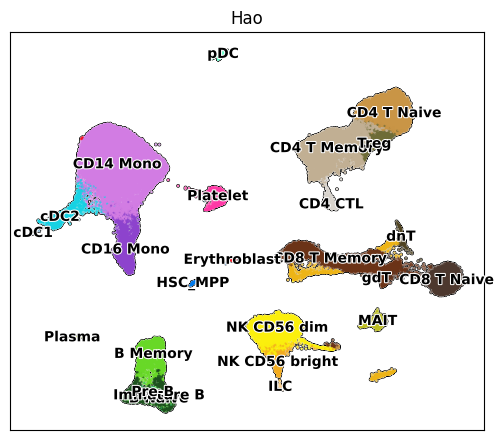

In [84]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import rc_context
import scanpy as sc

# --- Config ---
label_key = 'Consensus_annotation_detailed_final'
basis_key = 'X_wnn.umap'
color_key = f'{label_key}_colors'

# Your custom palette (label -> hex)
custom_palette = {
    'B Memory': "#68D827",
    'B Naive': '#1C511D',
    'CD14 Mono': "#D27CE3",
    'CD16 Mono': "#8D43CD",
    'CD4 T Memory': "#C1AF93",
    'CD4 T Naive': "#C99546",
    'CD8 T Memory': "#6B3317",
    'CD8 T Naive': "#4D382E",
    'ErP': "#D1235A",
    'Erythroblast': "#F30A1A",
    'GMP': "#C5E4FF",
    'HSC_MPP': '#0079ea',
    'Immature B': "#91FF7B",
    'LMPP': "#17BECF",
    'MAIT': "#BCBD22",
    'Myeloid progenitor': "#AEC7E8",
    'NK CD56 bright': "#F3AC1F",
    'NK CD56 dim': "#FBEF0D",
    'Plasma': "#9DC012",
    'Pro-B': "#66BB6A",
    'Small': "#292929",
    'cDC1': "#76A7CB",
    'cDC2': "#16D2E3",
    'gdT': "#EDB416",
    'pDC': "#69FFCB",
    'CD4 CTL': "#D7D2CB",
    'MEP': "#E364B0",
    'Pre-B': "#2DBD67",
    'Pre-Pro-B': '#92AC8E',
    'EoBaMaP': "#728245",
    'MkP': "#69424D",
    'Stroma': "#727272",
    'Macrophage': "#5F4761",
    'ILC': "#F7CF94",
    'dnT': "#504423",
    'Treg': "#6E6C37",
    'Platelet': "#FF39A6",
}

# --- Ensure categorical dtype ---
if not pd.api.types.is_categorical_dtype(Hao_dataset_Train.obs[label_key]):
    Hao_dataset_Train.obs[label_key] = Hao_dataset_Train.obs[label_key].astype('category')

cats = list(Hao_dataset_Train.obs[label_key].cat.categories)

# --- Sanity checks: missing/extra labels ---
labels_in_palette = set(custom_palette.keys())
labels_in_data = set(cats)

missing_in_palette = [c for c in cats if c not in labels_in_palette]
extra_in_palette   = [c for c in custom_palette.keys() if c not in labels_in_data]

if missing_in_palette:
    print("[WARN] Missing colors for:", missing_in_palette, "-> will use light grey (#cccccc).")
if extra_in_palette:
    print("[INFO] Palette has unused entries:", extra_in_palette)

# --- Build palette list in *category order* ---
fallback = '#cccccc'
palette_list = [custom_palette.get(c, fallback) for c in cats]

# --- Save onto .uns so Scanpy uses it consistently elsewhere ---
Hao_dataset_Train.uns[color_key] = palette_list

# --- Plot with Scanpy using built-in outlines (no clustering) ---
with rc_context({"figure.figsize": (5.2, 4.5)}):
    sc.pl.embedding(
        Hao_dataset_Train,
        basis=basis_key,
        color=label_key,
        palette=palette_list,
        legend_loc='on data',
        legend_fontsize=10,
        legend_fontoutline=1.5,
        size=10,
        add_outline=True,   # built-in group outlines
        frameon=True,
        title='Hao',
        show=False,
    )
    ax = plt.gca()
    ax.set_xlabel('')
    ax.set_ylabel('')
    plt.tight_layout()
    plt.show()


In [85]:
Hao_dataset_Train.X = ep.Normalise_protein_data(Hao_dataset_Train.X)
Hao_dataset_Test.X = ep.Normalise_protein_data(Hao_dataset_Test.X)
Hao_dataset_Cal.X = ep.Normalise_protein_data(Hao_dataset_Cal.X)

Fitting GMMs:   0%|          | 0/116033 [00:00<?, ?it/s]

[Normalise_protein_data] Applied MissionBio NSP normalization


Fitting GMMs:   0%|          | 0/32231 [00:00<?, ?it/s]

[Normalise_protein_data] Applied MissionBio NSP normalization


Fitting GMMs:   0%|          | 0/12894 [00:00<?, ?it/s]

[Normalise_protein_data] Applied MissionBio NSP normalization


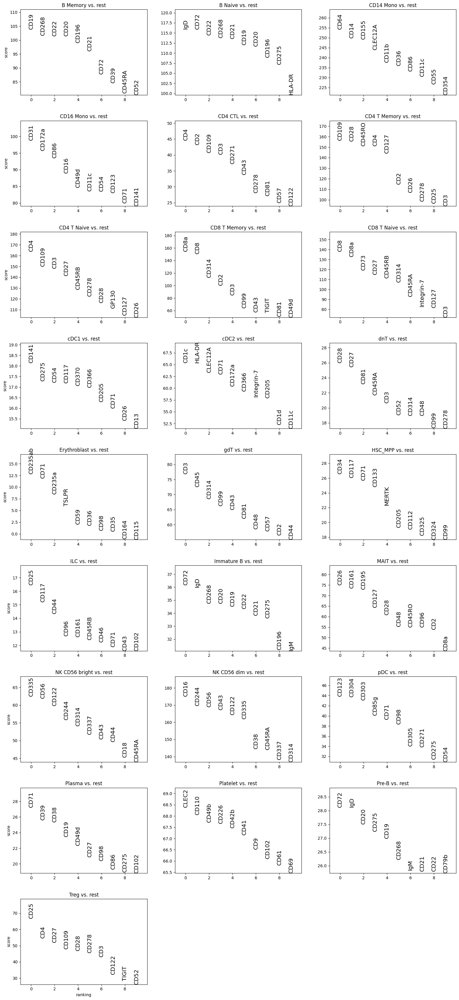

In [86]:
sc.tl.rank_genes_groups(Hao_dataset_Train, 'Consensus_annotation_detailed_final', method='wilcoxon')
sc.pl.rank_genes_groups(Hao_dataset_Train, n_genes=10, sharey=False, ncols = 3, fontsize = 14)

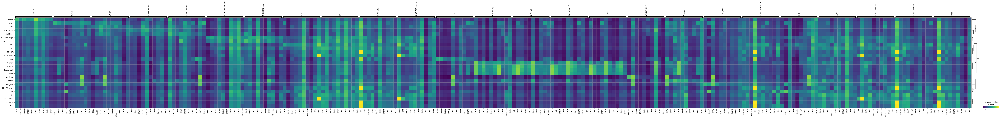

In [87]:
sc.pl.rank_genes_groups_matrixplot(Hao_dataset_Train)

In [88]:
Hao_dataset_Train

AnnData object with n_obs × n_vars = 116033 × 208
    obs: 'nCount_ADT', 'nFeature_ADT', 'nCount_RNA', 'nFeature_RNA', 'orig.ident', 'lane', 'donor', 'time', 'celltype.l1', 'celltype.l2', 'celltype.l3', 'Phase', 'nCount_SCT', 'nFeature_SCT', 'Batch', 'Consensus_annotation_detailed', 'Consensus_annotation_broad', 'Consensus_annotation_simplified', 'silhouette_score', 'Consensus_annotation_detailed_refined', 'silhouette_score_corrected', 'reassignment_status', 'Consensus_annotation_broad_final', 'Consensus_annotation_simplified_final', 'Consensus_annotation_detailed_final'
    var: 'name'
    uns: 'Consensus_annotation_detailed_final_colors', 'rank_genes_groups', 'dendrogram_Consensus_annotation_detailed_final'
    obsm: 'X_apca', 'X_aumap', 'X_pca', 'X_spca', 'X_umap', 'X_wnn.umap'

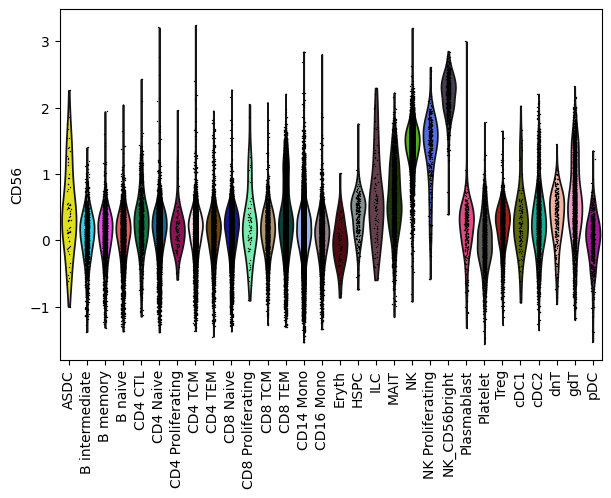

In [89]:
sc.pl.violin(Hao_dataset_Train, keys='CD56', groupby='celltype.l2', rotation=90, use_raw=False)

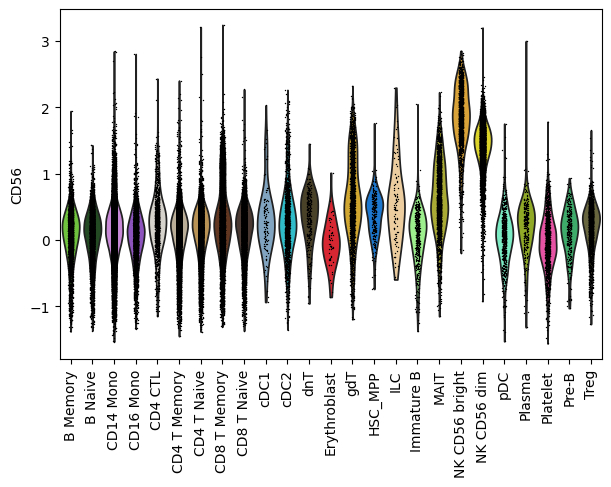

In [90]:
sc.pl.violin(Hao_dataset_Train, keys='CD56', groupby='Consensus_annotation_detailed_final', rotation=90, use_raw=False)

### ML pre-processing

In [91]:
Hao_data_Train = pd.DataFrame(Hao_dataset_Train.X, index=Hao_dataset_Train.obs_names, columns=Hao_dataset_Train.var_names)
Hao_data_Test = pd.DataFrame(Hao_dataset_Test.X, index=Hao_dataset_Test.obs_names, columns=Hao_dataset_Test.var_names)
Hao_data_Cal = pd.DataFrame(Hao_dataset_Cal.X, index=Hao_dataset_Cal.obs_names, columns=Hao_dataset_Cal.var_names)

In [92]:
# Assuming these are the columns to be dropped
columns_to_drop = ["IgD","IgM", "Rag-IgG2c"]
Hao_data_Train = Hao_data_Train.drop(columns=columns_to_drop, errors='ignore')
Hao_data_Test = Hao_data_Test.drop(columns=columns_to_drop, errors='ignore')
Hao_data_Cal = Hao_data_Cal.drop(columns=columns_to_drop, errors='ignore')

## Loading Zhang X. et al. (2024) dataset

In [93]:
Zhang_dataset_Train = sc.read_h5ad(data_path + "/References/Zhang" + "/Zhang_adata_annotated_Train.h5ad")
Zhang_dataset_Test = sc.read_h5ad(data_path + "/References/Zhang" + "/Zhang_adata_annotated_Test.h5ad")
Zhang_dataset_Cal = sc.read_h5ad(data_path + "/References/Zhang" + "/Zhang_adata_annotated_Cal.h5ad")

### Dataset Description

In [94]:
Zhang_dataset_Train

AnnData object with n_obs × n_vars = 51420 × 142
    obs: 'sample', 'ancestry', 'sex', 'age', 'capture', 'Level 1', 'Level 2', 'Level 3 Multimodal', 'Level 3 RNA', 'confidence', 'tfidf1', 'Donor', 'Batch', 'Consensus_annotation_detailed', 'Consensus_annotation_broad', 'Consensus_annotation_simplified', 'silhouette_score', 'Consensus_annotation_detailed_refined', 'silhouette_score_corrected', 'reassignment_status', 'Consensus_annotation_broad_final', 'Consensus_annotation_simplified_final', 'Consensus_annotation_detailed_final', 'nCount_ADT', 'nFeature_ADT'
    var: 'name'
    obsm: 'X_umap', 'X_umap.titration'

[INFO] Palette has unused entries: ['LMPP', 'Small', 'gdT', 'CD4 CTL', 'ILC', 'dnT']


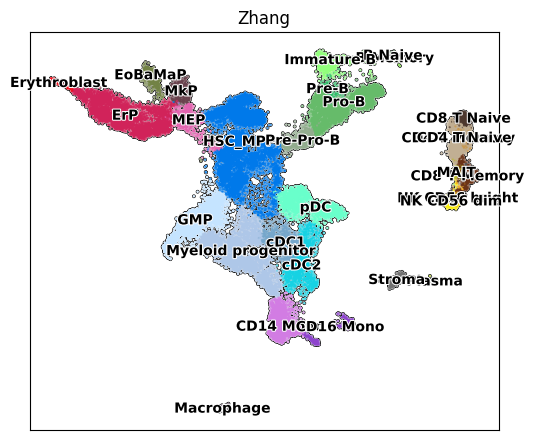

In [95]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import rc_context
import scanpy as sc

# --- Config ---
label_key = 'Consensus_annotation_detailed_final'
basis_key = 'X_umap'
color_key = f'{label_key}_colors'

# Your custom palette (label -> hex)
custom_palette = {
    'B Memory': "#68D827",
    'B Naive': '#1C511D',
    'CD14 Mono': "#D27CE3",
    'CD16 Mono': "#8D43CD",
    'CD4 T Memory': "#C1AF93",
    'CD4 T Naive': "#C99546",
    'CD8 T Memory': "#6B3317",
    'CD8 T Naive': "#4D382E",
    'ErP': "#D1235A",
    'Erythroblast': "#F30A1A",
    'GMP': "#C5E4FF",
    'HSC_MPP': '#0079ea',
    'Immature B': "#91FF7B",
    'LMPP': "#17BECF",
    'MAIT': "#BCBD22",
    'Myeloid progenitor': "#AEC7E8",
    'NK CD56 bright': "#F3AC1F",
    'NK CD56 dim': "#FBEF0D",
    'Plasma': "#9DC012",
    'Pro-B': "#66BB6A",
    'Small': "#292929",
    'cDC1': "#76A7CB",
    'cDC2': "#16D2E3",
    'gdT': "#EDB416",
    'pDC': "#69FFCB",
    'CD4 CTL': "#D7D2CB",
    'MEP': "#E364B0",
    'Pre-B': "#2DBD67",
    'Pre-Pro-B': '#92AC8E',
    'EoBaMaP': "#728245",
    'MkP': "#69424D",
    'Stroma': "#727272",
    'Macrophage': "#5F4761",
    'ILC': "#F7CF94",
    'dnT': "#504423",
}

# --- Ensure categorical dtype ---
if not pd.api.types.is_categorical_dtype(Zhang_dataset_Train.obs[label_key]):
    Zhang_dataset_Train.obs[label_key] = Zhang_dataset_Train.obs[label_key].astype('category')

cats = list(Zhang_dataset_Train.obs[label_key].cat.categories)

# --- Sanity checks: missing/extra labels ---
labels_in_palette = set(custom_palette.keys())
labels_in_data = set(cats)

missing_in_palette = [c for c in cats if c not in labels_in_palette]
extra_in_palette   = [c for c in custom_palette.keys() if c not in labels_in_data]

if missing_in_palette:
    print("[WARN] Missing colors for:", missing_in_palette, "-> will use light grey (#cccccc).")
if extra_in_palette:
    print("[INFO] Palette has unused entries:", extra_in_palette)

# --- Build palette list in *category order* ---
fallback = '#cccccc'
palette_list = [custom_palette.get(c, fallback) for c in cats]

# --- Save onto .uns so Scanpy uses it consistently elsewhere ---
Zhang_dataset_Train.uns[color_key] = palette_list

# --- Plot with Scanpy using built-in outlines (no clustering) ---
with rc_context({"figure.figsize": (5.5, 4.5)}):
    sc.pl.embedding(
        Zhang_dataset_Train,
        basis=basis_key,
        color=label_key,
        palette=palette_list,
        legend_loc='on data',
        legend_fontsize=10,
        legend_fontoutline=1.5,
        size=10,
        add_outline=True,   # built-in group outlines
        frameon=True,
        title='Zhang',
        show=False,
    )
    ax = plt.gca()
    ax.set_xlabel('')
    ax.set_ylabel('')
    plt.tight_layout()
    plt.show()


In [96]:
Zhang_dataset_Train.X = ep.Normalise_protein_data(Zhang_dataset_Train.X)
Zhang_dataset_Test.X = ep.Normalise_protein_data(Zhang_dataset_Test.X)
Zhang_dataset_Cal.X = ep.Normalise_protein_data(Zhang_dataset_Cal.X)

Fitting GMMs:   0%|          | 0/51420 [00:00<?, ?it/s]

[Normalise_protein_data] Applied MissionBio NSP normalization


Fitting GMMs:   0%|          | 0/14282 [00:00<?, ?it/s]

[Normalise_protein_data] Applied MissionBio NSP normalization


Fitting GMMs:   0%|          | 0/5716 [00:00<?, ?it/s]

[Normalise_protein_data] Applied MissionBio NSP normalization


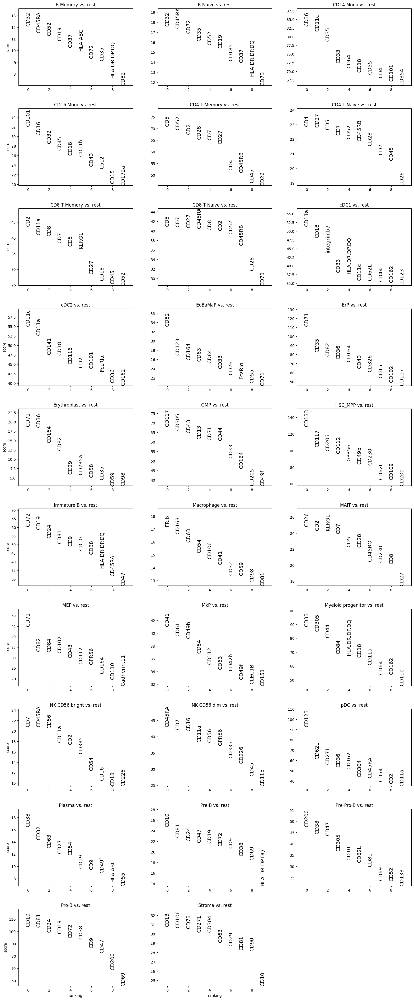

In [97]:
sc.tl.rank_genes_groups(Zhang_dataset_Train, 'Consensus_annotation_detailed_final', method='wilcoxon')
sc.pl.rank_genes_groups(Zhang_dataset_Train, n_genes=10, sharey=False, ncols = 3, fontsize = 14)

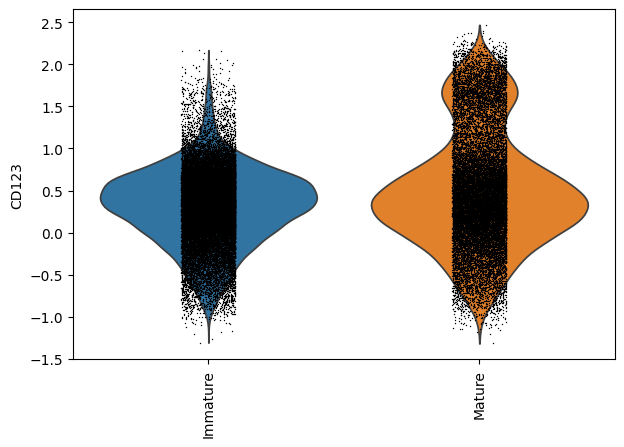

In [98]:
sc.pl.violin(Zhang_dataset_Train, keys='CD123', groupby='Consensus_annotation_broad_final', rotation=90, use_raw=False)

### ML pre-processing

In [99]:
Zhang_data_Train = pd.DataFrame(Zhang_dataset_Train.X, index=Zhang_dataset_Train.obs_names, columns=Zhang_dataset_Train.var_names)
Zhang_data_Test = pd.DataFrame(Zhang_dataset_Test.X, index=Zhang_dataset_Test.obs_names, columns=Zhang_dataset_Test.var_names)
Zhang_data_Cal = pd.DataFrame(Zhang_dataset_Cal.X, index=Zhang_dataset_Cal.obs_names, columns=Zhang_dataset_Cal.var_names)

In [100]:
# Assuming these are the columns to be dropped
columns_to_drop = ["IgG.Fc", "Isotype_G0114F7", "Isotype_HTK888",
                   "Isotype_MOPC.173", "Isotype_MOPC.21", "Isotype_MPC.11",
                   "Isotype_RTK2071", "Isotype_RTK2758", "Isotype_RTK4174",
                   "Isotype_RTK4530"]
Zhang_data_Train = Zhang_data_Train.drop(columns=columns_to_drop, errors='ignore')
Zhang_data_Test = Zhang_data_Test.drop(columns=columns_to_drop, errors='ignore')
Zhang_data_Cal = Zhang_data_Cal.drop(columns=columns_to_drop, errors='ignore')

## Loading Triana S. et al. (2021) dataset

In [101]:
Triana_dataset_Train = sc.read_h5ad(data_path + "/References/Triana" + "/97AB_young_and_old_adult_healthy_donor_BMMNCs_annotated_Train.h5ad")
Triana_dataset_Test = sc.read_h5ad(data_path + "/References/Triana" + "/97AB_young_and_old_adult_healthy_donor_BMMNCs_annotated_Test.h5ad")
Triana_dataset_Cal = sc.read_h5ad(data_path + "/References/Triana" + "/97AB_young_and_old_adult_healthy_donor_BMMNCs_annotated_Cal.h5ad")

### Dataset Description

In [102]:
Triana_dataset_Train

AnnData object with n_obs × n_vars = 35305 × 97
    obs: 'nCount_RNA', 'nFeature_RNA', 'nCount_AB', 'nFeature_AB', 'nCount_BOTH', 'nFeature_BOTH', 'Batch', 'ClusterID', 'BOTH_snn_res.2.5', 'class', 'CD34plus', 'CD3plus', 'CD5plus', 'Cd3Cd5', 'TNKcell', 'Bcell', 'CellTypes', 'cDC', 'B.cells', 'Myelocytes', 'Erythroid', 'Megakaryocte', 'Consensus_annotation_detailed', 'Consensus_annotation_broad', 'Consensus_annotation_simplified', 'Consensus_annotation_broad_tmp', 'Consensus_annotation_simplified_tmp', 'Consensus_annotation_detailed_tmp', 'silhouette_score', 'Consensus_annotation_detailed_refined', 'silhouette_score_corrected', 'reassignment_status', 'Consensus_annotation_broad_final', 'Consensus_annotation_simplified_final', 'Consensus_annotation_detailed_final'
    var: 'name'
    obsm: 'X_mofa', 'X_mofatsne', 'X_mofaumap', 'X_pca', 'X_projected', 'X_projectedmean', 'X_tsne', 'X_tsneni', 'X_umap', 'X_umapni'

[INFO] Palette has unused entries: ['LMPP', 'Small', 'Stroma', 'Macrophage', 'ILC', 'dnT', 'Platelet']


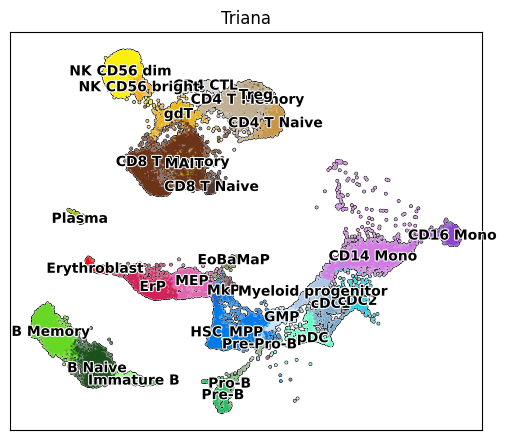

In [103]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import rc_context
import scanpy as sc

# --- Config ---
label_key = 'Consensus_annotation_detailed_final'
basis_key = 'X_mofaumap'
color_key = f'{label_key}_colors'

# Your custom palette (label -> hex)
custom_palette = {
    'B Memory': "#68D827",
    'B Naive': '#1C511D',
    'CD14 Mono': "#D27CE3",
    'CD16 Mono': "#8D43CD",
    'CD4 T Memory': "#C1AF93",
    'CD4 T Naive': "#C99546",
    'CD8 T Memory': "#6B3317",
    'CD8 T Naive': "#4D382E",
    'ErP': "#D1235A",
    'Erythroblast': "#F30A1A",
    'GMP': "#C5E4FF",
    'HSC_MPP': '#0079ea',
    'Immature B': "#91FF7B",
    'LMPP': "#17BECF",
    'MAIT': "#BCBD22",
    'Myeloid progenitor': "#AEC7E8",
    'NK CD56 bright': "#F3AC1F",
    'NK CD56 dim': "#FBEF0D",
    'Plasma': "#9DC012",
    'Pro-B': "#66BB6A",
    'Small': "#292929",
    'cDC1': "#76A7CB",
    'cDC2': "#16D2E3",
    'gdT': "#EDB416",
    'pDC': "#69FFCB",
    'CD4 CTL': "#D7D2CB",
    'MEP': "#E364B0",
    'Pre-B': "#2DBD67",
    'Pre-Pro-B': '#92AC8E',
    'EoBaMaP': "#728245",
    'MkP': "#69424D",
    'Stroma': "#727272",
    'Macrophage': "#5F4761",
    'ILC': "#F7CF94",
    'dnT': "#504423",
    'Treg': "#6E6C37",
    'Platelet': "#FF39A6",
}

# --- Ensure categorical dtype ---
if not pd.api.types.is_categorical_dtype(Triana_dataset_Train.obs[label_key]):
    Triana_dataset_Train.obs[label_key] = Triana_dataset_Train.obs[label_key].astype('category')

cats = list(Triana_dataset_Train.obs[label_key].cat.categories)

# --- Sanity checks: missing/extra labels ---
labels_in_palette = set(custom_palette.keys())
labels_in_data = set(cats)

missing_in_palette = [c for c in cats if c not in labels_in_palette]
extra_in_palette   = [c for c in custom_palette.keys() if c not in labels_in_data]

if missing_in_palette:
    print("[WARN] Missing colors for:", missing_in_palette, "-> will use light grey (#cccccc).")
if extra_in_palette:
    print("[INFO] Palette has unused entries:", extra_in_palette)

# --- Build palette list in *category order* ---
fallback = '#cccccc'
palette_list = [custom_palette.get(c, fallback) for c in cats]

# --- Save onto .uns so Scanpy uses it consistently elsewhere ---
Triana_dataset_Train.uns[color_key] = palette_list

# --- Plot with Scanpy using built-in outlines (no clustering) ---
with rc_context({"figure.figsize": (5.25, 4.5)}):
    sc.pl.embedding(
        Triana_dataset_Train,
        basis=basis_key,
        color=label_key,
        palette=palette_list,
        legend_loc='on data',
        legend_fontsize=10,
        legend_fontoutline=1.5,
        size=10,
        add_outline=True,   # built-in group outlines
        frameon=True,
        title='Triana',
        show=False,
    )
    ax = plt.gca()
    ax.set_xlabel('')
    ax.set_ylabel('')
    plt.tight_layout()
    plt.show()


In [104]:
Triana_dataset_Train.X = ep.Normalise_protein_data(Triana_dataset_Train.X)
Triana_dataset_Test.X = ep.Normalise_protein_data(Triana_dataset_Test.X)
Triana_dataset_Cal.X = ep.Normalise_protein_data(Triana_dataset_Cal.X)

Fitting GMMs:   0%|          | 0/35305 [00:00<?, ?it/s]

[Normalise_protein_data] Applied MissionBio NSP normalization


Fitting GMMs:   0%|          | 0/9804 [00:00<?, ?it/s]

[Normalise_protein_data] Applied MissionBio NSP normalization


Fitting GMMs:   0%|          | 0/3926 [00:00<?, ?it/s]

[Normalise_protein_data] Applied MissionBio NSP normalization


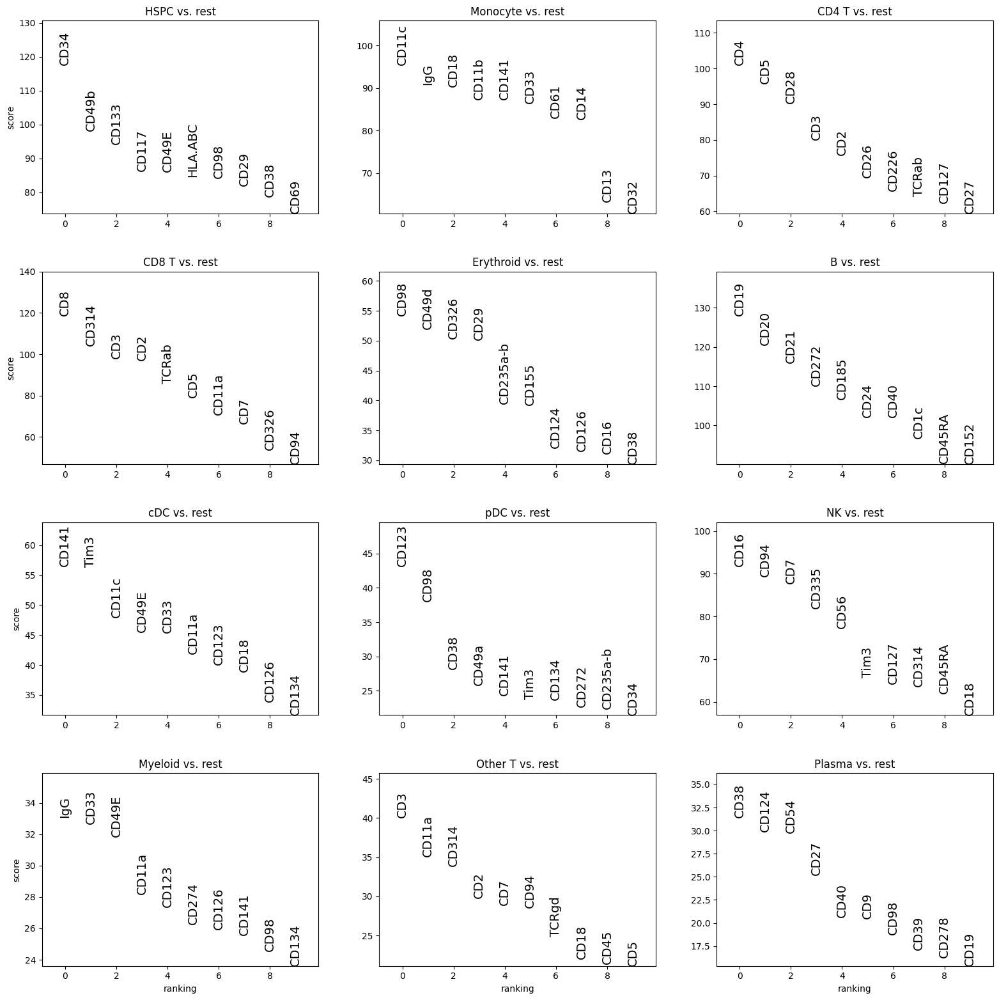

In [105]:
sc.tl.rank_genes_groups(Triana_dataset_Train, 'Consensus_annotation_simplified_final', method='wilcoxon')
sc.pl.rank_genes_groups(Triana_dataset_Train, n_genes=10, sharey=False, ncols = 3, fontsize = 14)

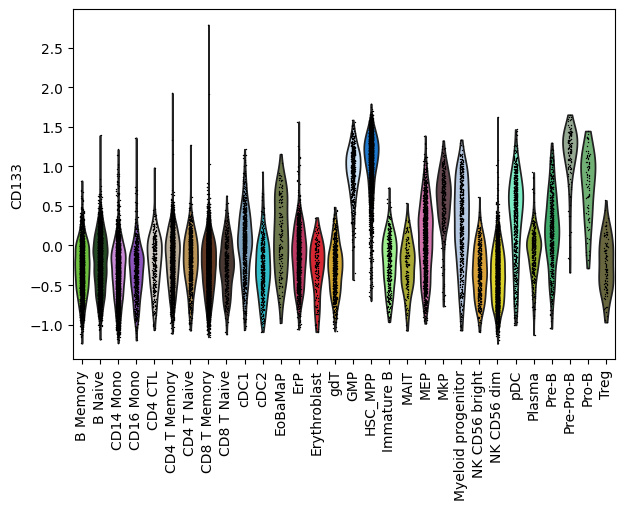

In [106]:
sc.pl.violin(Triana_dataset_Train, keys='CD133', groupby='Consensus_annotation_detailed_final', rotation=90, use_raw=False)

### ML pre-processing

In [107]:
Triana_data_Train = pd.DataFrame(Triana_dataset_Train.X, index=Triana_dataset_Train.obs_names, columns=Triana_dataset_Train.var_names)
Triana_data_Test = pd.DataFrame(Triana_dataset_Test.X, index=Triana_dataset_Test.obs_names, columns=Triana_dataset_Test.var_names)
Triana_data_Cal = pd.DataFrame(Triana_dataset_Cal.X, index=Triana_dataset_Cal.obs_names, columns=Triana_dataset_Cal.var_names)

In [108]:
# Assuming these are the columns to be dropped
columns_to_drop = ["IgG", "IgD"]
Triana_data_Train = Triana_data_Train.drop(columns=columns_to_drop, errors='ignore')
Triana_data_Test = Triana_data_Test.drop(columns=columns_to_drop, errors='ignore')
Triana_data_Cal = Triana_data_Cal.drop(columns=columns_to_drop, errors='ignore')

## Loading Luecken M.D. et al. (2021) dataset

In [109]:
Luecken_dataset_Train = sc.read_h5ad(data_path + "/References/Luecken" + "/140AB_adult_healthy_donor_BMMNCs_annotated_Train.h5ad")
Luecken_dataset_Test = sc.read_h5ad(data_path + "/References/Luecken" + "/140AB_adult_healthy_donor_BMMNCs_annotated_Test.h5ad")
Luecken_dataset_Cal = sc.read_h5ad(data_path + "/References/Luecken" + "/140AB_adult_healthy_donor_BMMNCs_annotated_Cal.h5ad")

### Dataset Description

In [110]:
Luecken_dataset_Train

AnnData object with n_obs × n_vars = 64935 × 134
    obs: 'GEX_nFeaturess_RNA_by_counts', 'GEX_pct_counts_mt', 'GEX_size_factors', 'GEX_phase', 'ADT_n_antibodies_by_counts', 'ADT_total_counts', 'ADT_iso_count', 'cell_type', 'batch', 'ADT_pseudotime_order', 'GEX_pseudotime_order', 'Samplename', 'Site', 'DonorNumber', 'VendorLot', 'DonorID', 'DonorAge', 'DonorBMI', 'DonorBloodType', 'DonorRace', 'Ethnicity', 'DonorGender', 'QCMeds', 'DonorSmoker', 'is_train', 'Batch', 'Consensus_annotation_detailed', 'Consensus_annotation_broad', 'Consensus_annotation_simplified', 'silhouette_score', 'Consensus_annotation_detailed_refined', 'silhouette_score_corrected', 'reassignment_status', 'Consensus_annotation_broad_final', 'Consensus_annotation_simplified_final', 'Consensus_annotation_detailed_final', 'nCount_ADT', 'nFeature_ADT'
    var: 'gene_id'
    obsm: 'X_adt_isotype_controls', 'X_adt_pca', 'X_adt_umap', 'X_gex_pca', 'X_gex_umap', 'X_pcahm', 'X_umap'

[INFO] Palette has unused entries: ['GMP', 'LMPP', 'Pro-B', 'Small', 'cDC1', 'MEP', 'Pre-Pro-B', 'EoBaMaP', 'MkP', 'Stroma', 'Macrophage', 'ILC', 'dnT', 'Platelet']


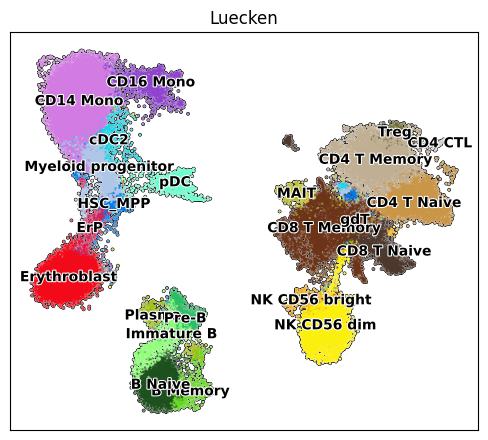

In [111]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import rc_context
import scanpy as sc

# --- Config ---
label_key = 'Consensus_annotation_detailed_final'
basis_key = 'X_umap'
color_key = f'{label_key}_colors'

# Your custom palette (label -> hex)
custom_palette = {
    'B Memory': "#68D827",
    'B Naive': '#1C511D',
    'CD14 Mono': "#D27CE3",
    'CD16 Mono': "#8D43CD",
    'CD4 T Memory': "#C1AF93",
    'CD4 T Naive': "#C99546",
    'CD8 T Memory': "#6B3317",
    'CD8 T Naive': "#4D382E",
    'ErP': "#D1235A",
    'Erythroblast': "#F30A1A",
    'GMP': "#C5E4FF",
    'HSC_MPP': '#0079ea',
    'Immature B': "#91FF7B",
    'LMPP': "#17BECF",
    'MAIT': "#BCBD22",
    'Myeloid progenitor': "#AEC7E8",
    'NK CD56 bright': "#F3AC1F",
    'NK CD56 dim': "#FBEF0D",
    'Plasma': "#9DC012",
    'Pro-B': "#66BB6A",
    'Small': "#292929",
    'cDC1': "#76A7CB",
    'cDC2': "#16D2E3",
    'gdT': "#EDB416",
    'pDC': "#69FFCB",
    'CD4 CTL': "#D7D2CB",
    'MEP': "#E364B0",
    'Pre-B': "#2DBD67",
    'Pre-Pro-B': '#92AC8E',
    'EoBaMaP': "#728245",
    'MkP': "#69424D",
    'Stroma': "#727272",
    'Macrophage': "#5F4761",
    'ILC': "#F7CF94",
    'dnT': "#504423",
    'Treg': "#6E6C37",
    'Platelet': "#FF39A6",
}

# --- Ensure categorical dtype ---
if not pd.api.types.is_categorical_dtype(Luecken_dataset_Train.obs[label_key]):
    Luecken_dataset_Train.obs[label_key] = Luecken_dataset_Train.obs[label_key].astype('category')

cats = list(Luecken_dataset_Train.obs[label_key].cat.categories)

# --- Sanity checks: missing/extra labels ---
labels_in_palette = set(custom_palette.keys())
labels_in_data = set(cats)

missing_in_palette = [c for c in cats if c not in labels_in_palette]
extra_in_palette   = [c for c in custom_palette.keys() if c not in labels_in_data]

if missing_in_palette:
    print("[WARN] Missing colors for:", missing_in_palette, "-> will use light grey (#cccccc).")
if extra_in_palette:
    print("[INFO] Palette has unused entries:", extra_in_palette)

# --- Build palette list in *category order* ---
fallback = '#cccccc'
palette_list = [custom_palette.get(c, fallback) for c in cats]

# --- Save onto .uns so Scanpy uses it consistently elsewhere ---
Luecken_dataset_Train.uns[color_key] = palette_list

# --- Plot with Scanpy using built-in outlines (no clustering) ---
with rc_context({"figure.figsize": (5, 4.5)}):
    sc.pl.embedding(
        Luecken_dataset_Train,
        basis=basis_key,
        color=label_key,
        palette=palette_list,
        legend_loc='on data',
        legend_fontsize=10,
        legend_fontoutline=1.5,
        size=10,
        add_outline=True,   # built-in group outlines
        frameon=True,
        title='Luecken',
        show=False,
    )
    ax = plt.gca()
    ax.set_xlabel('')
    ax.set_ylabel('')
    plt.tight_layout()
    plt.show()


In [112]:
Luecken_dataset_Train.X = ep.Normalise_protein_data(Luecken_dataset_Train.X)
Luecken_dataset_Test.X = ep.Normalise_protein_data(Luecken_dataset_Test.X)
Luecken_dataset_Cal.X = ep.Normalise_protein_data(Luecken_dataset_Cal.X)

Fitting GMMs:   0%|          | 0/64935 [00:00<?, ?it/s]

[Normalise_protein_data] Applied MissionBio NSP normalization


Fitting GMMs:   0%|          | 0/18036 [00:00<?, ?it/s]

[Normalise_protein_data] Applied MissionBio NSP normalization


Fitting GMMs:   0%|          | 0/7216 [00:00<?, ?it/s]

[Normalise_protein_data] Applied MissionBio NSP normalization


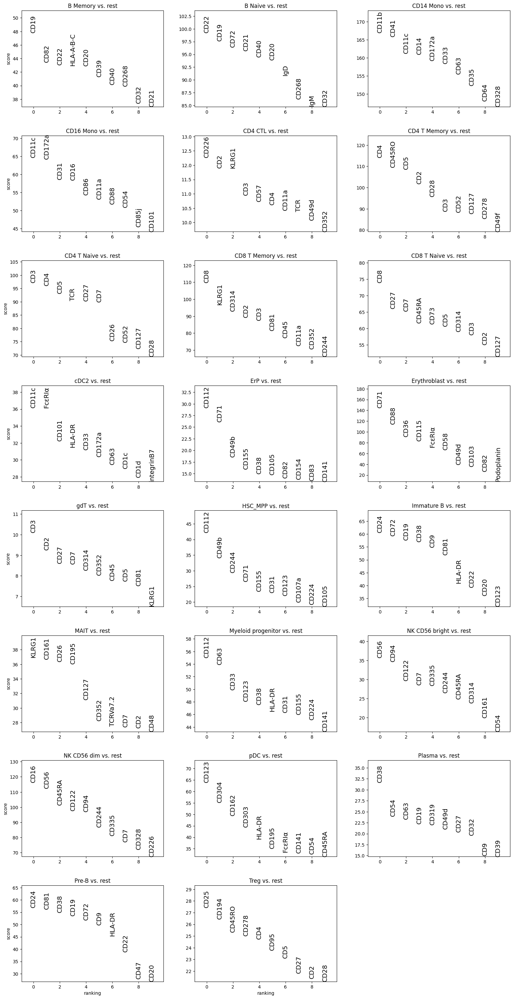

In [113]:
sc.tl.rank_genes_groups(Luecken_dataset_Train, 'Consensus_annotation_detailed_final', method='wilcoxon')
sc.pl.rank_genes_groups(Luecken_dataset_Train, n_genes=10, sharey=False, ncols = 3, fontsize = 14)

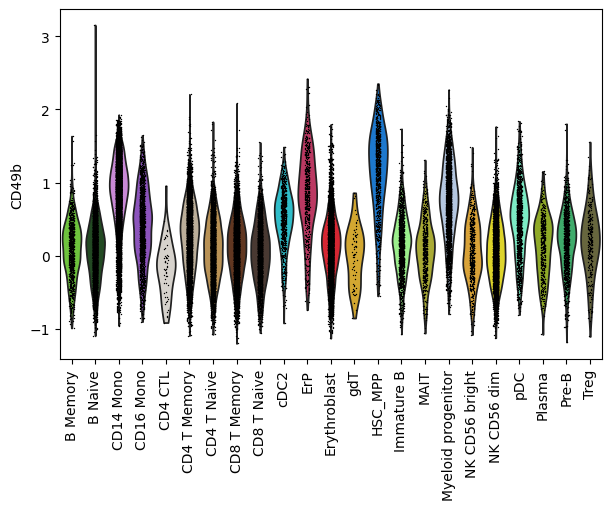

In [114]:
sc.pl.violin(Luecken_dataset_Train, keys='CD49b', groupby='Consensus_annotation_detailed_final', rotation=90, use_raw=False)

### ML pre-processing

In [115]:
Luecken_data_Train = pd.DataFrame(Luecken_dataset_Train.X, index=Luecken_dataset_Train.obs_names, columns=Luecken_dataset_Train.var_names)
Luecken_data_Test = pd.DataFrame(Luecken_dataset_Test.X, index=Luecken_dataset_Test.obs_names, columns=Luecken_dataset_Test.var_names)
Luecken_data_Cal = pd.DataFrame(Luecken_dataset_Cal.X, index=Luecken_dataset_Cal.obs_names, columns=Luecken_dataset_Cal.var_names)

In [116]:
# Assuming these are the columns to be dropped
columns_to_drop = ["IgG", "IgM", "IgD"]
Luecken_data_Train = Luecken_data_Train.drop(columns=columns_to_drop, errors='ignore')
Luecken_data_Test = Luecken_data_Test.drop(columns=columns_to_drop, errors='ignore')
Luecken_data_Cal = Luecken_data_Cal.drop(columns=columns_to_drop, errors='ignore')

# Loading antibodies panels

In [117]:
TotalSeqD_Heme_Oncology_CAT399906 = pd.read_csv(data_path + "/Antibodies_panels/TotalSeqD_Heme_Oncology_CAT399906.csv", index_col=0).index

# TotalSeqD Heme Oncology CAT399906 Models Training

In [118]:
data_path = data_path + '/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906'
os.makedirs(data_path, exist_ok=True)


## Hao Models

In [119]:
# Create the folders
os.makedirs(data_path + "/Hao", exist_ok=True)
os.makedirs(data_path + "/Hao/Models", exist_ok=True)

models_output = data_path + "/Hao"

### ML Training

In [120]:
Hao_Models = {}

#### Broad annotation

[map] matched 36/205 data columns to panel
[map] matched 36/205 data columns to panel
[map] matched 36/205 data columns to panel

[features] Using 36 panel-intersected features (exact panel names):
['HLA-DR', 'CD117', 'CD11b', 'CD11c', 'CD123', 'CD13', 'CD138', 'CD14', 'CD141', 'CD16', 'CD163', 'CD19', 'CD1c', 'CD2', 'CD22', 'CD25', 'CD3', 'CD30', 'CD303', 'CD304', 'CD34', 'CD38', 'CD4', 'CD44', 'CD45', 'CD45RA', 'CD45RO', 'CD49d', 'CD56', 'CD62P', 'CD64', 'CD69', 'CD71', 'CD8', 'CD83', 'CD90']

Processing Immature (class 1/2)...
Training - Found 472 / 472 barcodes
Training - Pos: 236, Neg: 236
Training labels: 236 pos, 236 neg
Testing  - Found 132 / 132 barcodes
Testing  - Pos: 66, Neg: 66
Testing labels: 66 pos, 66 neg
Calibrating - Found 12894 rows | Pos: 26, Neg: 12868
All test data: 32231 rows, positives for Immature: 66
[scale] Immature: train mean ~ -0.000, std ~ 1.000

[NB] training → Immature
Fitting 10 folds for each of 10 candidates, totalling 100 fits

[XGB] training → Imma

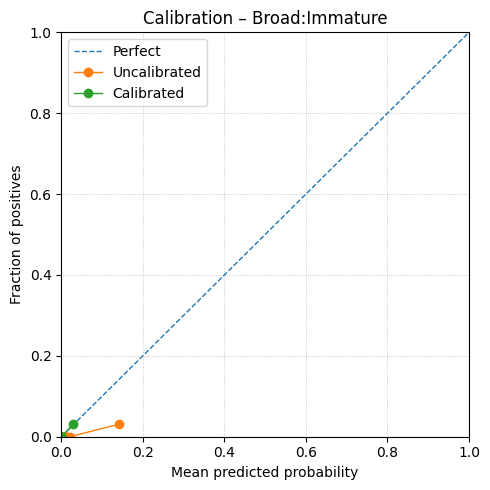

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Hao/Models/Broad_Immature/Broad_Immature_bundle.joblib

Immature
               precision    recall  f1-score   support

           0       0.99      1.00      0.99        66
           1       1.00      0.98      0.99        66

    accuracy                           0.99       132
   macro avg       0.99      0.99      0.99       132
weighted avg       0.99      0.99      0.99       132


Processing Mature (class 2/2)...
Training - Found 472 / 472 barcodes
Training - Pos: 236, Neg: 236
Training labels: 236 pos, 236 neg
Testing  - Found 132 / 132 barcodes
Testing  - Pos: 66, Neg: 66
Testing labels: 66 pos, 66 neg
Calibrating - Found 12894 rows | Pos: 12868, Neg: 26
All test data: 32231 rows, positives for Mature: 32165
[scale] Mature: train mean ~ -0.000, std ~ 1.000

[NB] training → Mature
Fitting 10 folds for each of 10 candidates, 

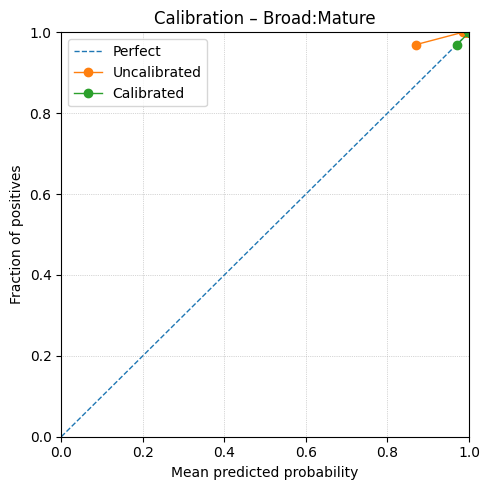

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Hao/Models/Broad_Mature/Broad_Mature_bundle.joblib

Mature
               precision    recall  f1-score   support

           0       1.00      0.98      0.99        66
           1       0.99      1.00      0.99        66

    accuracy                           0.99       132
   macro avg       0.99      0.99      0.99       132
weighted avg       0.99      0.99      0.99       132


Fitting multiclass TemperatureScaling on CAL split...

Preview of probabilities BEFORE (raw OvR) vs AFTER (multiclass TS):
                     raw_Immature  raw_Mature   mc_Immature  mc_Mature true_label  pred_raw  pred_mc pred_raw_name pred_mc_name
L1_AAACCCACAACTGGTT      0.000008    0.999990  2.140628e-10        1.0     Mature         1        1        Mature       Mature
L1_AAACCCACACGTACTA      0.000012    0.999989  2.408245e-10        1.0     Matur

In [121]:
# -*- coding: utf-8 -*-
from pathlib import Path
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.ensemble import StackingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.calibration import CalibratedClassifierCV
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report, confusion_matrix

from netcal.scaling import TemperatureScaling
import joblib

# ------------------------------------------------------------------- CONFIG (expects these to already exist)
#   models_output, train_barcodes_path, test_barcodes_path
#   Hao_data_Train, Hao_data_Test, Hao_data_Cal          (DataFrames indexed by barcode)
#   Hao_dataset_Train, Hao_dataset_Test, Hao_dataset_Cal (AnnData with obs labels)
#   TotalSeqD_Heme_Oncology_CAT399906                    (iterable of feature names)
#   MLTraining module with: CV, train_NB, train_XGB, train_KNN, train_MLP,
#                           plot_calibration_curve, save_models, evaluate_classifier, append_metrics_csv

name_target_class = "Broad"   # "Broad" | "Simplified" | "Detailed"
fig_root   = Path(models_output) / "Figures"
models_dir = Path(models_output) / "Models"
fig_root.mkdir(parents=True, exist_ok=True)
models_dir.mkdir(parents=True, exist_ok=True)

kf         = MLTraining.CV
num_cores  = -1
metrics_log = []

# ============================= HELPERS =============================

def _norm_feats(names) -> pd.Index:
    """
    Normalizer used ONLY to construct matching keys.
    Panel names remain untouched; data columns are normalized and then mapped BACK
    to the exact panel names via a lookup.
    """
    s = pd.Index(map(str, names))
    s = (s.str.strip()
           .str.lower()
           .str.replace(r"[ _/]+", "-", regex=True)
           .str.replace(r"-+", "-", regex=True)
           .str.strip("-"))
    return s

def attach_celltype(df: pd.DataFrame, ad: "AnnData", field: str) -> pd.DataFrame:
    if field not in ad.obs:
        raise KeyError(f"'{field}' not found in AnnData.obs")
    lab = (ad.obs[field]
             .astype("string")
             .str.strip()
             .str.replace(r"\s+", "_", regex=True))
    out = df.copy()
    out["Celltype"] = pd.Categorical(lab.reindex(out.index))
    if out["Celltype"].isna().any():
        missing = int(out["Celltype"].isna().sum())
        print(f"[WARN] {missing} rows got NaN Celltype after reindex; check barcode alignment.")
    return out

def _check_finite(df: pd.DataFrame, tag: str):
    arr = df.to_numpy()
    if not np.isfinite(arr).all():
        bad = np.where(~np.isfinite(arr))
        raise ValueError(f"Non-finite values found in {tag} features at positions {bad}")

def _unwrap_estimator(m):
    return getattr(m, "estimator", None) or getattr(m, "base_estimator", None) or m

def _assert_feature_counts(cell_name: str, models_dict: dict, expected: int):
    pairs = [
        ("NB",  models_dict.get("NB")),
        ("XGB", models_dict.get("XGB")),
        ("KNN", models_dict.get("KNN")),
        ("MLP", models_dict.get("MLP")),
        ("Stacker", models_dict.get("Stacker")),
    ]
    for name, est in pairs:
        if est is None:
            continue
        base = _unwrap_estimator(est)
        nfi = getattr(base, "n_features_in_", None)
        if nfi is not None and nfi != expected:
            raise RuntimeError(f"{cell_name}:{name} saw {nfi} features; expected {expected}")

# ============================= LABEL ATTACH =============================

consensus_field = f"Consensus_annotation_{name_target_class.lower()}_final"

Hao_data_Train = attach_celltype(Hao_data_Train, Hao_dataset_Train, consensus_field)
Hao_data_Test  = attach_celltype(Hao_data_Test,  Hao_dataset_Test,  consensus_field)
Hao_data_Cal   = attach_celltype(Hao_data_Cal,   Hao_dataset_Cal,   consensus_field)

# ============================= PANEL & DATA COLUMN ALIGNMENT =============================

# Keep the panel EXACTLY as provided
panel = pd.Index(map(str, TotalSeqD_Heme_Oncology_CAT399906))

# Build a mapping: normalized_key -> exact panel name
panel_keys    = _norm_feats(panel)
norm_to_panel = dict(zip(panel_keys, panel))
if len(norm_to_panel) != len(panel):
    raise ValueError("Panel contains names that collide after normalization. Consider adjusting _norm_feats rules.")

def _rename_data_to_panel(df: pd.DataFrame) -> pd.DataFrame:
    """
    Rename only feature columns so that after normalization they map
    back to the exact panel column names. Keeps 'cell_barcode' and 'Celltype' intact.
    """
    df = df.copy()
    non_feat = [c for c in ["cell_barcode", "Celltype"] if c in df.columns]
    feat     = pd.Index([c for c in df.columns if c not in non_feat])

    feat_keys   = _norm_feats(feat)
    mapped      = [norm_to_panel.get(k) for k in feat_keys]  # None if not in panel
    rename_map  = {old: new for old, new in zip(feat, mapped) if new is not None}

    # Handle duplicate mappings (two data columns → same panel col). Keep first, drop the rest.
    seen, safe_map, drops = set(), {}, []
    for old, new in rename_map.items():
        if new in seen:
            drops.append(old)
        else:
            seen.add(new); safe_map[old] = new

    if drops:
        print(f"[WARN] Dropping {len(drops)} duplicated-mapped columns (showing up to 5): {drops[:5]}")

    if drops:
        df.drop(columns=drops, inplace=True, errors="ignore")
    df.rename(columns=safe_map, inplace=True)

    matched = len(safe_map)
    print(f"[map] matched {matched}/{len(feat)} data columns to panel")
    return df

# Apply: normalize/rename ONLY data splits (panel remains untouched)
Hao_data_Train = _rename_data_to_panel(Hao_data_Train)
Hao_data_Test  = _rename_data_to_panel(Hao_data_Test)
Hao_data_Cal   = _rename_data_to_panel(Hao_data_Cal)

# Intersect each split with the panel IN PANEL ORDER
def _panel_intersection(df: pd.DataFrame) -> pd.DataFrame:
    non_feat = [c for c in ["cell_barcode", "Celltype"] if c in df.columns]
    feat_cols = pd.Index([c for c in df.columns if c not in non_feat])
    inter = panel.intersection(feat_cols, sort=False)
    if inter.empty:
        raise ValueError("Panel/Data intersection is empty after renaming. Check mapping rules.")
    return df.reindex(columns=list(inter) + non_feat)

Hao_data_Train = _panel_intersection(Hao_data_Train)
Hao_data_Test  = _panel_intersection(Hao_data_Test)
Hao_data_Cal   = _panel_intersection(Hao_data_Cal)

# ============================= FEATURES & LABELS =============================

Hao_data_Cal_lbl = Hao_data_Cal[["Celltype"]].copy()

drop_cols_train = [c for c in ["cell_barcode", "Celltype"] if c in Hao_data_Train.columns]
drop_cols_test  = [c for c in ["cell_barcode", "Celltype"] if c in Hao_data_Test.columns]
drop_cols_cal   = [c for c in ["cell_barcode", "Celltype"] if c in Hao_data_Cal.columns]

Hao_data_Train_Sub = Hao_data_Train.drop(columns=drop_cols_train, errors="ignore")
Hao_data_Test_Sub  = Hao_data_Test.drop(columns=drop_cols_test,  errors="ignore")
Hao_data_Cal_Sub   = Hao_data_Cal.drop(columns=drop_cols_cal,    errors="ignore")

# SAFETY: shared columns & finiteness checks
cols_train = list(Hao_data_Train_Sub.columns)
if list(Hao_data_Test_Sub.columns) != cols_train or list(Hao_data_Cal_Sub.columns) != cols_train:
    raise ValueError("Train/Cal/Test feature columns differ after panel intersection!")

_check_finite(Hao_data_Train_Sub, "TRAIN")
_check_finite(Hao_data_Test_Sub,  "TEST")
_check_finite(Hao_data_Cal_Sub,   "CAL")

print(f"\n[features] Using {len(cols_train)} panel-intersected features (exact panel names):")
print(cols_train)

# Consistent class order
class_names  = sorted(pd.Series(Hao_data_Train["Celltype"]).dropna().unique())
K            = len(class_names)
class_to_idx = {c: i for i, c in enumerate(class_names)}

# Multiclass labels arrays
s_cal = Hao_data_Cal_lbl["Celltype"].map(class_to_idx)
if s_cal.isna().any():
    missing = Hao_data_Cal_lbl.loc[s_cal.isna(), "Celltype"].unique()
    raise ValueError(f"Unknown labels in CAL split: {missing}")
y_cal_multiclass = s_cal.to_numpy(dtype=np.int64)

s_te = Hao_data_Test["Celltype"].map(class_to_idx)
if s_te.isna().any():
    missing = Hao_data_Test.loc[s_te.isna(), "Celltype"].unique()
    raise ValueError(f"Unknown labels in TEST split: {missing}")
y_test_multiclass = s_te.to_numpy(dtype=np.int64)

# Reuse across classes
X_cal_all_df = Hao_data_Cal_Sub.copy()
X_te_all_df  = Hao_data_Test_Sub.copy()

# Preallocate OvR prob mats
P_cal = np.zeros((X_cal_all_df.shape[0], K), dtype=float)
P_te  = np.zeros((X_te_all_df.shape[0],  K), dtype=float)

test_index = Hao_data_Test_Sub.index

# ============================= TRAIN PER-CLASS OVR =============================

for celltype in class_names:
    k = class_to_idx[celltype]
    name = str(celltype).replace(" ", "_")
    print(f"\nProcessing {name} (class {k+1}/{K})...")

    # ---- TRAIN slice via barcode lists
    train_barcodes_df = pd.read_csv(
        f"{train_barcodes_path}/Hao/Consensus_annotation_broad_final/Barcodes_training_class_{name}.csv",
        index_col=0
    )
    train_positive_barcodes = train_barcodes_df["Positive"].dropna().values
    train_negative_barcodes = train_barcodes_df["Negative"].dropna().values
    all_train_barcodes = np.concatenate([train_positive_barcodes, train_negative_barcodes])

    train_mask = Hao_data_Train_Sub.index.isin(all_train_barcodes)
    X_tr_df = Hao_data_Train_Sub.loc[train_mask]
    found_train_barcodes = X_tr_df.index.values
    y_tr = np.isin(found_train_barcodes, train_positive_barcodes).astype(int)

    # ---- Skip guards
    if X_tr_df.empty or np.unique(y_tr).size < 2:
        print(f"[SKIP] {name}: empty or single-class train slice (pos={y_tr.sum()}, neg={(len(y_tr)-y_tr.sum())}).")
        continue

    # ---- TEST slice via barcode lists
    test_barcodes_df = pd.read_csv(
        f"{test_barcodes_path}/Hao/Consensus_annotation_broad_final/Barcodes_testing_class_{name}.csv",
        index_col=0
    )
    test_positive_barcodes = test_barcodes_df["Positive"].dropna().values
    test_negative_barcodes = test_barcodes_df["Negative"].dropna().values
    all_test_barcodes = np.concatenate([test_positive_barcodes, test_negative_barcodes])

    test_mask = Hao_data_Test_Sub.index.isin(all_test_barcodes)
    X_te_df = Hao_data_Test_Sub.loc[test_mask]
    found_test_barcodes = X_te_df.index.values
    y_te = np.isin(found_test_barcodes, test_positive_barcodes).astype(int)

    # ---- Full-test & cal for this binary head
    X_te_all_local = X_te_all_df.copy()
    y_te_all = (Hao_data_Test["Celltype"].values == celltype).astype(int)
    X_cal_df = X_cal_all_df.copy()
    y_cal_bin = (Hao_data_Cal_lbl["Celltype"].values == celltype).astype(int)

    # ---- Info
    print(f"Training - Found {X_tr_df.shape[0]} / {len(all_train_barcodes)} barcodes")
    print(f"Training - Pos: {len(train_positive_barcodes)}, Neg: {len(train_negative_barcodes)}")
    print(f"Training labels: {y_tr.sum()} pos, {len(y_tr)-y_tr.sum()} neg")
    print(f"Testing  - Found {X_te_df.shape[0]} / {len(all_test_barcodes)} barcodes")
    print(f"Testing  - Pos: {len(test_positive_barcodes)}, Neg: {len(test_negative_barcodes)}")
    print(f"Testing labels: {y_te.sum()} pos, {len(y_te)-y_te.sum()} neg")
    print(f"Calibrating - Found {X_cal_df.shape[0]} rows | Pos: {y_cal_bin.sum()}, Neg: {len(y_cal_bin)-y_cal_bin.sum()}")
    print(f"All test data: {X_te_all_local.shape[0]} rows, positives for {celltype}: {y_te_all.sum()}")

    # ---- Scaling (fit on per-head TRAIN slice; transform others)
    scaler = StandardScaler(with_mean=True, with_std=True).fit(X_tr_df.values)

    def _sc(df):
        return pd.DataFrame(
            scaler.transform(df.values),
            index=df.index,
            columns=cols_train,
        )

    X_tr_sc_df     = _sc(X_tr_df)
    X_te_sc_df     = _sc(X_te_df)
    X_te_all_sc_df = _sc(X_te_all_local)
    X_cal_sc_df    = _sc(X_cal_df)

    print(f"[scale] {name}: train mean ~ {X_tr_sc_df.values.mean():.3f}, std ~ {X_tr_sc_df.values.std():.3f}")

    # ---- Base learners
    NB_model  = MLTraining.train_NB (X_tr_sc_df, y_tr, cv=kf, num_cores=num_cores, name_target_subclass=name)
    XGB_model = MLTraining.train_XGB(X_tr_sc_df, y_tr, cv=kf, num_cores=num_cores, name_target_subclass=name)
    KNN_model = MLTraining.train_KNN(X_tr_sc_df, y_tr, cv=kf, num_cores=num_cores, name_target_subclass=name)
    MLP_model = MLTraining.train_MLP(X_tr_sc_df, y_tr, cv=kf, num_cores=num_cores, name_target_subclass=name)

    # ---- Stacker (raw)
    stacker_raw = StackingClassifier(
        estimators=[("NB", NB_model), ("XGB", XGB_model), ("KNN", KNN_model), ("MLP", MLP_model)],
        final_estimator=LogisticRegression(max_iter=2000, class_weight="balanced", random_state=42),
        stack_method="predict_proba",
        cv=kf,
        n_jobs=-1,
    ).fit(X_tr_sc_df, y_tr)

    # ---- Feature count asserts (debug safety)
    expected_feats = len(cols_train)
    _assert_feature_counts(name, {
        "NB": NB_model, "XGB": XGB_model, "KNN": KNN_model, "MLP": MLP_model, "Stacker": stacker_raw
    }, expected_feats)

    # ---- Binary calibration (Platt, guarded)
    pos_cal    = int(y_cal_bin.sum())
    n_cal_bin  = int(len(y_cal_bin))
    has_both   = (0 < pos_cal < n_cal_bin)
    print(f"[CAL] {name}: cal positives={pos_cal}/{n_cal_bin}")

    if has_both:
        try:
            calibrator = CalibratedClassifierCV(estimator=stacker_raw, method="sigmoid", cv="prefit")
        except TypeError:  # older sklearn
            calibrator = CalibratedClassifierCV(base_estimator=stacker_raw, method="sigmoid", cv="prefit")
        stacker = calibrator.fit(X_cal_sc_df, y_cal_bin)
    else:
        print(f"[WARN] Skipping calibration for {name}: single-class cal set.")
        stacker = stacker_raw

    # ---- Calibration plot on all-test (optional)
    try:
        y_proba_uncal = stacker_raw.predict_proba(X_te_all_sc_df)[:, 1]
        y_proba_cal   = stacker.predict_proba(X_te_all_sc_df)[:, 1]
        if has_both:
            _ = MLTraining.plot_calibration_curve(
                y_te_all, [y_proba_uncal, y_proba_cal],
                clf_names=["Uncalibrated", "Calibrated"],
                n_bins=15, strategy="quantile",
                title=f"Calibration – {name_target_class}:{name}"
            )
        else:
            _ = MLTraining.plot_calibration_curve(
                y_te_all, [y_proba_uncal],
                clf_names=["Uncalibrated"],
                n_bins=15, strategy="quantile",
                title=f"Calibration (uncal only) – {name_target_class}:{name}"
            )
        plt.tight_layout()
        plt.show()
    except Exception as e:
        print(f"[WARN] Skipped calibration plot for {name}: {e}")

    # ---- Save per-class bundle (model + scaler + columns)
    save_subdir = models_dir / f"{name_target_class}_{name}"
    save_subdir.mkdir(parents=True, exist_ok=True)

    MLTraining.save_models({"Stacked": stacker}, out_dir=save_subdir, tag=f"{name_target_class}_{name}")
    joblib.dump(cols_train, save_subdir / "feature_names.joblib")

    bundle = {
        "atlas": "Hao",
        "depth": name_target_class,
        "label": celltype,
        "model": stacker,          # CalibratedClassifierCV(StackingClassifier) or StackingClassifier
        "columns": cols_train,     # exact panel names, panel order
        "scaler": scaler,          # per-head scaler
        "panel_name": "TotalSeqD_Heme_Oncology_CAT399906",
    }
    bundle_path = save_subdir / f"{name_target_class}_{name}_bundle.joblib"
    joblib.dump(bundle, bundle_path)
    print(f"[SAVE] Wrote bundle with columns+scaler to {bundle_path}")

    # ---- Binary metrics on the class-specific test slice
    try:
        m = MLTraining.evaluate_classifier(stacker, X_te_sc_df, y_te, plot_cm=False)
        m.update(celltype=celltype)
        metrics_log.append(m)
        print(f"\n{celltype}\n", m.get("report", ""))
    except Exception as e:
        print(f"[WARN] Binary metrics for {name} skipped: {e}")

    # ---- Store OvR probs for multiclass calibration
    P_cal[:, k] = stacker.predict_proba(X_cal_sc_df)[:, 1]
    P_te[:,  k] = stacker.predict_proba(X_te_all_sc_df)[:, 1]

# ============================= MULTICLASS CALIBRATION =============================

print("\nFitting multiclass TemperatureScaling on CAL split...")

# Guards: ensure probs are in [0,1]
if (P_cal < 0).any() or (P_cal > 1).any():
    raise ValueError("P_cal must be probabilities in [0,1].")
if (P_te < 0).any() or (P_te > 1).any():
    raise ValueError("P_te must be probabilities in [0,1].")

ts_cal = TemperatureScaling()
ts_cal.fit(P_cal, y_cal_multiclass)
P_te_mc = ts_cal.transform(P_te)

# Ensure calibrated probs shape (K)
P_te_mc = np.asarray(P_te_mc)
if P_te_mc.ndim == 1:
    P_te_mc = P_te_mc.reshape(-1, 1)
if P_te_mc.shape[1] == 1 and K == 2:
    P_te_mc = np.hstack([1.0 - P_te_mc, P_te_mc])
elif P_te_mc.shape[1] != K:
    # Fallback: normalize OvR sums
    row_sums = P_te.sum(axis=1, keepdims=True)
    row_sums[row_sums == 0.0] = 1.0
    P_te_mc = P_te / row_sums
    print(f"[WARN] TemperatureScaling returned shape {P_te_mc.shape}; fell back to sum-normalized OvR probs.")

# Persist multiclass temp scaler + class names
joblib.dump(ts_cal, models_dir / f"{name_target_class}_multiclass_temp_scaler.joblib")
(pd.Series(class_names, name="class_name")
   .to_csv(models_dir / f"{name_target_class}_class_names.csv", index=False))

# ============================= PROBS COMPARISON & METRICS =============================

probs_raw_df = pd.DataFrame(P_te,    index=test_index, columns=[f"raw_{c}" for c in class_names])
probs_mc_df  = pd.DataFrame(P_te_mc, index=test_index, columns=[f"mc_{c}"  for c in class_names])

probs_compare = pd.concat([probs_raw_df, probs_mc_df], axis=1)
probs_compare["true_label"]    = Hao_data_Test["Celltype"].values
probs_compare["pred_raw"]      = P_te.argmax(axis=1)
probs_compare["pred_mc"]       = P_te_mc.argmax(axis=1)
probs_compare["pred_raw_name"] = [class_names[i] for i in probs_compare["pred_raw"].values]
probs_compare["pred_mc_name"]  = [class_names[i] for i in probs_compare["pred_mc"].values]

print("\nPreview of probabilities BEFORE (raw OvR) vs AFTER (multiclass TS):")
print(probs_compare.head(10).to_string())

probs_compare_path = models_dir / f"{name_target_class}_probabilities_before_after_TEST.csv"
probs_compare.to_csv(probs_compare_path, index=True)
print(f"\nSaved probabilities comparison to: {probs_compare_path}")

# Multiclass evaluation
y_pred_mc = P_te_mc.argmax(axis=1)
print("\nMulticlass classification report (TEST):")
print(classification_report(y_test_multiclass, y_pred_mc, target_names=class_names, digits=3))

cm = confusion_matrix(y_test_multiclass, y_pred_mc, labels=range(K))
print("Confusion matrix (rows=true, cols=pred):\n", cm)

# Per-class binary head metrics CSV
metrics_df = pd.DataFrame.from_records(metrics_log)
MLTraining.append_metrics_csv(metrics_df, csv_path=Path(models_output) / "stacker_metrics.csv")

print("\nDone.")


#### Simplified annotation

[map] matched 36/36 data columns to panel
[map] matched 36/36 data columns to panel
[map] matched 36/36 data columns to panel

[features] Using 36 panel-intersected features (exact panel names):
['HLA-DR', 'CD117', 'CD11b', 'CD11c', 'CD123', 'CD13', 'CD138', 'CD14', 'CD141', 'CD16', 'CD163', 'CD19', 'CD1c', 'CD2', 'CD22', 'CD25', 'CD3', 'CD30', 'CD303', 'CD304', 'CD34', 'CD38', 'CD4', 'CD44', 'CD45', 'CD45RA', 'CD45RO', 'CD49d', 'CD56', 'CD62P', 'CD64', 'CD69', 'CD71', 'CD8', 'CD83', 'CD90']
[classes] Included (11): ['B', 'CD4_T', 'CD8_T', 'Erythroid', 'HSPC', 'Monocyte', 'NK', 'Other_T', 'Plasma', 'cDC', 'pDC']
[classes] Excluded: ['ILC']

Processing B (class 1/11)...
Training - Found 19350 / 19350 barcodes
Training - Pos: 9675, Neg: 9675
Training labels: 9675 pos, 9675 neg
Testing  - Found 5374 / 5374 barcodes
Testing  - Pos: 2687, Neg: 2687
Testing  - labels: 2687 pos, 2687 neg
Calibrating - Found 12894 rows | Pos: 1075, Neg: 11819
All test data: 32231 rows, positives for B: 2687
[s

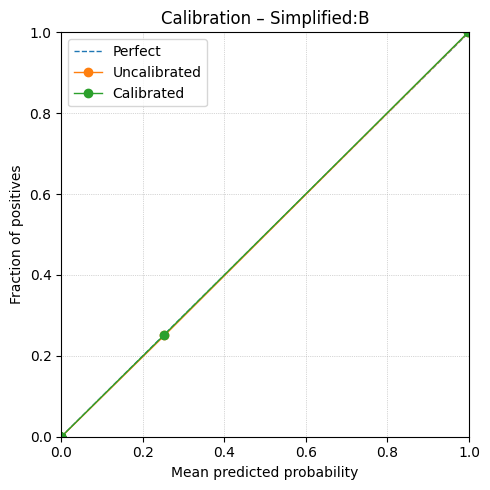

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Hao/Models/Simplified_B/Simplified_B_bundle.joblib

B
               precision    recall  f1-score   support

           0       1.00      1.00      1.00      2687
           1       1.00      1.00      1.00      2687

    accuracy                           1.00      5374
   macro avg       1.00      1.00      1.00      5374
weighted avg       1.00      1.00      1.00      5374


Processing CD4_T (class 2/11)...
Training - Found 59054 / 59054 barcodes
Training - Pos: 29527, Neg: 29527
Training labels: 29527 pos, 29527 neg
Testing  - Found 16404 / 16404 barcodes
Testing  - Pos: 8202, Neg: 8202
Testing  - labels: 8202 pos, 8202 neg
Calibrating - Found 12894 rows | Pos: 3282, Neg: 9612
All test data: 32231 rows, positives for CD4_T: 8202
[scale] CD4_T: train mean ~ -0.000, std ~ 1.000

[NB] training → CD4_T
Fitting 10 folds for each of 10

Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid st


[XGB] training → CD4_T
Fitting 10 folds for each of 10 candidates, totalling 100 fits


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.



[KNN] training → CD4_T
Fitting 10 folds for each of 10 candidates, totalling 100 fits


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.



[MLP] training → CD4_T
Fitting 10 folds for each of 10 candidates, totalling 100 fits


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


[CAL] CD4_T: cal positives=3282/12894

Calibration metrics:
   Uncalibrated  |  Brier: 0.0021   LogLoss: 0.0105
     Calibrated  |  Brier: 0.0014   LogLoss: 0.0084


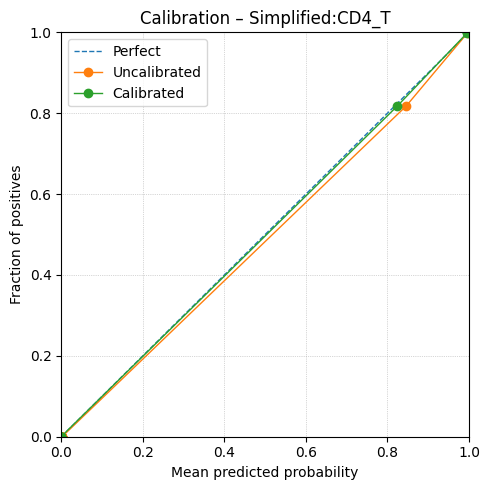

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Hao/Models/Simplified_CD4_T/Simplified_CD4_T_bundle.joblib

CD4_T
               precision    recall  f1-score   support

           0       1.00      1.00      1.00      8202
           1       1.00      1.00      1.00      8202

    accuracy                           1.00     16404
   macro avg       1.00      1.00      1.00     16404
weighted avg       1.00      1.00      1.00     16404


Processing CD8_T (class 3/11)...
Training - Found 40834 / 40834 barcodes
Training - Pos: 20417, Neg: 20417
Training labels: 20417 pos, 20417 neg
Testing  - Found 11344 / 11344 barcodes
Testing  - Pos: 5672, Neg: 5672
Testing  - labels: 5672 pos, 5672 neg
Calibrating - Found 12894 rows | Pos: 2269, Neg: 10625
All test data: 32231 rows, positives for CD8_T: 5672
[scale] CD8_T: train mean ~ -0.000, std ~ 1.000

[NB] training → CD8_T
Fitting 10 folds f

Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.



[XGB] training → CD8_T
Fitting 10 folds for each of 10 candidates, totalling 100 fits


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid st


[KNN] training → CD8_T
Fitting 10 folds for each of 10 candidates, totalling 100 fits

[MLP] training → CD8_T
Fitting 10 folds for each of 10 candidates, totalling 100 fits
[CAL] CD8_T: cal positives=2269/12894

Calibration metrics:
   Uncalibrated  |  Brier: 0.0033   LogLoss: 0.0160
     Calibrated  |  Brier: 0.0029   LogLoss: 0.0124


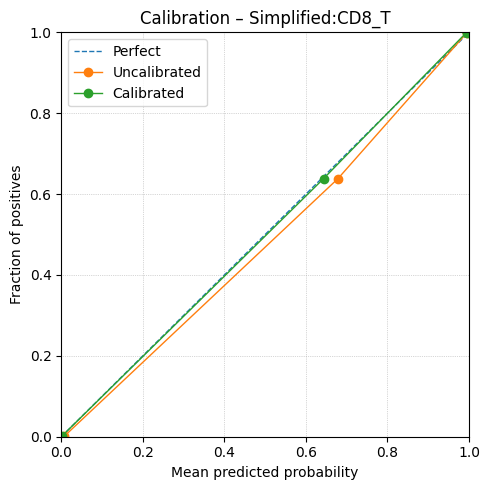

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Hao/Models/Simplified_CD8_T/Simplified_CD8_T_bundle.joblib

CD8_T
               precision    recall  f1-score   support

           0       0.99      1.00      0.99      5672
           1       1.00      0.99      0.99      5672

    accuracy                           0.99     11344
   macro avg       0.99      0.99      0.99     11344
weighted avg       0.99      0.99      0.99     11344


Processing Erythroid (class 4/11)...
Training - Found 3324 / 3324 barcodes
Training - Pos: 1662, Neg: 1662
Training labels: 1662 pos, 1662 neg
Testing  - Found 924 / 924 barcodes
Testing  - Pos: 462, Neg: 462
Testing  - labels: 462 pos, 462 neg
Calibrating - Found 12894 rows | Pos: 185, Neg: 12709
All test data: 32231 rows, positives for Erythroid: 462
[scale] Erythroid: train mean ~ -0.000, std ~ 1.000

[NB] training → Erythroid
Fitting 10 folds f

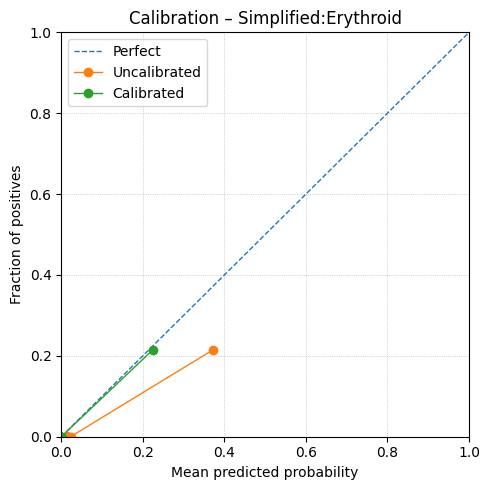

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Hao/Models/Simplified_Erythroid/Simplified_Erythroid_bundle.joblib

Erythroid
               precision    recall  f1-score   support

           0       0.99      1.00      0.99       462
           1       1.00      0.98      0.99       462

    accuracy                           0.99       924
   macro avg       0.99      0.99      0.99       924
weighted avg       0.99      0.99      0.99       924


Processing HSPC (class 5/11)...
Training - Found 472 / 472 barcodes
Training - Pos: 236, Neg: 236
Training labels: 236 pos, 236 neg
Testing  - Found 132 / 132 barcodes
Testing  - Pos: 66, Neg: 66
Testing  - labels: 66 pos, 66 neg
Calibrating - Found 12894 rows | Pos: 26, Neg: 12868
All test data: 32231 rows, positives for HSPC: 66
[scale] HSPC: train mean ~ -0.000, std ~ 1.000

[NB] training → HSPC
Fitting 10 folds for each of 10 candid

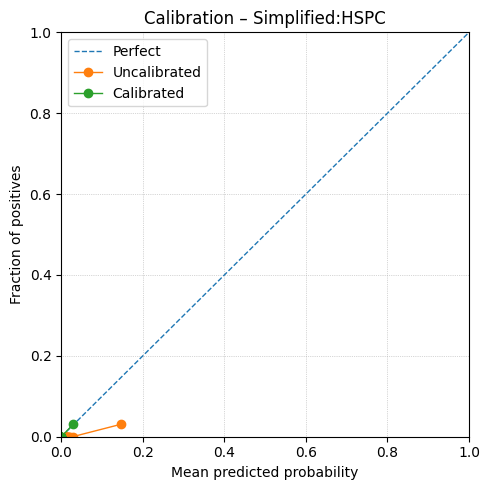

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Hao/Models/Simplified_HSPC/Simplified_HSPC_bundle.joblib

HSPC
               precision    recall  f1-score   support

           0       0.99      1.00      0.99        66
           1       1.00      0.98      0.99        66

    accuracy                           0.99       132
   macro avg       0.99      0.99      0.99       132
weighted avg       0.99      0.99      0.99       132


Processing Monocyte (class 6/11)...
Training - Found 70030 / 70030 barcodes
Training - Pos: 35015, Neg: 35015
Training labels: 35015 pos, 35015 neg
Testing  - Found 19452 / 19452 barcodes
Testing  - Pos: 9726, Neg: 9726
Testing  - labels: 9726 pos, 9726 neg
Calibrating - Found 12894 rows | Pos: 3891, Neg: 9003
All test data: 32231 rows, positives for Monocyte: 9726
[scale] Monocyte: train mean ~ -0.000, std ~ 1.000

[NB] training → Monocyte
Fitting 10

Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid st


[KNN] training → Monocyte
Fitting 10 folds for each of 10 candidates, totalling 100 fits

[MLP] training → Monocyte
Fitting 10 folds for each of 10 candidates, totalling 100 fits
[CAL] Monocyte: cal positives=3891/12894

Calibration metrics:
   Uncalibrated  |  Brier: 0.0024   LogLoss: 0.0113
     Calibrated  |  Brier: 0.0019   LogLoss: 0.0090


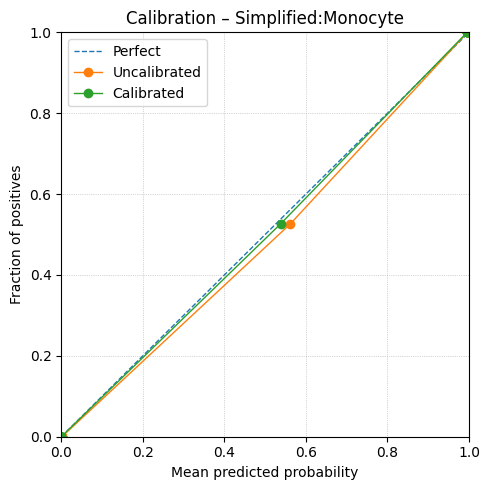

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Hao/Models/Simplified_Monocyte/Simplified_Monocyte_bundle.joblib

Monocyte
               precision    recall  f1-score   support

           0       1.00      1.00      1.00      9726
           1       1.00      1.00      1.00      9726

    accuracy                           1.00     19452
   macro avg       1.00      1.00      1.00     19452
weighted avg       1.00      1.00      1.00     19452


Processing NK (class 7/11)...
Training - Found 26868 / 26868 barcodes
Training - Pos: 13434, Neg: 13434
Training labels: 13434 pos, 13434 neg
Testing  - Found 7462 / 7462 barcodes
Testing  - Pos: 3731, Neg: 3731
Testing  - labels: 3731 pos, 3731 neg
Calibrating - Found 12894 rows | Pos: 1493, Neg: 11401
All test data: 32231 rows, positives for NK: 3731
[scale] NK: train mean ~ -0.000, std ~ 1.000

[NB] training → NK
Fitting 10 folds for ea

Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.



[KNN] training → NK
Fitting 10 folds for each of 10 candidates, totalling 100 fits


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.



[MLP] training → NK
Fitting 10 folds for each of 10 candidates, totalling 100 fits


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


[CAL] NK: cal positives=1493/12894

Calibration metrics:
   Uncalibrated  |  Brier: 0.0008   LogLoss: 0.0065
     Calibrated  |  Brier: 0.0004   LogLoss: 0.0026


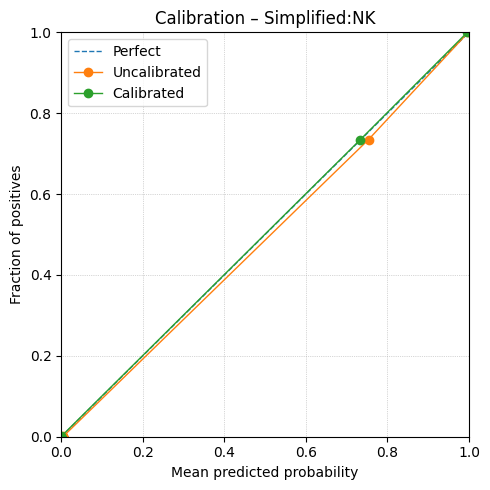

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Hao/Models/Simplified_NK/Simplified_NK_bundle.joblib

NK
               precision    recall  f1-score   support

           0       1.00      1.00      1.00      3731
           1       1.00      1.00      1.00      3731

    accuracy                           1.00      7462
   macro avg       1.00      1.00      1.00      7462
weighted avg       1.00      1.00      1.00      7462


Processing Other_T (class 8/11)...
Training - Found 5684 / 5684 barcodes
Training - Pos: 2842, Neg: 2842
Training labels: 2842 pos, 2842 neg
Testing  - Found 1580 / 1580 barcodes
Testing  - Pos: 790, Neg: 790
Testing  - labels: 790 pos, 790 neg
Calibrating - Found 12894 rows | Pos: 315, Neg: 12579
All test data: 32231 rows, positives for Other_T: 790
[scale] Other_T: train mean ~ 0.000, std ~ 1.000

[NB] training → Other_T
Fitting 10 folds for each of 10 ca

Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.



[KNN] training → Other_T
Fitting 10 folds for each of 10 candidates, totalling 100 fits

[MLP] training → Other_T
Fitting 10 folds for each of 10 candidates, totalling 100 fits
[CAL] Other_T: cal positives=315/12894

Calibration metrics:
   Uncalibrated  |  Brier: 0.0105   LogLoss: 0.0480
     Calibrated  |  Brier: 0.0036   LogLoss: 0.0136


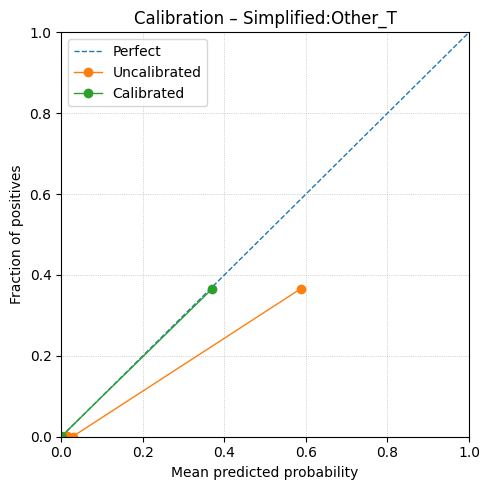

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Hao/Models/Simplified_Other_T/Simplified_Other_T_bundle.joblib

Other_T
               precision    recall  f1-score   support

           0       0.98      0.99      0.99       790
           1       0.99      0.98      0.99       790

    accuracy                           0.99      1580
   macro avg       0.99      0.99      0.99      1580
weighted avg       0.99      0.99      0.99      1580


Processing Plasma (class 9/11)...
Training - Found 526 / 526 barcodes
Training - Pos: 263, Neg: 263
Training labels: 263 pos, 263 neg
Testing  - Found 146 / 146 barcodes
Testing  - Pos: 73, Neg: 73
Testing  - labels: 73 pos, 73 neg
Calibrating - Found 12894 rows | Pos: 29, Neg: 12865
All test data: 32231 rows, positives for Plasma: 73
[scale] Plasma: train mean ~ -0.000, std ~ 1.000

[NB] training → Plasma
Fitting 10 folds for each of 10 cand

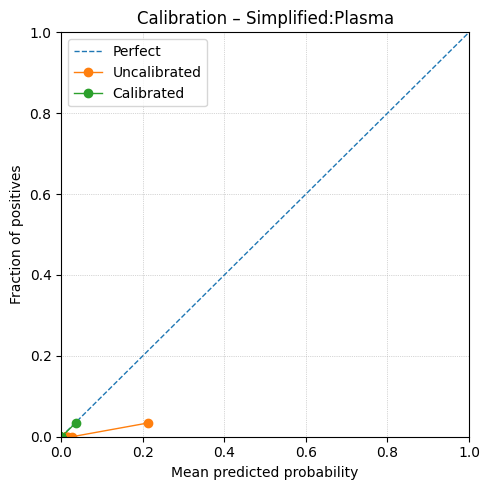

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Hao/Models/Simplified_Plasma/Simplified_Plasma_bundle.joblib

Plasma
               precision    recall  f1-score   support

           0       1.00      1.00      1.00        73
           1       1.00      1.00      1.00        73

    accuracy                           1.00       146
   macro avg       1.00      1.00      1.00       146
weighted avg       1.00      1.00      1.00       146


Processing cDC (class 10/11)...
Training - Found 4450 / 4450 barcodes
Training - Pos: 2225, Neg: 2225
Training labels: 2225 pos, 2225 neg
Testing  - Found 1236 / 1236 barcodes
Testing  - Pos: 618, Neg: 618
Testing  - labels: 618 pos, 618 neg
Calibrating - Found 12894 rows | Pos: 247, Neg: 12647
All test data: 32231 rows, positives for cDC: 618
[scale] cDC: train mean ~ 0.000, std ~ 1.000

[NB] training → cDC
Fitting 10 folds for each of 10 candi

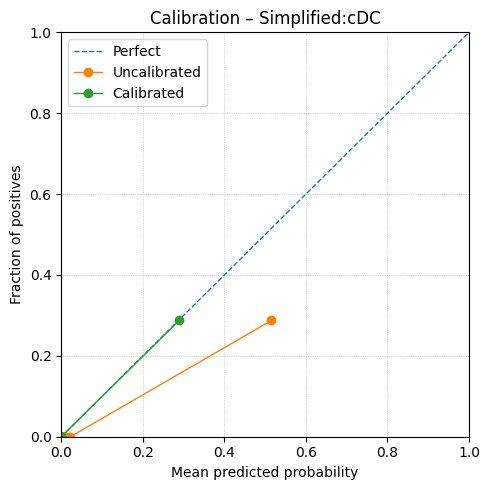

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Hao/Models/Simplified_cDC/Simplified_cDC_bundle.joblib

cDC
               precision    recall  f1-score   support

           0       0.98      1.00      0.99       618
           1       1.00      0.98      0.99       618

    accuracy                           0.99      1236
   macro avg       0.99      0.99      0.99      1236
weighted avg       0.99      0.99      0.99      1236


Processing pDC (class 11/11)...
Training - Found 1292 / 1292 barcodes
Training - Pos: 646, Neg: 646
Training labels: 646 pos, 646 neg
Testing  - Found 358 / 358 barcodes
Testing  - Pos: 179, Neg: 179
Testing  - labels: 179 pos, 179 neg
Calibrating - Found 12894 rows | Pos: 72, Neg: 12822
All test data: 32231 rows, positives for pDC: 179
[scale] pDC: train mean ~ 0.000, std ~ 1.000

[NB] training → pDC
Fitting 10 folds for each of 10 candidates, totalling

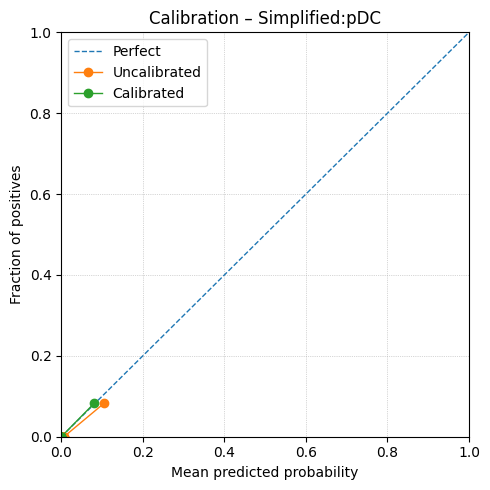

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Hao/Models/Simplified_pDC/Simplified_pDC_bundle.joblib

pDC
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       179
           1       1.00      1.00      1.00       179

    accuracy                           1.00       358
   macro avg       1.00      1.00      1.00       358
weighted avg       1.00      1.00      1.00       358


Fitting multiclass TemperatureScaling on CAL split (excluded classes masked out)...

Preview of probabilities BEFORE (raw OvR) vs AFTER (multiclass TS) [included classes only]:
                        raw_B     raw_CD4_T  raw_CD8_T  raw_Erythroid  raw_HSPC  raw_Monocyte    raw_NK   raw_Other_T  raw_Plasma       raw_cDC   raw_pDC      mc_B      mc_CD4_T  mc_CD8_T  mc_Erythroid   mc_HSPC  mc_Monocyte     mc_NK    mc_Other_T  mc_Plasma        mc_cDC    mc_p

In [122]:
# -*- coding: utf-8 -*-
from pathlib import Path
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.ensemble import StackingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.calibration import CalibratedClassifierCV
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report, confusion_matrix

from netcal.scaling import TemperatureScaling
import joblib

# ------------------------------------------------------------------- CONFIG (expects these to already exist)
#   models_output, train_barcodes_path, test_barcodes_path
#   Hao_data_Train, Hao_data_Test, Hao_data_Cal          (DataFrames indexed by barcode)
#   Hao_dataset_Train, Hao_dataset_Test, Hao_dataset_Cal (AnnData with obs labels)
#   TotalSeqD_Heme_Oncology_CAT399906                    (iterable of feature names)
#   MLTraining module with: CV, train_NB, train_XGB, train_KNN, train_MLP,
#                           plot_calibration_curve, save_models, evaluate_classifier, append_metrics_csv

name_target_class = "Simplified"   # "simplified" | "Simplified" | "Detailed"
fig_root   = Path(models_output) / "Figures"
models_dir = Path(models_output) / "Models"
fig_root.mkdir(parents=True, exist_ok=True)
models_dir.mkdir(parents=True, exist_ok=True)

kf         = MLTraining.CV
num_cores  = -1
metrics_log = []

# ============================= HELPERS =============================

def _norm_feats(names) -> pd.Index:
    """
    Normalizer used ONLY to construct matching keys.
    Panel names remain untouched; data columns are normalized and then mapped BACK
    to the exact panel names via a lookup.
    """
    s = pd.Index(map(str, names))
    s = (s.str.strip()
           .str.lower()
           .str.replace(r"[ _/]+", "-", regex=True)
           .str.replace(r"-+", "-", regex=True)
           .str.strip("-"))
    return s

def attach_celltype(df: pd.DataFrame, ad: "AnnData", field: str) -> pd.DataFrame:
    if field not in ad.obs:
        raise KeyError(f"'{field}' not found in AnnData.obs")
    lab = (ad.obs[field]
             .astype("string")
             .str.strip()
             .str.replace(r"\s+", "_", regex=True))
    out = df.copy()
    out["Celltype"] = pd.Categorical(lab.reindex(out.index))
    if out["Celltype"].isna().any():
        missing = int(out["Celltype"].isna().sum())
        print(f"[WARN] {missing} rows got NaN Celltype after reindex; check barcode alignment.")
    return out

def _check_finite(df: pd.DataFrame, tag: str):
    arr = df.to_numpy()
    if not np.isfinite(arr).all():
        bad = np.where(~np.isfinite(arr))
        raise ValueError(f"Non-finite values found in {tag} features at positions {bad}")

def _unwrap_estimator(m):
    return getattr(m, "estimator", None) or getattr(m, "base_estimator", None) or m

def _assert_feature_counts(cell_name: str, models_dict: dict, expected: int):
    pairs = [
        ("NB",  models_dict.get("NB")),
        ("XGB", models_dict.get("XGB")),
        ("KNN", models_dict.get("KNN")),
        ("MLP", models_dict.get("MLP")),
        ("Stacker", models_dict.get("Stacker")),
    ]
    for name, est in pairs:
        if est is None:
            continue
        base = _unwrap_estimator(est)
        nfi = getattr(base, "n_features_in_", None)
        if nfi is not None and nfi != expected:
            raise RuntimeError(f"{cell_name}:{name} saw {nfi} features; expected {expected}")

# ============================= LABEL ATTACH =============================

consensus_field = f"Consensus_annotation_{name_target_class.lower()}_final"

Hao_data_Train = attach_celltype(Hao_data_Train, Hao_dataset_Train, consensus_field)
Hao_data_Test  = attach_celltype(Hao_data_Test,  Hao_dataset_Test,  consensus_field)
Hao_data_Cal   = attach_celltype(Hao_data_Cal,   Hao_dataset_Cal,   consensus_field)

# ============================= PANEL & DATA COLUMN ALIGNMENT =============================

# Keep the panel EXACTLY as provided
panel = pd.Index(map(str, TotalSeqD_Heme_Oncology_CAT399906))

# Build a mapping: normalized_key -> exact panel name
panel_keys    = _norm_feats(panel)
norm_to_panel = dict(zip(panel_keys, panel))
if len(norm_to_panel) != len(panel):
    raise ValueError("Panel contains names that collide after normalization. Consider adjusting _norm_feats rules.")

def _rename_data_to_panel(df: pd.DataFrame) -> pd.DataFrame:
    """
    Rename only feature columns so that after normalization they map
    back to the exact panel column names. Keeps 'cell_barcode' and 'Celltype' intact.
    """
    df = df.copy()
    non_feat = [c for c in ["cell_barcode", "Celltype"] if c in df.columns]
    feat     = pd.Index([c for c in df.columns if c not in non_feat])

    feat_keys   = _norm_feats(feat)
    mapped      = [norm_to_panel.get(k) for k in feat_keys]  # None if not in panel
    rename_map  = {old: new for old, new in zip(feat, mapped) if new is not None}

    # Handle duplicate mappings (two data columns → same panel col). Keep first, drop the rest.
    seen, safe_map, drops = set(), {}, []
    for old, new in rename_map.items():
        if new in seen:
            drops.append(old)
        else:
            seen.add(new); safe_map[old] = new

    if drops:
        print(f"[WARN] Dropping {len(drops)} duplicated-mapped columns (showing up to 5): {drops[:5]}")

    if drops:
        df.drop(columns=drops, inplace=True, errors="ignore")
    df.rename(columns=safe_map, inplace=True)

    matched = len(safe_map)
    print(f"[map] matched {matched}/{len(feat)} data columns to panel")
    return df

# Apply: normalize/rename ONLY data splits (panel remains untouched)
Hao_data_Train = _rename_data_to_panel(Hao_data_Train)
Hao_data_Test  = _rename_data_to_panel(Hao_data_Test)
Hao_data_Cal   = _rename_data_to_panel(Hao_data_Cal)

# Intersect each split with the panel IN PANEL ORDER
def _panel_intersection(df: pd.DataFrame) -> pd.DataFrame:
    non_feat = [c for c in ["cell_barcode", "Celltype"] if c in df.columns]
    feat_cols = pd.Index([c for c in df.columns if c not in non_feat])
    inter = panel.intersection(feat_cols, sort=False)
    if inter.empty:
        raise ValueError("Panel/Data intersection is empty after renaming. Check mapping rules.")
    return df.reindex(columns=list(inter) + non_feat)

Hao_data_Train = _panel_intersection(Hao_data_Train)
Hao_data_Test  = _panel_intersection(Hao_data_Test)
Hao_data_Cal   = _panel_intersection(Hao_data_Cal)

# ============================= FEATURES & LABELS =============================

Hao_data_Cal_lbl = Hao_data_Cal[["Celltype"]].copy()

drop_cols_train = [c for c in ["cell_barcode", "Celltype"] if c in Hao_data_Train.columns]
drop_cols_test  = [c for c in ["cell_barcode", "Celltype"] if c in Hao_data_Test.columns]
drop_cols_cal   = [c for c in ["cell_barcode", "Celltype"] if c in Hao_data_Cal.columns]

Hao_data_Train_Sub = Hao_data_Train.drop(columns=drop_cols_train, errors="ignore")
Hao_data_Test_Sub  = Hao_data_Test.drop(columns=drop_cols_test,  errors="ignore")
Hao_data_Cal_Sub   = Hao_data_Cal.drop(columns=drop_cols_cal,    errors="ignore")

# SAFETY: shared columns & finiteness checks
cols_train = list(Hao_data_Train_Sub.columns)
if list(Hao_data_Test_Sub.columns) != cols_train or list(Hao_data_Cal_Sub.columns) != cols_train:
    raise ValueError("Train/Cal/Test feature columns differ after panel intersection!")

_check_finite(Hao_data_Train_Sub, "TRAIN")
_check_finite(Hao_data_Test_Sub,  "TEST")
_check_finite(Hao_data_Cal_Sub,   "CAL")

print(f"\n[features] Using {len(cols_train)} panel-intersected features (exact panel names):")
print(cols_train)

# ===== Exclude specific classes from the multiclass set and per-class loop =====
EXCLUDE_CLASSES = {"Macrophage", "ILC", "Stroma"}

all_classes = sorted(pd.Series(Hao_data_Train["Celltype"]).dropna().unique())
class_names = [c for c in all_classes if c not in EXCLUDE_CLASSES]
if not class_names:
    raise ValueError("After exclusions, class_names is empty.")
print(f"[classes] Included ({len(class_names)}): {class_names}")
if missing := [c for c in all_classes if c in EXCLUDE_CLASSES]:
    print(f"[classes] Excluded: {missing}")

K            = len(class_names)
class_to_idx = {c: i for i, c in enumerate(class_names)}

# --- Multiclass labels (MASKED to included classes) ---
# CAL
mask_cal_mc = Hao_data_Cal_lbl["Celltype"].isin(class_names)
s_cal = Hao_data_Cal_lbl.loc[mask_cal_mc, "Celltype"].map(class_to_idx)
if s_cal.isna().any():
    missing = Hao_data_Cal_lbl.loc[mask_cal_mc & s_cal.isna(), "Celltype"].unique()
    raise ValueError(f"Unknown labels in masked CAL split: {missing}")
y_cal_multiclass = s_cal.to_numpy(dtype=np.int64)

# TEST
mask_test_mc = Hao_data_Test["Celltype"].isin(class_names)
s_te = Hao_data_Test.loc[mask_test_mc, "Celltype"].map(class_to_idx)
if s_te.isna().any():
    missing = Hao_data_Test.loc[mask_test_mc & s_te.isna(), "Celltype"].unique()
    raise ValueError(f"Unknown labels in masked TEST split: {missing}")
y_test_multiclass = s_te.to_numpy(dtype=np.int64)

# Reuse across classes
X_cal_all_df = Hao_data_Cal_Sub.copy()
X_te_all_df  = Hao_data_Test_Sub.copy()

# Preallocate OvR prob mats (only for included classes)
P_cal = np.zeros((X_cal_all_df.shape[0], K), dtype=float)
P_te  = np.zeros((X_te_all_df.shape[0],  K), dtype=float)

test_index = Hao_data_Test_Sub.index

# ============================= TRAIN PER-CLASS OVR =============================

for celltype in class_names:
    k = class_to_idx[celltype]
    name = str(celltype).replace(" ", "_")
    print(f"\nProcessing {name} (class {k+1}/{K})...")

    # ---- TRAIN slice via barcode lists
    train_barcodes_df = pd.read_csv(
        f"{train_barcodes_path}/Hao/Consensus_annotation_simplified_final/Barcodes_training_class_{name}.csv",
        index_col=0
    )
    train_positive_barcodes = train_barcodes_df["Positive"].dropna().values
    train_negative_barcodes = train_barcodes_df["Negative"].dropna().values
    all_train_barcodes = np.concatenate([train_positive_barcodes, train_negative_barcodes])

    train_mask = Hao_data_Train_Sub.index.isin(all_train_barcodes)
    X_tr_df = Hao_data_Train_Sub.loc[train_mask]
    found_train_barcodes = X_tr_df.index.values
    y_tr = np.isin(found_train_barcodes, train_positive_barcodes).astype(int)

    # ---- Skip guards
    if X_tr_df.empty or np.unique(y_tr).size < 2:
        print(f"[SKIP] {name}: empty or single-class train slice (pos={y_tr.sum()}, neg={(len(y_tr)-y_tr.sum())}).")
        continue

    # ---- TEST slice via barcode lists
    test_barcodes_df = pd.read_csv(
        f"{test_barcodes_path}/Hao/Consensus_annotation_simplified_final/Barcodes_testing_class_{name}.csv",
        index_col=0
    )
    test_positive_barcodes = test_barcodes_df["Positive"].dropna().values
    test_negative_barcodes = test_barcodes_df["Negative"].dropna().values
    all_test_barcodes = np.concatenate([test_positive_barcodes, test_negative_barcodes])

    test_mask = Hao_data_Test_Sub.index.isin(all_test_barcodes)
    X_te_df = Hao_data_Test_Sub.loc[test_mask]
    found_test_barcodes = X_te_df.index.values
    y_te = np.isin(found_test_barcodes, test_positive_barcodes).astype(int)

    # ---- Full-test & cal for this binary head
    X_te_all_local = X_te_all_df.copy()
    y_te_all = (Hao_data_Test["Celltype"].values == celltype).astype(int)
    X_cal_df = X_cal_all_df.copy()
    y_cal_bin = (Hao_data_Cal_lbl["Celltype"].values == celltype).astype(int)

    # ---- Info
    print(f"Training - Found {X_tr_df.shape[0]} / {len(all_train_barcodes)} barcodes")
    print(f"Training - Pos: {len(train_positive_barcodes)}, Neg: {len(train_negative_barcodes)}")
    print(f"Training labels: {y_tr.sum()} pos, {len(y_tr)-y_tr.sum()} neg")
    print(f"Testing  - Found {X_te_df.shape[0]} / {len(all_test_barcodes)} barcodes")
    print(f"Testing  - Pos: {len(test_positive_barcodes)}, Neg: {len(test_negative_barcodes)}")
    print(f"Testing  - labels: {y_te.sum()} pos, {len(y_te)-y_te.sum()} neg")
    print(f"Calibrating - Found {X_cal_df.shape[0]} rows | Pos: {y_cal_bin.sum()}, Neg: {len(y_cal_bin)-y_cal_bin.sum()}")
    print(f"All test data: {X_te_all_local.shape[0]} rows, positives for {celltype}: {y_te_all.sum()}")

    # ---- Scaling (fit on per-head TRAIN slice; transform others)
    scaler = StandardScaler(with_mean=True, with_std=True).fit(X_tr_df.values)

    def _sc(df):
        return pd.DataFrame(
            scaler.transform(df.values),
            index=df.index,
            columns=cols_train,
        )

    X_tr_sc_df     = _sc(X_tr_df)
    X_te_sc_df     = _sc(X_te_df)
    X_te_all_sc_df = _sc(X_te_all_local)
    X_cal_sc_df    = _sc(X_cal_df)

    print(f"[scale] {name}: train mean ~ {X_tr_sc_df.values.mean():.3f}, std ~ {X_tr_sc_df.values.std():.3f}")

    # ---- Base learners
    NB_model  = MLTraining.train_NB (X_tr_sc_df, y_tr, cv=kf, num_cores=num_cores, name_target_subclass=name)
    XGB_model = MLTraining.train_XGB(X_tr_sc_df, y_tr, cv=kf, num_cores=num_cores, name_target_subclass=name)
    KNN_model = MLTraining.train_KNN(X_tr_sc_df, y_tr, cv=kf, num_cores=num_cores, name_target_subclass=name)
    MLP_model = MLTraining.train_MLP(X_tr_sc_df, y_tr, cv=kf, num_cores=num_cores, name_target_subclass=name)

    # ---- Stacker (raw)
    stacker_raw = StackingClassifier(
        estimators=[("NB", NB_model), ("XGB", XGB_model), ("KNN", KNN_model), ("MLP", MLP_model)],
        final_estimator=LogisticRegression(max_iter=2000, class_weight="balanced", random_state=42),
        stack_method="predict_proba",
        cv=kf,
        n_jobs=-1,
    ).fit(X_tr_sc_df, y_tr)

    # ---- Feature count asserts (debug safety)
    expected_feats = len(cols_train)
    _assert_feature_counts(name, {
        "NB": NB_model, "XGB": XGB_model, "KNN": KNN_model, "MLP": MLP_model, "Stacker": stacker_raw
    }, expected_feats)

    # ---- Binary calibration (Platt, guarded)
    pos_cal    = int(y_cal_bin.sum())
    n_cal_bin  = int(len(y_cal_bin))
    has_both   = (0 < pos_cal < n_cal_bin)
    print(f"[CAL] {name}: cal positives={pos_cal}/{n_cal_bin}")

    if has_both:
        try:
            calibrator = CalibratedClassifierCV(estimator=stacker_raw, method="sigmoid", cv="prefit")
        except TypeError:  # older sklearn
            calibrator = CalibratedClassifierCV(base_estimator=stacker_raw, method="sigmoid", cv="prefit")
        stacker = calibrator.fit(X_cal_sc_df, y_cal_bin)
    else:
        print(f"[WARN] Skipping calibration for {name}: single-class cal set.")
        stacker = stacker_raw

    # ---- Calibration plot on all-test (optional)
    try:
        y_proba_uncal = stacker_raw.predict_proba(X_te_all_sc_df)[:, 1]
        y_proba_cal   = stacker.predict_proba(X_te_all_sc_df)[:, 1]
        if has_both:
            _ = MLTraining.plot_calibration_curve(
                y_te_all, [y_proba_uncal, y_proba_cal],
                clf_names=["Uncalibrated", "Calibrated"],
                n_bins=15, strategy="quantile",
                title=f"Calibration – {name_target_class}:{name}"
            )
        else:
            _ = MLTraining.plot_calibration_curve(
                y_te_all, [y_proba_uncal],
                clf_names=["Uncalibrated"],
                n_bins=15, strategy="quantile",
                title=f"Calibration (uncal only) – {name_target_class}:{name}"
            )
        plt.tight_layout()
        plt.show()
    except Exception as e:
        print(f"[WARN] Skipped calibration plot for {name}: {e}")

    # ---- Save per-class bundle (model + scaler + columns)
    save_subdir = models_dir / f"{name_target_class}_{name}"
    save_subdir.mkdir(parents=True, exist_ok=True)

    MLTraining.save_models({"Stacked": stacker}, out_dir=save_subdir, tag=f"{name_target_class}_{name}")
    joblib.dump(cols_train, save_subdir / "feature_names.joblib")

    bundle = {
        "atlas": "Hao",
        "depth": name_target_class,
        "label": celltype,
        "model": stacker,          # CalibratedClassifierCV(StackingClassifier) or StackingClassifier
        "columns": cols_train,     # exact panel names, panel order
        "scaler": scaler,          # per-head scaler
        "panel_name": "TotalSeqD_Heme_Oncology_CAT399906",
    }
    bundle_path = save_subdir / f"{name_target_class}_{name}_bundle.joblib"
    joblib.dump(bundle, bundle_path)
    print(f"[SAVE] Wrote bundle with columns+scaler to {bundle_path}")

    # ---- Binary metrics on the class-specific test slice
    try:
        m = MLTraining.evaluate_classifier(stacker, X_te_sc_df, y_te, plot_cm=False)
        m.update(celltype=celltype)
        metrics_log.append(m)
        print(f"\n{celltype}\n", m.get("report", ""))
    except Exception as e:
        print(f"[WARN] Binary metrics for {name} skipped: {e}")

    # ---- Store OvR probs for multiclass calibration (columns order = class_names)
    P_cal[:, k] = stacker.predict_proba(X_cal_sc_df)[:, 1]
    P_te[:,  k] = stacker.predict_proba(X_te_all_sc_df)[:, 1]

# ============================= MULTICLASS CALIBRATION =============================

print("\nFitting multiclass TemperatureScaling on CAL split (excluded classes masked out)...")

# Guards: ensure probs are in [0,1]
if (P_cal < 0).any() or (P_cal > 1).any():
    raise ValueError("P_cal must be probabilities in [0,1].")
if (P_te < 0).any() or (P_te > 1).any():
    raise ValueError("P_te must be probabilities in [0,1].")

ts_cal = TemperatureScaling()
# Fit only on CAL rows whose true label is one of the included classes
ts_cal.fit(P_cal[mask_cal_mc.values, :], y_cal_multiclass)
P_te_mc = ts_cal.transform(P_te)

# Ensure calibrated probs shape (K)
P_te_mc = np.asarray(P_te_mc)
if P_te_mc.ndim == 1:
    P_te_mc = P_te_mc.reshape(-1, 1)
if P_te_mc.shape[1] == 1 and K == 2:
    P_te_mc = np.hstack([1.0 - P_te_mc, P_te_mc])
elif P_te_mc.shape[1] != K:
    # Fallback: normalize OvR sums
    row_sums = P_te.sum(axis=1, keepdims=True)
    row_sums[row_sums == 0.0] = 1.0
    P_te_mc = P_te / row_sums
    print(f"[WARN] TemperatureScaling returned shape {P_te_mc.shape}; fell back to sum-normalized OvR probs.")

# Persist multiclass temp scaler + INCLUDED class names
joblib.dump(ts_cal, models_dir / f"{name_target_class}_multiclass_temp_scaler.joblib")
(pd.Series(class_names, name="class_name")
   .to_csv(models_dir / f"{name_target_class}_class_names.csv", index=False))

# ============================= PROBS COMPARISON & METRICS =============================

# Evaluate & save on TEST rows whose true label is an INCLUDED class
test_index_masked = Hao_data_Test_Sub.index[mask_test_mc.values]

probs_raw_df = pd.DataFrame(P_te[mask_test_mc.values, :],    index=test_index_masked,
                            columns=[f"raw_{c}" for c in class_names])
probs_mc_df  = pd.DataFrame(P_te_mc[mask_test_mc.values, :], index=test_index_masked,
                            columns=[f"mc_{c}"  for c in class_names])

probs_compare = pd.concat([probs_raw_df, probs_mc_df], axis=1)
probs_compare["true_label"]    = Hao_data_Test.loc[mask_test_mc, "Celltype"].values
probs_compare["pred_raw"]      = P_te[mask_test_mc.values, :].argmax(axis=1)
probs_compare["pred_mc"]       = P_te_mc[mask_test_mc.values, :].argmax(axis=1)
probs_compare["pred_raw_name"] = [class_names[i] for i in probs_compare["pred_raw"].values]
probs_compare["pred_mc_name"]  = [class_names[i] for i in probs_compare["pred_mc"].values]

print("\nPreview of probabilities BEFORE (raw OvR) vs AFTER (multiclass TS) [included classes only]:")
print(probs_compare.head(10).to_string())

probs_compare_path = models_dir / f"{name_target_class}_probabilities_before_after_TEST_included.csv"
probs_compare.to_csv(probs_compare_path, index=True)
print(f"\nSaved probabilities comparison to: {probs_compare_path}")

# Multiclass evaluation on the masked subset
y_pred_mc = P_te_mc[mask_test_mc.values, :].argmax(axis=1)
print("\nMulticlass classification report (TEST, excluded classes removed):")
print(classification_report(y_test_multiclass, y_pred_mc, target_names=class_names, digits=3))

cm = confusion_matrix(y_test_multiclass, y_pred_mc, labels=range(K))
print("Confusion matrix (rows=true, cols=pred):\n", cm)

# Per-class binary head metrics CSV
metrics_df = pd.DataFrame.from_records(metrics_log)
MLTraining.append_metrics_csv(metrics_df, csv_path=Path(models_output) / "stacker_metrics.csv")

print("\nDone.")


#### Detailed annotation

[map] matched 36/36 data columns to panel
[map] matched 36/36 data columns to panel
[map] matched 36/36 data columns to panel

[features] Using 36 panel-intersected features (exact panel names):
['HLA-DR', 'CD117', 'CD11b', 'CD11c', 'CD123', 'CD13', 'CD138', 'CD14', 'CD141', 'CD16', 'CD163', 'CD19', 'CD1c', 'CD2', 'CD22', 'CD25', 'CD3', 'CD30', 'CD303', 'CD304', 'CD34', 'CD38', 'CD4', 'CD44', 'CD45', 'CD45RA', 'CD45RO', 'CD49d', 'CD56', 'CD62P', 'CD64', 'CD69', 'CD71', 'CD8', 'CD83', 'CD90']
[classes] Included (23): ['B_Memory', 'B_Naive', 'CD14_Mono', 'CD16_Mono', 'CD4_CTL', 'CD4_T_Memory', 'CD4_T_Naive', 'CD8_T_Memory', 'CD8_T_Naive', 'Erythroblast', 'HSC_MPP', 'Immature_B', 'MAIT', 'NK_CD56_bright', 'NK_CD56_dim', 'Plasma', 'Platelet', 'Pre-B', 'Treg', 'cDC1', 'cDC2', 'gdT', 'pDC']
[classes] Excluded: ['ILC', 'dnT']

Processing B_Memory (class 1/23)...
Training - Found 8116 / 8116 barcodes
Training - Pos: 4058, Neg: 4058
Training labels: 4058 pos, 4058 neg
Testing  - Found 2254 / 22

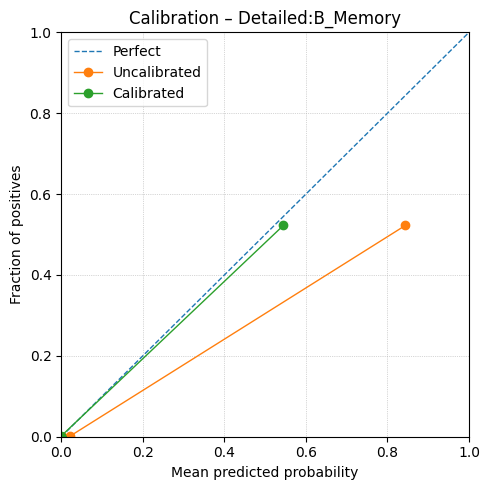

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Hao/Models/Detailed_B_Memory/Detailed_B_Memory_bundle.joblib

B_Memory
               precision    recall  f1-score   support

           0       0.95      0.99      0.97      1127
           1       0.99      0.95      0.97      1127

    accuracy                           0.97      2254
   macro avg       0.97      0.97      0.97      2254
weighted avg       0.97      0.97      0.97      2254


Processing B_Naive (class 2/23)...
Training - Found 9688 / 9688 barcodes
Training - Pos: 4844, Neg: 4844
Training labels: 4844 pos, 4844 neg
Testing  - Found 2692 / 2692 barcodes
Testing  - Pos: 1346, Neg: 1346
Testing  - labels: 1346 pos, 1346 neg
Calibrating - Found 12894 rows | Pos: 538, Neg: 12356
All test data: 32231 rows, positives for B_Naive: 1346
[scale] B_Naive: train mean ~ 0.000, std ~ 1.000

[NB] training → B_Naive
Fitting 10 fold

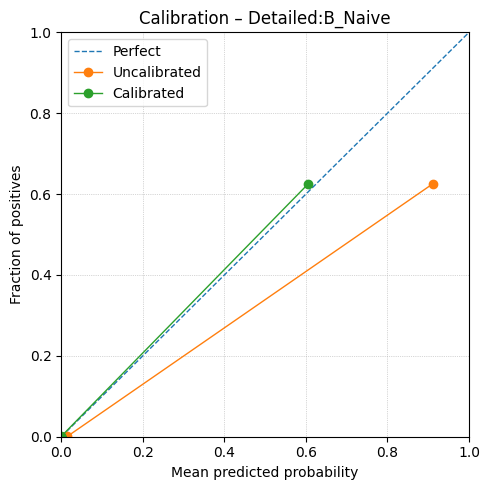

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Hao/Models/Detailed_B_Naive/Detailed_B_Naive_bundle.joblib

B_Naive
               precision    recall  f1-score   support

           0       0.96      0.99      0.97      1346
           1       0.98      0.95      0.97      1346

    accuracy                           0.97      2692
   macro avg       0.97      0.97      0.97      2692
weighted avg       0.97      0.97      0.97      2692


Processing CD14_Mono (class 3/23)...
Training - Found 60876 / 60876 barcodes
Training - Pos: 30438, Neg: 30438
Training labels: 30438 pos, 30438 neg
Testing  - Found 16910 / 16910 barcodes
Testing  - Pos: 8455, Neg: 8455
Testing  - labels: 8455 pos, 8455 neg
Calibrating - Found 12894 rows | Pos: 3382, Neg: 9512
All test data: 32231 rows, positives for CD14_Mono: 8455
[scale] CD14_Mono: train mean ~ 0.000, std ~ 1.000

[NB] training → CD14_Mono
Fi

Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid st


[KNN] training → CD14_Mono
Fitting 10 folds for each of 10 candidates, totalling 100 fits

[MLP] training → CD14_Mono
Fitting 10 folds for each of 10 candidates, totalling 100 fits


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


[CAL] CD14_Mono: cal positives=3382/12894

Calibration metrics:
   Uncalibrated  |  Brier: 0.0044   LogLoss: 0.0192
     Calibrated  |  Brier: 0.0034   LogLoss: 0.0155


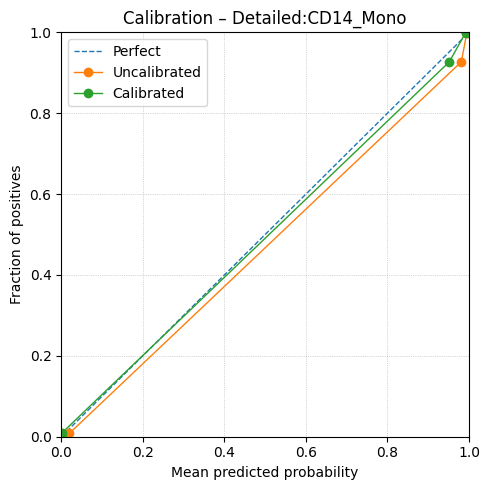

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Hao/Models/Detailed_CD14_Mono/Detailed_CD14_Mono_bundle.joblib

CD14_Mono
               precision    recall  f1-score   support

           0       1.00      1.00      1.00      8455
           1       1.00      1.00      1.00      8455

    accuracy                           1.00     16910
   macro avg       1.00      1.00      1.00     16910
weighted avg       1.00      1.00      1.00     16910


Processing CD16_Mono (class 4/23)...
Training - Found 9154 / 9154 barcodes
Training - Pos: 4577, Neg: 4577
Training labels: 4577 pos, 4577 neg
Testing  - Found 2542 / 2542 barcodes
Testing  - Pos: 1271, Neg: 1271
Testing  - labels: 1271 pos, 1271 neg
Calibrating - Found 12894 rows | Pos: 509, Neg: 12385
All test data: 32231 rows, positives for CD16_Mono: 1271
[scale] CD16_Mono: train mean ~ -0.000, std ~ 1.000

[NB] training → CD16_Mono
Fit

Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.



[KNN] training → CD16_Mono
Fitting 10 folds for each of 10 candidates, totalling 100 fits

[MLP] training → CD16_Mono
Fitting 10 folds for each of 10 candidates, totalling 100 fits
[CAL] CD16_Mono: cal positives=509/12894

Calibration metrics:
   Uncalibrated  |  Brier: 0.0064   LogLoss: 0.0271
     Calibrated  |  Brier: 0.0021   LogLoss: 0.0087


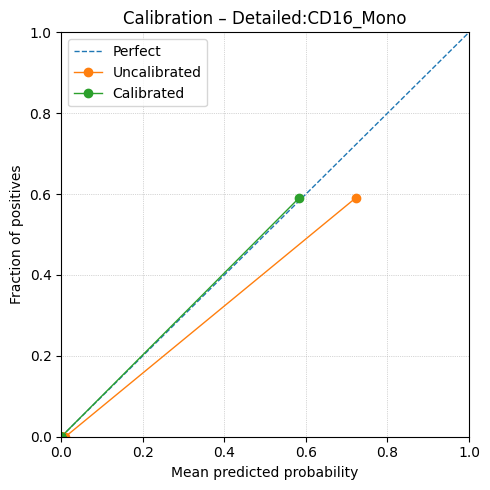

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Hao/Models/Detailed_CD16_Mono/Detailed_CD16_Mono_bundle.joblib

CD16_Mono
               precision    recall  f1-score   support

           0       0.98      1.00      0.99      1271
           1       1.00      0.98      0.99      1271

    accuracy                           0.99      2542
   macro avg       0.99      0.99      0.99      2542
weighted avg       0.99      0.99      0.99      2542


Processing CD4_CTL (class 5/23)...
Training - Found 2564 / 2564 barcodes
Training - Pos: 1282, Neg: 1282
Training labels: 1282 pos, 1282 neg
Testing  - Found 712 / 712 barcodes
Testing  - Pos: 356, Neg: 356
Testing  - labels: 356 pos, 356 neg
Calibrating - Found 12894 rows | Pos: 143, Neg: 12751
All test data: 32231 rows, positives for CD4_CTL: 356
[scale] CD4_CTL: train mean ~ -0.000, std ~ 1.000

[NB] training → CD4_CTL
Fitting 10 folds f

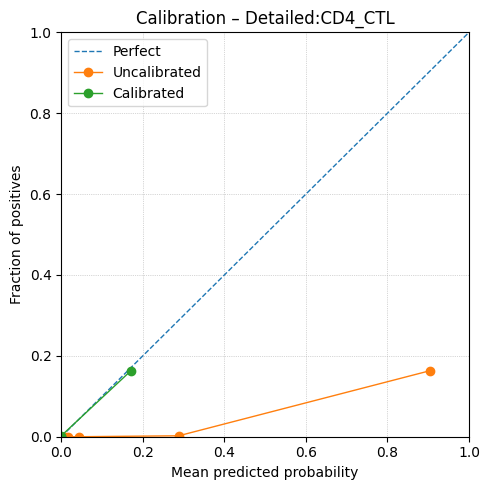

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Hao/Models/Detailed_CD4_CTL/Detailed_CD4_CTL_bundle.joblib

CD4_CTL
               precision    recall  f1-score   support

           0       0.69      1.00      0.82       356
           1       0.99      0.55      0.71       356

    accuracy                           0.77       712
   macro avg       0.84      0.77      0.76       712
weighted avg       0.84      0.77      0.76       712


Processing CD4_T_Memory (class 6/23)...
Training - Found 27662 / 27662 barcodes
Training - Pos: 13831, Neg: 13831
Training labels: 13831 pos, 13831 neg
Testing  - Found 7684 / 7684 barcodes
Testing  - Pos: 3842, Neg: 3842
Testing  - labels: 3842 pos, 3842 neg
Calibrating - Found 12894 rows | Pos: 1537, Neg: 11357
All test data: 32231 rows, positives for CD4_T_Memory: 3842
[scale] CD4_T_Memory: train mean ~ -0.000, std ~ 1.000

[NB] training → CD4

Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid st


[KNN] training → CD4_T_Memory
Fitting 10 folds for each of 10 candidates, totalling 100 fits


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.



[MLP] training → CD4_T_Memory
Fitting 10 folds for each of 10 candidates, totalling 100 fits
[CAL] CD4_T_Memory: cal positives=1537/12894

Calibration metrics:
   Uncalibrated  |  Brier: 0.0226   LogLoss: 0.0831
     Calibrated  |  Brier: 0.0144   LogLoss: 0.0532


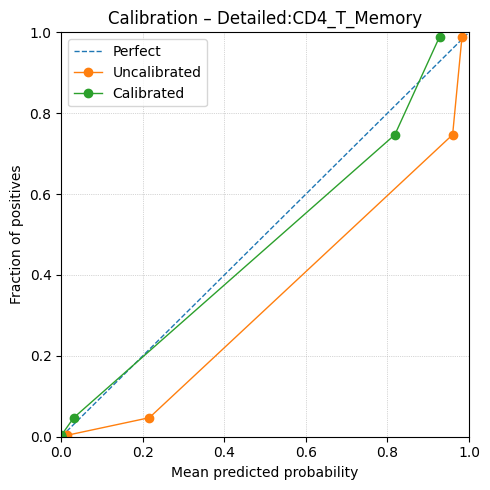

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Hao/Models/Detailed_CD4_T_Memory/Detailed_CD4_T_Memory_bundle.joblib

CD4_T_Memory
               precision    recall  f1-score   support

           0       0.96      0.98      0.97      3842
           1       0.98      0.96      0.97      3842

    accuracy                           0.97      7684
   macro avg       0.97      0.97      0.97      7684
weighted avg       0.97      0.97      0.97      7684


Processing CD4_T_Naive (class 7/23)...
Training - Found 25218 / 25218 barcodes
Training - Pos: 12609, Neg: 12609
Training labels: 12609 pos, 12609 neg
Testing  - Found 7004 / 7004 barcodes
Testing  - Pos: 3502, Neg: 3502
Testing  - labels: 3502 pos, 3502 neg
Calibrating - Found 12894 rows | Pos: 1401, Neg: 11493
All test data: 32231 rows, positives for CD4_T_Naive: 3502
[scale] CD4_T_Naive: train mean ~ 0.000, std ~ 1.000

[NB] tra

Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid st


[KNN] training → CD4_T_Naive
Fitting 10 folds for each of 10 candidates, totalling 100 fits

[MLP] training → CD4_T_Naive
Fitting 10 folds for each of 10 candidates, totalling 100 fits
[CAL] CD4_T_Naive: cal positives=1401/12894

Calibration metrics:
   Uncalibrated  |  Brier: 0.0211   LogLoss: 0.0768
     Calibrated  |  Brier: 0.0111   LogLoss: 0.0421


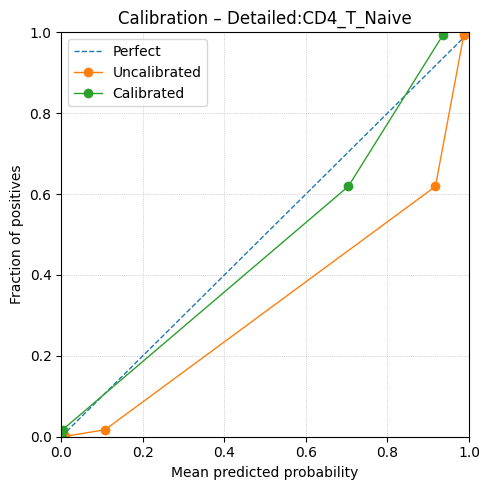

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Hao/Models/Detailed_CD4_T_Naive/Detailed_CD4_T_Naive_bundle.joblib

CD4_T_Naive
               precision    recall  f1-score   support

           0       0.97      0.99      0.98      3502
           1       0.99      0.97      0.98      3502

    accuracy                           0.98      7004
   macro avg       0.98      0.98      0.98      7004
weighted avg       0.98      0.98      0.98      7004


Processing CD8_T_Memory (class 8/23)...
Training - Found 20952 / 20952 barcodes
Training - Pos: 10476, Neg: 10476
Training labels: 10476 pos, 10476 neg
Testing  - Found 5820 / 5820 barcodes
Testing  - Pos: 2910, Neg: 2910
Testing  - labels: 2910 pos, 2910 neg
Calibrating - Found 12894 rows | Pos: 1164, Neg: 11730
All test data: 32231 rows, positives for CD8_T_Memory: 2910
[scale] CD8_T_Memory: train mean ~ -0.000, std ~ 1.000

[NB] tr

Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.



[KNN] training → CD8_T_Memory
Fitting 10 folds for each of 10 candidates, totalling 100 fits

[MLP] training → CD8_T_Memory
Fitting 10 folds for each of 10 candidates, totalling 100 fits
[CAL] CD8_T_Memory: cal positives=1164/12894

Calibration metrics:
   Uncalibrated  |  Brier: 0.0241   LogLoss: 0.0871
     Calibrated  |  Brier: 0.0139   LogLoss: 0.0492


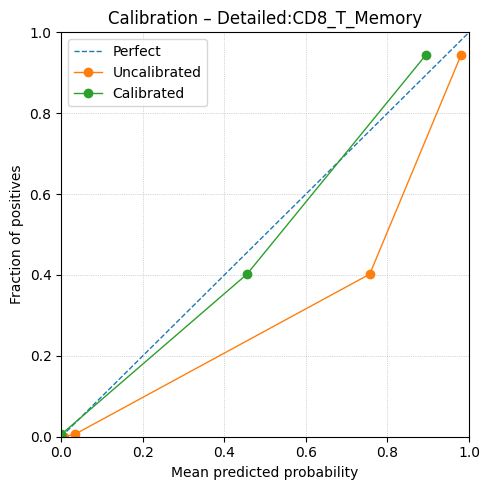

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Hao/Models/Detailed_CD8_T_Memory/Detailed_CD8_T_Memory_bundle.joblib

CD8_T_Memory
               precision    recall  f1-score   support

           0       0.96      0.98      0.97      2910
           1       0.98      0.96      0.97      2910

    accuracy                           0.97      5820
   macro avg       0.97      0.97      0.97      5820
weighted avg       0.97      0.97      0.97      5820


Processing CD8_T_Naive (class 9/23)...
Training - Found 15854 / 15854 barcodes
Training - Pos: 7927, Neg: 7927
Training labels: 7927 pos, 7927 neg
Testing  - Found 4404 / 4404 barcodes
Testing  - Pos: 2202, Neg: 2202
Testing  - labels: 2202 pos, 2202 neg
Calibrating - Found 12894 rows | Pos: 881, Neg: 12013
All test data: 32231 rows, positives for CD8_T_Naive: 2202
[scale] CD8_T_Naive: train mean ~ -0.000, std ~ 1.000

[NB] trainin

Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.



[KNN] training → CD8_T_Naive
Fitting 10 folds for each of 10 candidates, totalling 100 fits


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.



[MLP] training → CD8_T_Naive
Fitting 10 folds for each of 10 candidates, totalling 100 fits
[CAL] CD8_T_Naive: cal positives=881/12894

Calibration metrics:
   Uncalibrated  |  Brier: 0.0204   LogLoss: 0.0718
     Calibrated  |  Brier: 0.0091   LogLoss: 0.0333


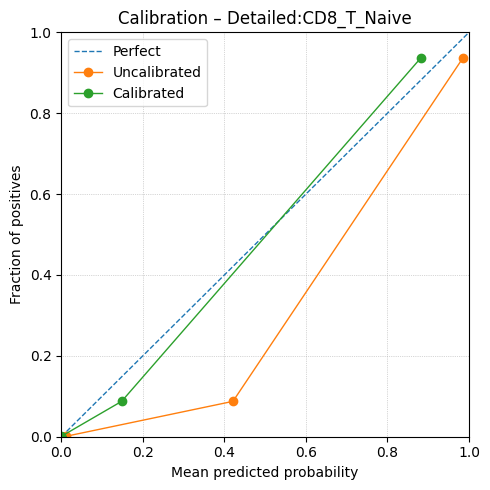

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Hao/Models/Detailed_CD8_T_Naive/Detailed_CD8_T_Naive_bundle.joblib

CD8_T_Naive
               precision    recall  f1-score   support

           0       0.97      0.99      0.98      2202
           1       0.99      0.97      0.98      2202

    accuracy                           0.98      4404
   macro avg       0.98      0.98      0.98      4404
weighted avg       0.98      0.98      0.98      4404


Processing Erythroblast (class 10/23)...
Training - Found 110 / 110 barcodes
Training - Pos: 55, Neg: 55
Training labels: 55 pos, 55 neg
Testing  - Found 30 / 30 barcodes
Testing  - Pos: 15, Neg: 15
Testing  - labels: 15 pos, 15 neg
Calibrating - Found 12894 rows | Pos: 6, Neg: 12888
All test data: 32231 rows, positives for Erythroblast: 15
[scale] Erythroblast: train mean ~ 0.000, std ~ 1.000

[NB] training → Erythroblast
Fitting 10 

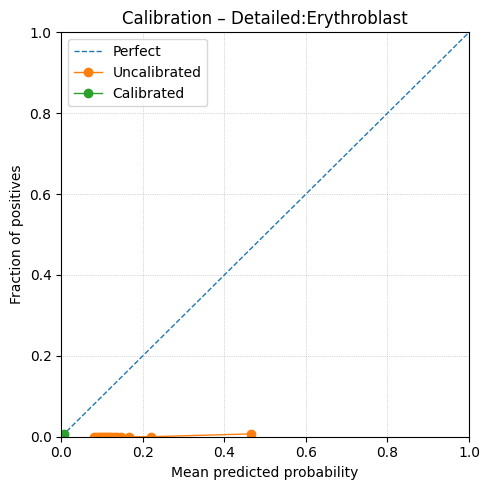

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Hao/Models/Detailed_Erythroblast/Detailed_Erythroblast_bundle.joblib

Erythroblast
               precision    recall  f1-score   support

           0       0.65      1.00      0.79        15
           1       1.00      0.47      0.64        15

    accuracy                           0.73        30
   macro avg       0.83      0.73      0.71        30
weighted avg       0.83      0.73      0.71        30


Processing HSC_MPP (class 11/23)...
Training - Found 472 / 472 barcodes
Training - Pos: 236, Neg: 236
Training labels: 236 pos, 236 neg
Testing  - Found 132 / 132 barcodes
Testing  - Pos: 66, Neg: 66
Testing  - labels: 66 pos, 66 neg
Calibrating - Found 12894 rows | Pos: 26, Neg: 12868
All test data: 32231 rows, positives for HSC_MPP: 66
[scale] HSC_MPP: train mean ~ -0.000, std ~ 1.000

[NB] training → HSC_MPP
Fitting 10 folds for

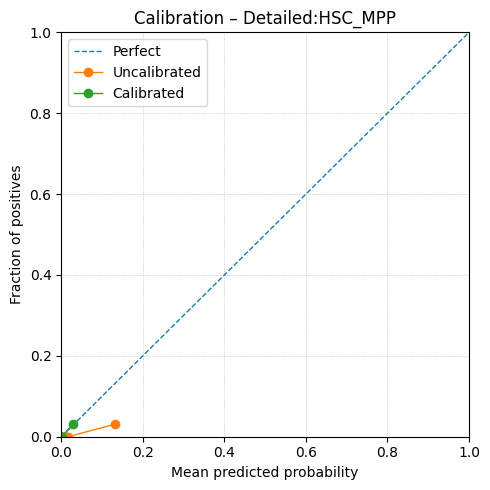

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Hao/Models/Detailed_HSC_MPP/Detailed_HSC_MPP_bundle.joblib

HSC_MPP
               precision    recall  f1-score   support

           0       0.99      1.00      0.99        66
           1       1.00      0.98      0.99        66

    accuracy                           0.99       132
   macro avg       0.99      0.99      0.99       132
weighted avg       0.99      0.99      0.99       132


Processing Immature_B (class 12/23)...
Training - Found 960 / 960 barcodes
Training - Pos: 480, Neg: 480
Training labels: 480 pos, 480 neg
Testing  - Found 266 / 266 barcodes
Testing  - Pos: 133, Neg: 133
Testing  - labels: 133 pos, 133 neg
Calibrating - Found 12894 rows | Pos: 53, Neg: 12841
All test data: 32231 rows, positives for Immature_B: 133
[scale] Immature_B: train mean ~ -0.000, std ~ 1.000

[NB] training → Immature_B
Fitting 10 folds f

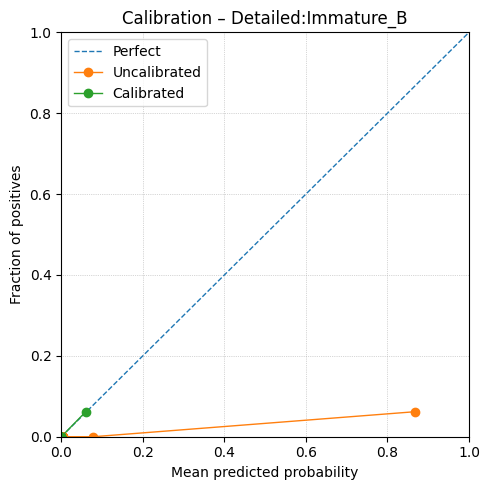

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Hao/Models/Detailed_Immature_B/Detailed_Immature_B_bundle.joblib

Immature_B
               precision    recall  f1-score   support

           0       0.50      1.00      0.67       133
           1       0.00      0.00      0.00       133

    accuracy                           0.50       266
   macro avg       0.25      0.50      0.33       266
weighted avg       0.25      0.50      0.33       266


Processing MAIT (class 13/23)...
Training - Found 4028 / 4028 barcodes
Training - Pos: 2014, Neg: 2014
Training labels: 2014 pos, 2014 neg
Testing  - Found 1120 / 1120 barcodes
Testing  - Pos: 560, Neg: 560
Testing  - labels: 560 pos, 560 neg
Calibrating - Found 12894 rows | Pos: 224, Neg: 12670
All test data: 32231 rows, positives for MAIT: 560
[scale] MAIT: train mean ~ -0.000, std ~ 1.000

[NB] training → MAIT
Fitting 10 folds for eac

Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.



[KNN] training → MAIT
Fitting 10 folds for each of 10 candidates, totalling 100 fits

[MLP] training → MAIT
Fitting 10 folds for each of 10 candidates, totalling 100 fits
[CAL] MAIT: cal positives=224/12894

Calibration metrics:
   Uncalibrated  |  Brier: 0.0329   LogLoss: 0.1125
     Calibrated  |  Brier: 0.0071   LogLoss: 0.0241


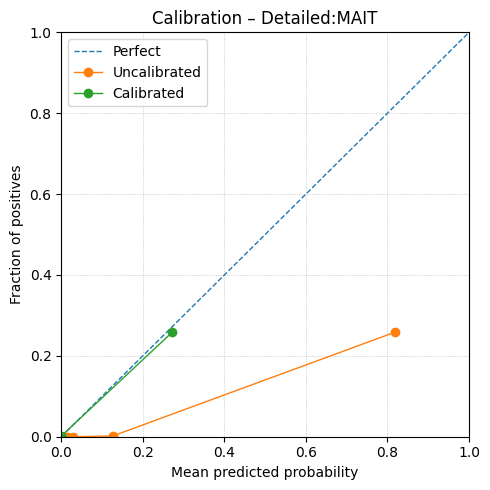

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Hao/Models/Detailed_MAIT/Detailed_MAIT_bundle.joblib

MAIT
               precision    recall  f1-score   support

           0       0.81      1.00      0.89       560
           1       1.00      0.76      0.87       560

    accuracy                           0.88      1120
   macro avg       0.90      0.88      0.88      1120
weighted avg       0.90      0.88      0.88      1120


Processing NK_CD56_bright (class 14/23)...
Training - Found 2960 / 2960 barcodes
Training - Pos: 1480, Neg: 1480
Training labels: 1480 pos, 1480 neg
Testing  - Found 822 / 822 barcodes
Testing  - Pos: 411, Neg: 411
Testing  - labels: 411 pos, 411 neg
Calibrating - Found 12894 rows | Pos: 165, Neg: 12729
All test data: 32231 rows, positives for NK_CD56_bright: 411
[scale] NK_CD56_bright: train mean ~ -0.000, std ~ 1.000

[NB] training → NK_CD56_bright
Fitt

Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.



[KNN] training → NK_CD56_bright
Fitting 10 folds for each of 10 candidates, totalling 100 fits

[MLP] training → NK_CD56_bright
Fitting 10 folds for each of 10 candidates, totalling 100 fits
[CAL] NK_CD56_bright: cal positives=165/12894

Calibration metrics:
   Uncalibrated  |  Brier: 0.0246   LogLoss: 0.0870
     Calibrated  |  Brier: 0.0041   LogLoss: 0.0139


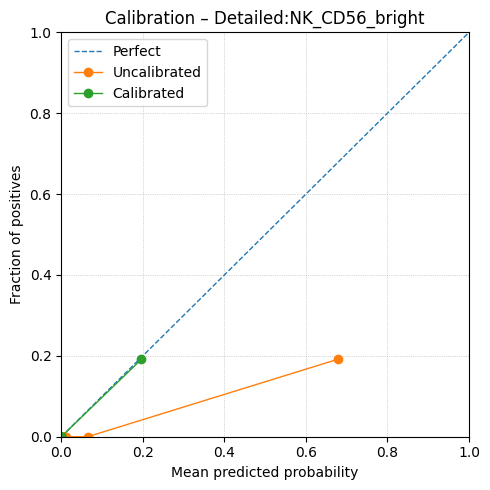

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Hao/Models/Detailed_NK_CD56_bright/Detailed_NK_CD56_bright_bundle.joblib

NK_CD56_bright
               precision    recall  f1-score   support

           0       0.89      1.00      0.94       411
           1       1.00      0.87      0.93       411

    accuracy                           0.94       822
   macro avg       0.94      0.94      0.94       822
weighted avg       0.94      0.94      0.94       822


Processing NK_CD56_dim (class 15/23)...
Training - Found 23908 / 23908 barcodes
Training - Pos: 11954, Neg: 11954
Training labels: 11954 pos, 11954 neg
Testing  - Found 6640 / 6640 barcodes
Testing  - Pos: 3320, Neg: 3320
Testing  - labels: 3320 pos, 3320 neg
Calibrating - Found 12894 rows | Pos: 1328, Neg: 11566
All test data: 32231 rows, positives for NK_CD56_dim: 3320
[scale] NK_CD56_dim: train mean ~ 0.000, std ~ 1.000

[

Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.



[KNN] training → NK_CD56_dim
Fitting 10 folds for each of 10 candidates, totalling 100 fits


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.



[MLP] training → NK_CD56_dim
Fitting 10 folds for each of 10 candidates, totalling 100 fits


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


[CAL] NK_CD56_dim: cal positives=1328/12894

Calibration metrics:
   Uncalibrated  |  Brier: 0.0050   LogLoss: 0.0236
     Calibrated  |  Brier: 0.0034   LogLoss: 0.0154


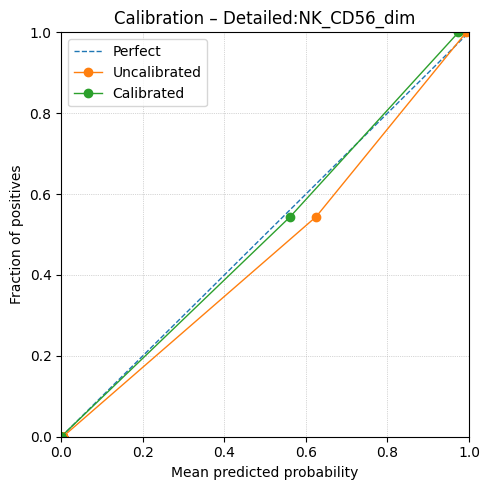

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Hao/Models/Detailed_NK_CD56_dim/Detailed_NK_CD56_dim_bundle.joblib

NK_CD56_dim
               precision    recall  f1-score   support

           0       0.99      1.00      0.99      3320
           1       1.00      0.99      0.99      3320

    accuracy                           0.99      6640
   macro avg       0.99      0.99      0.99      6640
weighted avg       0.99      0.99      0.99      6640


Processing Plasma (class 16/23)...
Training - Found 526 / 526 barcodes
Training - Pos: 263, Neg: 263
Training labels: 263 pos, 263 neg
Testing  - Found 146 / 146 barcodes
Testing  - Pos: 73, Neg: 73
Testing  - labels: 73 pos, 73 neg
Calibrating - Found 12894 rows | Pos: 29, Neg: 12865
All test data: 32231 rows, positives for Plasma: 73
[scale] Plasma: train mean ~ -0.000, std ~ 1.000

[NB] training → Plasma
Fitting 10 folds for each o

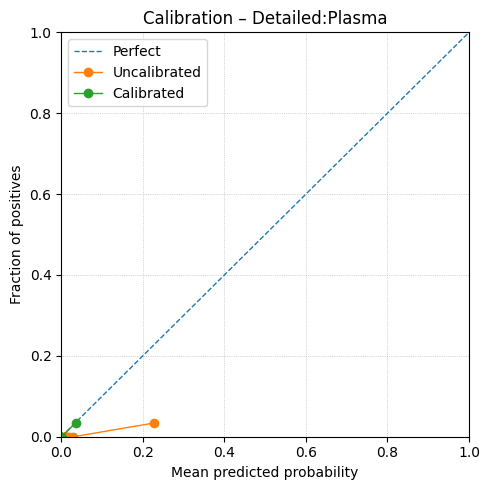

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Hao/Models/Detailed_Plasma/Detailed_Plasma_bundle.joblib

Plasma
               precision    recall  f1-score   support

           0       1.00      1.00      1.00        73
           1       1.00      1.00      1.00        73

    accuracy                           1.00       146
   macro avg       1.00      1.00      1.00       146
weighted avg       1.00      1.00      1.00       146


Processing Platelet (class 17/23)...
Training - Found 3214 / 3214 barcodes
Training - Pos: 1607, Neg: 1607
Training labels: 1607 pos, 1607 neg
Testing  - Found 894 / 894 barcodes
Testing  - Pos: 447, Neg: 447
Testing  - labels: 447 pos, 447 neg
Calibrating - Found 12894 rows | Pos: 179, Neg: 12715
All test data: 32231 rows, positives for Platelet: 447
[scale] Platelet: train mean ~ 0.000, std ~ 1.000

[NB] training → Platelet
Fitting 10 folds for ea

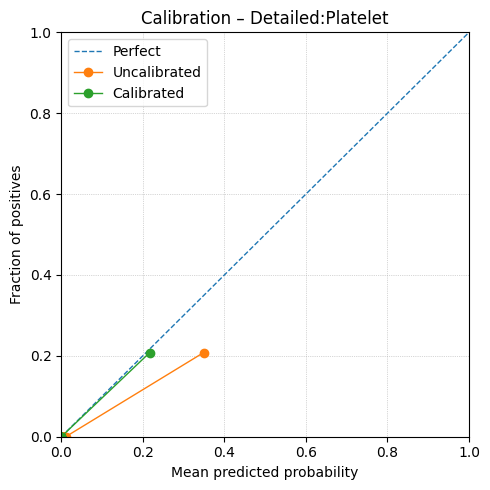

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Hao/Models/Detailed_Platelet/Detailed_Platelet_bundle.joblib

Platelet
               precision    recall  f1-score   support

           0       0.99      1.00      1.00       447
           1       1.00      0.99      1.00       447

    accuracy                           1.00       894
   macro avg       1.00      1.00      1.00       894
weighted avg       1.00      1.00      1.00       894


Processing Pre-B (class 18/23)...
Training - Found 586 / 586 barcodes
Training - Pos: 293, Neg: 293
Training labels: 293 pos, 293 neg
Testing  - Found 162 / 162 barcodes
Testing  - Pos: 81, Neg: 81
Testing  - labels: 81 pos, 81 neg
Calibrating - Found 12894 rows | Pos: 33, Neg: 12861
All test data: 32231 rows, positives for Pre-B: 81
[scale] Pre-B: train mean ~ 0.000, std ~ 1.000

[NB] training → Pre-B
Fitting 10 folds for each of 10 candidate

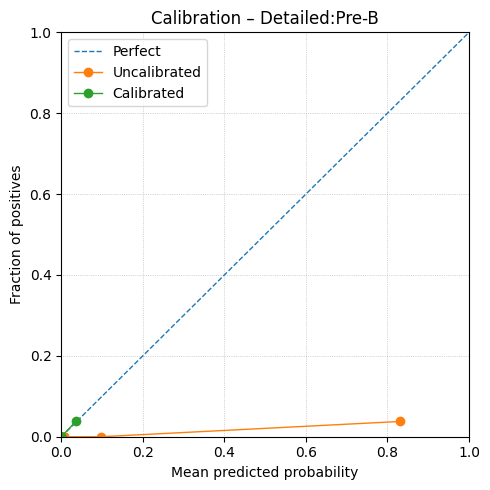

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Hao/Models/Detailed_Pre-B/Detailed_Pre-B_bundle.joblib

Pre-B
               precision    recall  f1-score   support

           0       0.50      1.00      0.67        81
           1       0.00      0.00      0.00        81

    accuracy                           0.50       162
   macro avg       0.25      0.50      0.33       162
weighted avg       0.25      0.50      0.33       162


Processing Treg (class 19/23)...
Training - Found 3610 / 3610 barcodes
Training - Pos: 1805, Neg: 1805
Training labels: 1805 pos, 1805 neg
Testing  - Found 1004 / 1004 barcodes
Testing  - Pos: 502, Neg: 502
Testing  - labels: 502 pos, 502 neg
Calibrating - Found 12894 rows | Pos: 201, Neg: 12693
All test data: 32231 rows, positives for Treg: 502
[scale] Treg: train mean ~ 0.000, std ~ 1.000

[NB] training → Treg
Fitting 10 folds for each of 10 candidat

Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.



[KNN] training → Treg
Fitting 10 folds for each of 10 candidates, totalling 100 fits


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.



[MLP] training → Treg
Fitting 10 folds for each of 10 candidates, totalling 100 fits
[CAL] Treg: cal positives=201/12894

Calibration metrics:
   Uncalibrated  |  Brier: 0.0468   LogLoss: 0.1526
     Calibrated  |  Brier: 0.0050   LogLoss: 0.0188


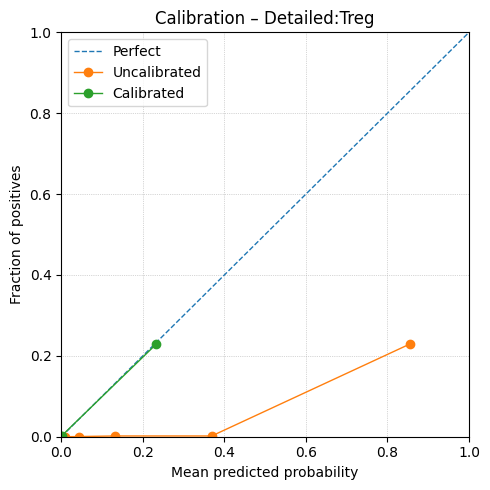

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Hao/Models/Detailed_Treg/Detailed_Treg_bundle.joblib

Treg
               precision    recall  f1-score   support

           0       0.87      0.99      0.93       502
           1       0.99      0.85      0.92       502

    accuracy                           0.92      1004
   macro avg       0.93      0.92      0.92      1004
weighted avg       0.93      0.92      0.92      1004


Processing cDC1 (class 20/23)...
Training - Found 220 / 220 barcodes
Training - Pos: 110, Neg: 110
Training labels: 110 pos, 110 neg
Testing  - Found 62 / 62 barcodes
Testing  - Pos: 31, Neg: 31
Testing  - labels: 31 pos, 31 neg
Calibrating - Found 12894 rows | Pos: 12, Neg: 12882
All test data: 32231 rows, positives for cDC1: 31
[scale] cDC1: train mean ~ 0.000, std ~ 1.000

[NB] training → cDC1
Fitting 10 folds for each of 10 candidates, totalling 100 f

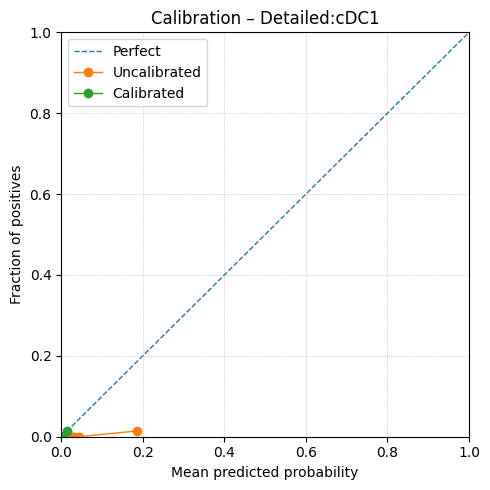

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Hao/Models/Detailed_cDC1/Detailed_cDC1_bundle.joblib

cDC1
               precision    recall  f1-score   support

           0       1.00      1.00      1.00        31
           1       1.00      1.00      1.00        31

    accuracy                           1.00        62
   macro avg       1.00      1.00      1.00        62
weighted avg       1.00      1.00      1.00        62


Processing cDC2 (class 21/23)...
Training - Found 4230 / 4230 barcodes
Training - Pos: 2115, Neg: 2115
Training labels: 2115 pos, 2115 neg
Testing  - Found 1174 / 1174 barcodes
Testing  - Pos: 587, Neg: 587
Testing  - labels: 587 pos, 587 neg
Calibrating - Found 12894 rows | Pos: 235, Neg: 12659
All test data: 32231 rows, positives for cDC2: 587
[scale] cDC2: train mean ~ 0.000, std ~ 1.000

[NB] training → cDC2
Fitting 10 folds for each of 10 candidates,

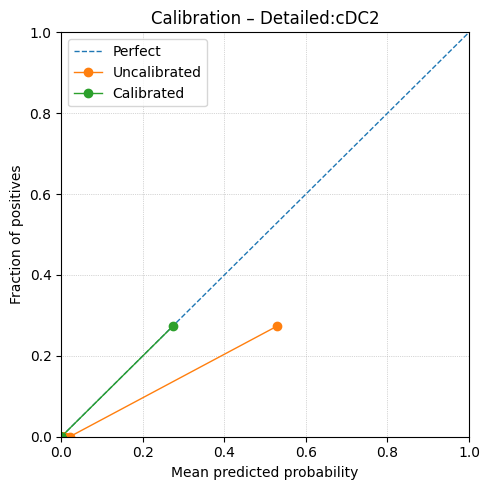

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Hao/Models/Detailed_cDC2/Detailed_cDC2_bundle.joblib

cDC2
               precision    recall  f1-score   support

           0       0.98      1.00      0.99       587
           1       1.00      0.98      0.99       587

    accuracy                           0.99      1174
   macro avg       0.99      0.99      0.99      1174
weighted avg       0.99      0.99      0.99      1174


Processing gdT (class 22/23)...
Training - Found 5190 / 5190 barcodes
Training - Pos: 2595, Neg: 2595
Training labels: 2595 pos, 2595 neg
Testing  - Found 1442 / 1442 barcodes
Testing  - Pos: 721, Neg: 721
Testing  - labels: 721 pos, 721 neg
Calibrating - Found 12894 rows | Pos: 288, Neg: 12606
All test data: 32231 rows, positives for gdT: 721
[scale] gdT: train mean ~ 0.000, std ~ 1.000

[NB] training → gdT
Fitting 10 folds for each of 10 candidates, tot

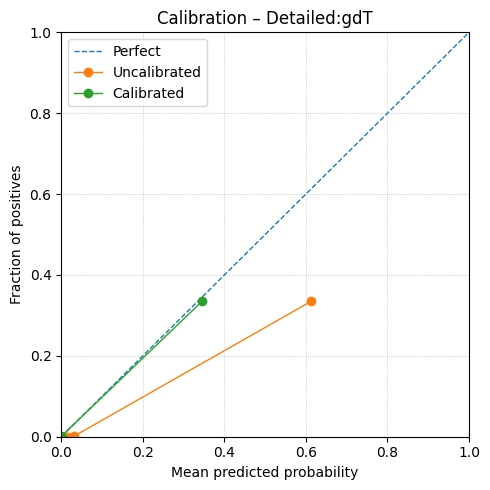

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Hao/Models/Detailed_gdT/Detailed_gdT_bundle.joblib

gdT
               precision    recall  f1-score   support

           0       0.96      0.99      0.98       721
           1       0.99      0.96      0.98       721

    accuracy                           0.98      1442
   macro avg       0.98      0.98      0.98      1442
weighted avg       0.98      0.98      0.98      1442


Processing pDC (class 23/23)...
Training - Found 1292 / 1292 barcodes
Training - Pos: 646, Neg: 646
Training labels: 646 pos, 646 neg
Testing  - Found 358 / 358 barcodes
Testing  - Pos: 179, Neg: 179
Testing  - labels: 179 pos, 179 neg
Calibrating - Found 12894 rows | Pos: 72, Neg: 12822
All test data: 32231 rows, positives for pDC: 179
[scale] pDC: train mean ~ 0.000, std ~ 1.000

[NB] training → pDC
Fitting 10 folds for each of 10 candidates, totalling 100

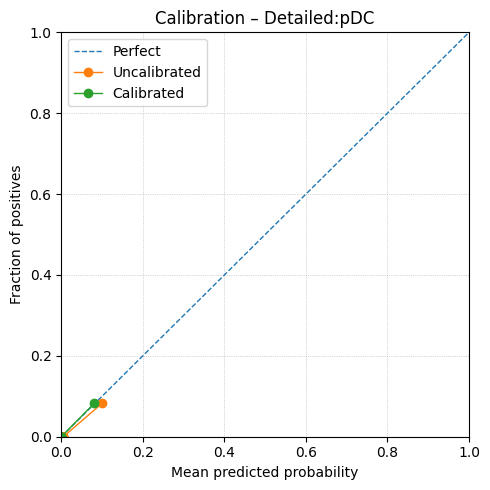

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Hao/Models/Detailed_pDC/Detailed_pDC_bundle.joblib

pDC
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       179
           1       1.00      1.00      1.00       179

    accuracy                           1.00       358
   macro avg       1.00      1.00      1.00       358
weighted avg       1.00      1.00      1.00       358


Fitting multiclass TemperatureScaling on CAL split (excluded classes masked out)...

Preview of probabilities BEFORE (raw OvR) vs AFTER (multiclass TS) [included classes only]:
                     raw_B_Memory   raw_B_Naive  raw_CD14_Mono  raw_CD16_Mono   raw_CD4_CTL  raw_CD4_T_Memory  raw_CD4_T_Naive  raw_CD8_T_Memory  raw_CD8_T_Naive  raw_Erythroblast  raw_HSC_MPP  raw_Immature_B      raw_MAIT  raw_NK_CD56_bright  raw_NK_CD56_dim  raw_Plasma  raw_Platelet

In [123]:
# -*- coding: utf-8 -*-
from pathlib import Path
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.ensemble import StackingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.calibration import CalibratedClassifierCV
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report, confusion_matrix

from netcal.scaling import TemperatureScaling
import joblib

# ------------------------------------------------------------------- CONFIG (expects these to already exist)
#   models_output, train_barcodes_path, test_barcodes_path
#   Hao_data_Train, Hao_data_Test, Hao_data_Cal          (DataFrames indexed by barcode)
#   Hao_dataset_Train, Hao_dataset_Test, Hao_dataset_Cal (AnnData with obs labels)
#   TotalSeqD_Heme_Oncology_CAT399906                    (iterable of feature names)
#   MLTraining module with: CV, train_NB, train_XGB, train_KNN, train_MLP,
#                           plot_calibration_curve, save_models, evaluate_classifier, append_metrics_csv

name_target_class = "Detailed"   # "detailed" | "detailed" | "Detailed"
fig_root   = Path(models_output) / "Figures"
models_dir = Path(models_output) / "Models"
fig_root.mkdir(parents=True, exist_ok=True)
models_dir.mkdir(parents=True, exist_ok=True)

kf         = MLTraining.CV
num_cores  = -1
metrics_log = []

# ============================= HELPERS =============================

def _norm_feats(names) -> pd.Index:
    """
    Normalizer used ONLY to construct matching keys.
    Panel names remain untouched; data columns are normalized and then mapped BACK
    to the exact panel names via a lookup.
    """
    s = pd.Index(map(str, names))
    s = (s.str.strip()
           .str.lower()
           .str.replace(r"[ _/]+", "-", regex=True)
           .str.replace(r"-+", "-", regex=True)
           .str.strip("-"))
    return s

def attach_celltype(df: pd.DataFrame, ad: "AnnData", field: str) -> pd.DataFrame:
    if field not in ad.obs:
        raise KeyError(f"'{field}' not found in AnnData.obs")
    lab = (ad.obs[field]
             .astype("string")
             .str.strip()
             .str.replace(r"\s+", "_", regex=True))
    out = df.copy()
    out["Celltype"] = pd.Categorical(lab.reindex(out.index))
    if out["Celltype"].isna().any():
        missing = int(out["Celltype"].isna().sum())
        print(f"[WARN] {missing} rows got NaN Celltype after reindex; check barcode alignment.")
    return out

def _check_finite(df: pd.DataFrame, tag: str):
    arr = df.to_numpy()
    if not np.isfinite(arr).all():
        bad = np.where(~np.isfinite(arr))
        raise ValueError(f"Non-finite values found in {tag} features at positions {bad}")

def _unwrap_estimator(m):
    return getattr(m, "estimator", None) or getattr(m, "base_estimator", None) or m

def _assert_feature_counts(cell_name: str, models_dict: dict, expected: int):
    pairs = [
        ("NB",  models_dict.get("NB")),
        ("XGB", models_dict.get("XGB")),
        ("KNN", models_dict.get("KNN")),
        ("MLP", models_dict.get("MLP")),
        ("Stacker", models_dict.get("Stacker")),
    ]
    for name, est in pairs:
        if est is None:
            continue
        base = _unwrap_estimator(est)
        nfi = getattr(base, "n_features_in_", None)
        if nfi is not None and nfi != expected:
            raise RuntimeError(f"{cell_name}:{name} saw {nfi} features; expected {expected}")

# ============================= LABEL ATTACH =============================

consensus_field = f"Consensus_annotation_{name_target_class.lower()}_final"

Hao_data_Train = attach_celltype(Hao_data_Train, Hao_dataset_Train, consensus_field)
Hao_data_Test  = attach_celltype(Hao_data_Test,  Hao_dataset_Test,  consensus_field)
Hao_data_Cal   = attach_celltype(Hao_data_Cal,   Hao_dataset_Cal,   consensus_field)

# ============================= PANEL & DATA COLUMN ALIGNMENT =============================

# Keep the panel EXACTLY as provided
panel = pd.Index(map(str, TotalSeqD_Heme_Oncology_CAT399906))

# Build a mapping: normalized_key -> exact panel name
panel_keys    = _norm_feats(panel)
norm_to_panel = dict(zip(panel_keys, panel))
if len(norm_to_panel) != len(panel):
    raise ValueError("Panel contains names that collide after normalization. Consider adjusting _norm_feats rules.")

def _rename_data_to_panel(df: pd.DataFrame) -> pd.DataFrame:
    """
    Rename only feature columns so that after normalization they map
    back to the exact panel column names. Keeps 'cell_barcode' and 'Celltype' intact.
    """
    df = df.copy()
    non_feat = [c for c in ["cell_barcode", "Celltype"] if c in df.columns]
    feat     = pd.Index([c for c in df.columns if c not in non_feat])

    feat_keys   = _norm_feats(feat)
    mapped      = [norm_to_panel.get(k) for k in feat_keys]  # None if not in panel
    rename_map  = {old: new for old, new in zip(feat, mapped) if new is not None}

    # Handle duplicate mappings (two data columns → same panel col). Keep first, drop the rest.
    seen, safe_map, drops = set(), {}, []
    for old, new in rename_map.items():
        if new in seen:
            drops.append(old)
        else:
            seen.add(new); safe_map[old] = new

    if drops:
        print(f"[WARN] Dropping {len(drops)} duplicated-mapped columns (showing up to 5): {drops[:5]}")

    if drops:
        df.drop(columns=drops, inplace=True, errors="ignore")
    df.rename(columns=safe_map, inplace=True)

    matched = len(safe_map)
    print(f"[map] matched {matched}/{len(feat)} data columns to panel")
    return df

# Apply: normalize/rename ONLY data splits (panel remains untouched)
Hao_data_Train = _rename_data_to_panel(Hao_data_Train)
Hao_data_Test  = _rename_data_to_panel(Hao_data_Test)
Hao_data_Cal   = _rename_data_to_panel(Hao_data_Cal)

# Intersect each split with the panel IN PANEL ORDER
def _panel_intersection(df: pd.DataFrame) -> pd.DataFrame:
    non_feat = [c for c in ["cell_barcode", "Celltype"] if c in df.columns]
    feat_cols = pd.Index([c for c in df.columns if c not in non_feat])
    inter = panel.intersection(feat_cols, sort=False)
    if inter.empty:
        raise ValueError("Panel/Data intersection is empty after renaming. Check mapping rules.")
    return df.reindex(columns=list(inter) + non_feat)

Hao_data_Train = _panel_intersection(Hao_data_Train)
Hao_data_Test  = _panel_intersection(Hao_data_Test)
Hao_data_Cal   = _panel_intersection(Hao_data_Cal)

# ============================= FEATURES & LABELS =============================

Hao_data_Cal_lbl = Hao_data_Cal[["Celltype"]].copy()

drop_cols_train = [c for c in ["cell_barcode", "Celltype"] if c in Hao_data_Train.columns]
drop_cols_test  = [c for c in ["cell_barcode", "Celltype"] if c in Hao_data_Test.columns]
drop_cols_cal   = [c for c in ["cell_barcode", "Celltype"] if c in Hao_data_Cal.columns]

Hao_data_Train_Sub = Hao_data_Train.drop(columns=drop_cols_train, errors="ignore")
Hao_data_Test_Sub  = Hao_data_Test.drop(columns=drop_cols_test,  errors="ignore")
Hao_data_Cal_Sub   = Hao_data_Cal.drop(columns=drop_cols_cal,    errors="ignore")

# SAFETY: shared columns & finiteness checks
cols_train = list(Hao_data_Train_Sub.columns)
if list(Hao_data_Test_Sub.columns) != cols_train or list(Hao_data_Cal_Sub.columns) != cols_train:
    raise ValueError("Train/Cal/Test feature columns differ after panel intersection!")

_check_finite(Hao_data_Train_Sub, "TRAIN")
_check_finite(Hao_data_Test_Sub,  "TEST")
_check_finite(Hao_data_Cal_Sub,   "CAL")

print(f"\n[features] Using {len(cols_train)} panel-intersected features (exact panel names):")
print(cols_train)

# ===== Exclude specific classes from the multiclass set and per-class loop =====
EXCLUDE_CLASSES = {"Macrophage", "ILC", "Stroma", "dnT"}

all_classes = sorted(pd.Series(Hao_data_Train["Celltype"]).dropna().unique())
class_names = [c for c in all_classes if c not in EXCLUDE_CLASSES]
if not class_names:
    raise ValueError("After exclusions, class_names is empty.")
print(f"[classes] Included ({len(class_names)}): {class_names}")
if missing := [c for c in all_classes if c in EXCLUDE_CLASSES]:
    print(f"[classes] Excluded: {missing}")

K            = len(class_names)
class_to_idx = {c: i for i, c in enumerate(class_names)}

# --- Multiclass labels (MASKED to included classes) ---
# CAL
mask_cal_mc = Hao_data_Cal_lbl["Celltype"].isin(class_names)
s_cal = Hao_data_Cal_lbl.loc[mask_cal_mc, "Celltype"].map(class_to_idx)
if s_cal.isna().any():
    missing = Hao_data_Cal_lbl.loc[mask_cal_mc & s_cal.isna(), "Celltype"].unique()
    raise ValueError(f"Unknown labels in masked CAL split: {missing}")
y_cal_multiclass = s_cal.to_numpy(dtype=np.int64)

# TEST
mask_test_mc = Hao_data_Test["Celltype"].isin(class_names)
s_te = Hao_data_Test.loc[mask_test_mc, "Celltype"].map(class_to_idx)
if s_te.isna().any():
    missing = Hao_data_Test.loc[mask_test_mc & s_te.isna(), "Celltype"].unique()
    raise ValueError(f"Unknown labels in masked TEST split: {missing}")
y_test_multiclass = s_te.to_numpy(dtype=np.int64)

# Reuse across classes
X_cal_all_df = Hao_data_Cal_Sub.copy()
X_te_all_df  = Hao_data_Test_Sub.copy()

# Preallocate OvR prob mats (only for included classes)
P_cal = np.zeros((X_cal_all_df.shape[0], K), dtype=float)
P_te  = np.zeros((X_te_all_df.shape[0],  K), dtype=float)

test_index = Hao_data_Test_Sub.index

# ============================= TRAIN PER-CLASS OVR =============================

for celltype in class_names:
    k = class_to_idx[celltype]
    name = str(celltype).replace(" ", "_")
    print(f"\nProcessing {name} (class {k+1}/{K})...")

    # ---- TRAIN slice via barcode lists
    train_barcodes_df = pd.read_csv(
        f"{train_barcodes_path}/Hao/Consensus_annotation_detailed_final/Barcodes_training_class_{name}.csv",
        index_col=0
    )
    train_positive_barcodes = train_barcodes_df["Positive"].dropna().values
    train_negative_barcodes = train_barcodes_df["Negative"].dropna().values
    all_train_barcodes = np.concatenate([train_positive_barcodes, train_negative_barcodes])

    train_mask = Hao_data_Train_Sub.index.isin(all_train_barcodes)
    X_tr_df = Hao_data_Train_Sub.loc[train_mask]
    found_train_barcodes = X_tr_df.index.values
    y_tr = np.isin(found_train_barcodes, train_positive_barcodes).astype(int)

    # ---- Skip guards
    if X_tr_df.empty or np.unique(y_tr).size < 2:
        print(f"[SKIP] {name}: empty or single-class train slice (pos={y_tr.sum()}, neg={(len(y_tr)-y_tr.sum())}).")
        continue

    # ---- TEST slice via barcode lists
    test_barcodes_df = pd.read_csv(
        f"{test_barcodes_path}/Hao/Consensus_annotation_detailed_final/Barcodes_testing_class_{name}.csv",
        index_col=0
    )
    test_positive_barcodes = test_barcodes_df["Positive"].dropna().values
    test_negative_barcodes = test_barcodes_df["Negative"].dropna().values
    all_test_barcodes = np.concatenate([test_positive_barcodes, test_negative_barcodes])

    test_mask = Hao_data_Test_Sub.index.isin(all_test_barcodes)
    X_te_df = Hao_data_Test_Sub.loc[test_mask]
    found_test_barcodes = X_te_df.index.values
    y_te = np.isin(found_test_barcodes, test_positive_barcodes).astype(int)

    # ---- Full-test & cal for this binary head
    X_te_all_local = X_te_all_df.copy()
    y_te_all = (Hao_data_Test["Celltype"].values == celltype).astype(int)
    X_cal_df = X_cal_all_df.copy()
    y_cal_bin = (Hao_data_Cal_lbl["Celltype"].values == celltype).astype(int)

    # ---- Info
    print(f"Training - Found {X_tr_df.shape[0]} / {len(all_train_barcodes)} barcodes")
    print(f"Training - Pos: {len(train_positive_barcodes)}, Neg: {len(train_negative_barcodes)}")
    print(f"Training labels: {y_tr.sum()} pos, {len(y_tr)-y_tr.sum()} neg")
    print(f"Testing  - Found {X_te_df.shape[0]} / {len(all_test_barcodes)} barcodes")
    print(f"Testing  - Pos: {len(test_positive_barcodes)}, Neg: {len(test_negative_barcodes)}")
    print(f"Testing  - labels: {y_te.sum()} pos, {len(y_te)-y_te.sum()} neg")
    print(f"Calibrating - Found {X_cal_df.shape[0]} rows | Pos: {y_cal_bin.sum()}, Neg: {len(y_cal_bin)-y_cal_bin.sum()}")
    print(f"All test data: {X_te_all_local.shape[0]} rows, positives for {celltype}: {y_te_all.sum()}")

    # ---- Scaling (fit on per-head TRAIN slice; transform others)
    scaler = StandardScaler(with_mean=True, with_std=True).fit(X_tr_df.values)

    def _sc(df):
        return pd.DataFrame(
            scaler.transform(df.values),
            index=df.index,
            columns=cols_train,
        )

    X_tr_sc_df     = _sc(X_tr_df)
    X_te_sc_df     = _sc(X_te_df)
    X_te_all_sc_df = _sc(X_te_all_local)
    X_cal_sc_df    = _sc(X_cal_df)

    print(f"[scale] {name}: train mean ~ {X_tr_sc_df.values.mean():.3f}, std ~ {X_tr_sc_df.values.std():.3f}")

    # ---- Base learners
    NB_model  = MLTraining.train_NB (X_tr_sc_df, y_tr, cv=kf, num_cores=num_cores, name_target_subclass=name)
    XGB_model = MLTraining.train_XGB(X_tr_sc_df, y_tr, cv=kf, num_cores=num_cores, name_target_subclass=name)
    KNN_model = MLTraining.train_KNN(X_tr_sc_df, y_tr, cv=kf, num_cores=num_cores, name_target_subclass=name)
    MLP_model = MLTraining.train_MLP(X_tr_sc_df, y_tr, cv=kf, num_cores=num_cores, name_target_subclass=name)

    # ---- Stacker (raw)
    stacker_raw = StackingClassifier(
        estimators=[("NB", NB_model), ("XGB", XGB_model), ("KNN", KNN_model), ("MLP", MLP_model)],
        final_estimator=LogisticRegression(max_iter=2000, class_weight="balanced", random_state=42),
        stack_method="predict_proba",
        cv=kf,
        n_jobs=-1,
    ).fit(X_tr_sc_df, y_tr)

    # ---- Feature count asserts (debug safety)
    expected_feats = len(cols_train)
    _assert_feature_counts(name, {
        "NB": NB_model, "XGB": XGB_model, "KNN": KNN_model, "MLP": MLP_model, "Stacker": stacker_raw
    }, expected_feats)

    # ---- Binary calibration (Platt, guarded)
    pos_cal    = int(y_cal_bin.sum())
    n_cal_bin  = int(len(y_cal_bin))
    has_both   = (0 < pos_cal < n_cal_bin)
    print(f"[CAL] {name}: cal positives={pos_cal}/{n_cal_bin}")

    if has_both:
        try:
            calibrator = CalibratedClassifierCV(estimator=stacker_raw, method="sigmoid", cv="prefit")
        except TypeError:  # older sklearn
            calibrator = CalibratedClassifierCV(base_estimator=stacker_raw, method="sigmoid", cv="prefit")
        stacker = calibrator.fit(X_cal_sc_df, y_cal_bin)
    else:
        print(f"[WARN] Skipping calibration for {name}: single-class cal set.")
        stacker = stacker_raw

    # ---- Calibration plot on all-test (optional)
    try:
        y_proba_uncal = stacker_raw.predict_proba(X_te_all_sc_df)[:, 1]
        y_proba_cal   = stacker.predict_proba(X_te_all_sc_df)[:, 1]
        if has_both:
            _ = MLTraining.plot_calibration_curve(
                y_te_all, [y_proba_uncal, y_proba_cal],
                clf_names=["Uncalibrated", "Calibrated"],
                n_bins=15, strategy="quantile",
                title=f"Calibration – {name_target_class}:{name}"
            )
        else:
            _ = MLTraining.plot_calibration_curve(
                y_te_all, [y_proba_uncal],
                clf_names=["Uncalibrated"],
                n_bins=15, strategy="quantile",
                title=f"Calibration (uncal only) – {name_target_class}:{name}"
            )
        plt.tight_layout()
        plt.show()
    except Exception as e:
        print(f"[WARN] Skipped calibration plot for {name}: {e}")

    # ---- Save per-class bundle (model + scaler + columns)
    save_subdir = models_dir / f"{name_target_class}_{name}"
    save_subdir.mkdir(parents=True, exist_ok=True)

    MLTraining.save_models({"Stacked": stacker}, out_dir=save_subdir, tag=f"{name_target_class}_{name}")
    joblib.dump(cols_train, save_subdir / "feature_names.joblib")

    bundle = {
        "atlas": "Hao",
        "depth": name_target_class,
        "label": celltype,
        "model": stacker,          # CalibratedClassifierCV(StackingClassifier) or StackingClassifier
        "columns": cols_train,     # exact panel names, panel order
        "scaler": scaler,          # per-head scaler
        "panel_name": "TotalSeqD_Heme_Oncology_CAT399906",
    }
    bundle_path = save_subdir / f"{name_target_class}_{name}_bundle.joblib"
    joblib.dump(bundle, bundle_path)
    print(f"[SAVE] Wrote bundle with columns+scaler to {bundle_path}")

    # ---- Binary metrics on the class-specific test slice
    try:
        m = MLTraining.evaluate_classifier(stacker, X_te_sc_df, y_te, plot_cm=False)
        m.update(celltype=celltype)
        metrics_log.append(m)
        print(f"\n{celltype}\n", m.get("report", ""))
    except Exception as e:
        print(f"[WARN] Binary metrics for {name} skipped: {e}")

    # ---- Store OvR probs for multiclass calibration (columns order = class_names)
    P_cal[:, k] = stacker.predict_proba(X_cal_sc_df)[:, 1]
    P_te[:,  k] = stacker.predict_proba(X_te_all_sc_df)[:, 1]

# ============================= MULTICLASS CALIBRATION =============================

print("\nFitting multiclass TemperatureScaling on CAL split (excluded classes masked out)...")

# Guards: ensure probs are in [0,1]
if (P_cal < 0).any() or (P_cal > 1).any():
    raise ValueError("P_cal must be probabilities in [0,1].")
if (P_te < 0).any() or (P_te > 1).any():
    raise ValueError("P_te must be probabilities in [0,1].")

ts_cal = TemperatureScaling()
# Fit only on CAL rows whose true label is one of the included classes
ts_cal.fit(P_cal[mask_cal_mc.values, :], y_cal_multiclass)
P_te_mc = ts_cal.transform(P_te)

# Ensure calibrated probs shape (K)
P_te_mc = np.asarray(P_te_mc)
if P_te_mc.ndim == 1:
    P_te_mc = P_te_mc.reshape(-1, 1)
if P_te_mc.shape[1] == 1 and K == 2:
    P_te_mc = np.hstack([1.0 - P_te_mc, P_te_mc])
elif P_te_mc.shape[1] != K:
    # Fallback: normalize OvR sums
    row_sums = P_te.sum(axis=1, keepdims=True)
    row_sums[row_sums == 0.0] = 1.0
    P_te_mc = P_te / row_sums
    print(f"[WARN] TemperatureScaling returned shape {P_te_mc.shape}; fell back to sum-normalized OvR probs.")

# Persist multiclass temp scaler + INCLUDED class names
joblib.dump(ts_cal, models_dir / f"{name_target_class}_multiclass_temp_scaler.joblib")
(pd.Series(class_names, name="class_name")
   .to_csv(models_dir / f"{name_target_class}_class_names.csv", index=False))

# ============================= PROBS COMPARISON & METRICS =============================

# Evaluate & save on TEST rows whose true label is an INCLUDED class
test_index_masked = Hao_data_Test_Sub.index[mask_test_mc.values]

probs_raw_df = pd.DataFrame(P_te[mask_test_mc.values, :],    index=test_index_masked,
                            columns=[f"raw_{c}" for c in class_names])
probs_mc_df  = pd.DataFrame(P_te_mc[mask_test_mc.values, :], index=test_index_masked,
                            columns=[f"mc_{c}"  for c in class_names])

probs_compare = pd.concat([probs_raw_df, probs_mc_df], axis=1)
probs_compare["true_label"]    = Hao_data_Test.loc[mask_test_mc, "Celltype"].values
probs_compare["pred_raw"]      = P_te[mask_test_mc.values, :].argmax(axis=1)
probs_compare["pred_mc"]       = P_te_mc[mask_test_mc.values, :].argmax(axis=1)
probs_compare["pred_raw_name"] = [class_names[i] for i in probs_compare["pred_raw"].values]
probs_compare["pred_mc_name"]  = [class_names[i] for i in probs_compare["pred_mc"].values]

print("\nPreview of probabilities BEFORE (raw OvR) vs AFTER (multiclass TS) [included classes only]:")
print(probs_compare.head(10).to_string())

probs_compare_path = models_dir / f"{name_target_class}_probabilities_before_after_TEST_included.csv"
probs_compare.to_csv(probs_compare_path, index=True)
print(f"\nSaved probabilities comparison to: {probs_compare_path}")

# Multiclass evaluation on the masked subset
y_pred_mc = P_te_mc[mask_test_mc.values, :].argmax(axis=1)
print("\nMulticlass classification report (TEST, excluded classes removed):")
print(classification_report(y_test_multiclass, y_pred_mc, target_names=class_names, digits=3))

cm = confusion_matrix(y_test_multiclass, y_pred_mc, labels=range(K))
print("Confusion matrix (rows=true, cols=pred):\n", cm)

# Per-class binary head metrics CSV
metrics_df = pd.DataFrame.from_records(metrics_log)
MLTraining.append_metrics_csv(metrics_df, csv_path=Path(models_output) / "stacker_metrics.csv")

print("\nDone.")


## Zhang Models

In [124]:
# Create the folders
os.makedirs(data_path + "/Zhang", exist_ok=True)
os.makedirs(data_path + "/Zhang/Models", exist_ok=True)

models_output = data_path + "/Zhang/"

### ML Training

In [125]:
Zhang_Models = {}

#### Broad annotation

[map] matched 34/141 data columns to panel
[map] matched 34/141 data columns to panel
[map] matched 34/141 data columns to panel

[features] Using 34 panel-intersected features (exact panel names):
['CD10', 'CD117', 'CD11b', 'CD11c', 'CD123', 'CD13', 'CD138', 'CD14', 'CD141', 'CD16', 'CD163', 'CD19', 'CD2', 'CD25', 'CD304', 'CD33', 'CD34', 'CD38', 'CD4', 'CD44', 'CD45', 'CD45RA', 'CD45RO', 'CD5', 'CD56', 'CD62L', 'CD62P', 'CD64', 'CD69', 'CD7', 'CD71', 'CD8', 'CD83', 'CD90']

Processing Immature (class 1/2)...
Training - Found 44086 / 44086 barcodes
Training - Pos: 22043, Neg: 22043
Training labels: 22043 pos, 22043 neg
Testing  - Found 12242 / 12242 barcodes
Testing  - Pos: 6121, Neg: 6121
Testing labels: 6121 pos, 6121 neg
Calibrating - Found 5716 rows | Pos: 3265, Neg: 2451
All test data: 14282 rows, positives for Immature: 8161
[scale] Immature: train mean ~ 0.000, std ~ 1.000

[NB] training → Immature
Fitting 10 folds for each of 10 candidates, totalling 100 fits


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.



[XGB] training → Immature
Fitting 10 folds for each of 10 candidates, totalling 100 fits


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid st


[KNN] training → Immature
Fitting 10 folds for each of 10 candidates, totalling 100 fits


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.



[MLP] training → Immature
Fitting 10 folds for each of 10 candidates, totalling 100 fits
[CAL] Immature: cal positives=3265/5716

Calibration metrics:
   Uncalibrated  |  Brier: 0.0318   LogLoss: 0.1173
     Calibrated  |  Brier: 0.0322   LogLoss: 0.1162


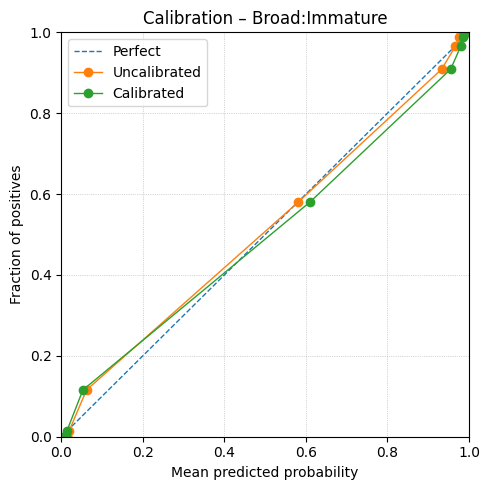

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Zhang/Models/Broad_Immature/Broad_Immature_bundle.joblib

Immature
               precision    recall  f1-score   support

           0       0.97      0.94      0.96      6121
           1       0.95      0.97      0.96      6121

    accuracy                           0.96     12242
   macro avg       0.96      0.96      0.96     12242
weighted avg       0.96      0.96      0.96     12242


Processing Mature (class 2/2)...
Training - Found 44086 / 44086 barcodes
Training - Pos: 22043, Neg: 22043
Training labels: 22043 pos, 22043 neg
Testing  - Found 12242 / 12242 barcodes
Testing  - Pos: 6121, Neg: 6121
Testing labels: 6121 pos, 6121 neg
Calibrating - Found 5716 rows | Pos: 2451, Neg: 3265
All test data: 14282 rows, positives for Mature: 6121
[scale] Mature: train mean ~ 0.000, std ~ 1.000

[NB] training → Mature
Fitting 10 folds for

Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid st


[KNN] training → Mature
Fitting 10 folds for each of 10 candidates, totalling 100 fits


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.



[MLP] training → Mature
Fitting 10 folds for each of 10 candidates, totalling 100 fits
[CAL] Mature: cal positives=2451/5716

Calibration metrics:
   Uncalibrated  |  Brier: 0.0320   LogLoss: 0.1177
     Calibrated  |  Brier: 0.0322   LogLoss: 0.1163


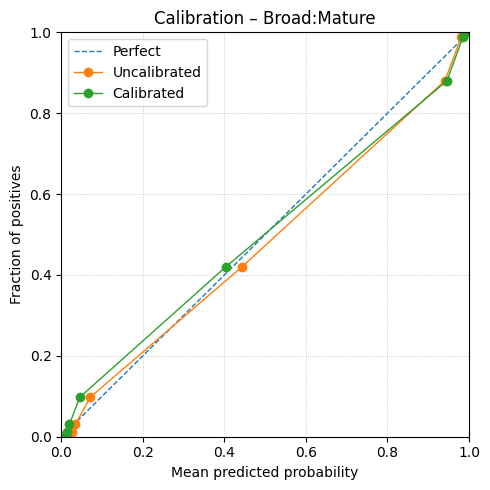

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Zhang/Models/Broad_Mature/Broad_Mature_bundle.joblib

Mature
               precision    recall  f1-score   support

           0       0.95      0.97      0.96      6121
           1       0.97      0.95      0.96      6121

    accuracy                           0.96     12242
   macro avg       0.96      0.96      0.96     12242
weighted avg       0.96      0.96      0.96     12242


Fitting multiclass TemperatureScaling on CAL split...

Preview of probabilities BEFORE (raw OvR) vs AFTER (multiclass TS):
                                      raw_Immature  raw_Mature  mc_Immature  mc_Mature true_label  pred_raw  pred_mc pred_raw_name pred_mc_name
CATGGATGTCATTCCC-1.WF26_031423_CD271      0.912277    0.089756     0.911331   0.088669   Immature         0        0      Immature     Immature
GTAGGTTGTACGAGCA-1.WF26_031423_CD34       0.98

In [126]:
# -*- coding: utf-8 -*-
from pathlib import Path
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.ensemble import StackingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.calibration import CalibratedClassifierCV
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report, confusion_matrix

from netcal.scaling import TemperatureScaling
import joblib

# ------------------------------------------------------------------- CONFIG (expects these to already exist)
#   models_output, train_barcodes_path, test_barcodes_path
#   Zhang_data_Train, Zhang_data_Test, Zhang_data_Cal          (DataFrames indexed by barcode)
#   Zhang_dataset_Train, Zhang_dataset_Test, Zhang_dataset_Cal (AnnData with obs labels)
#   TotalSeqD_Heme_Oncology_CAT399906                    (iterable of feature names)
#   MLTraining module with: CV, train_NB, train_XGB, train_KNN, train_MLP,
#                           plot_calibration_curve, save_models, evaluate_classifier, append_metrics_csv

name_target_class = "Broad"   # "Broad" | "Simplified" | "Detailed"
fig_root   = Path(models_output) / "Figures"
models_dir = Path(models_output) / "Models"
fig_root.mkdir(parents=True, exist_ok=True)
models_dir.mkdir(parents=True, exist_ok=True)

kf         = MLTraining.CV
num_cores  = -1
metrics_log = []

# ============================= HELPERS =============================

def _norm_feats(names) -> pd.Index:
    """
    Normalizer used ONLY to construct matching keys.
    Panel names remain untouched; data columns are normalized and then mapped BACK
    to the exact panel names via a lookup.
    """
    s = pd.Index(map(str, names))
    s = (s.str.strip()
           .str.lower()
           .str.replace(r"[ _/]+", "-", regex=True)
           .str.replace(r"-+", "-", regex=True)
           .str.strip("-"))
    return s

def attach_celltype(df: pd.DataFrame, ad: "AnnData", field: str) -> pd.DataFrame:
    if field not in ad.obs:
        raise KeyError(f"'{field}' not found in AnnData.obs")
    lab = (ad.obs[field]
             .astype("string")
             .str.strip()
             .str.replace(r"\s+", "_", regex=True))
    out = df.copy()
    out["Celltype"] = pd.Categorical(lab.reindex(out.index))
    if out["Celltype"].isna().any():
        missing = int(out["Celltype"].isna().sum())
        print(f"[WARN] {missing} rows got NaN Celltype after reindex; check barcode alignment.")
    return out

def _check_finite(df: pd.DataFrame, tag: str):
    arr = df.to_numpy()
    if not np.isfinite(arr).all():
        bad = np.where(~np.isfinite(arr))
        raise ValueError(f"Non-finite values found in {tag} features at positions {bad}")

def _unwrap_estimator(m):
    return getattr(m, "estimator", None) or getattr(m, "base_estimator", None) or m

def _assert_feature_counts(cell_name: str, models_dict: dict, expected: int):
    pairs = [
        ("NB",  models_dict.get("NB")),
        ("XGB", models_dict.get("XGB")),
        ("KNN", models_dict.get("KNN")),
        ("MLP", models_dict.get("MLP")),
        ("Stacker", models_dict.get("Stacker")),
    ]
    for name, est in pairs:
        if est is None:
            continue
        base = _unwrap_estimator(est)
        nfi = getattr(base, "n_features_in_", None)
        if nfi is not None and nfi != expected:
            raise RuntimeError(f"{cell_name}:{name} saw {nfi} features; expected {expected}")

# ============================= LABEL ATTACH =============================

consensus_field = f"Consensus_annotation_{name_target_class.lower()}_final"

Zhang_data_Train = attach_celltype(Zhang_data_Train, Zhang_dataset_Train, consensus_field)
Zhang_data_Test  = attach_celltype(Zhang_data_Test,  Zhang_dataset_Test,  consensus_field)
Zhang_data_Cal   = attach_celltype(Zhang_data_Cal,   Zhang_dataset_Cal,   consensus_field)

# ============================= PANEL & DATA COLUMN ALIGNMENT =============================

# Keep the panel EXACTLY as provided
panel = pd.Index(map(str, TotalSeqD_Heme_Oncology_CAT399906))

# Build a mapping: normalized_key -> exact panel name
panel_keys    = _norm_feats(panel)
norm_to_panel = dict(zip(panel_keys, panel))
if len(norm_to_panel) != len(panel):
    raise ValueError("Panel contains names that collide after normalization. Consider adjusting _norm_feats rules.")

def _rename_data_to_panel(df: pd.DataFrame) -> pd.DataFrame:
    """
    Rename only feature columns so that after normalization they map
    back to the exact panel column names. Keeps 'cell_barcode' and 'Celltype' intact.
    """
    df = df.copy()
    non_feat = [c for c in ["cell_barcode", "Celltype"] if c in df.columns]
    feat     = pd.Index([c for c in df.columns if c not in non_feat])

    feat_keys   = _norm_feats(feat)
    mapped      = [norm_to_panel.get(k) for k in feat_keys]  # None if not in panel
    rename_map  = {old: new for old, new in zip(feat, mapped) if new is not None}

    # Handle duplicate mappings (two data columns → same panel col). Keep first, drop the rest.
    seen, safe_map, drops = set(), {}, []
    for old, new in rename_map.items():
        if new in seen:
            drops.append(old)
        else:
            seen.add(new); safe_map[old] = new

    if drops:
        print(f"[WARN] Dropping {len(drops)} duplicated-mapped columns (showing up to 5): {drops[:5]}")

    if drops:
        df.drop(columns=drops, inplace=True, errors="ignore")
    df.rename(columns=safe_map, inplace=True)

    matched = len(safe_map)
    print(f"[map] matched {matched}/{len(feat)} data columns to panel")
    return df

# Apply: normalize/rename ONLY data splits (panel remains untouched)
Zhang_data_Train = _rename_data_to_panel(Zhang_data_Train)
Zhang_data_Test  = _rename_data_to_panel(Zhang_data_Test)
Zhang_data_Cal   = _rename_data_to_panel(Zhang_data_Cal)

# Intersect each split with the panel IN PANEL ORDER
def _panel_intersection(df: pd.DataFrame) -> pd.DataFrame:
    non_feat = [c for c in ["cell_barcode", "Celltype"] if c in df.columns]
    feat_cols = pd.Index([c for c in df.columns if c not in non_feat])
    inter = panel.intersection(feat_cols, sort=False)
    if inter.empty:
        raise ValueError("Panel/Data intersection is empty after renaming. Check mapping rules.")
    return df.reindex(columns=list(inter) + non_feat)

Zhang_data_Train = _panel_intersection(Zhang_data_Train)
Zhang_data_Test  = _panel_intersection(Zhang_data_Test)
Zhang_data_Cal   = _panel_intersection(Zhang_data_Cal)

# ============================= FEATURES & LABELS =============================

Zhang_data_Cal_lbl = Zhang_data_Cal[["Celltype"]].copy()

drop_cols_train = [c for c in ["cell_barcode", "Celltype"] if c in Zhang_data_Train.columns]
drop_cols_test  = [c for c in ["cell_barcode", "Celltype"] if c in Zhang_data_Test.columns]
drop_cols_cal   = [c for c in ["cell_barcode", "Celltype"] if c in Zhang_data_Cal.columns]

Zhang_data_Train_Sub = Zhang_data_Train.drop(columns=drop_cols_train, errors="ignore")
Zhang_data_Test_Sub  = Zhang_data_Test.drop(columns=drop_cols_test,  errors="ignore")
Zhang_data_Cal_Sub   = Zhang_data_Cal.drop(columns=drop_cols_cal,    errors="ignore")

# SAFETY: shared columns & finiteness checks
cols_train = list(Zhang_data_Train_Sub.columns)
if list(Zhang_data_Test_Sub.columns) != cols_train or list(Zhang_data_Cal_Sub.columns) != cols_train:
    raise ValueError("Train/Cal/Test feature columns differ after panel intersection!")

_check_finite(Zhang_data_Train_Sub, "TRAIN")
_check_finite(Zhang_data_Test_Sub,  "TEST")
_check_finite(Zhang_data_Cal_Sub,   "CAL")

print(f"\n[features] Using {len(cols_train)} panel-intersected features (exact panel names):")
print(cols_train)

# Consistent class order
class_names  = sorted(pd.Series(Zhang_data_Train["Celltype"]).dropna().unique())
K            = len(class_names)
class_to_idx = {c: i for i, c in enumerate(class_names)}

# Multiclass labels arrays
s_cal = Zhang_data_Cal_lbl["Celltype"].map(class_to_idx)
if s_cal.isna().any():
    missing = Zhang_data_Cal_lbl.loc[s_cal.isna(), "Celltype"].unique()
    raise ValueError(f"Unknown labels in CAL split: {missing}")
y_cal_multiclass = s_cal.to_numpy(dtype=np.int64)

s_te = Zhang_data_Test["Celltype"].map(class_to_idx)
if s_te.isna().any():
    missing = Zhang_data_Test.loc[s_te.isna(), "Celltype"].unique()
    raise ValueError(f"Unknown labels in TEST split: {missing}")
y_test_multiclass = s_te.to_numpy(dtype=np.int64)

# Reuse across classes
X_cal_all_df = Zhang_data_Cal_Sub.copy()
X_te_all_df  = Zhang_data_Test_Sub.copy()

# Preallocate OvR prob mats
P_cal = np.zeros((X_cal_all_df.shape[0], K), dtype=float)
P_te  = np.zeros((X_te_all_df.shape[0],  K), dtype=float)

test_index = Zhang_data_Test_Sub.index

# ============================= TRAIN PER-CLASS OVR =============================

for celltype in class_names:
    k = class_to_idx[celltype]
    name = str(celltype).replace(" ", "_")
    print(f"\nProcessing {name} (class {k+1}/{K})...")

    # ---- TRAIN slice via barcode lists
    train_barcodes_df = pd.read_csv(
        f"{train_barcodes_path}/Zhang/Consensus_annotation_broad_final/Barcodes_training_class_{name}.csv",
        index_col=0
    )
    train_positive_barcodes = train_barcodes_df["Positive"].dropna().values
    train_negative_barcodes = train_barcodes_df["Negative"].dropna().values
    all_train_barcodes = np.concatenate([train_positive_barcodes, train_negative_barcodes])

    train_mask = Zhang_data_Train_Sub.index.isin(all_train_barcodes)
    X_tr_df = Zhang_data_Train_Sub.loc[train_mask]
    found_train_barcodes = X_tr_df.index.values
    y_tr = np.isin(found_train_barcodes, train_positive_barcodes).astype(int)

    # ---- Skip guards
    if X_tr_df.empty or np.unique(y_tr).size < 2:
        print(f"[SKIP] {name}: empty or single-class train slice (pos={y_tr.sum()}, neg={(len(y_tr)-y_tr.sum())}).")
        continue

    # ---- TEST slice via barcode lists
    test_barcodes_df = pd.read_csv(
        f"{test_barcodes_path}/Zhang/Consensus_annotation_broad_final/Barcodes_testing_class_{name}.csv",
        index_col=0
    )
    test_positive_barcodes = test_barcodes_df["Positive"].dropna().values
    test_negative_barcodes = test_barcodes_df["Negative"].dropna().values
    all_test_barcodes = np.concatenate([test_positive_barcodes, test_negative_barcodes])

    test_mask = Zhang_data_Test_Sub.index.isin(all_test_barcodes)
    X_te_df = Zhang_data_Test_Sub.loc[test_mask]
    found_test_barcodes = X_te_df.index.values
    y_te = np.isin(found_test_barcodes, test_positive_barcodes).astype(int)

    # ---- Full-test & cal for this binary head
    X_te_all_local = X_te_all_df.copy()
    y_te_all = (Zhang_data_Test["Celltype"].values == celltype).astype(int)
    X_cal_df = X_cal_all_df.copy()
    y_cal_bin = (Zhang_data_Cal_lbl["Celltype"].values == celltype).astype(int)

    # ---- Info
    print(f"Training - Found {X_tr_df.shape[0]} / {len(all_train_barcodes)} barcodes")
    print(f"Training - Pos: {len(train_positive_barcodes)}, Neg: {len(train_negative_barcodes)}")
    print(f"Training labels: {y_tr.sum()} pos, {len(y_tr)-y_tr.sum()} neg")
    print(f"Testing  - Found {X_te_df.shape[0]} / {len(all_test_barcodes)} barcodes")
    print(f"Testing  - Pos: {len(test_positive_barcodes)}, Neg: {len(test_negative_barcodes)}")
    print(f"Testing labels: {y_te.sum()} pos, {len(y_te)-y_te.sum()} neg")
    print(f"Calibrating - Found {X_cal_df.shape[0]} rows | Pos: {y_cal_bin.sum()}, Neg: {len(y_cal_bin)-y_cal_bin.sum()}")
    print(f"All test data: {X_te_all_local.shape[0]} rows, positives for {celltype}: {y_te_all.sum()}")

    # ---- Scaling (fit on per-head TRAIN slice; transform others)
    scaler = StandardScaler(with_mean=True, with_std=True).fit(X_tr_df.values)

    def _sc(df):
        return pd.DataFrame(
            scaler.transform(df.values),
            index=df.index,
            columns=cols_train,
        )

    X_tr_sc_df     = _sc(X_tr_df)
    X_te_sc_df     = _sc(X_te_df)
    X_te_all_sc_df = _sc(X_te_all_local)
    X_cal_sc_df    = _sc(X_cal_df)

    print(f"[scale] {name}: train mean ~ {X_tr_sc_df.values.mean():.3f}, std ~ {X_tr_sc_df.values.std():.3f}")

    # ---- Base learners
    NB_model  = MLTraining.train_NB (X_tr_sc_df, y_tr, cv=kf, num_cores=num_cores, name_target_subclass=name)
    XGB_model = MLTraining.train_XGB(X_tr_sc_df, y_tr, cv=kf, num_cores=num_cores, name_target_subclass=name)
    KNN_model = MLTraining.train_KNN(X_tr_sc_df, y_tr, cv=kf, num_cores=num_cores, name_target_subclass=name)
    MLP_model = MLTraining.train_MLP(X_tr_sc_df, y_tr, cv=kf, num_cores=num_cores, name_target_subclass=name)

    # ---- Stacker (raw)
    stacker_raw = StackingClassifier(
        estimators=[("NB", NB_model), ("XGB", XGB_model), ("KNN", KNN_model), ("MLP", MLP_model)],
        final_estimator=LogisticRegression(max_iter=2000, class_weight="balanced", random_state=42),
        stack_method="predict_proba",
        cv=kf,
        n_jobs=-1,
    ).fit(X_tr_sc_df, y_tr)

    # ---- Feature count asserts (debug safety)
    expected_feats = len(cols_train)
    _assert_feature_counts(name, {
        "NB": NB_model, "XGB": XGB_model, "KNN": KNN_model, "MLP": MLP_model, "Stacker": stacker_raw
    }, expected_feats)

    # ---- Binary calibration (Platt, guarded)
    pos_cal    = int(y_cal_bin.sum())
    n_cal_bin  = int(len(y_cal_bin))
    has_both   = (0 < pos_cal < n_cal_bin)
    print(f"[CAL] {name}: cal positives={pos_cal}/{n_cal_bin}")

    if has_both:
        try:
            calibrator = CalibratedClassifierCV(estimator=stacker_raw, method="sigmoid", cv="prefit")
        except TypeError:  # older sklearn
            calibrator = CalibratedClassifierCV(base_estimator=stacker_raw, method="sigmoid", cv="prefit")
        stacker = calibrator.fit(X_cal_sc_df, y_cal_bin)
    else:
        print(f"[WARN] Skipping calibration for {name}: single-class cal set.")
        stacker = stacker_raw

    # ---- Calibration plot on all-test (optional)
    try:
        y_proba_uncal = stacker_raw.predict_proba(X_te_all_sc_df)[:, 1]
        y_proba_cal   = stacker.predict_proba(X_te_all_sc_df)[:, 1]
        if has_both:
            _ = MLTraining.plot_calibration_curve(
                y_te_all, [y_proba_uncal, y_proba_cal],
                clf_names=["Uncalibrated", "Calibrated"],
                n_bins=15, strategy="quantile",
                title=f"Calibration – {name_target_class}:{name}"
            )
        else:
            _ = MLTraining.plot_calibration_curve(
                y_te_all, [y_proba_uncal],
                clf_names=["Uncalibrated"],
                n_bins=15, strategy="quantile",
                title=f"Calibration (uncal only) – {name_target_class}:{name}"
            )
        plt.tight_layout()
        plt.show()
    except Exception as e:
        print(f"[WARN] Skipped calibration plot for {name}: {e}")

    # ---- Save per-class bundle (model + scaler + columns)
    save_subdir = models_dir / f"{name_target_class}_{name}"
    save_subdir.mkdir(parents=True, exist_ok=True)

    MLTraining.save_models({"Stacked": stacker}, out_dir=save_subdir, tag=f"{name_target_class}_{name}")
    joblib.dump(cols_train, save_subdir / "feature_names.joblib")

    bundle = {
        "atlas": "Zhang",
        "depth": name_target_class,
        "label": celltype,
        "model": stacker,          # CalibratedClassifierCV(StackingClassifier) or StackingClassifier
        "columns": cols_train,     # exact panel names, panel order
        "scaler": scaler,          # per-head scaler
        "panel_name": "TotalSeqD_Heme_Oncology_CAT399906",
    }
    bundle_path = save_subdir / f"{name_target_class}_{name}_bundle.joblib"
    joblib.dump(bundle, bundle_path)
    print(f"[SAVE] Wrote bundle with columns+scaler to {bundle_path}")

    # ---- Binary metrics on the class-specific test slice
    try:
        m = MLTraining.evaluate_classifier(stacker, X_te_sc_df, y_te, plot_cm=False)
        m.update(celltype=celltype)
        metrics_log.append(m)
        print(f"\n{celltype}\n", m.get("report", ""))
    except Exception as e:
        print(f"[WARN] Binary metrics for {name} skipped: {e}")

    # ---- Store OvR probs for multiclass calibration
    P_cal[:, k] = stacker.predict_proba(X_cal_sc_df)[:, 1]
    P_te[:,  k] = stacker.predict_proba(X_te_all_sc_df)[:, 1]

# ============================= MULTICLASS CALIBRATION =============================

print("\nFitting multiclass TemperatureScaling on CAL split...")

# Guards: ensure probs are in [0,1]
if (P_cal < 0).any() or (P_cal > 1).any():
    raise ValueError("P_cal must be probabilities in [0,1].")
if (P_te < 0).any() or (P_te > 1).any():
    raise ValueError("P_te must be probabilities in [0,1].")

ts_cal = TemperatureScaling()
ts_cal.fit(P_cal, y_cal_multiclass)
P_te_mc = ts_cal.transform(P_te)

# Ensure calibrated probs shape (K)
P_te_mc = np.asarray(P_te_mc)
if P_te_mc.ndim == 1:
    P_te_mc = P_te_mc.reshape(-1, 1)
if P_te_mc.shape[1] == 1 and K == 2:
    P_te_mc = np.hstack([1.0 - P_te_mc, P_te_mc])
elif P_te_mc.shape[1] != K:
    # Fallback: normalize OvR sums
    row_sums = P_te.sum(axis=1, keepdims=True)
    row_sums[row_sums == 0.0] = 1.0
    P_te_mc = P_te / row_sums
    print(f"[WARN] TemperatureScaling returned shape {P_te_mc.shape}; fell back to sum-normalized OvR probs.")

# Persist multiclass temp scaler + class names
joblib.dump(ts_cal, models_dir / f"{name_target_class}_multiclass_temp_scaler.joblib")
(pd.Series(class_names, name="class_name")
   .to_csv(models_dir / f"{name_target_class}_class_names.csv", index=False))

# ============================= PROBS COMPARISON & METRICS =============================

probs_raw_df = pd.DataFrame(P_te,    index=test_index, columns=[f"raw_{c}" for c in class_names])
probs_mc_df  = pd.DataFrame(P_te_mc, index=test_index, columns=[f"mc_{c}"  for c in class_names])

probs_compare = pd.concat([probs_raw_df, probs_mc_df], axis=1)
probs_compare["true_label"]    = Zhang_data_Test["Celltype"].values
probs_compare["pred_raw"]      = P_te.argmax(axis=1)
probs_compare["pred_mc"]       = P_te_mc.argmax(axis=1)
probs_compare["pred_raw_name"] = [class_names[i] for i in probs_compare["pred_raw"].values]
probs_compare["pred_mc_name"]  = [class_names[i] for i in probs_compare["pred_mc"].values]

print("\nPreview of probabilities BEFORE (raw OvR) vs AFTER (multiclass TS):")
print(probs_compare.head(10).to_string())

probs_compare_path = models_dir / f"{name_target_class}_probabilities_before_after_TEST.csv"
probs_compare.to_csv(probs_compare_path, index=True)
print(f"\nSaved probabilities comparison to: {probs_compare_path}")

# Multiclass evaluation
y_pred_mc = P_te_mc.argmax(axis=1)
print("\nMulticlass classification report (TEST):")
print(classification_report(y_test_multiclass, y_pred_mc, target_names=class_names, digits=3))

cm = confusion_matrix(y_test_multiclass, y_pred_mc, labels=range(K))
print("Confusion matrix (rows=true, cols=pred):\n", cm)

# Per-class binary head metrics CSV
metrics_df = pd.DataFrame.from_records(metrics_log)
MLTraining.append_metrics_csv(metrics_df, csv_path=Path(models_output) / "stacker_metrics.csv")

print("\nDone.")


#### Simplified annotation

[map] matched 34/34 data columns to panel
[map] matched 34/34 data columns to panel
[map] matched 34/34 data columns to panel

[features] Using 34 panel-intersected features (exact panel names):
['CD10', 'CD117', 'CD11b', 'CD11c', 'CD123', 'CD13', 'CD138', 'CD14', 'CD141', 'CD16', 'CD163', 'CD19', 'CD2', 'CD25', 'CD304', 'CD33', 'CD34', 'CD38', 'CD4', 'CD44', 'CD45', 'CD45RA', 'CD45RO', 'CD5', 'CD56', 'CD62L', 'CD62P', 'CD64', 'CD69', 'CD7', 'CD71', 'CD8', 'CD83', 'CD90']
[classes] Included (11): ['B', 'CD4_T', 'CD8_T', 'Erythroid', 'HSPC', 'Monocyte', 'Myeloid', 'NK', 'Plasma', 'cDC', 'pDC']
[classes] Excluded: ['Macrophage', 'Stroma']

Processing B (class 1/11)...
Training - Found 3632 / 3632 barcodes
Training - Pos: 1816, Neg: 1816
Training labels: 1816 pos, 1816 neg
Testing  - Found 1008 / 1008 barcodes
Testing  - Pos: 504, Neg: 504
Testing  - labels: 504 pos, 504 neg
Calibrating - Found 5716 rows | Pos: 203, Neg: 5513
All test data: 14282 rows, positives for B: 504
[scale] B: trai

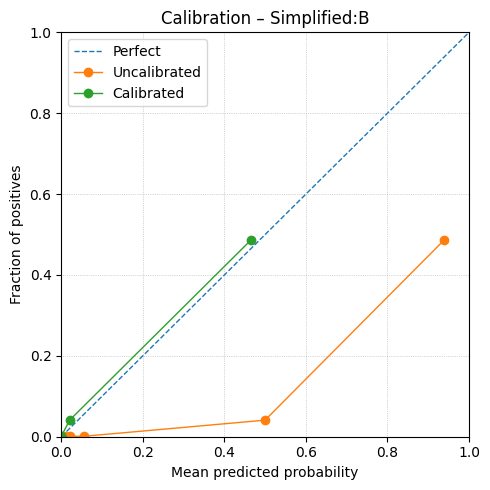

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Zhang/Models/Simplified_B/Simplified_B_bundle.joblib

B
               precision    recall  f1-score   support

           0       0.76      0.99      0.86       504
           1       0.99      0.68      0.81       504

    accuracy                           0.84      1008
   macro avg       0.87      0.84      0.83      1008
weighted avg       0.87      0.84      0.83      1008


Processing CD4_T (class 2/11)...
Training - Found 4074 / 4074 barcodes
Training - Pos: 2037, Neg: 2037
Training labels: 2037 pos, 2037 neg
Testing  - Found 1132 / 1132 barcodes
Testing  - Pos: 566, Neg: 566
Testing  - labels: 566 pos, 566 neg
Calibrating - Found 5716 rows | Pos: 227, Neg: 5489
All test data: 14282 rows, positives for CD4_T: 566
[scale] CD4_T: train mean ~ -0.000, std ~ 1.000

[NB] training → CD4_T
Fitting 10 folds for each of 10 candidates, 

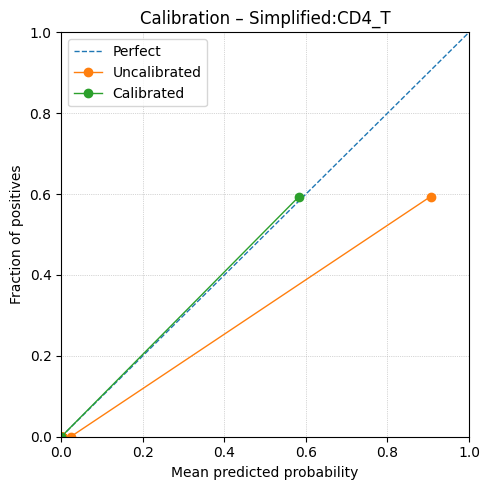

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Zhang/Models/Simplified_CD4_T/Simplified_CD4_T_bundle.joblib

CD4_T
               precision    recall  f1-score   support

           0       0.97      0.99      0.98       566
           1       0.99      0.97      0.98       566

    accuracy                           0.98      1132
   macro avg       0.98      0.98      0.98      1132
weighted avg       0.98      0.98      0.98      1132


Processing CD8_T (class 3/11)...
Training - Found 3392 / 3392 barcodes
Training - Pos: 1696, Neg: 1696
Training labels: 1696 pos, 1696 neg
Testing  - Found 940 / 940 barcodes
Testing  - Pos: 470, Neg: 470
Testing  - labels: 470 pos, 470 neg
Calibrating - Found 5716 rows | Pos: 189, Neg: 5527
All test data: 14282 rows, positives for CD8_T: 470
[scale] CD8_T: train mean ~ -0.000, std ~ 1.000

[NB] training → CD8_T
Fitting 10 folds for each of 10 ca

Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.



[KNN] training → CD8_T
Fitting 10 folds for each of 10 candidates, totalling 100 fits

[MLP] training → CD8_T
Fitting 10 folds for each of 10 candidates, totalling 100 fits
[CAL] CD8_T: cal positives=189/5716

Calibration metrics:
   Uncalibrated  |  Brier: 0.0174   LogLoss: 0.0572
     Calibrated  |  Brier: 0.0049   LogLoss: 0.0182


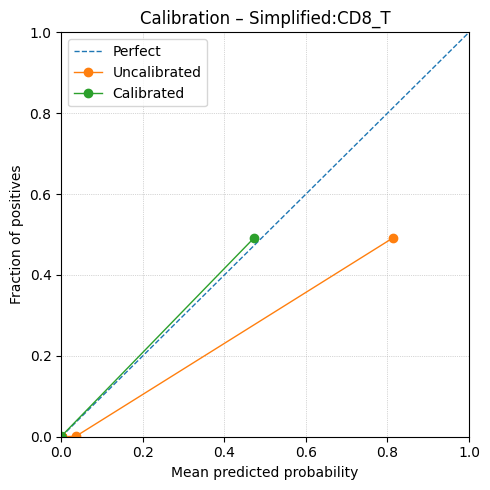

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Zhang/Models/Simplified_CD8_T/Simplified_CD8_T_bundle.joblib

CD8_T
               precision    recall  f1-score   support

           0       0.96      1.00      0.98       470
           1       1.00      0.96      0.98       470

    accuracy                           0.98       940
   macro avg       0.98      0.98      0.98       940
weighted avg       0.98      0.98      0.98       940


Processing Erythroid (class 4/11)...
Training - Found 11246 / 11246 barcodes
Training - Pos: 5623, Neg: 5623
Training labels: 5623 pos, 5623 neg
Testing  - Found 3122 / 3122 barcodes
Testing  - Pos: 1561, Neg: 1561
Testing  - labels: 1561 pos, 1561 neg
Calibrating - Found 5716 rows | Pos: 624, Neg: 5092
All test data: 14282 rows, positives for Erythroid: 1561
[scale] Erythroid: train mean ~ 0.000, std ~ 1.000

[NB] training → Erythroid
Fitting 10

Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.



[KNN] training → Erythroid
Fitting 10 folds for each of 10 candidates, totalling 100 fits

[MLP] training → Erythroid
Fitting 10 folds for each of 10 candidates, totalling 100 fits
[CAL] Erythroid: cal positives=624/5716

Calibration metrics:
   Uncalibrated  |  Brier: 0.0349   LogLoss: 0.1300
     Calibrated  |  Brier: 0.0219   LogLoss: 0.0746


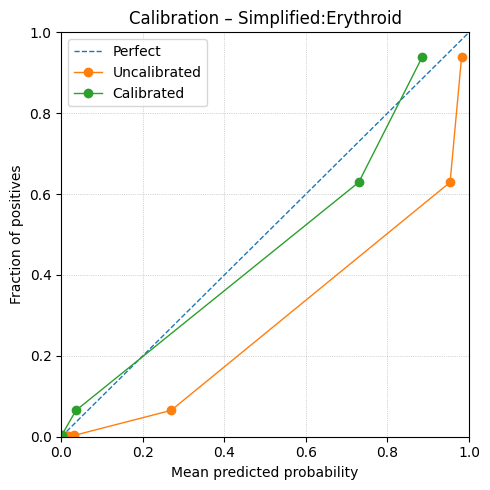

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Zhang/Models/Simplified_Erythroid/Simplified_Erythroid_bundle.joblib

Erythroid
               precision    recall  f1-score   support

           0       0.94      0.98      0.96      1561
           1       0.98      0.93      0.95      1561

    accuracy                           0.95      3122
   macro avg       0.96      0.95      0.95      3122
weighted avg       0.96      0.95      0.95      3122


Processing HSPC (class 5/11)...
Training - Found 47786 / 47786 barcodes
Training - Pos: 23893, Neg: 23893
Training labels: 23893 pos, 23893 neg
Testing  - Found 13276 / 13276 barcodes
Testing  - Pos: 6638, Neg: 6638
Testing  - labels: 6638 pos, 6638 neg
Calibrating - Found 5716 rows | Pos: 2656, Neg: 3060
All test data: 14282 rows, positives for HSPC: 6638
[scale] HSPC: train mean ~ 0.000, std ~ 1.000

[NB] training → HSPC
Fitting 10 

Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.



[XGB] training → HSPC
Fitting 10 folds for each of 10 candidates, totalling 100 fits


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid st


[KNN] training → HSPC
Fitting 10 folds for each of 10 candidates, totalling 100 fits


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.



[MLP] training → HSPC
Fitting 10 folds for each of 10 candidates, totalling 100 fits
[CAL] HSPC: cal positives=2656/5716

Calibration metrics:
   Uncalibrated  |  Brier: 0.0484   LogLoss: 0.1716
     Calibrated  |  Brier: 0.0482   LogLoss: 0.1699


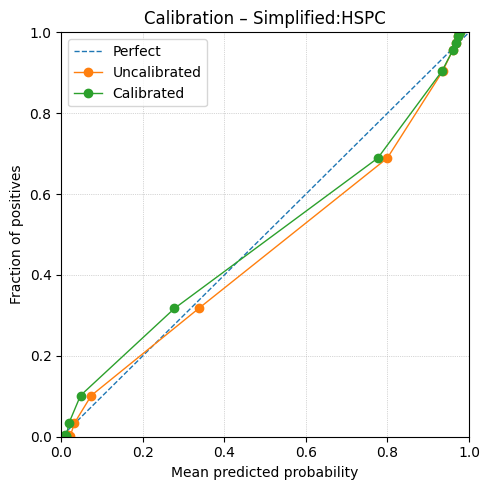

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Zhang/Models/Simplified_HSPC/Simplified_HSPC_bundle.joblib

HSPC
               precision    recall  f1-score   support

           0       0.94      0.93      0.94      6638
           1       0.93      0.94      0.94      6638

    accuracy                           0.94     13276
   macro avg       0.94      0.94      0.94     13276
weighted avg       0.94      0.94      0.94     13276


Processing Monocyte (class 6/11)...
Training - Found 6288 / 6288 barcodes
Training - Pos: 3144, Neg: 3144
Training labels: 3144 pos, 3144 neg
Testing  - Found 1748 / 1748 barcodes
Testing  - Pos: 874, Neg: 874
Testing  - labels: 874 pos, 874 neg
Calibrating - Found 5716 rows | Pos: 349, Neg: 5367
All test data: 14282 rows, positives for Monocyte: 874
[scale] Monocyte: train mean ~ -0.000, std ~ 1.000

[NB] training → Monocyte
Fitting 10 folds for ea

Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.



[KNN] training → Monocyte
Fitting 10 folds for each of 10 candidates, totalling 100 fits

[MLP] training → Monocyte
Fitting 10 folds for each of 10 candidates, totalling 100 fits
[CAL] Monocyte: cal positives=349/5716

Calibration metrics:
   Uncalibrated  |  Brier: 0.0139   LogLoss: 0.0491
     Calibrated  |  Brier: 0.0059   LogLoss: 0.0232


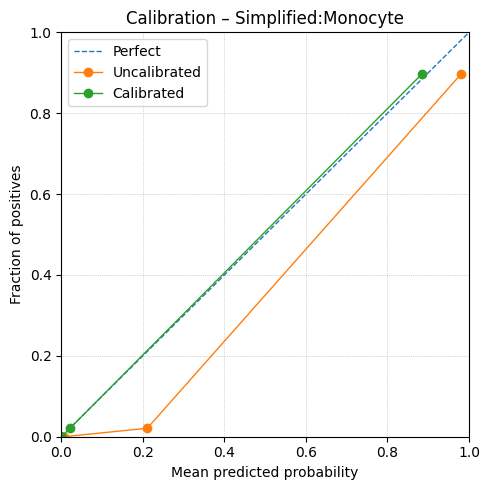

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Zhang/Models/Simplified_Monocyte/Simplified_Monocyte_bundle.joblib

Monocyte
               precision    recall  f1-score   support

           0       0.97      0.99      0.98       874
           1       0.99      0.97      0.98       874

    accuracy                           0.98      1748
   macro avg       0.98      0.98      0.98      1748
weighted avg       0.98      0.98      0.98      1748


Processing Myeloid (class 7/11)...
Training - Found 10140 / 10140 barcodes
Training - Pos: 5070, Neg: 5070
Training labels: 5070 pos, 5070 neg
Testing  - Found 2816 / 2816 barcodes
Testing  - Pos: 1408, Neg: 1408
Testing  - labels: 1408 pos, 1408 neg
Calibrating - Found 5716 rows | Pos: 563, Neg: 5153
All test data: 14282 rows, positives for Myeloid: 1408
[scale] Myeloid: train mean ~ 0.000, std ~ 1.000

[NB] training → Myeloid
Fitting 1

Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.



[KNN] training → Myeloid
Fitting 10 folds for each of 10 candidates, totalling 100 fits

[MLP] training → Myeloid
Fitting 10 folds for each of 10 candidates, totalling 100 fits
[CAL] Myeloid: cal positives=563/5716

Calibration metrics:
   Uncalibrated  |  Brier: 0.0610   LogLoss: 0.2007
     Calibrated  |  Brier: 0.0283   LogLoss: 0.0949


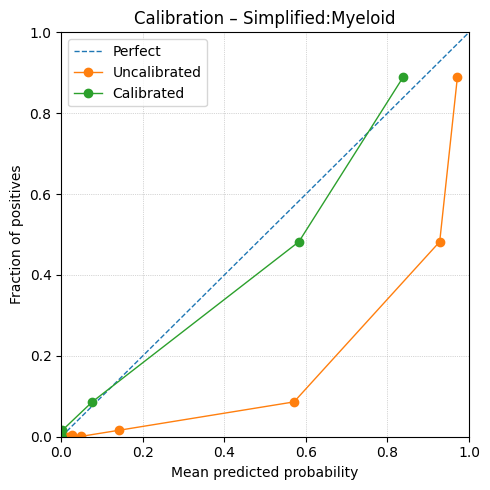

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Zhang/Models/Simplified_Myeloid/Simplified_Myeloid_bundle.joblib

Myeloid
               precision    recall  f1-score   support

           0       0.88      0.98      0.93      1408
           1       0.97      0.87      0.92      1408

    accuracy                           0.92      2816
   macro avg       0.93      0.92      0.92      2816
weighted avg       0.93      0.92      0.92      2816


Processing NK (class 8/11)...
Training - Found 1696 / 1696 barcodes
Training - Pos: 848, Neg: 848
Training labels: 848 pos, 848 neg
Testing  - Found 472 / 472 barcodes
Testing  - Pos: 236, Neg: 236
Testing  - labels: 236 pos, 236 neg
Calibrating - Found 5716 rows | Pos: 95, Neg: 5621
All test data: 14282 rows, positives for NK: 236
[scale] NK: train mean ~ -0.000, std ~ 1.000

[NB] training → NK
Fitting 10 folds for each of 10 candidates, t

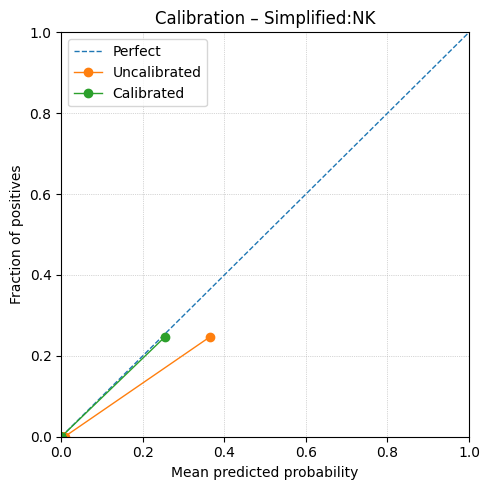

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Zhang/Models/Simplified_NK/Simplified_NK_bundle.joblib

NK
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       236
           1       1.00      1.00      1.00       236

    accuracy                           1.00       472
   macro avg       1.00      1.00      1.00       472
weighted avg       1.00      1.00      1.00       472


Processing Plasma (class 9/11)...
Training - Found 190 / 190 barcodes
Training - Pos: 95, Neg: 95
Training labels: 95 pos, 95 neg
Testing  - Found 52 / 52 barcodes
Testing  - Pos: 26, Neg: 26
Testing  - labels: 26 pos, 26 neg
Calibrating - Found 5716 rows | Pos: 11, Neg: 5705
All test data: 14282 rows, positives for Plasma: 26
[scale] Plasma: train mean ~ -0.000, std ~ 1.000

[NB] training → Plasma
Fitting 10 folds for each of 10 candidates, totalling 100

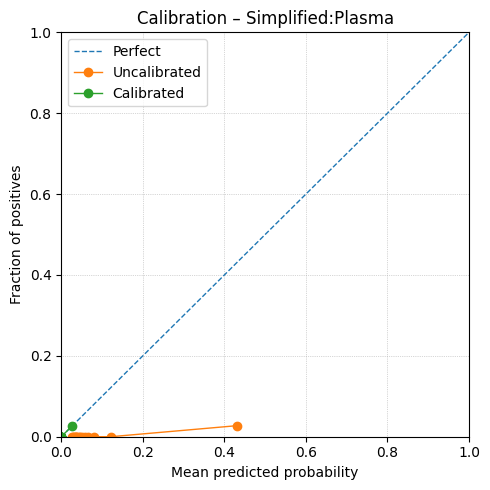

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Zhang/Models/Simplified_Plasma/Simplified_Plasma_bundle.joblib

Plasma
               precision    recall  f1-score   support

           0       0.81      1.00      0.90        26
           1       1.00      0.77      0.87        26

    accuracy                           0.88        52
   macro avg       0.91      0.88      0.88        52
weighted avg       0.91      0.88      0.88        52


Processing cDC (class 10/11)...
Training - Found 7064 / 7064 barcodes
Training - Pos: 3532, Neg: 3532
Training labels: 3532 pos, 3532 neg
Testing  - Found 1960 / 1960 barcodes
Testing  - Pos: 980, Neg: 980
Testing  - labels: 980 pos, 980 neg
Calibrating - Found 5716 rows | Pos: 392, Neg: 5324
All test data: 14282 rows, positives for cDC: 980
[scale] cDC: train mean ~ 0.000, std ~ 1.000

[NB] training → cDC
Fitting 10 folds for each of 10 candi

Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.



[KNN] training → cDC
Fitting 10 folds for each of 10 candidates, totalling 100 fits

[MLP] training → cDC
Fitting 10 folds for each of 10 candidates, totalling 100 fits
[CAL] cDC: cal positives=392/5716

Calibration metrics:
   Uncalibrated  |  Brier: 0.0454   LogLoss: 0.1498
     Calibrated  |  Brier: 0.0192   LogLoss: 0.0670


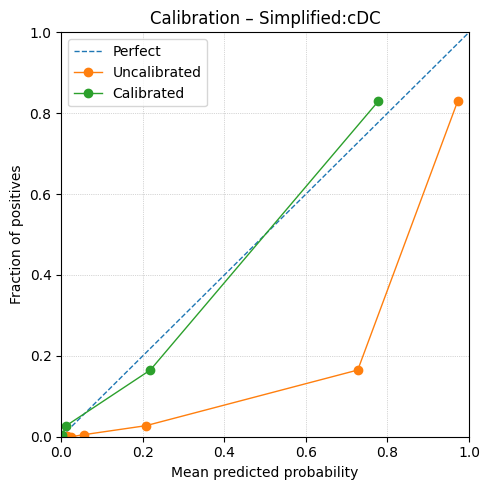

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Zhang/Models/Simplified_cDC/Simplified_cDC_bundle.joblib

cDC
               precision    recall  f1-score   support

           0       0.86      0.98      0.92       980
           1       0.98      0.84      0.90       980

    accuracy                           0.91      1960
   macro avg       0.92      0.91      0.91      1960
weighted avg       0.92      0.91      0.91      1960


Processing pDC (class 11/11)...
Training - Found 6486 / 6486 barcodes
Training - Pos: 3243, Neg: 3243
Training labels: 3243 pos, 3243 neg
Testing  - Found 1802 / 1802 barcodes
Testing  - Pos: 901, Neg: 901
Testing  - labels: 901 pos, 901 neg
Calibrating - Found 5716 rows | Pos: 360, Neg: 5356
All test data: 14282 rows, positives for pDC: 901
[scale] pDC: train mean ~ -0.000, std ~ 1.000

[NB] training → pDC
Fitting 10 folds for each of 10 candidates, t

Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.



[KNN] training → pDC
Fitting 10 folds for each of 10 candidates, totalling 100 fits


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.



[MLP] training → pDC
Fitting 10 folds for each of 10 candidates, totalling 100 fits
[CAL] pDC: cal positives=360/5716

Calibration metrics:
   Uncalibrated  |  Brier: 0.0172   LogLoss: 0.0648
     Calibrated  |  Brier: 0.0083   LogLoss: 0.0297


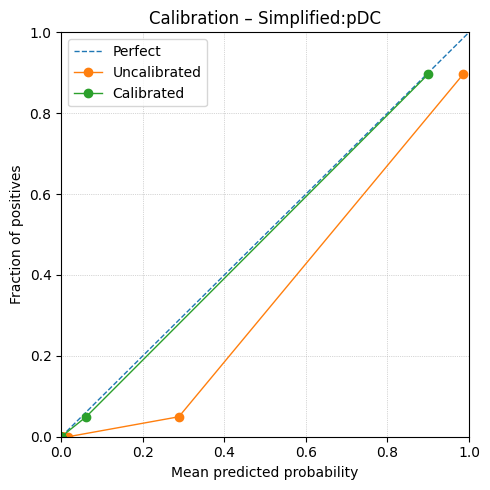

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Zhang/Models/Simplified_pDC/Simplified_pDC_bundle.joblib

pDC
               precision    recall  f1-score   support

           0       0.97      0.99      0.98       901
           1       0.99      0.97      0.98       901

    accuracy                           0.98      1802
   macro avg       0.98      0.98      0.98      1802
weighted avg       0.98      0.98      0.98      1802


Fitting multiclass TemperatureScaling on CAL split (excluded classes masked out)...

Preview of probabilities BEFORE (raw OvR) vs AFTER (multiclass TS) [included classes only]:
                                         raw_B     raw_CD4_T     raw_CD8_T  raw_Erythroid  raw_HSPC  raw_Monocyte  raw_Myeloid    raw_NK  raw_Plasma   raw_cDC   raw_pDC      mc_B      mc_CD4_T      mc_CD8_T  mc_Erythroid   mc_HSPC  mc_Monocyte  mc_Myeloid     mc_NK  mc_Plasma   

In [127]:
# -*- coding: utf-8 -*-
from pathlib import Path
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.ensemble import StackingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.calibration import CalibratedClassifierCV
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report, confusion_matrix

from netcal.scaling import TemperatureScaling
import joblib

# ------------------------------------------------------------------- CONFIG (expects these to already exist)
#   models_output, train_barcodes_path, test_barcodes_path
#   Zhang_data_Train, Zhang_data_Test, Zhang_data_Cal          (DataFrames indexed by barcode)
#   Zhang_dataset_Train, Zhang_dataset_Test, Zhang_dataset_Cal (AnnData with obs labels)
#   TotalSeqD_Heme_Oncology_CAT399906                    (iterable of feature names)
#   MLTraining module with: CV, train_NB, train_XGB, train_KNN, train_MLP,
#                           plot_calibration_curve, save_models, evaluate_classifier, append_metrics_csv

name_target_class = "Simplified"   # "simplified" | "Simplified" | "Detailed"
fig_root   = Path(models_output) / "Figures"
models_dir = Path(models_output) / "Models"
fig_root.mkdir(parents=True, exist_ok=True)
models_dir.mkdir(parents=True, exist_ok=True)

kf         = MLTraining.CV
num_cores  = -1
metrics_log = []

# ============================= HELPERS =============================

def _norm_feats(names) -> pd.Index:
    """
    Normalizer used ONLY to construct matching keys.
    Panel names remain untouched; data columns are normalized and then mapped BACK
    to the exact panel names via a lookup.
    """
    s = pd.Index(map(str, names))
    s = (s.str.strip()
           .str.lower()
           .str.replace(r"[ _/]+", "-", regex=True)
           .str.replace(r"-+", "-", regex=True)
           .str.strip("-"))
    return s

def attach_celltype(df: pd.DataFrame, ad: "AnnData", field: str) -> pd.DataFrame:
    if field not in ad.obs:
        raise KeyError(f"'{field}' not found in AnnData.obs")
    lab = (ad.obs[field]
             .astype("string")
             .str.strip()
             .str.replace(r"\s+", "_", regex=True))
    out = df.copy()
    out["Celltype"] = pd.Categorical(lab.reindex(out.index))
    if out["Celltype"].isna().any():
        missing = int(out["Celltype"].isna().sum())
        print(f"[WARN] {missing} rows got NaN Celltype after reindex; check barcode alignment.")
    return out

def _check_finite(df: pd.DataFrame, tag: str):
    arr = df.to_numpy()
    if not np.isfinite(arr).all():
        bad = np.where(~np.isfinite(arr))
        raise ValueError(f"Non-finite values found in {tag} features at positions {bad}")

def _unwrap_estimator(m):
    return getattr(m, "estimator", None) or getattr(m, "base_estimator", None) or m

def _assert_feature_counts(cell_name: str, models_dict: dict, expected: int):
    pairs = [
        ("NB",  models_dict.get("NB")),
        ("XGB", models_dict.get("XGB")),
        ("KNN", models_dict.get("KNN")),
        ("MLP", models_dict.get("MLP")),
        ("Stacker", models_dict.get("Stacker")),
    ]
    for name, est in pairs:
        if est is None:
            continue
        base = _unwrap_estimator(est)
        nfi = getattr(base, "n_features_in_", None)
        if nfi is not None and nfi != expected:
            raise RuntimeError(f"{cell_name}:{name} saw {nfi} features; expected {expected}")

# ============================= LABEL ATTACH =============================

consensus_field = f"Consensus_annotation_{name_target_class.lower()}_final"

Zhang_data_Train = attach_celltype(Zhang_data_Train, Zhang_dataset_Train, consensus_field)
Zhang_data_Test  = attach_celltype(Zhang_data_Test,  Zhang_dataset_Test,  consensus_field)
Zhang_data_Cal   = attach_celltype(Zhang_data_Cal,   Zhang_dataset_Cal,   consensus_field)

# ============================= PANEL & DATA COLUMN ALIGNMENT =============================

# Keep the panel EXACTLY as provided
panel = pd.Index(map(str, TotalSeqD_Heme_Oncology_CAT399906))

# Build a mapping: normalized_key -> exact panel name
panel_keys    = _norm_feats(panel)
norm_to_panel = dict(zip(panel_keys, panel))
if len(norm_to_panel) != len(panel):
    raise ValueError("Panel contains names that collide after normalization. Consider adjusting _norm_feats rules.")

def _rename_data_to_panel(df: pd.DataFrame) -> pd.DataFrame:
    """
    Rename only feature columns so that after normalization they map
    back to the exact panel column names. Keeps 'cell_barcode' and 'Celltype' intact.
    """
    df = df.copy()
    non_feat = [c for c in ["cell_barcode", "Celltype"] if c in df.columns]
    feat     = pd.Index([c for c in df.columns if c not in non_feat])

    feat_keys   = _norm_feats(feat)
    mapped      = [norm_to_panel.get(k) for k in feat_keys]  # None if not in panel
    rename_map  = {old: new for old, new in zip(feat, mapped) if new is not None}

    # Handle duplicate mappings (two data columns → same panel col). Keep first, drop the rest.
    seen, safe_map, drops = set(), {}, []
    for old, new in rename_map.items():
        if new in seen:
            drops.append(old)
        else:
            seen.add(new); safe_map[old] = new

    if drops:
        print(f"[WARN] Dropping {len(drops)} duplicated-mapped columns (showing up to 5): {drops[:5]}")

    if drops:
        df.drop(columns=drops, inplace=True, errors="ignore")
    df.rename(columns=safe_map, inplace=True)

    matched = len(safe_map)
    print(f"[map] matched {matched}/{len(feat)} data columns to panel")
    return df

# Apply: normalize/rename ONLY data splits (panel remains untouched)
Zhang_data_Train = _rename_data_to_panel(Zhang_data_Train)
Zhang_data_Test  = _rename_data_to_panel(Zhang_data_Test)
Zhang_data_Cal   = _rename_data_to_panel(Zhang_data_Cal)

# Intersect each split with the panel IN PANEL ORDER
def _panel_intersection(df: pd.DataFrame) -> pd.DataFrame:
    non_feat = [c for c in ["cell_barcode", "Celltype"] if c in df.columns]
    feat_cols = pd.Index([c for c in df.columns if c not in non_feat])
    inter = panel.intersection(feat_cols, sort=False)
    if inter.empty:
        raise ValueError("Panel/Data intersection is empty after renaming. Check mapping rules.")
    return df.reindex(columns=list(inter) + non_feat)

Zhang_data_Train = _panel_intersection(Zhang_data_Train)
Zhang_data_Test  = _panel_intersection(Zhang_data_Test)
Zhang_data_Cal   = _panel_intersection(Zhang_data_Cal)

# ============================= FEATURES & LABELS =============================

Zhang_data_Cal_lbl = Zhang_data_Cal[["Celltype"]].copy()

drop_cols_train = [c for c in ["cell_barcode", "Celltype"] if c in Zhang_data_Train.columns]
drop_cols_test  = [c for c in ["cell_barcode", "Celltype"] if c in Zhang_data_Test.columns]
drop_cols_cal   = [c for c in ["cell_barcode", "Celltype"] if c in Zhang_data_Cal.columns]

Zhang_data_Train_Sub = Zhang_data_Train.drop(columns=drop_cols_train, errors="ignore")
Zhang_data_Test_Sub  = Zhang_data_Test.drop(columns=drop_cols_test,  errors="ignore")
Zhang_data_Cal_Sub   = Zhang_data_Cal.drop(columns=drop_cols_cal,    errors="ignore")

# SAFETY: shared columns & finiteness checks
cols_train = list(Zhang_data_Train_Sub.columns)
if list(Zhang_data_Test_Sub.columns) != cols_train or list(Zhang_data_Cal_Sub.columns) != cols_train:
    raise ValueError("Train/Cal/Test feature columns differ after panel intersection!")

_check_finite(Zhang_data_Train_Sub, "TRAIN")
_check_finite(Zhang_data_Test_Sub,  "TEST")
_check_finite(Zhang_data_Cal_Sub,   "CAL")

print(f"\n[features] Using {len(cols_train)} panel-intersected features (exact panel names):")
print(cols_train)

# ===== Exclude specific classes from the multiclass set and per-class loop =====
EXCLUDE_CLASSES = {"Macrophage", "ILC", "Stroma"}

all_classes = sorted(pd.Series(Zhang_data_Train["Celltype"]).dropna().unique())
class_names = [c for c in all_classes if c not in EXCLUDE_CLASSES]
if not class_names:
    raise ValueError("After exclusions, class_names is empty.")
print(f"[classes] Included ({len(class_names)}): {class_names}")
if missing := [c for c in all_classes if c in EXCLUDE_CLASSES]:
    print(f"[classes] Excluded: {missing}")

K            = len(class_names)
class_to_idx = {c: i for i, c in enumerate(class_names)}

# --- Multiclass labels (MASKED to included classes) ---
# CAL
mask_cal_mc = Zhang_data_Cal_lbl["Celltype"].isin(class_names)
s_cal = Zhang_data_Cal_lbl.loc[mask_cal_mc, "Celltype"].map(class_to_idx)
if s_cal.isna().any():
    missing = Zhang_data_Cal_lbl.loc[mask_cal_mc & s_cal.isna(), "Celltype"].unique()
    raise ValueError(f"Unknown labels in masked CAL split: {missing}")
y_cal_multiclass = s_cal.to_numpy(dtype=np.int64)

# TEST
mask_test_mc = Zhang_data_Test["Celltype"].isin(class_names)
s_te = Zhang_data_Test.loc[mask_test_mc, "Celltype"].map(class_to_idx)
if s_te.isna().any():
    missing = Zhang_data_Test.loc[mask_test_mc & s_te.isna(), "Celltype"].unique()
    raise ValueError(f"Unknown labels in masked TEST split: {missing}")
y_test_multiclass = s_te.to_numpy(dtype=np.int64)

# Reuse across classes
X_cal_all_df = Zhang_data_Cal_Sub.copy()
X_te_all_df  = Zhang_data_Test_Sub.copy()

# Preallocate OvR prob mats (only for included classes)
P_cal = np.zeros((X_cal_all_df.shape[0], K), dtype=float)
P_te  = np.zeros((X_te_all_df.shape[0],  K), dtype=float)

test_index = Zhang_data_Test_Sub.index

# ============================= TRAIN PER-CLASS OVR =============================

for celltype in class_names:
    k = class_to_idx[celltype]
    name = str(celltype).replace(" ", "_")
    print(f"\nProcessing {name} (class {k+1}/{K})...")

    # ---- TRAIN slice via barcode lists
    train_barcodes_df = pd.read_csv(
        f"{train_barcodes_path}/Zhang/Consensus_annotation_simplified_final/Barcodes_training_class_{name}.csv",
        index_col=0
    )
    train_positive_barcodes = train_barcodes_df["Positive"].dropna().values
    train_negative_barcodes = train_barcodes_df["Negative"].dropna().values
    all_train_barcodes = np.concatenate([train_positive_barcodes, train_negative_barcodes])

    train_mask = Zhang_data_Train_Sub.index.isin(all_train_barcodes)
    X_tr_df = Zhang_data_Train_Sub.loc[train_mask]
    found_train_barcodes = X_tr_df.index.values
    y_tr = np.isin(found_train_barcodes, train_positive_barcodes).astype(int)

    # ---- Skip guards
    if X_tr_df.empty or np.unique(y_tr).size < 2:
        print(f"[SKIP] {name}: empty or single-class train slice (pos={y_tr.sum()}, neg={(len(y_tr)-y_tr.sum())}).")
        continue

    # ---- TEST slice via barcode lists
    test_barcodes_df = pd.read_csv(
        f"{test_barcodes_path}/Zhang/Consensus_annotation_simplified_final/Barcodes_testing_class_{name}.csv",
        index_col=0
    )
    test_positive_barcodes = test_barcodes_df["Positive"].dropna().values
    test_negative_barcodes = test_barcodes_df["Negative"].dropna().values
    all_test_barcodes = np.concatenate([test_positive_barcodes, test_negative_barcodes])

    test_mask = Zhang_data_Test_Sub.index.isin(all_test_barcodes)
    X_te_df = Zhang_data_Test_Sub.loc[test_mask]
    found_test_barcodes = X_te_df.index.values
    y_te = np.isin(found_test_barcodes, test_positive_barcodes).astype(int)

    # ---- Full-test & cal for this binary head
    X_te_all_local = X_te_all_df.copy()
    y_te_all = (Zhang_data_Test["Celltype"].values == celltype).astype(int)
    X_cal_df = X_cal_all_df.copy()
    y_cal_bin = (Zhang_data_Cal_lbl["Celltype"].values == celltype).astype(int)

    # ---- Info
    print(f"Training - Found {X_tr_df.shape[0]} / {len(all_train_barcodes)} barcodes")
    print(f"Training - Pos: {len(train_positive_barcodes)}, Neg: {len(train_negative_barcodes)}")
    print(f"Training labels: {y_tr.sum()} pos, {len(y_tr)-y_tr.sum()} neg")
    print(f"Testing  - Found {X_te_df.shape[0]} / {len(all_test_barcodes)} barcodes")
    print(f"Testing  - Pos: {len(test_positive_barcodes)}, Neg: {len(test_negative_barcodes)}")
    print(f"Testing  - labels: {y_te.sum()} pos, {len(y_te)-y_te.sum()} neg")
    print(f"Calibrating - Found {X_cal_df.shape[0]} rows | Pos: {y_cal_bin.sum()}, Neg: {len(y_cal_bin)-y_cal_bin.sum()}")
    print(f"All test data: {X_te_all_local.shape[0]} rows, positives for {celltype}: {y_te_all.sum()}")

    # ---- Scaling (fit on per-head TRAIN slice; transform others)
    scaler = StandardScaler(with_mean=True, with_std=True).fit(X_tr_df.values)

    def _sc(df):
        return pd.DataFrame(
            scaler.transform(df.values),
            index=df.index,
            columns=cols_train,
        )

    X_tr_sc_df     = _sc(X_tr_df)
    X_te_sc_df     = _sc(X_te_df)
    X_te_all_sc_df = _sc(X_te_all_local)
    X_cal_sc_df    = _sc(X_cal_df)

    print(f"[scale] {name}: train mean ~ {X_tr_sc_df.values.mean():.3f}, std ~ {X_tr_sc_df.values.std():.3f}")

    # ---- Base learners
    NB_model  = MLTraining.train_NB (X_tr_sc_df, y_tr, cv=kf, num_cores=num_cores, name_target_subclass=name)
    XGB_model = MLTraining.train_XGB(X_tr_sc_df, y_tr, cv=kf, num_cores=num_cores, name_target_subclass=name)
    KNN_model = MLTraining.train_KNN(X_tr_sc_df, y_tr, cv=kf, num_cores=num_cores, name_target_subclass=name)
    MLP_model = MLTraining.train_MLP(X_tr_sc_df, y_tr, cv=kf, num_cores=num_cores, name_target_subclass=name)

    # ---- Stacker (raw)
    stacker_raw = StackingClassifier(
        estimators=[("NB", NB_model), ("XGB", XGB_model), ("KNN", KNN_model), ("MLP", MLP_model)],
        final_estimator=LogisticRegression(max_iter=2000, class_weight="balanced", random_state=42),
        stack_method="predict_proba",
        cv=kf,
        n_jobs=-1,
    ).fit(X_tr_sc_df, y_tr)

    # ---- Feature count asserts (debug safety)
    expected_feats = len(cols_train)
    _assert_feature_counts(name, {
        "NB": NB_model, "XGB": XGB_model, "KNN": KNN_model, "MLP": MLP_model, "Stacker": stacker_raw
    }, expected_feats)

    # ---- Binary calibration (Platt, guarded)
    pos_cal    = int(y_cal_bin.sum())
    n_cal_bin  = int(len(y_cal_bin))
    has_both   = (0 < pos_cal < n_cal_bin)
    print(f"[CAL] {name}: cal positives={pos_cal}/{n_cal_bin}")

    if has_both:
        try:
            calibrator = CalibratedClassifierCV(estimator=stacker_raw, method="sigmoid", cv="prefit")
        except TypeError:  # older sklearn
            calibrator = CalibratedClassifierCV(base_estimator=stacker_raw, method="sigmoid", cv="prefit")
        stacker = calibrator.fit(X_cal_sc_df, y_cal_bin)
    else:
        print(f"[WARN] Skipping calibration for {name}: single-class cal set.")
        stacker = stacker_raw

    # ---- Calibration plot on all-test (optional)
    try:
        y_proba_uncal = stacker_raw.predict_proba(X_te_all_sc_df)[:, 1]
        y_proba_cal   = stacker.predict_proba(X_te_all_sc_df)[:, 1]
        if has_both:
            _ = MLTraining.plot_calibration_curve(
                y_te_all, [y_proba_uncal, y_proba_cal],
                clf_names=["Uncalibrated", "Calibrated"],
                n_bins=15, strategy="quantile",
                title=f"Calibration – {name_target_class}:{name}"
            )
        else:
            _ = MLTraining.plot_calibration_curve(
                y_te_all, [y_proba_uncal],
                clf_names=["Uncalibrated"],
                n_bins=15, strategy="quantile",
                title=f"Calibration (uncal only) – {name_target_class}:{name}"
            )
        plt.tight_layout()
        plt.show()
    except Exception as e:
        print(f"[WARN] Skipped calibration plot for {name}: {e}")

    # ---- Save per-class bundle (model + scaler + columns)
    save_subdir = models_dir / f"{name_target_class}_{name}"
    save_subdir.mkdir(parents=True, exist_ok=True)

    MLTraining.save_models({"Stacked": stacker}, out_dir=save_subdir, tag=f"{name_target_class}_{name}")
    joblib.dump(cols_train, save_subdir / "feature_names.joblib")

    bundle = {
        "atlas": "Zhang",
        "depth": name_target_class,
        "label": celltype,
        "model": stacker,          # CalibratedClassifierCV(StackingClassifier) or StackingClassifier
        "columns": cols_train,     # exact panel names, panel order
        "scaler": scaler,          # per-head scaler
        "panel_name": "TotalSeqD_Heme_Oncology_CAT399906",
    }
    bundle_path = save_subdir / f"{name_target_class}_{name}_bundle.joblib"
    joblib.dump(bundle, bundle_path)
    print(f"[SAVE] Wrote bundle with columns+scaler to {bundle_path}")

    # ---- Binary metrics on the class-specific test slice
    try:
        m = MLTraining.evaluate_classifier(stacker, X_te_sc_df, y_te, plot_cm=False)
        m.update(celltype=celltype)
        metrics_log.append(m)
        print(f"\n{celltype}\n", m.get("report", ""))
    except Exception as e:
        print(f"[WARN] Binary metrics for {name} skipped: {e}")

    # ---- Store OvR probs for multiclass calibration (columns order = class_names)
    P_cal[:, k] = stacker.predict_proba(X_cal_sc_df)[:, 1]
    P_te[:,  k] = stacker.predict_proba(X_te_all_sc_df)[:, 1]

# ============================= MULTICLASS CALIBRATION =============================

print("\nFitting multiclass TemperatureScaling on CAL split (excluded classes masked out)...")

# Guards: ensure probs are in [0,1]
if (P_cal < 0).any() or (P_cal > 1).any():
    raise ValueError("P_cal must be probabilities in [0,1].")
if (P_te < 0).any() or (P_te > 1).any():
    raise ValueError("P_te must be probabilities in [0,1].")

ts_cal = TemperatureScaling()
# Fit only on CAL rows whose true label is one of the included classes
ts_cal.fit(P_cal[mask_cal_mc.values, :], y_cal_multiclass)
P_te_mc = ts_cal.transform(P_te)

# Ensure calibrated probs shape (K)
P_te_mc = np.asarray(P_te_mc)
if P_te_mc.ndim == 1:
    P_te_mc = P_te_mc.reshape(-1, 1)
if P_te_mc.shape[1] == 1 and K == 2:
    P_te_mc = np.hstack([1.0 - P_te_mc, P_te_mc])
elif P_te_mc.shape[1] != K:
    # Fallback: normalize OvR sums
    row_sums = P_te.sum(axis=1, keepdims=True)
    row_sums[row_sums == 0.0] = 1.0
    P_te_mc = P_te / row_sums
    print(f"[WARN] TemperatureScaling returned shape {P_te_mc.shape}; fell back to sum-normalized OvR probs.")

# Persist multiclass temp scaler + INCLUDED class names
joblib.dump(ts_cal, models_dir / f"{name_target_class}_multiclass_temp_scaler.joblib")
(pd.Series(class_names, name="class_name")
   .to_csv(models_dir / f"{name_target_class}_class_names.csv", index=False))

# ============================= PROBS COMPARISON & METRICS =============================

# Evaluate & save on TEST rows whose true label is an INCLUDED class
test_index_masked = Zhang_data_Test_Sub.index[mask_test_mc.values]

probs_raw_df = pd.DataFrame(P_te[mask_test_mc.values, :],    index=test_index_masked,
                            columns=[f"raw_{c}" for c in class_names])
probs_mc_df  = pd.DataFrame(P_te_mc[mask_test_mc.values, :], index=test_index_masked,
                            columns=[f"mc_{c}"  for c in class_names])

probs_compare = pd.concat([probs_raw_df, probs_mc_df], axis=1)
probs_compare["true_label"]    = Zhang_data_Test.loc[mask_test_mc, "Celltype"].values
probs_compare["pred_raw"]      = P_te[mask_test_mc.values, :].argmax(axis=1)
probs_compare["pred_mc"]       = P_te_mc[mask_test_mc.values, :].argmax(axis=1)
probs_compare["pred_raw_name"] = [class_names[i] for i in probs_compare["pred_raw"].values]
probs_compare["pred_mc_name"]  = [class_names[i] for i in probs_compare["pred_mc"].values]

print("\nPreview of probabilities BEFORE (raw OvR) vs AFTER (multiclass TS) [included classes only]:")
print(probs_compare.head(10).to_string())

probs_compare_path = models_dir / f"{name_target_class}_probabilities_before_after_TEST_included.csv"
probs_compare.to_csv(probs_compare_path, index=True)
print(f"\nSaved probabilities comparison to: {probs_compare_path}")

# Multiclass evaluation on the masked subset
y_pred_mc = P_te_mc[mask_test_mc.values, :].argmax(axis=1)
print("\nMulticlass classification report (TEST, excluded classes removed):")
print(classification_report(y_test_multiclass, y_pred_mc, target_names=class_names, digits=3))

cm = confusion_matrix(y_test_multiclass, y_pred_mc, labels=range(K))
print("Confusion matrix (rows=true, cols=pred):\n", cm)

# Per-class binary head metrics CSV
metrics_df = pd.DataFrame.from_records(metrics_log)
MLTraining.append_metrics_csv(metrics_df, csv_path=Path(models_output) / "stacker_metrics.csv")

print("\nDone.")


#### Detailed annotation

[map] matched 34/34 data columns to panel
[map] matched 34/34 data columns to panel
[map] matched 34/34 data columns to panel

[features] Using 34 panel-intersected features (exact panel names):
['CD10', 'CD117', 'CD11b', 'CD11c', 'CD123', 'CD13', 'CD138', 'CD14', 'CD141', 'CD16', 'CD163', 'CD19', 'CD2', 'CD25', 'CD304', 'CD33', 'CD34', 'CD38', 'CD4', 'CD44', 'CD45', 'CD45RA', 'CD45RO', 'CD5', 'CD56', 'CD62L', 'CD62P', 'CD64', 'CD69', 'CD7', 'CD71', 'CD8', 'CD83', 'CD90']
[classes] Included (27): ['B_Memory', 'B_Naive', 'CD14_Mono', 'CD16_Mono', 'CD4_T_Memory', 'CD4_T_Naive', 'CD8_T_Memory', 'CD8_T_Naive', 'EoBaMaP', 'ErP', 'Erythroblast', 'GMP', 'HSC_MPP', 'Immature_B', 'MAIT', 'MEP', 'MkP', 'Myeloid_progenitor', 'NK_CD56_bright', 'NK_CD56_dim', 'Plasma', 'Pre-B', 'Pre-Pro-B', 'Pro-B', 'cDC1', 'cDC2', 'pDC']
[classes] Excluded: ['Macrophage', 'Stroma']

Processing B_Memory (class 1/27)...
Training - Found 104 / 104 barcodes
Training - Pos: 52, Neg: 52
Training labels: 52 pos, 52 neg
T

Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.



[KNN] training → B_Memory
Fitting 10 folds for each of 10 candidates, totalling 100 fits

[MLP] training → B_Memory
Fitting 10 folds for each of 10 candidates, totalling 100 fits
[CAL] B_Memory: cal positives=6/5716

Calibration metrics:
   Uncalibrated  |  Brier: 0.0157   LogLoss: 0.0886
     Calibrated  |  Brier: 0.0008   LogLoss: 0.0032


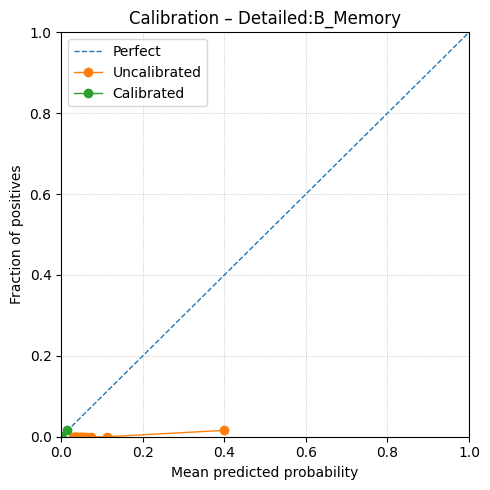

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Zhang/Models/Detailed_B_Memory/Detailed_B_Memory_bundle.joblib

B_Memory
               precision    recall  f1-score   support

           0       0.50      1.00      0.67        15
           1       0.00      0.00      0.00        15

    accuracy                           0.50        30
   macro avg       0.25      0.50      0.33        30
weighted avg       0.25      0.50      0.33        30


Processing B_Naive (class 2/27)...
Training - Found 246 / 246 barcodes
Training - Pos: 123, Neg: 123
Training labels: 123 pos, 123 neg
Testing  - Found 68 / 68 barcodes
Testing  - Pos: 34, Neg: 34
Testing  - labels: 34 pos, 34 neg
Calibrating - Found 5716 rows | Pos: 14, Neg: 5702
All test data: 14282 rows, positives for B_Naive: 34
[scale] B_Naive: train mean ~ -0.000, std ~ 1.000

[NB] training → B_Naive
Fitting 10 folds for each of 10 can

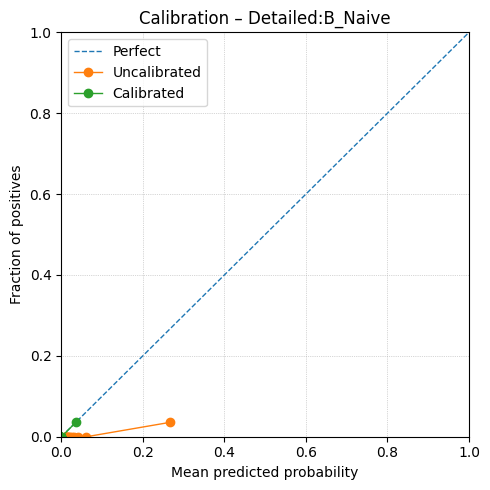

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Zhang/Models/Detailed_B_Naive/Detailed_B_Naive_bundle.joblib

B_Naive
               precision    recall  f1-score   support

           0       0.83      1.00      0.91        34
           1       1.00      0.79      0.89        34

    accuracy                           0.90        68
   macro avg       0.91      0.90      0.90        68
weighted avg       0.91      0.90      0.90        68


Processing CD14_Mono (class 3/27)...
Training - Found 5346 / 5346 barcodes
Training - Pos: 2673, Neg: 2673
Training labels: 2673 pos, 2673 neg
Testing  - Found 1486 / 1486 barcodes
Testing  - Pos: 743, Neg: 743
Testing  - labels: 743 pos, 743 neg
Calibrating - Found 5716 rows | Pos: 297, Neg: 5419
All test data: 14282 rows, positives for CD14_Mono: 743
[scale] CD14_Mono: train mean ~ -0.000, std ~ 1.000

[NB] training → CD14_Mono
Fitting 10 fol

Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.



[KNN] training → CD14_Mono
Fitting 10 folds for each of 10 candidates, totalling 100 fits


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.



[MLP] training → CD14_Mono
Fitting 10 folds for each of 10 candidates, totalling 100 fits
[CAL] CD14_Mono: cal positives=297/5716

Calibration metrics:
   Uncalibrated  |  Brier: 0.0159   LogLoss: 0.0535
     Calibrated  |  Brier: 0.0059   LogLoss: 0.0229


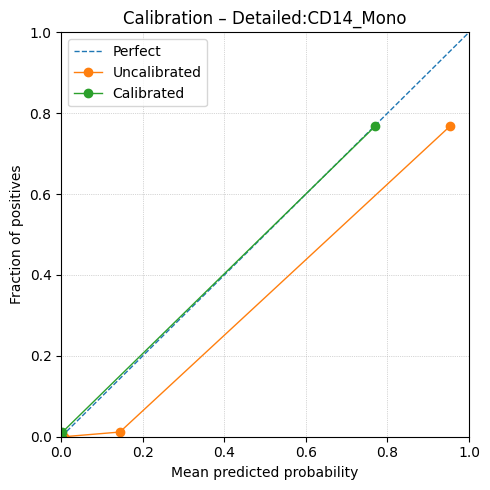

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Zhang/Models/Detailed_CD14_Mono/Detailed_CD14_Mono_bundle.joblib

CD14_Mono
               precision    recall  f1-score   support

           0       0.96      0.99      0.98       743
           1       0.99      0.96      0.98       743

    accuracy                           0.98      1486
   macro avg       0.98      0.98      0.98      1486
weighted avg       0.98      0.98      0.98      1486


Processing CD16_Mono (class 4/27)...
Training - Found 942 / 942 barcodes
Training - Pos: 471, Neg: 471
Training labels: 471 pos, 471 neg
Testing  - Found 262 / 262 barcodes
Testing  - Pos: 131, Neg: 131
Testing  - labels: 131 pos, 131 neg
Calibrating - Found 5716 rows | Pos: 52, Neg: 5664
All test data: 14282 rows, positives for CD16_Mono: 131
[scale] CD16_Mono: train mean ~ 0.000, std ~ 1.000

[NB] training → CD16_Mono
Fitting 10 folds f

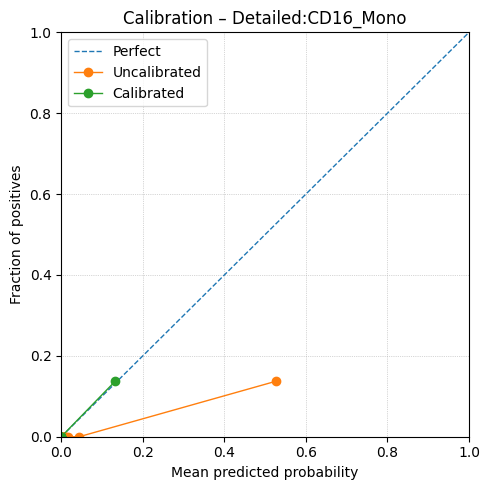

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Zhang/Models/Detailed_CD16_Mono/Detailed_CD16_Mono_bundle.joblib

CD16_Mono
               precision    recall  f1-score   support

           0       0.94      1.00      0.97       131
           1       1.00      0.94      0.97       131

    accuracy                           0.97       262
   macro avg       0.97      0.97      0.97       262
weighted avg       0.97      0.97      0.97       262


Processing CD4_T_Memory (class 5/27)...
Training - Found 3704 / 3704 barcodes
Training - Pos: 1852, Neg: 1852
Training labels: 1852 pos, 1852 neg
Testing  - Found 1030 / 1030 barcodes
Testing  - Pos: 515, Neg: 515
Testing  - labels: 515 pos, 515 neg
Calibrating - Found 5716 rows | Pos: 206, Neg: 5510
All test data: 14282 rows, positives for CD4_T_Memory: 515
[scale] CD4_T_Memory: train mean ~ 0.000, std ~ 1.000

[NB] training → CD4_T_Memo

Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.



[KNN] training → CD4_T_Memory
Fitting 10 folds for each of 10 candidates, totalling 100 fits

[MLP] training → CD4_T_Memory
Fitting 10 folds for each of 10 candidates, totalling 100 fits
[CAL] CD4_T_Memory: cal positives=206/5716

Calibration metrics:
   Uncalibrated  |  Brier: 0.0207   LogLoss: 0.0675
     Calibrated  |  Brier: 0.0067   LogLoss: 0.0231


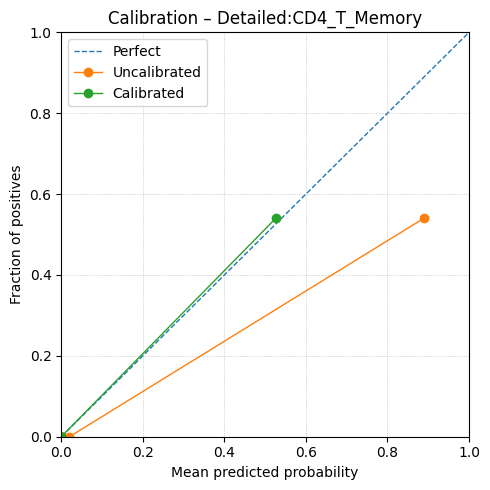

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Zhang/Models/Detailed_CD4_T_Memory/Detailed_CD4_T_Memory_bundle.joblib

CD4_T_Memory
               precision    recall  f1-score   support

           0       0.96      1.00      0.98       515
           1       1.00      0.95      0.97       515

    accuracy                           0.97      1030
   macro avg       0.98      0.97      0.97      1030
weighted avg       0.98      0.97      0.97      1030


Processing CD4_T_Naive (class 6/27)...
Training - Found 370 / 370 barcodes
Training - Pos: 185, Neg: 185
Training labels: 185 pos, 185 neg
Testing  - Found 102 / 102 barcodes
Testing  - Pos: 51, Neg: 51
Testing  - labels: 51 pos, 51 neg
Calibrating - Found 5716 rows | Pos: 21, Neg: 5695
All test data: 14282 rows, positives for CD4_T_Naive: 51
[scale] CD4_T_Naive: train mean ~ 0.000, std ~ 1.000

[NB] training → CD4_T_Naive
Fittin

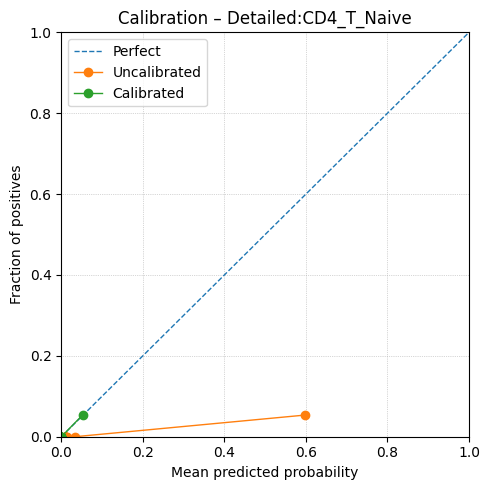

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Zhang/Models/Detailed_CD4_T_Naive/Detailed_CD4_T_Naive_bundle.joblib

CD4_T_Naive
               precision    recall  f1-score   support

           0       0.50      1.00      0.67        51
           1       0.00      0.00      0.00        51

    accuracy                           0.50       102
   macro avg       0.25      0.50      0.33       102
weighted avg       0.25      0.50      0.33       102


Processing CD8_T_Memory (class 7/27)...
Training - Found 1600 / 1600 barcodes
Training - Pos: 800, Neg: 800
Training labels: 800 pos, 800 neg
Testing  - Found 444 / 444 barcodes
Testing  - Pos: 222, Neg: 222
Testing  - labels: 222 pos, 222 neg
Calibrating - Found 5716 rows | Pos: 89, Neg: 5627
All test data: 14282 rows, positives for CD8_T_Memory: 222
[scale] CD8_T_Memory: train mean ~ -0.000, std ~ 1.000

[NB] training → CD8_T_Memo

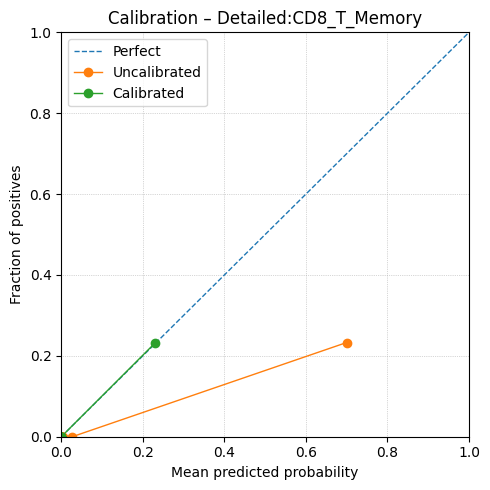

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Zhang/Models/Detailed_CD8_T_Memory/Detailed_CD8_T_Memory_bundle.joblib

CD8_T_Memory
               precision    recall  f1-score   support

           0       0.80      1.00      0.89       222
           1       0.99      0.76      0.86       222

    accuracy                           0.88       444
   macro avg       0.90      0.88      0.87       444
weighted avg       0.90      0.88      0.87       444


Processing CD8_T_Naive (class 8/27)...
Training - Found 1306 / 1306 barcodes
Training - Pos: 653, Neg: 653
Training labels: 653 pos, 653 neg
Testing  - Found 362 / 362 barcodes
Testing  - Pos: 181, Neg: 181
Testing  - labels: 181 pos, 181 neg
Calibrating - Found 5716 rows | Pos: 73, Neg: 5643
All test data: 14282 rows, positives for CD8_T_Naive: 181
[scale] CD8_T_Naive: train mean ~ 0.000, std ~ 1.000

[NB] training → CD8_T_Naive

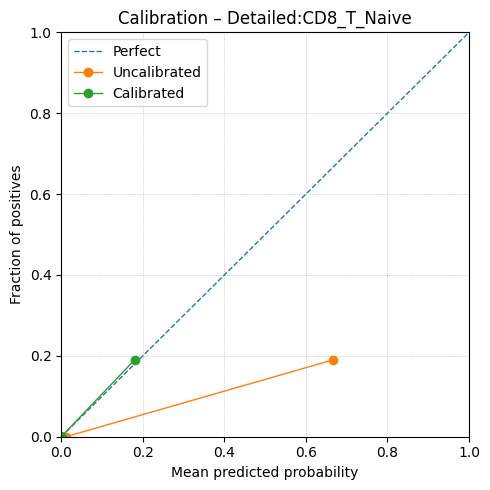

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Zhang/Models/Detailed_CD8_T_Naive/Detailed_CD8_T_Naive_bundle.joblib

CD8_T_Naive
               precision    recall  f1-score   support

           0       0.93      1.00      0.97       181
           1       1.00      0.93      0.96       181

    accuracy                           0.96       362
   macro avg       0.97      0.96      0.96       362
weighted avg       0.97      0.96      0.96       362


Processing EoBaMaP (class 9/27)...
Training - Found 1384 / 1384 barcodes
Training - Pos: 692, Neg: 692
Training labels: 692 pos, 692 neg
Testing  - Found 384 / 384 barcodes
Testing  - Pos: 192, Neg: 192
Testing  - labels: 192 pos, 192 neg
Calibrating - Found 5716 rows | Pos: 77, Neg: 5639
All test data: 14282 rows, positives for EoBaMaP: 192
[scale] EoBaMaP: train mean ~ -0.000, std ~ 1.000

[NB] training → EoBaMaP
Fitting 10 folds 

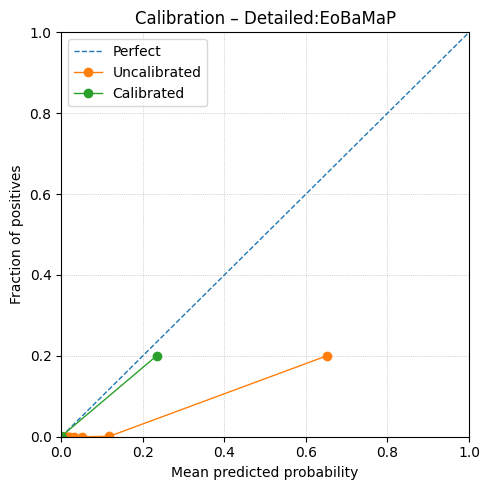

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Zhang/Models/Detailed_EoBaMaP/Detailed_EoBaMaP_bundle.joblib

EoBaMaP
               precision    recall  f1-score   support

           0       0.91      0.99      0.95       192
           1       0.99      0.91      0.95       192

    accuracy                           0.95       384
   macro avg       0.95      0.95      0.95       384
weighted avg       0.95      0.95      0.95       384


Processing ErP (class 10/27)...
Training - Found 10968 / 10968 barcodes
Training - Pos: 5484, Neg: 5484
Training labels: 5484 pos, 5484 neg
Testing  - Found 3046 / 3046 barcodes
Testing  - Pos: 1523, Neg: 1523
Testing  - labels: 1523 pos, 1523 neg
Calibrating - Found 5716 rows | Pos: 609, Neg: 5107
All test data: 14282 rows, positives for ErP: 1523
[scale] ErP: train mean ~ -0.000, std ~ 1.000

[NB] training → ErP
Fitting 10 folds for each of 1

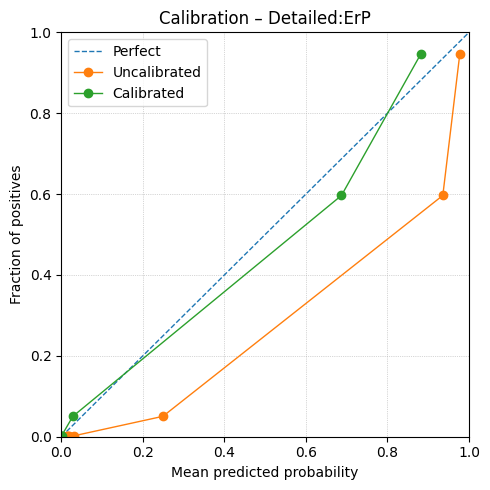

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Zhang/Models/Detailed_ErP/Detailed_ErP_bundle.joblib

ErP
               precision    recall  f1-score   support

           0       0.93      0.98      0.96      1523
           1       0.98      0.93      0.95      1523

    accuracy                           0.96      3046
   macro avg       0.96      0.96      0.96      3046
weighted avg       0.96      0.96      0.96      3046


Processing Erythroblast (class 11/27)...
Training - Found 278 / 278 barcodes
Training - Pos: 139, Neg: 139
Training labels: 139 pos, 139 neg
Testing  - Found 76 / 76 barcodes
Testing  - Pos: 38, Neg: 38
Testing  - labels: 38 pos, 38 neg
Calibrating - Found 5716 rows | Pos: 15, Neg: 5701
All test data: 14282 rows, positives for Erythroblast: 38
[scale] Erythroblast: train mean ~ 0.000, std ~ 1.000

[NB] training → Erythroblast
Fitting 10 folds for each of 1

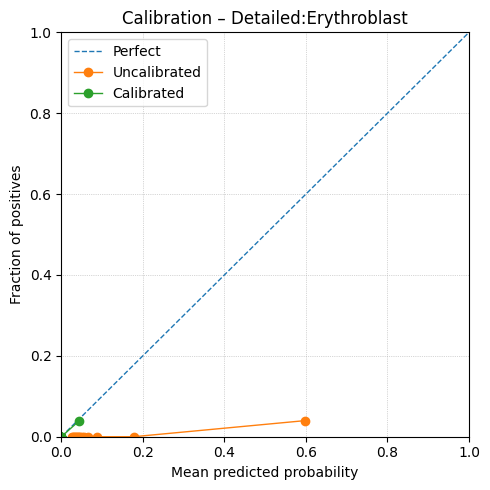

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Zhang/Models/Detailed_Erythroblast/Detailed_Erythroblast_bundle.joblib

Erythroblast
               precision    recall  f1-score   support

           0       0.52      1.00      0.68        38
           1       1.00      0.08      0.15        38

    accuracy                           0.54        76
   macro avg       0.76      0.54      0.42        76
weighted avg       0.76      0.54      0.42        76


Processing GMP (class 12/27)...
Training - Found 7768 / 7768 barcodes
Training - Pos: 3884, Neg: 3884
Training labels: 3884 pos, 3884 neg
Testing  - Found 2158 / 2158 barcodes
Testing  - Pos: 1079, Neg: 1079
Testing  - labels: 1079 pos, 1079 neg
Calibrating - Found 5716 rows | Pos: 432, Neg: 5284
All test data: 14282 rows, positives for GMP: 1079
[scale] GMP: train mean ~ -0.000, std ~ 1.000

[NB] training → GMP
Fitting 10 folds 

Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.



[KNN] training → GMP
Fitting 10 folds for each of 10 candidates, totalling 100 fits

[MLP] training → GMP
Fitting 10 folds for each of 10 candidates, totalling 100 fits
[CAL] GMP: cal positives=432/5716

Calibration metrics:
   Uncalibrated  |  Brier: 0.0643   LogLoss: 0.2108
     Calibrated  |  Brier: 0.0242   LogLoss: 0.0803


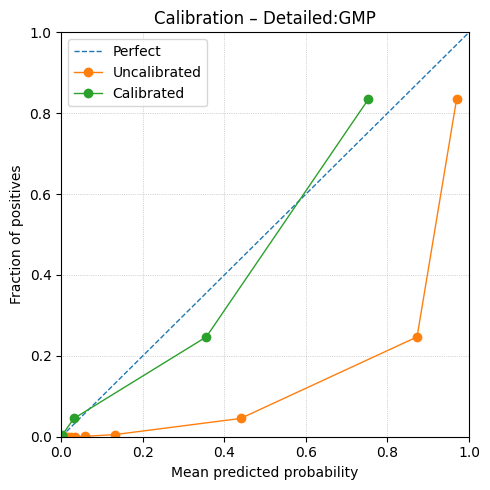

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Zhang/Models/Detailed_GMP/Detailed_GMP_bundle.joblib

GMP
               precision    recall  f1-score   support

           0       0.87      0.97      0.92      1079
           1       0.97      0.86      0.91      1079

    accuracy                           0.91      2158
   macro avg       0.92      0.91      0.91      2158
weighted avg       0.92      0.91      0.91      2158


Processing HSC_MPP (class 13/27)...
Training - Found 21126 / 21126 barcodes
Training - Pos: 10563, Neg: 10563
Training labels: 10563 pos, 10563 neg
Testing  - Found 5868 / 5868 barcodes
Testing  - Pos: 2934, Neg: 2934
Testing  - labels: 2934 pos, 2934 neg
Calibrating - Found 5716 rows | Pos: 1174, Neg: 4542
All test data: 14282 rows, positives for HSC_MPP: 2934
[scale] HSC_MPP: train mean ~ 0.000, std ~ 1.000

[NB] training → HSC_MPP
Fitting 10 folds for e

Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid st


[KNN] training → HSC_MPP
Fitting 10 folds for each of 10 candidates, totalling 100 fits

[MLP] training → HSC_MPP
Fitting 10 folds for each of 10 candidates, totalling 100 fits
[CAL] HSC_MPP: cal positives=1174/5716

Calibration metrics:
   Uncalibrated  |  Brier: 0.0515   LogLoss: 0.1759
     Calibrated  |  Brier: 0.0372   LogLoss: 0.1273


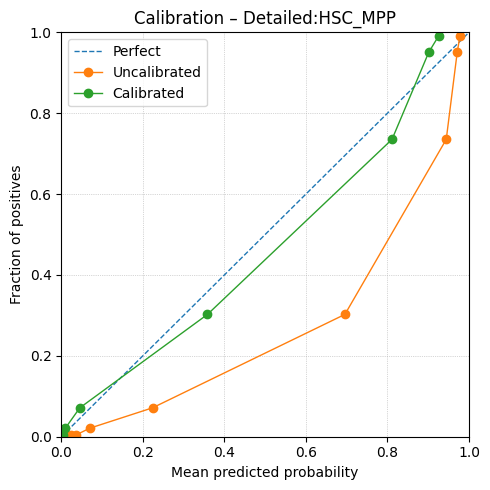

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Zhang/Models/Detailed_HSC_MPP/Detailed_HSC_MPP_bundle.joblib

HSC_MPP
               precision    recall  f1-score   support

           0       0.91      0.96      0.94      2934
           1       0.96      0.91      0.93      2934

    accuracy                           0.93      5868
   macro avg       0.93      0.93      0.93      5868
weighted avg       0.93      0.93      0.93      5868


Processing Immature_B (class 14/27)...
Training - Found 2732 / 2732 barcodes
Training - Pos: 1366, Neg: 1366
Training labels: 1366 pos, 1366 neg
Testing  - Found 758 / 758 barcodes
Testing  - Pos: 379, Neg: 379
Testing  - labels: 379 pos, 379 neg
Calibrating - Found 5716 rows | Pos: 152, Neg: 5564
All test data: 14282 rows, positives for Immature_B: 379
[scale] Immature_B: train mean ~ -0.000, std ~ 1.000

[NB] training → Immature_B
Fitting 10 

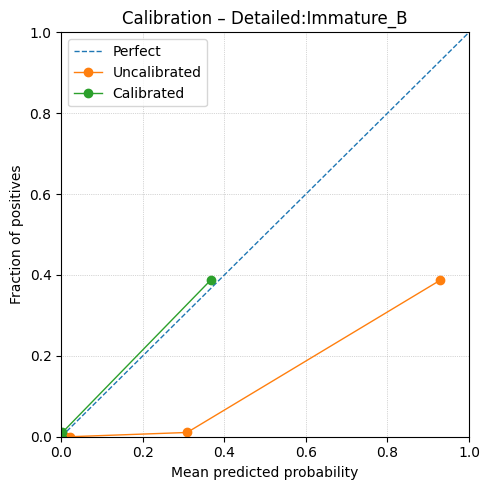

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Zhang/Models/Detailed_Immature_B/Detailed_Immature_B_bundle.joblib

Immature_B
               precision    recall  f1-score   support

           0       0.80      0.99      0.89       379
           1       0.99      0.75      0.85       379

    accuracy                           0.87       758
   macro avg       0.89      0.87      0.87       758
weighted avg       0.89      0.87      0.87       758


Processing MAIT (class 15/27)...
Training - Found 486 / 486 barcodes
Training - Pos: 243, Neg: 243
Training labels: 243 pos, 243 neg
Testing  - Found 134 / 134 barcodes
Testing  - Pos: 67, Neg: 67
Testing  - labels: 67 pos, 67 neg
Calibrating - Found 5716 rows | Pos: 27, Neg: 5689
All test data: 14282 rows, positives for MAIT: 67
[scale] MAIT: train mean ~ -0.000, std ~ 1.000

[NB] training → MAIT
Fitting 10 folds for each of 10 candid

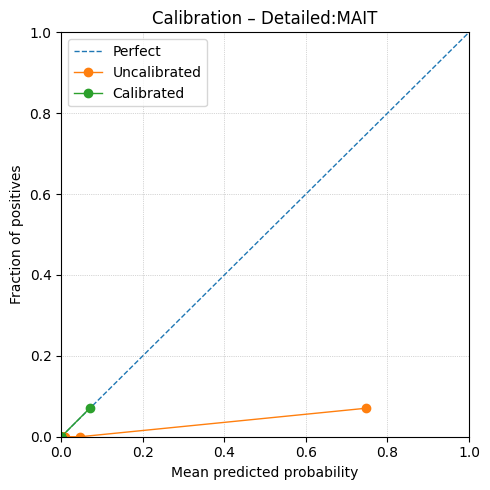

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Zhang/Models/Detailed_MAIT/Detailed_MAIT_bundle.joblib

MAIT
               precision    recall  f1-score   support

           0       0.50      1.00      0.67        67
           1       0.00      0.00      0.00        67

    accuracy                           0.50       134
   macro avg       0.25      0.50      0.33       134
weighted avg       0.25      0.50      0.33       134


Processing MEP (class 16/27)...
Training - Found 2736 / 2736 barcodes
Training - Pos: 1368, Neg: 1368
Training labels: 1368 pos, 1368 neg
Testing  - Found 760 / 760 barcodes
Testing  - Pos: 380, Neg: 380
Testing  - labels: 380 pos, 380 neg
Calibrating - Found 5716 rows | Pos: 152, Neg: 5564
All test data: 14282 rows, positives for MEP: 380
[scale] MEP: train mean ~ 0.000, std ~ 1.000

[NB] training → MEP
Fitting 10 folds for each of 10 candidates, total

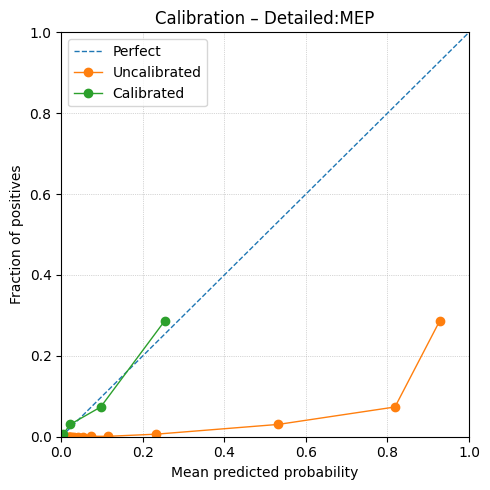

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Zhang/Models/Detailed_MEP/Detailed_MEP_bundle.joblib

MEP
               precision    recall  f1-score   support

           0       0.50      1.00      0.67       380
           1       0.00      0.00      0.00       380

    accuracy                           0.50       760
   macro avg       0.25      0.50      0.33       760
weighted avg       0.25      0.50      0.33       760


Processing MkP (class 17/27)...
Training - Found 1180 / 1180 barcodes
Training - Pos: 590, Neg: 590
Training labels: 590 pos, 590 neg
Testing  - Found 328 / 328 barcodes
Testing  - Pos: 164, Neg: 164
Testing  - labels: 164 pos, 164 neg
Calibrating - Found 5716 rows | Pos: 65, Neg: 5651
All test data: 14282 rows, positives for MkP: 164
[scale] MkP: train mean ~ 0.000, std ~ 1.000

[NB] training → MkP
Fitting 10 folds for each of 10 candidates, totalling 100

Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.



[KNN] training → MkP
Fitting 10 folds for each of 10 candidates, totalling 100 fits

[MLP] training → MkP
Fitting 10 folds for each of 10 candidates, totalling 100 fits
[CAL] MkP: cal positives=65/5716

Calibration metrics:
   Uncalibrated  |  Brier: 0.0499   LogLoss: 0.1704
     Calibrated  |  Brier: 0.0070   LogLoss: 0.0257


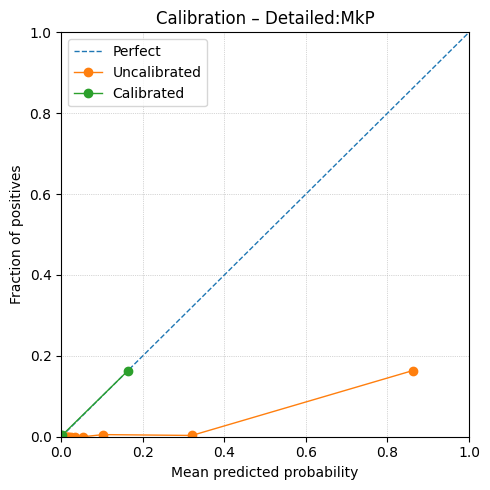

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Zhang/Models/Detailed_MkP/Detailed_MkP_bundle.joblib

MkP
               precision    recall  f1-score   support

           0       0.59      1.00      0.74       164
           1       1.00      0.30      0.46       164

    accuracy                           0.65       328
   macro avg       0.79      0.65      0.60       328
weighted avg       0.79      0.65      0.60       328


Processing Myeloid_progenitor (class 18/27)...
Training - Found 10140 / 10140 barcodes
Training - Pos: 5070, Neg: 5070
Training labels: 5070 pos, 5070 neg
Testing  - Found 2816 / 2816 barcodes
Testing  - Pos: 1408, Neg: 1408
Testing  - labels: 1408 pos, 1408 neg
Calibrating - Found 5716 rows | Pos: 563, Neg: 5153
All test data: 14282 rows, positives for Myeloid_progenitor: 1408
[scale] Myeloid_progenitor: train mean ~ 0.000, std ~ 1.000

[NB] training → My

Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.



[KNN] training → Myeloid_progenitor
Fitting 10 folds for each of 10 candidates, totalling 100 fits

[MLP] training → Myeloid_progenitor
Fitting 10 folds for each of 10 candidates, totalling 100 fits
[CAL] Myeloid_progenitor: cal positives=563/5716

Calibration metrics:
   Uncalibrated  |  Brier: 0.0618   LogLoss: 0.2041
     Calibrated  |  Brier: 0.0285   LogLoss: 0.0950


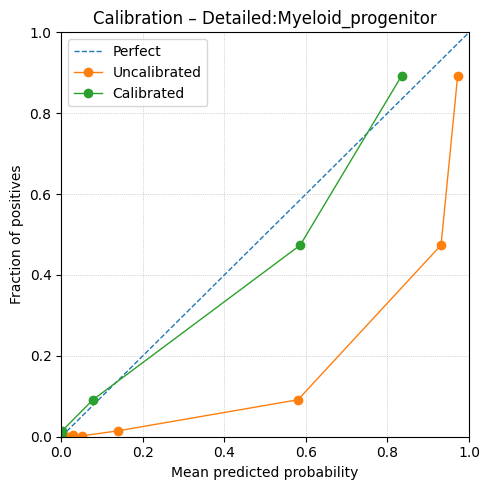

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Zhang/Models/Detailed_Myeloid_progenitor/Detailed_Myeloid_progenitor_bundle.joblib

Myeloid_progenitor
               precision    recall  f1-score   support

           0       0.88      0.98      0.93      1408
           1       0.97      0.87      0.92      1408

    accuracy                           0.92      2816
   macro avg       0.93      0.92      0.92      2816
weighted avg       0.93      0.92      0.92      2816


Processing NK_CD56_bright (class 19/27)...
Training - Found 356 / 356 barcodes
Training - Pos: 178, Neg: 178
Training labels: 178 pos, 178 neg
Testing  - Found 100 / 100 barcodes
Testing  - Pos: 50, Neg: 50
Testing  - labels: 50 pos, 50 neg
Calibrating - Found 5716 rows | Pos: 20, Neg: 5696
All test data: 14282 rows, positives for NK_CD56_bright: 50
[scale] NK_CD56_bright: train mean ~ -0.000, std ~ 1.000

[NB] 

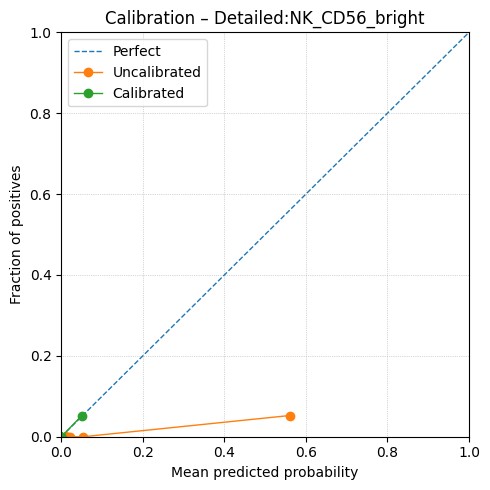

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Zhang/Models/Detailed_NK_CD56_bright/Detailed_NK_CD56_bright_bundle.joblib

NK_CD56_bright
               precision    recall  f1-score   support

           0       0.50      1.00      0.67        50
           1       0.00      0.00      0.00        50

    accuracy                           0.50       100
   macro avg       0.25      0.50      0.33       100
weighted avg       0.25      0.50      0.33       100


Processing NK_CD56_dim (class 20/27)...
Training - Found 1340 / 1340 barcodes
Training - Pos: 670, Neg: 670
Training labels: 670 pos, 670 neg
Testing  - Found 372 / 372 barcodes
Testing  - Pos: 186, Neg: 186
Testing  - labels: 186 pos, 186 neg
Calibrating - Found 5716 rows | Pos: 75, Neg: 5641
All test data: 14282 rows, positives for NK_CD56_dim: 186
[scale] NK_CD56_dim: train mean ~ 0.000, std ~ 1.000

[NB] training → NK_C

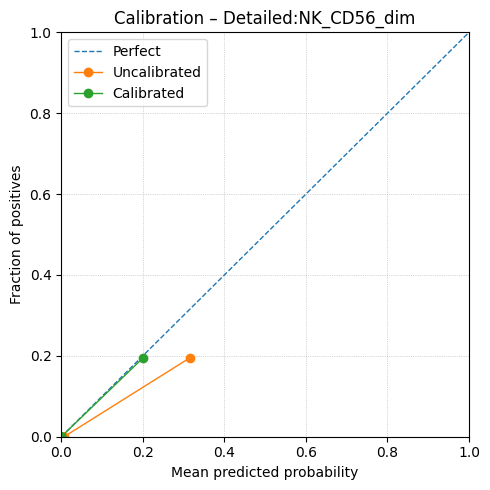

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Zhang/Models/Detailed_NK_CD56_dim/Detailed_NK_CD56_dim_bundle.joblib

NK_CD56_dim
               precision    recall  f1-score   support

           0       0.98      0.99      0.99       186
           1       0.99      0.98      0.99       186

    accuracy                           0.99       372
   macro avg       0.99      0.99      0.99       372
weighted avg       0.99      0.99      0.99       372


Processing Plasma (class 21/27)...
Training - Found 190 / 190 barcodes
Training - Pos: 95, Neg: 95
Training labels: 95 pos, 95 neg
Testing  - Found 52 / 52 barcodes
Testing  - Pos: 26, Neg: 26
Testing  - labels: 26 pos, 26 neg
Calibrating - Found 5716 rows | Pos: 11, Neg: 5705
All test data: 14282 rows, positives for Plasma: 26
[scale] Plasma: train mean ~ -0.000, std ~ 1.000

[NB] training → Plasma
Fitting 10 folds for each of 10 c

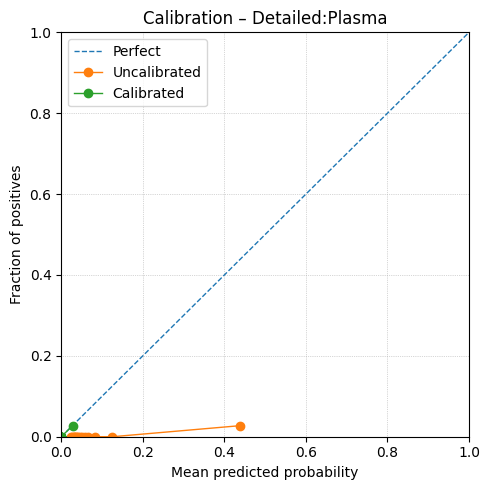

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Zhang/Models/Detailed_Plasma/Detailed_Plasma_bundle.joblib

Plasma
               precision    recall  f1-score   support

           0       0.79      1.00      0.88        26
           1       1.00      0.73      0.84        26

    accuracy                           0.87        52
   macro avg       0.89      0.87      0.86        52
weighted avg       0.89      0.87      0.86        52


Processing Pre-B (class 22/27)...
Training - Found 550 / 550 barcodes
Training - Pos: 275, Neg: 275
Training labels: 275 pos, 275 neg
Testing  - Found 152 / 152 barcodes
Testing  - Pos: 76, Neg: 76
Testing  - labels: 76 pos, 76 neg
Calibrating - Found 5716 rows | Pos: 31, Neg: 5685
All test data: 14282 rows, positives for Pre-B: 76
[scale] Pre-B: train mean ~ -0.000, std ~ 1.000

[NB] training → Pre-B
Fitting 10 folds for each of 10 candidates, to

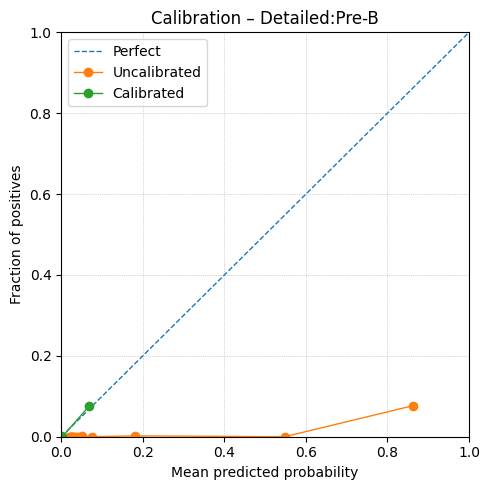

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Zhang/Models/Detailed_Pre-B/Detailed_Pre-B_bundle.joblib

Pre-B
               precision    recall  f1-score   support

           0       0.50      1.00      0.67        76
           1       0.00      0.00      0.00        76

    accuracy                           0.50       152
   macro avg       0.25      0.50      0.33       152
weighted avg       0.25      0.50      0.33       152


Processing Pre-Pro-B (class 23/27)...
Training - Found 2674 / 2674 barcodes
Training - Pos: 1337, Neg: 1337
Training labels: 1337 pos, 1337 neg
Testing  - Found 744 / 744 barcodes
Testing  - Pos: 372, Neg: 372
Testing  - labels: 372 pos, 372 neg
Calibrating - Found 5716 rows | Pos: 149, Neg: 5567
All test data: 14282 rows, positives for Pre-Pro-B: 372
[scale] Pre-Pro-B: train mean ~ -0.000, std ~ 1.000

[NB] training → Pre-Pro-B
Fitting 10 folds for 

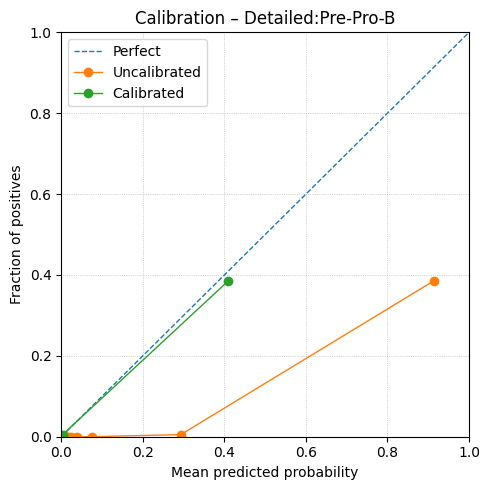

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Zhang/Models/Detailed_Pre-Pro-B/Detailed_Pre-Pro-B_bundle.joblib

Pre-Pro-B
               precision    recall  f1-score   support

           0       0.88      0.99      0.93       372
           1       0.99      0.87      0.92       372

    accuracy                           0.93       744
   macro avg       0.94      0.93      0.93       744
weighted avg       0.94      0.93      0.93       744


Processing Pro-B (class 24/27)...
Training - Found 10918 / 10918 barcodes
Training - Pos: 5459, Neg: 5459
Training labels: 5459 pos, 5459 neg
Testing  - Found 3034 / 3034 barcodes
Testing  - Pos: 1517, Neg: 1517
Testing  - labels: 1517 pos, 1517 neg
Calibrating - Found 5716 rows | Pos: 607, Neg: 5109
All test data: 14282 rows, positives for Pro-B: 1517
[scale] Pro-B: train mean ~ 0.000, std ~ 1.000

[NB] training → Pro-B
Fitting 10 folds 

Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.



[KNN] training → Pro-B
Fitting 10 folds for each of 10 candidates, totalling 100 fits

[MLP] training → Pro-B
Fitting 10 folds for each of 10 candidates, totalling 100 fits
[CAL] Pro-B: cal positives=607/5716

Calibration metrics:
   Uncalibrated  |  Brier: 0.0392   LogLoss: 0.1337
     Calibrated  |  Brier: 0.0234   LogLoss: 0.0772


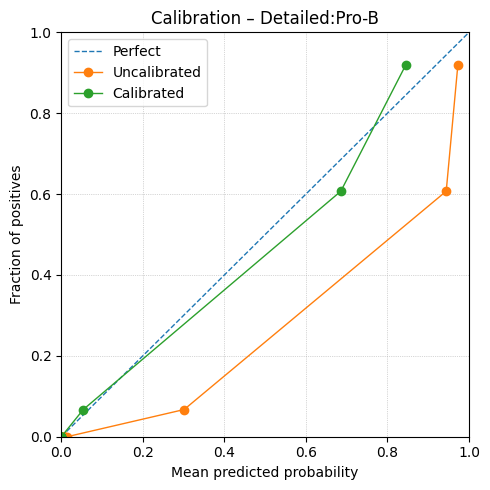

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Zhang/Models/Detailed_Pro-B/Detailed_Pro-B_bundle.joblib

Pro-B
               precision    recall  f1-score   support

           0       0.94      0.97      0.96      1517
           1       0.97      0.94      0.95      1517

    accuracy                           0.95      3034
   macro avg       0.95      0.95      0.95      3034
weighted avg       0.95      0.95      0.95      3034


Processing cDC1 (class 25/27)...
Training - Found 3258 / 3258 barcodes
Training - Pos: 1629, Neg: 1629
Training labels: 1629 pos, 1629 neg
Testing  - Found 904 / 904 barcodes
Testing  - Pos: 452, Neg: 452
Testing  - labels: 452 pos, 452 neg
Calibrating - Found 5716 rows | Pos: 181, Neg: 5535
All test data: 14282 rows, positives for cDC1: 452
[scale] cDC1: train mean ~ 0.000, std ~ 1.000

[NB] training → cDC1
Fitting 10 folds for each of 10 candidates

Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.



[KNN] training → cDC1
Fitting 10 folds for each of 10 candidates, totalling 100 fits


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.



[MLP] training → cDC1
Fitting 10 folds for each of 10 candidates, totalling 100 fits
[CAL] cDC1: cal positives=181/5716

Calibration metrics:
   Uncalibrated  |  Brier: 0.0735   LogLoss: 0.2351
     Calibrated  |  Brier: 0.0200   LogLoss: 0.0649


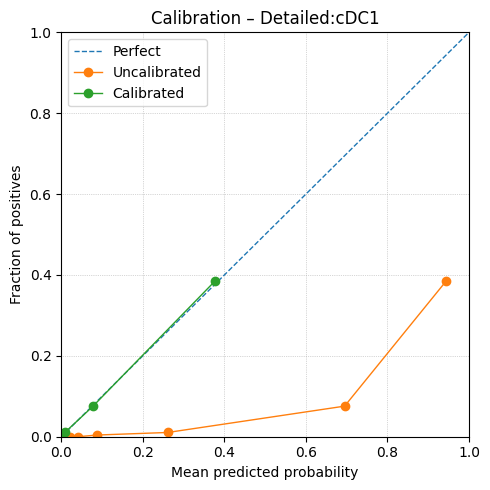

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Zhang/Models/Detailed_cDC1/Detailed_cDC1_bundle.joblib

cDC1
               precision    recall  f1-score   support

           0       0.58      1.00      0.73       452
           1       0.99      0.27      0.42       452

    accuracy                           0.63       904
   macro avg       0.78      0.63      0.58       904
weighted avg       0.78      0.63      0.58       904


Processing cDC2 (class 26/27)...
Training - Found 3806 / 3806 barcodes
Training - Pos: 1903, Neg: 1903
Training labels: 1903 pos, 1903 neg
Testing  - Found 1056 / 1056 barcodes
Testing  - Pos: 528, Neg: 528
Testing  - labels: 528 pos, 528 neg
Calibrating - Found 5716 rows | Pos: 211, Neg: 5505
All test data: 14282 rows, positives for cDC2: 528
[scale] cDC2: train mean ~ -0.000, std ~ 1.000

[NB] training → cDC2
Fitting 10 folds for each of 10 candidates

Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.



[KNN] training → cDC2
Fitting 10 folds for each of 10 candidates, totalling 100 fits

[MLP] training → cDC2
Fitting 10 folds for each of 10 candidates, totalling 100 fits
[CAL] cDC2: cal positives=211/5716

Calibration metrics:
   Uncalibrated  |  Brier: 0.0469   LogLoss: 0.1550
     Calibrated  |  Brier: 0.0147   LogLoss: 0.0478


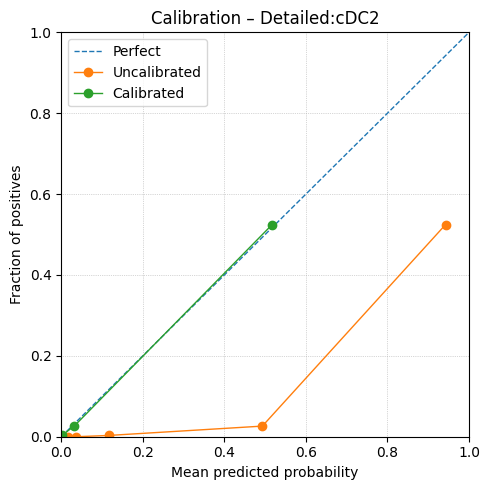

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Zhang/Models/Detailed_cDC2/Detailed_cDC2_bundle.joblib

cDC2
               precision    recall  f1-score   support

           0       0.80      0.99      0.88       528
           1       0.99      0.75      0.85       528

    accuracy                           0.87      1056
   macro avg       0.89      0.87      0.87      1056
weighted avg       0.89      0.87      0.87      1056


Processing pDC (class 27/27)...
Training - Found 6486 / 6486 barcodes
Training - Pos: 3243, Neg: 3243
Training labels: 3243 pos, 3243 neg
Testing  - Found 1802 / 1802 barcodes
Testing  - Pos: 901, Neg: 901
Testing  - labels: 901 pos, 901 neg
Calibrating - Found 5716 rows | Pos: 360, Neg: 5356
All test data: 14282 rows, positives for pDC: 901
[scale] pDC: train mean ~ -0.000, std ~ 1.000

[NB] training → pDC
Fitting 10 folds for each of 10 candidates, to

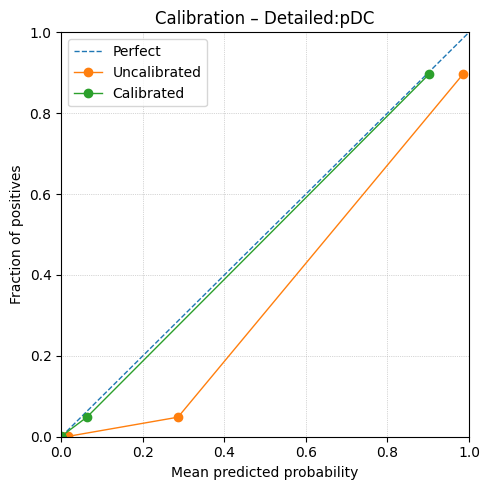

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Zhang/Models/Detailed_pDC/Detailed_pDC_bundle.joblib

pDC
               precision    recall  f1-score   support

           0       0.97      0.99      0.98       901
           1       0.99      0.97      0.98       901

    accuracy                           0.98      1802
   macro avg       0.98      0.98      0.98      1802
weighted avg       0.98      0.98      0.98      1802


Fitting multiclass TemperatureScaling on CAL split (excluded classes masked out)...

Preview of probabilities BEFORE (raw OvR) vs AFTER (multiclass TS) [included classes only]:
                                      raw_B_Memory  raw_B_Naive  raw_CD14_Mono  raw_CD16_Mono  raw_CD4_T_Memory  raw_CD4_T_Naive  raw_CD8_T_Memory  raw_CD8_T_Naive   raw_EoBaMaP   raw_ErP  raw_Erythroblast   raw_GMP  raw_HSC_MPP  raw_Immature_B  raw_MAIT   raw_MEP   raw_MkP  raw_Mye

In [128]:
# -*- coding: utf-8 -*-
from pathlib import Path
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.ensemble import StackingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.calibration import CalibratedClassifierCV
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report, confusion_matrix

from netcal.scaling import TemperatureScaling
import joblib

# ------------------------------------------------------------------- CONFIG (expects these to already exist)
#   models_output, train_barcodes_path, test_barcodes_path
#   Zhang_data_Train, Zhang_data_Test, Zhang_data_Cal          (DataFrames indexed by barcode)
#   Zhang_dataset_Train, Zhang_dataset_Test, Zhang_dataset_Cal (AnnData with obs labels)
#   TotalSeqD_Heme_Oncology_CAT399906                    (iterable of feature names)
#   MLTraining module with: CV, train_NB, train_XGB, train_KNN, train_MLP,
#                           plot_calibration_curve, save_models, evaluate_classifier, append_metrics_csv

name_target_class = "Detailed"   # "detailed" | "detailed" | "Detailed"
fig_root   = Path(models_output) / "Figures"
models_dir = Path(models_output) / "Models"
fig_root.mkdir(parents=True, exist_ok=True)
models_dir.mkdir(parents=True, exist_ok=True)

kf         = MLTraining.CV
num_cores  = -1
metrics_log = []

# ============================= HELPERS =============================

def _norm_feats(names) -> pd.Index:
    """
    Normalizer used ONLY to construct matching keys.
    Panel names remain untouched; data columns are normalized and then mapped BACK
    to the exact panel names via a lookup.
    """
    s = pd.Index(map(str, names))
    s = (s.str.strip()
           .str.lower()
           .str.replace(r"[ _/]+", "-", regex=True)
           .str.replace(r"-+", "-", regex=True)
           .str.strip("-"))
    return s

def attach_celltype(df: pd.DataFrame, ad: "AnnData", field: str) -> pd.DataFrame:
    if field not in ad.obs:
        raise KeyError(f"'{field}' not found in AnnData.obs")
    lab = (ad.obs[field]
             .astype("string")
             .str.strip()
             .str.replace(r"\s+", "_", regex=True))
    out = df.copy()
    out["Celltype"] = pd.Categorical(lab.reindex(out.index))
    if out["Celltype"].isna().any():
        missing = int(out["Celltype"].isna().sum())
        print(f"[WARN] {missing} rows got NaN Celltype after reindex; check barcode alignment.")
    return out

def _check_finite(df: pd.DataFrame, tag: str):
    arr = df.to_numpy()
    if not np.isfinite(arr).all():
        bad = np.where(~np.isfinite(arr))
        raise ValueError(f"Non-finite values found in {tag} features at positions {bad}")

def _unwrap_estimator(m):
    return getattr(m, "estimator", None) or getattr(m, "base_estimator", None) or m

def _assert_feature_counts(cell_name: str, models_dict: dict, expected: int):
    pairs = [
        ("NB",  models_dict.get("NB")),
        ("XGB", models_dict.get("XGB")),
        ("KNN", models_dict.get("KNN")),
        ("MLP", models_dict.get("MLP")),
        ("Stacker", models_dict.get("Stacker")),
    ]
    for name, est in pairs:
        if est is None:
            continue
        base = _unwrap_estimator(est)
        nfi = getattr(base, "n_features_in_", None)
        if nfi is not None and nfi != expected:
            raise RuntimeError(f"{cell_name}:{name} saw {nfi} features; expected {expected}")

# ============================= LABEL ATTACH =============================

consensus_field = f"Consensus_annotation_{name_target_class.lower()}_final"

Zhang_data_Train = attach_celltype(Zhang_data_Train, Zhang_dataset_Train, consensus_field)
Zhang_data_Test  = attach_celltype(Zhang_data_Test,  Zhang_dataset_Test,  consensus_field)
Zhang_data_Cal   = attach_celltype(Zhang_data_Cal,   Zhang_dataset_Cal,   consensus_field)

# ============================= PANEL & DATA COLUMN ALIGNMENT =============================

# Keep the panel EXACTLY as provided
panel = pd.Index(map(str, TotalSeqD_Heme_Oncology_CAT399906))

# Build a mapping: normalized_key -> exact panel name
panel_keys    = _norm_feats(panel)
norm_to_panel = dict(zip(panel_keys, panel))
if len(norm_to_panel) != len(panel):
    raise ValueError("Panel contains names that collide after normalization. Consider adjusting _norm_feats rules.")

def _rename_data_to_panel(df: pd.DataFrame) -> pd.DataFrame:
    """
    Rename only feature columns so that after normalization they map
    back to the exact panel column names. Keeps 'cell_barcode' and 'Celltype' intact.
    """
    df = df.copy()
    non_feat = [c for c in ["cell_barcode", "Celltype"] if c in df.columns]
    feat     = pd.Index([c for c in df.columns if c not in non_feat])

    feat_keys   = _norm_feats(feat)
    mapped      = [norm_to_panel.get(k) for k in feat_keys]  # None if not in panel
    rename_map  = {old: new for old, new in zip(feat, mapped) if new is not None}

    # Handle duplicate mappings (two data columns → same panel col). Keep first, drop the rest.
    seen, safe_map, drops = set(), {}, []
    for old, new in rename_map.items():
        if new in seen:
            drops.append(old)
        else:
            seen.add(new); safe_map[old] = new

    if drops:
        print(f"[WARN] Dropping {len(drops)} duplicated-mapped columns (showing up to 5): {drops[:5]}")

    if drops:
        df.drop(columns=drops, inplace=True, errors="ignore")
    df.rename(columns=safe_map, inplace=True)

    matched = len(safe_map)
    print(f"[map] matched {matched}/{len(feat)} data columns to panel")
    return df

# Apply: normalize/rename ONLY data splits (panel remains untouched)
Zhang_data_Train = _rename_data_to_panel(Zhang_data_Train)
Zhang_data_Test  = _rename_data_to_panel(Zhang_data_Test)
Zhang_data_Cal   = _rename_data_to_panel(Zhang_data_Cal)

# Intersect each split with the panel IN PANEL ORDER
def _panel_intersection(df: pd.DataFrame) -> pd.DataFrame:
    non_feat = [c for c in ["cell_barcode", "Celltype"] if c in df.columns]
    feat_cols = pd.Index([c for c in df.columns if c not in non_feat])
    inter = panel.intersection(feat_cols, sort=False)
    if inter.empty:
        raise ValueError("Panel/Data intersection is empty after renaming. Check mapping rules.")
    return df.reindex(columns=list(inter) + non_feat)

Zhang_data_Train = _panel_intersection(Zhang_data_Train)
Zhang_data_Test  = _panel_intersection(Zhang_data_Test)
Zhang_data_Cal   = _panel_intersection(Zhang_data_Cal)

# ============================= FEATURES & LABELS =============================

Zhang_data_Cal_lbl = Zhang_data_Cal[["Celltype"]].copy()

drop_cols_train = [c for c in ["cell_barcode", "Celltype"] if c in Zhang_data_Train.columns]
drop_cols_test  = [c for c in ["cell_barcode", "Celltype"] if c in Zhang_data_Test.columns]
drop_cols_cal   = [c for c in ["cell_barcode", "Celltype"] if c in Zhang_data_Cal.columns]

Zhang_data_Train_Sub = Zhang_data_Train.drop(columns=drop_cols_train, errors="ignore")
Zhang_data_Test_Sub  = Zhang_data_Test.drop(columns=drop_cols_test,  errors="ignore")
Zhang_data_Cal_Sub   = Zhang_data_Cal.drop(columns=drop_cols_cal,    errors="ignore")

# SAFETY: shared columns & finiteness checks
cols_train = list(Zhang_data_Train_Sub.columns)
if list(Zhang_data_Test_Sub.columns) != cols_train or list(Zhang_data_Cal_Sub.columns) != cols_train:
    raise ValueError("Train/Cal/Test feature columns differ after panel intersection!")

_check_finite(Zhang_data_Train_Sub, "TRAIN")
_check_finite(Zhang_data_Test_Sub,  "TEST")
_check_finite(Zhang_data_Cal_Sub,   "CAL")

print(f"\n[features] Using {len(cols_train)} panel-intersected features (exact panel names):")
print(cols_train)

# ===== Exclude specific classes from the multiclass set and per-class loop =====
EXCLUDE_CLASSES = {"Macrophage", "ILC", "Stroma", "dnT"}

all_classes = sorted(pd.Series(Zhang_data_Train["Celltype"]).dropna().unique())
class_names = [c for c in all_classes if c not in EXCLUDE_CLASSES]
if not class_names:
    raise ValueError("After exclusions, class_names is empty.")
print(f"[classes] Included ({len(class_names)}): {class_names}")
if missing := [c for c in all_classes if c in EXCLUDE_CLASSES]:
    print(f"[classes] Excluded: {missing}")

K            = len(class_names)
class_to_idx = {c: i for i, c in enumerate(class_names)}

# --- Multiclass labels (MASKED to included classes) ---
# CAL
mask_cal_mc = Zhang_data_Cal_lbl["Celltype"].isin(class_names)
s_cal = Zhang_data_Cal_lbl.loc[mask_cal_mc, "Celltype"].map(class_to_idx)
if s_cal.isna().any():
    missing = Zhang_data_Cal_lbl.loc[mask_cal_mc & s_cal.isna(), "Celltype"].unique()
    raise ValueError(f"Unknown labels in masked CAL split: {missing}")
y_cal_multiclass = s_cal.to_numpy(dtype=np.int64)

# TEST
mask_test_mc = Zhang_data_Test["Celltype"].isin(class_names)
s_te = Zhang_data_Test.loc[mask_test_mc, "Celltype"].map(class_to_idx)
if s_te.isna().any():
    missing = Zhang_data_Test.loc[mask_test_mc & s_te.isna(), "Celltype"].unique()
    raise ValueError(f"Unknown labels in masked TEST split: {missing}")
y_test_multiclass = s_te.to_numpy(dtype=np.int64)

# Reuse across classes
X_cal_all_df = Zhang_data_Cal_Sub.copy()
X_te_all_df  = Zhang_data_Test_Sub.copy()

# Preallocate OvR prob mats (only for included classes)
P_cal = np.zeros((X_cal_all_df.shape[0], K), dtype=float)
P_te  = np.zeros((X_te_all_df.shape[0],  K), dtype=float)

test_index = Zhang_data_Test_Sub.index

# ============================= TRAIN PER-CLASS OVR =============================

for celltype in class_names:
    k = class_to_idx[celltype]
    name = str(celltype).replace(" ", "_")
    print(f"\nProcessing {name} (class {k+1}/{K})...")

    # ---- TRAIN slice via barcode lists
    train_barcodes_df = pd.read_csv(
        f"{train_barcodes_path}/Zhang/Consensus_annotation_detailed_final/Barcodes_training_class_{name}.csv",
        index_col=0
    )
    train_positive_barcodes = train_barcodes_df["Positive"].dropna().values
    train_negative_barcodes = train_barcodes_df["Negative"].dropna().values
    all_train_barcodes = np.concatenate([train_positive_barcodes, train_negative_barcodes])

    train_mask = Zhang_data_Train_Sub.index.isin(all_train_barcodes)
    X_tr_df = Zhang_data_Train_Sub.loc[train_mask]
    found_train_barcodes = X_tr_df.index.values
    y_tr = np.isin(found_train_barcodes, train_positive_barcodes).astype(int)

    # ---- Skip guards
    if X_tr_df.empty or np.unique(y_tr).size < 2:
        print(f"[SKIP] {name}: empty or single-class train slice (pos={y_tr.sum()}, neg={(len(y_tr)-y_tr.sum())}).")
        continue

    # ---- TEST slice via barcode lists
    test_barcodes_df = pd.read_csv(
        f"{test_barcodes_path}/Zhang/Consensus_annotation_detailed_final/Barcodes_testing_class_{name}.csv",
        index_col=0
    )
    test_positive_barcodes = test_barcodes_df["Positive"].dropna().values
    test_negative_barcodes = test_barcodes_df["Negative"].dropna().values
    all_test_barcodes = np.concatenate([test_positive_barcodes, test_negative_barcodes])

    test_mask = Zhang_data_Test_Sub.index.isin(all_test_barcodes)
    X_te_df = Zhang_data_Test_Sub.loc[test_mask]
    found_test_barcodes = X_te_df.index.values
    y_te = np.isin(found_test_barcodes, test_positive_barcodes).astype(int)

    # ---- Full-test & cal for this binary head
    X_te_all_local = X_te_all_df.copy()
    y_te_all = (Zhang_data_Test["Celltype"].values == celltype).astype(int)
    X_cal_df = X_cal_all_df.copy()
    y_cal_bin = (Zhang_data_Cal_lbl["Celltype"].values == celltype).astype(int)

    # ---- Info
    print(f"Training - Found {X_tr_df.shape[0]} / {len(all_train_barcodes)} barcodes")
    print(f"Training - Pos: {len(train_positive_barcodes)}, Neg: {len(train_negative_barcodes)}")
    print(f"Training labels: {y_tr.sum()} pos, {len(y_tr)-y_tr.sum()} neg")
    print(f"Testing  - Found {X_te_df.shape[0]} / {len(all_test_barcodes)} barcodes")
    print(f"Testing  - Pos: {len(test_positive_barcodes)}, Neg: {len(test_negative_barcodes)}")
    print(f"Testing  - labels: {y_te.sum()} pos, {len(y_te)-y_te.sum()} neg")
    print(f"Calibrating - Found {X_cal_df.shape[0]} rows | Pos: {y_cal_bin.sum()}, Neg: {len(y_cal_bin)-y_cal_bin.sum()}")
    print(f"All test data: {X_te_all_local.shape[0]} rows, positives for {celltype}: {y_te_all.sum()}")

    # ---- Scaling (fit on per-head TRAIN slice; transform others)
    scaler = StandardScaler(with_mean=True, with_std=True).fit(X_tr_df.values)

    def _sc(df):
        return pd.DataFrame(
            scaler.transform(df.values),
            index=df.index,
            columns=cols_train,
        )

    X_tr_sc_df     = _sc(X_tr_df)
    X_te_sc_df     = _sc(X_te_df)
    X_te_all_sc_df = _sc(X_te_all_local)
    X_cal_sc_df    = _sc(X_cal_df)

    print(f"[scale] {name}: train mean ~ {X_tr_sc_df.values.mean():.3f}, std ~ {X_tr_sc_df.values.std():.3f}")

    # ---- Base learners
    NB_model  = MLTraining.train_NB (X_tr_sc_df, y_tr, cv=kf, num_cores=num_cores, name_target_subclass=name)
    XGB_model = MLTraining.train_XGB(X_tr_sc_df, y_tr, cv=kf, num_cores=num_cores, name_target_subclass=name)
    KNN_model = MLTraining.train_KNN(X_tr_sc_df, y_tr, cv=kf, num_cores=num_cores, name_target_subclass=name)
    MLP_model = MLTraining.train_MLP(X_tr_sc_df, y_tr, cv=kf, num_cores=num_cores, name_target_subclass=name)

    # ---- Stacker (raw)
    stacker_raw = StackingClassifier(
        estimators=[("NB", NB_model), ("XGB", XGB_model), ("KNN", KNN_model), ("MLP", MLP_model)],
        final_estimator=LogisticRegression(max_iter=2000, class_weight="balanced", random_state=42),
        stack_method="predict_proba",
        cv=kf,
        n_jobs=-1,
    ).fit(X_tr_sc_df, y_tr)

    # ---- Feature count asserts (debug safety)
    expected_feats = len(cols_train)
    _assert_feature_counts(name, {
        "NB": NB_model, "XGB": XGB_model, "KNN": KNN_model, "MLP": MLP_model, "Stacker": stacker_raw
    }, expected_feats)

    # ---- Binary calibration (Platt, guarded)
    pos_cal    = int(y_cal_bin.sum())
    n_cal_bin  = int(len(y_cal_bin))
    has_both   = (0 < pos_cal < n_cal_bin)
    print(f"[CAL] {name}: cal positives={pos_cal}/{n_cal_bin}")

    if has_both:
        try:
            calibrator = CalibratedClassifierCV(estimator=stacker_raw, method="sigmoid", cv="prefit")
        except TypeError:  # older sklearn
            calibrator = CalibratedClassifierCV(base_estimator=stacker_raw, method="sigmoid", cv="prefit")
        stacker = calibrator.fit(X_cal_sc_df, y_cal_bin)
    else:
        print(f"[WARN] Skipping calibration for {name}: single-class cal set.")
        stacker = stacker_raw

    # ---- Calibration plot on all-test (optional)
    try:
        y_proba_uncal = stacker_raw.predict_proba(X_te_all_sc_df)[:, 1]
        y_proba_cal   = stacker.predict_proba(X_te_all_sc_df)[:, 1]
        if has_both:
            _ = MLTraining.plot_calibration_curve(
                y_te_all, [y_proba_uncal, y_proba_cal],
                clf_names=["Uncalibrated", "Calibrated"],
                n_bins=15, strategy="quantile",
                title=f"Calibration – {name_target_class}:{name}"
            )
        else:
            _ = MLTraining.plot_calibration_curve(
                y_te_all, [y_proba_uncal],
                clf_names=["Uncalibrated"],
                n_bins=15, strategy="quantile",
                title=f"Calibration (uncal only) – {name_target_class}:{name}"
            )
        plt.tight_layout()
        plt.show()
    except Exception as e:
        print(f"[WARN] Skipped calibration plot for {name}: {e}")

    # ---- Save per-class bundle (model + scaler + columns)
    save_subdir = models_dir / f"{name_target_class}_{name}"
    save_subdir.mkdir(parents=True, exist_ok=True)

    MLTraining.save_models({"Stacked": stacker}, out_dir=save_subdir, tag=f"{name_target_class}_{name}")
    joblib.dump(cols_train, save_subdir / "feature_names.joblib")

    bundle = {
        "atlas": "Zhang",
        "depth": name_target_class,
        "label": celltype,
        "model": stacker,          # CalibratedClassifierCV(StackingClassifier) or StackingClassifier
        "columns": cols_train,     # exact panel names, panel order
        "scaler": scaler,          # per-head scaler
        "panel_name": "TotalSeqD_Heme_Oncology_CAT399906",
    }
    bundle_path = save_subdir / f"{name_target_class}_{name}_bundle.joblib"
    joblib.dump(bundle, bundle_path)
    print(f"[SAVE] Wrote bundle with columns+scaler to {bundle_path}")

    # ---- Binary metrics on the class-specific test slice
    try:
        m = MLTraining.evaluate_classifier(stacker, X_te_sc_df, y_te, plot_cm=False)
        m.update(celltype=celltype)
        metrics_log.append(m)
        print(f"\n{celltype}\n", m.get("report", ""))
    except Exception as e:
        print(f"[WARN] Binary metrics for {name} skipped: {e}")

    # ---- Store OvR probs for multiclass calibration (columns order = class_names)
    P_cal[:, k] = stacker.predict_proba(X_cal_sc_df)[:, 1]
    P_te[:,  k] = stacker.predict_proba(X_te_all_sc_df)[:, 1]

# ============================= MULTICLASS CALIBRATION =============================

print("\nFitting multiclass TemperatureScaling on CAL split (excluded classes masked out)...")

# Guards: ensure probs are in [0,1]
if (P_cal < 0).any() or (P_cal > 1).any():
    raise ValueError("P_cal must be probabilities in [0,1].")
if (P_te < 0).any() or (P_te > 1).any():
    raise ValueError("P_te must be probabilities in [0,1].")

ts_cal = TemperatureScaling()
# Fit only on CAL rows whose true label is one of the included classes
ts_cal.fit(P_cal[mask_cal_mc.values, :], y_cal_multiclass)
P_te_mc = ts_cal.transform(P_te)

# Ensure calibrated probs shape (K)
P_te_mc = np.asarray(P_te_mc)
if P_te_mc.ndim == 1:
    P_te_mc = P_te_mc.reshape(-1, 1)
if P_te_mc.shape[1] == 1 and K == 2:
    P_te_mc = np.hstack([1.0 - P_te_mc, P_te_mc])
elif P_te_mc.shape[1] != K:
    # Fallback: normalize OvR sums
    row_sums = P_te.sum(axis=1, keepdims=True)
    row_sums[row_sums == 0.0] = 1.0
    P_te_mc = P_te / row_sums
    print(f"[WARN] TemperatureScaling returned shape {P_te_mc.shape}; fell back to sum-normalized OvR probs.")

# Persist multiclass temp scaler + INCLUDED class names
joblib.dump(ts_cal, models_dir / f"{name_target_class}_multiclass_temp_scaler.joblib")
(pd.Series(class_names, name="class_name")
   .to_csv(models_dir / f"{name_target_class}_class_names.csv", index=False))

# ============================= PROBS COMPARISON & METRICS =============================

# Evaluate & save on TEST rows whose true label is an INCLUDED class
test_index_masked = Zhang_data_Test_Sub.index[mask_test_mc.values]

probs_raw_df = pd.DataFrame(P_te[mask_test_mc.values, :],    index=test_index_masked,
                            columns=[f"raw_{c}" for c in class_names])
probs_mc_df  = pd.DataFrame(P_te_mc[mask_test_mc.values, :], index=test_index_masked,
                            columns=[f"mc_{c}"  for c in class_names])

probs_compare = pd.concat([probs_raw_df, probs_mc_df], axis=1)
probs_compare["true_label"]    = Zhang_data_Test.loc[mask_test_mc, "Celltype"].values
probs_compare["pred_raw"]      = P_te[mask_test_mc.values, :].argmax(axis=1)
probs_compare["pred_mc"]       = P_te_mc[mask_test_mc.values, :].argmax(axis=1)
probs_compare["pred_raw_name"] = [class_names[i] for i in probs_compare["pred_raw"].values]
probs_compare["pred_mc_name"]  = [class_names[i] for i in probs_compare["pred_mc"].values]

print("\nPreview of probabilities BEFORE (raw OvR) vs AFTER (multiclass TS) [included classes only]:")
print(probs_compare.head(10).to_string())

probs_compare_path = models_dir / f"{name_target_class}_probabilities_before_after_TEST_included.csv"
probs_compare.to_csv(probs_compare_path, index=True)
print(f"\nSaved probabilities comparison to: {probs_compare_path}")

# Multiclass evaluation on the masked subset
y_pred_mc = P_te_mc[mask_test_mc.values, :].argmax(axis=1)
print("\nMulticlass classification report (TEST, excluded classes removed):")
print(classification_report(y_test_multiclass, y_pred_mc, target_names=class_names, digits=3))

cm = confusion_matrix(y_test_multiclass, y_pred_mc, labels=range(K))
print("Confusion matrix (rows=true, cols=pred):\n", cm)

# Per-class binary head metrics CSV
metrics_df = pd.DataFrame.from_records(metrics_log)
MLTraining.append_metrics_csv(metrics_df, csv_path=Path(models_output) / "stacker_metrics.csv")

print("\nDone.")


## Triana Models

In [129]:
# Create the folders
os.makedirs(data_path + "/Triana", exist_ok=True)
os.makedirs(data_path + "/Triana/Models", exist_ok=True)

models_output = data_path + "/Triana/"

### ML Training

In [130]:
Triana_Models = {}

#### Broad annotation

[map] matched 31/95 data columns to panel
[map] matched 31/95 data columns to panel
[map] matched 31/95 data columns to panel

[features] Using 31 panel-intersected features (exact panel names):
['CD10', 'CD117', 'CD11b', 'CD11c', 'CD123', 'CD13', 'CD14', 'CD141', 'CD16', 'CD163', 'CD19', 'CD1c', 'CD2', 'CD25', 'CD3', 'CD30', 'CD33', 'CD34', 'CD38', 'CD4', 'CD45', 'CD45RA', 'CD49d', 'CD5', 'CD56', 'CD62L', 'CD69', 'CD7', 'CD8', 'CD83', 'CD90']

Processing Immature (class 1/2)...
Training - Found 11338 / 11338 barcodes
Training - Pos: 5669, Neg: 5669
Training labels: 5669 pos, 5669 neg
Testing  - Found 3146 / 3146 barcodes
Testing  - Pos: 1573, Neg: 1573
Testing labels: 1573 pos, 1573 neg
Calibrating - Found 3926 rows | Pos: 632, Neg: 3294
All test data: 9804 rows, positives for Immature: 1573
[scale] Immature: train mean ~ -0.000, std ~ 1.000

[NB] training → Immature
Fitting 10 folds for each of 10 candidates, totalling 100 fits

[XGB] training → Immature
Fitting 10 folds for each of 

Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.



[MLP] training → Immature
Fitting 10 folds for each of 10 candidates, totalling 100 fits
[CAL] Immature: cal positives=632/3926

Calibration metrics:
   Uncalibrated  |  Brier: 0.0103   LogLoss: 0.0435
     Calibrated  |  Brier: 0.0082   LogLoss: 0.0309


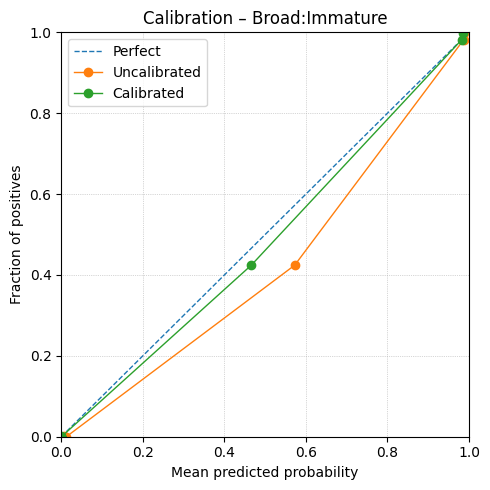

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Triana/Models/Broad_Immature/Broad_Immature_bundle.joblib

Immature
               precision    recall  f1-score   support

           0       0.98      0.98      0.98      1573
           1       0.98      0.98      0.98      1573

    accuracy                           0.98      3146
   macro avg       0.98      0.98      0.98      3146
weighted avg       0.98      0.98      0.98      3146


Processing Mature (class 2/2)...
Training - Found 11338 / 11338 barcodes
Training - Pos: 5669, Neg: 5669
Training labels: 5669 pos, 5669 neg
Testing  - Found 3146 / 3146 barcodes
Testing  - Pos: 1573, Neg: 1573
Testing labels: 1573 pos, 1573 neg
Calibrating - Found 3926 rows | Pos: 3294, Neg: 632
All test data: 9804 rows, positives for Mature: 8231
[scale] Mature: train mean ~ -0.000, std ~ 1.000

[NB] training → Mature
Fitting 10 folds for each 

Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.



[KNN] training → Mature
Fitting 10 folds for each of 10 candidates, totalling 100 fits

[MLP] training → Mature
Fitting 10 folds for each of 10 candidates, totalling 100 fits
[CAL] Mature: cal positives=3294/3926

Calibration metrics:
   Uncalibrated  |  Brier: 0.0113   LogLoss: 0.0466
     Calibrated  |  Brier: 0.0084   LogLoss: 0.0319


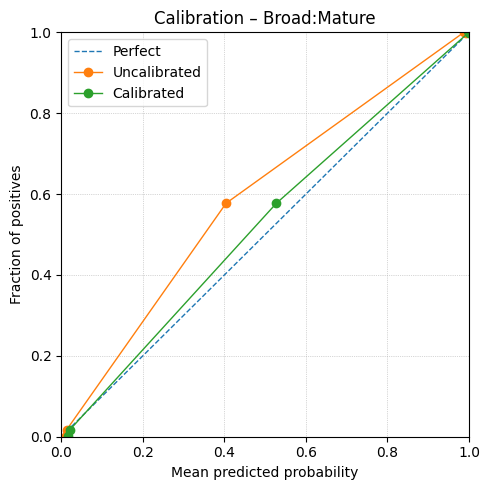

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Triana/Models/Broad_Mature/Broad_Mature_bundle.joblib

Mature
               precision    recall  f1-score   support

           0       0.98      0.98      0.98      1573
           1       0.98      0.98      0.98      1573

    accuracy                           0.98      3146
   macro avg       0.98      0.98      0.98      3146
weighted avg       0.98      0.98      0.98      3146


Fitting multiclass TemperatureScaling on CAL split...

Preview of probabilities BEFORE (raw OvR) vs AFTER (multiclass TS):
                       raw_Immature  raw_Mature  mc_Immature  mc_Mature true_label  pred_raw  pred_mc pred_raw_name pred_mc_name
329034_Aged2_329034_4      0.002122    0.998461     0.001060   0.998940     Mature         1        1        Mature       Mature
24606_Aged2_24606_4        0.000252    0.999824     0.000107   0.999893    

In [131]:
# -*- coding: utf-8 -*-
from pathlib import Path
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.ensemble import StackingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.calibration import CalibratedClassifierCV
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report, confusion_matrix

from netcal.scaling import TemperatureScaling
import joblib

# ------------------------------------------------------------------- CONFIG (expects these to already exist)
#   models_output, train_barcodes_path, test_barcodes_path
#   Triana_data_Train, Triana_data_Test, Triana_data_Cal          (DataFrames indexed by barcode)
#   Triana_dataset_Train, Triana_dataset_Test, Triana_dataset_Cal (AnnData with obs labels)
#   TotalSeqD_Heme_Oncology_CAT399906                    (iterable of feature names)
#   MLTraining module with: CV, train_NB, train_XGB, train_KNN, train_MLP,
#                           plot_calibration_curve, save_models, evaluate_classifier, append_metrics_csv

name_target_class = "Broad"   # "Broad" | "Simplified" | "Detailed"
fig_root   = Path(models_output) / "Figures"
models_dir = Path(models_output) / "Models"
fig_root.mkdir(parents=True, exist_ok=True)
models_dir.mkdir(parents=True, exist_ok=True)

kf         = MLTraining.CV
num_cores  = -1
metrics_log = []

# ============================= HELPERS =============================

def _norm_feats(names) -> pd.Index:
    """
    Normalizer used ONLY to construct matching keys.
    Panel names remain untouched; data columns are normalized and then mapped BACK
    to the exact panel names via a lookup.
    """
    s = pd.Index(map(str, names))
    s = (s.str.strip()
           .str.lower()
           .str.replace(r"[ _/]+", "-", regex=True)
           .str.replace(r"-+", "-", regex=True)
           .str.strip("-"))
    return s

def attach_celltype(df: pd.DataFrame, ad: "AnnData", field: str) -> pd.DataFrame:
    if field not in ad.obs:
        raise KeyError(f"'{field}' not found in AnnData.obs")
    lab = (ad.obs[field]
             .astype("string")
             .str.strip()
             .str.replace(r"\s+", "_", regex=True))
    out = df.copy()
    out["Celltype"] = pd.Categorical(lab.reindex(out.index))
    if out["Celltype"].isna().any():
        missing = int(out["Celltype"].isna().sum())
        print(f"[WARN] {missing} rows got NaN Celltype after reindex; check barcode alignment.")
    return out

def _check_finite(df: pd.DataFrame, tag: str):
    arr = df.to_numpy()
    if not np.isfinite(arr).all():
        bad = np.where(~np.isfinite(arr))
        raise ValueError(f"Non-finite values found in {tag} features at positions {bad}")

def _unwrap_estimator(m):
    return getattr(m, "estimator", None) or getattr(m, "base_estimator", None) or m

def _assert_feature_counts(cell_name: str, models_dict: dict, expected: int):
    pairs = [
        ("NB",  models_dict.get("NB")),
        ("XGB", models_dict.get("XGB")),
        ("KNN", models_dict.get("KNN")),
        ("MLP", models_dict.get("MLP")),
        ("Stacker", models_dict.get("Stacker")),
    ]
    for name, est in pairs:
        if est is None:
            continue
        base = _unwrap_estimator(est)
        nfi = getattr(base, "n_features_in_", None)
        if nfi is not None and nfi != expected:
            raise RuntimeError(f"{cell_name}:{name} saw {nfi} features; expected {expected}")

# ============================= LABEL ATTACH =============================

consensus_field = f"Consensus_annotation_{name_target_class.lower()}_final"

Triana_data_Train = attach_celltype(Triana_data_Train, Triana_dataset_Train, consensus_field)
Triana_data_Test  = attach_celltype(Triana_data_Test,  Triana_dataset_Test,  consensus_field)
Triana_data_Cal   = attach_celltype(Triana_data_Cal,   Triana_dataset_Cal,   consensus_field)

# ============================= PANEL & DATA COLUMN ALIGNMENT =============================

# Keep the panel EXACTLY as provided
panel = pd.Index(map(str, TotalSeqD_Heme_Oncology_CAT399906))

# Build a mapping: normalized_key -> exact panel name
panel_keys    = _norm_feats(panel)
norm_to_panel = dict(zip(panel_keys, panel))
if len(norm_to_panel) != len(panel):
    raise ValueError("Panel contains names that collide after normalization. Consider adjusting _norm_feats rules.")

def _rename_data_to_panel(df: pd.DataFrame) -> pd.DataFrame:
    """
    Rename only feature columns so that after normalization they map
    back to the exact panel column names. Keeps 'cell_barcode' and 'Celltype' intact.
    """
    df = df.copy()
    non_feat = [c for c in ["cell_barcode", "Celltype"] if c in df.columns]
    feat     = pd.Index([c for c in df.columns if c not in non_feat])

    feat_keys   = _norm_feats(feat)
    mapped      = [norm_to_panel.get(k) for k in feat_keys]  # None if not in panel
    rename_map  = {old: new for old, new in zip(feat, mapped) if new is not None}

    # Handle duplicate mappings (two data columns → same panel col). Keep first, drop the rest.
    seen, safe_map, drops = set(), {}, []
    for old, new in rename_map.items():
        if new in seen:
            drops.append(old)
        else:
            seen.add(new); safe_map[old] = new

    if drops:
        print(f"[WARN] Dropping {len(drops)} duplicated-mapped columns (showing up to 5): {drops[:5]}")

    if drops:
        df.drop(columns=drops, inplace=True, errors="ignore")
    df.rename(columns=safe_map, inplace=True)

    matched = len(safe_map)
    print(f"[map] matched {matched}/{len(feat)} data columns to panel")
    return df

# Apply: normalize/rename ONLY data splits (panel remains untouched)
Triana_data_Train = _rename_data_to_panel(Triana_data_Train)
Triana_data_Test  = _rename_data_to_panel(Triana_data_Test)
Triana_data_Cal   = _rename_data_to_panel(Triana_data_Cal)

# Intersect each split with the panel IN PANEL ORDER
def _panel_intersection(df: pd.DataFrame) -> pd.DataFrame:
    non_feat = [c for c in ["cell_barcode", "Celltype"] if c in df.columns]
    feat_cols = pd.Index([c for c in df.columns if c not in non_feat])
    inter = panel.intersection(feat_cols, sort=False)
    if inter.empty:
        raise ValueError("Panel/Data intersection is empty after renaming. Check mapping rules.")
    return df.reindex(columns=list(inter) + non_feat)

Triana_data_Train = _panel_intersection(Triana_data_Train)
Triana_data_Test  = _panel_intersection(Triana_data_Test)
Triana_data_Cal   = _panel_intersection(Triana_data_Cal)

# ============================= FEATURES & LABELS =============================

Triana_data_Cal_lbl = Triana_data_Cal[["Celltype"]].copy()

drop_cols_train = [c for c in ["cell_barcode", "Celltype"] if c in Triana_data_Train.columns]
drop_cols_test  = [c for c in ["cell_barcode", "Celltype"] if c in Triana_data_Test.columns]
drop_cols_cal   = [c for c in ["cell_barcode", "Celltype"] if c in Triana_data_Cal.columns]

Triana_data_Train_Sub = Triana_data_Train.drop(columns=drop_cols_train, errors="ignore")
Triana_data_Test_Sub  = Triana_data_Test.drop(columns=drop_cols_test,  errors="ignore")
Triana_data_Cal_Sub   = Triana_data_Cal.drop(columns=drop_cols_cal,    errors="ignore")

# SAFETY: shared columns & finiteness checks
cols_train = list(Triana_data_Train_Sub.columns)
if list(Triana_data_Test_Sub.columns) != cols_train or list(Triana_data_Cal_Sub.columns) != cols_train:
    raise ValueError("Train/Cal/Test feature columns differ after panel intersection!")

_check_finite(Triana_data_Train_Sub, "TRAIN")
_check_finite(Triana_data_Test_Sub,  "TEST")
_check_finite(Triana_data_Cal_Sub,   "CAL")

print(f"\n[features] Using {len(cols_train)} panel-intersected features (exact panel names):")
print(cols_train)

# Consistent class order
class_names  = sorted(pd.Series(Triana_data_Train["Celltype"]).dropna().unique())
K            = len(class_names)
class_to_idx = {c: i for i, c in enumerate(class_names)}

# Multiclass labels arrays
s_cal = Triana_data_Cal_lbl["Celltype"].map(class_to_idx)
if s_cal.isna().any():
    missing = Triana_data_Cal_lbl.loc[s_cal.isna(), "Celltype"].unique()
    raise ValueError(f"Unknown labels in CAL split: {missing}")
y_cal_multiclass = s_cal.to_numpy(dtype=np.int64)

s_te = Triana_data_Test["Celltype"].map(class_to_idx)
if s_te.isna().any():
    missing = Triana_data_Test.loc[s_te.isna(), "Celltype"].unique()
    raise ValueError(f"Unknown labels in TEST split: {missing}")
y_test_multiclass = s_te.to_numpy(dtype=np.int64)

# Reuse across classes
X_cal_all_df = Triana_data_Cal_Sub.copy()
X_te_all_df  = Triana_data_Test_Sub.copy()

# Preallocate OvR prob mats
P_cal = np.zeros((X_cal_all_df.shape[0], K), dtype=float)
P_te  = np.zeros((X_te_all_df.shape[0],  K), dtype=float)

test_index = Triana_data_Test_Sub.index

# ============================= TRAIN PER-CLASS OVR =============================

for celltype in class_names:
    k = class_to_idx[celltype]
    name = str(celltype).replace(" ", "_")
    print(f"\nProcessing {name} (class {k+1}/{K})...")

    # ---- TRAIN slice via barcode lists
    train_barcodes_df = pd.read_csv(
        f"{train_barcodes_path}/Triana/Consensus_annotation_broad_final/Barcodes_training_class_{name}.csv",
        index_col=0
    )
    train_positive_barcodes = train_barcodes_df["Positive"].dropna().values
    train_negative_barcodes = train_barcodes_df["Negative"].dropna().values
    all_train_barcodes = np.concatenate([train_positive_barcodes, train_negative_barcodes])

    train_mask = Triana_data_Train_Sub.index.isin(all_train_barcodes)
    X_tr_df = Triana_data_Train_Sub.loc[train_mask]
    found_train_barcodes = X_tr_df.index.values
    y_tr = np.isin(found_train_barcodes, train_positive_barcodes).astype(int)

    # ---- Skip guards
    if X_tr_df.empty or np.unique(y_tr).size < 2:
        print(f"[SKIP] {name}: empty or single-class train slice (pos={y_tr.sum()}, neg={(len(y_tr)-y_tr.sum())}).")
        continue

    # ---- TEST slice via barcode lists
    test_barcodes_df = pd.read_csv(
        f"{test_barcodes_path}/Triana/Consensus_annotation_broad_final/Barcodes_testing_class_{name}.csv",
        index_col=0
    )
    test_positive_barcodes = test_barcodes_df["Positive"].dropna().values
    test_negative_barcodes = test_barcodes_df["Negative"].dropna().values
    all_test_barcodes = np.concatenate([test_positive_barcodes, test_negative_barcodes])

    test_mask = Triana_data_Test_Sub.index.isin(all_test_barcodes)
    X_te_df = Triana_data_Test_Sub.loc[test_mask]
    found_test_barcodes = X_te_df.index.values
    y_te = np.isin(found_test_barcodes, test_positive_barcodes).astype(int)

    # ---- Full-test & cal for this binary head
    X_te_all_local = X_te_all_df.copy()
    y_te_all = (Triana_data_Test["Celltype"].values == celltype).astype(int)
    X_cal_df = X_cal_all_df.copy()
    y_cal_bin = (Triana_data_Cal_lbl["Celltype"].values == celltype).astype(int)

    # ---- Info
    print(f"Training - Found {X_tr_df.shape[0]} / {len(all_train_barcodes)} barcodes")
    print(f"Training - Pos: {len(train_positive_barcodes)}, Neg: {len(train_negative_barcodes)}")
    print(f"Training labels: {y_tr.sum()} pos, {len(y_tr)-y_tr.sum()} neg")
    print(f"Testing  - Found {X_te_df.shape[0]} / {len(all_test_barcodes)} barcodes")
    print(f"Testing  - Pos: {len(test_positive_barcodes)}, Neg: {len(test_negative_barcodes)}")
    print(f"Testing labels: {y_te.sum()} pos, {len(y_te)-y_te.sum()} neg")
    print(f"Calibrating - Found {X_cal_df.shape[0]} rows | Pos: {y_cal_bin.sum()}, Neg: {len(y_cal_bin)-y_cal_bin.sum()}")
    print(f"All test data: {X_te_all_local.shape[0]} rows, positives for {celltype}: {y_te_all.sum()}")

    # ---- Scaling (fit on per-head TRAIN slice; transform others)
    scaler = StandardScaler(with_mean=True, with_std=True).fit(X_tr_df.values)

    def _sc(df):
        return pd.DataFrame(
            scaler.transform(df.values),
            index=df.index,
            columns=cols_train,
        )

    X_tr_sc_df     = _sc(X_tr_df)
    X_te_sc_df     = _sc(X_te_df)
    X_te_all_sc_df = _sc(X_te_all_local)
    X_cal_sc_df    = _sc(X_cal_df)

    print(f"[scale] {name}: train mean ~ {X_tr_sc_df.values.mean():.3f}, std ~ {X_tr_sc_df.values.std():.3f}")

    # ---- Base learners
    NB_model  = MLTraining.train_NB (X_tr_sc_df, y_tr, cv=kf, num_cores=num_cores, name_target_subclass=name)
    XGB_model = MLTraining.train_XGB(X_tr_sc_df, y_tr, cv=kf, num_cores=num_cores, name_target_subclass=name)
    KNN_model = MLTraining.train_KNN(X_tr_sc_df, y_tr, cv=kf, num_cores=num_cores, name_target_subclass=name)
    MLP_model = MLTraining.train_MLP(X_tr_sc_df, y_tr, cv=kf, num_cores=num_cores, name_target_subclass=name)

    # ---- Stacker (raw)
    stacker_raw = StackingClassifier(
        estimators=[("NB", NB_model), ("XGB", XGB_model), ("KNN", KNN_model), ("MLP", MLP_model)],
        final_estimator=LogisticRegression(max_iter=2000, class_weight="balanced", random_state=42),
        stack_method="predict_proba",
        cv=kf,
        n_jobs=-1,
    ).fit(X_tr_sc_df, y_tr)

    # ---- Feature count asserts (debug safety)
    expected_feats = len(cols_train)
    _assert_feature_counts(name, {
        "NB": NB_model, "XGB": XGB_model, "KNN": KNN_model, "MLP": MLP_model, "Stacker": stacker_raw
    }, expected_feats)

    # ---- Binary calibration (Platt, guarded)
    pos_cal    = int(y_cal_bin.sum())
    n_cal_bin  = int(len(y_cal_bin))
    has_both   = (0 < pos_cal < n_cal_bin)
    print(f"[CAL] {name}: cal positives={pos_cal}/{n_cal_bin}")

    if has_both:
        try:
            calibrator = CalibratedClassifierCV(estimator=stacker_raw, method="sigmoid", cv="prefit")
        except TypeError:  # older sklearn
            calibrator = CalibratedClassifierCV(base_estimator=stacker_raw, method="sigmoid", cv="prefit")
        stacker = calibrator.fit(X_cal_sc_df, y_cal_bin)
    else:
        print(f"[WARN] Skipping calibration for {name}: single-class cal set.")
        stacker = stacker_raw

    # ---- Calibration plot on all-test (optional)
    try:
        y_proba_uncal = stacker_raw.predict_proba(X_te_all_sc_df)[:, 1]
        y_proba_cal   = stacker.predict_proba(X_te_all_sc_df)[:, 1]
        if has_both:
            _ = MLTraining.plot_calibration_curve(
                y_te_all, [y_proba_uncal, y_proba_cal],
                clf_names=["Uncalibrated", "Calibrated"],
                n_bins=15, strategy="quantile",
                title=f"Calibration – {name_target_class}:{name}"
            )
        else:
            _ = MLTraining.plot_calibration_curve(
                y_te_all, [y_proba_uncal],
                clf_names=["Uncalibrated"],
                n_bins=15, strategy="quantile",
                title=f"Calibration (uncal only) – {name_target_class}:{name}"
            )
        plt.tight_layout()
        plt.show()
    except Exception as e:
        print(f"[WARN] Skipped calibration plot for {name}: {e}")

    # ---- Save per-class bundle (model + scaler + columns)
    save_subdir = models_dir / f"{name_target_class}_{name}"
    save_subdir.mkdir(parents=True, exist_ok=True)

    MLTraining.save_models({"Stacked": stacker}, out_dir=save_subdir, tag=f"{name_target_class}_{name}")
    joblib.dump(cols_train, save_subdir / "feature_names.joblib")

    bundle = {
        "atlas": "Triana",
        "depth": name_target_class,
        "label": celltype,
        "model": stacker,          # CalibratedClassifierCV(StackingClassifier) or StackingClassifier
        "columns": cols_train,     # exact panel names, panel order
        "scaler": scaler,          # per-head scaler
        "panel_name": "TotalSeqD_Heme_Oncology_CAT399906",
    }
    bundle_path = save_subdir / f"{name_target_class}_{name}_bundle.joblib"
    joblib.dump(bundle, bundle_path)
    print(f"[SAVE] Wrote bundle with columns+scaler to {bundle_path}")

    # ---- Binary metrics on the class-specific test slice
    try:
        m = MLTraining.evaluate_classifier(stacker, X_te_sc_df, y_te, plot_cm=False)
        m.update(celltype=celltype)
        metrics_log.append(m)
        print(f"\n{celltype}\n", m.get("report", ""))
    except Exception as e:
        print(f"[WARN] Binary metrics for {name} skipped: {e}")

    # ---- Store OvR probs for multiclass calibration
    P_cal[:, k] = stacker.predict_proba(X_cal_sc_df)[:, 1]
    P_te[:,  k] = stacker.predict_proba(X_te_all_sc_df)[:, 1]

# ============================= MULTICLASS CALIBRATION =============================

print("\nFitting multiclass TemperatureScaling on CAL split...")

# Guards: ensure probs are in [0,1]
if (P_cal < 0).any() or (P_cal > 1).any():
    raise ValueError("P_cal must be probabilities in [0,1].")
if (P_te < 0).any() or (P_te > 1).any():
    raise ValueError("P_te must be probabilities in [0,1].")

ts_cal = TemperatureScaling()
ts_cal.fit(P_cal, y_cal_multiclass)
P_te_mc = ts_cal.transform(P_te)

# Ensure calibrated probs shape (K)
P_te_mc = np.asarray(P_te_mc)
if P_te_mc.ndim == 1:
    P_te_mc = P_te_mc.reshape(-1, 1)
if P_te_mc.shape[1] == 1 and K == 2:
    P_te_mc = np.hstack([1.0 - P_te_mc, P_te_mc])
elif P_te_mc.shape[1] != K:
    # Fallback: normalize OvR sums
    row_sums = P_te.sum(axis=1, keepdims=True)
    row_sums[row_sums == 0.0] = 1.0
    P_te_mc = P_te / row_sums
    print(f"[WARN] TemperatureScaling returned shape {P_te_mc.shape}; fell back to sum-normalized OvR probs.")

# Persist multiclass temp scaler + class names
joblib.dump(ts_cal, models_dir / f"{name_target_class}_multiclass_temp_scaler.joblib")
(pd.Series(class_names, name="class_name")
   .to_csv(models_dir / f"{name_target_class}_class_names.csv", index=False))

# ============================= PROBS COMPARISON & METRICS =============================

probs_raw_df = pd.DataFrame(P_te,    index=test_index, columns=[f"raw_{c}" for c in class_names])
probs_mc_df  = pd.DataFrame(P_te_mc, index=test_index, columns=[f"mc_{c}"  for c in class_names])

probs_compare = pd.concat([probs_raw_df, probs_mc_df], axis=1)
probs_compare["true_label"]    = Triana_data_Test["Celltype"].values
probs_compare["pred_raw"]      = P_te.argmax(axis=1)
probs_compare["pred_mc"]       = P_te_mc.argmax(axis=1)
probs_compare["pred_raw_name"] = [class_names[i] for i in probs_compare["pred_raw"].values]
probs_compare["pred_mc_name"]  = [class_names[i] for i in probs_compare["pred_mc"].values]

print("\nPreview of probabilities BEFORE (raw OvR) vs AFTER (multiclass TS):")
print(probs_compare.head(10).to_string())

probs_compare_path = models_dir / f"{name_target_class}_probabilities_before_after_TEST.csv"
probs_compare.to_csv(probs_compare_path, index=True)
print(f"\nSaved probabilities comparison to: {probs_compare_path}")

# Multiclass evaluation
y_pred_mc = P_te_mc.argmax(axis=1)
print("\nMulticlass classification report (TEST):")
print(classification_report(y_test_multiclass, y_pred_mc, target_names=class_names, digits=3))

cm = confusion_matrix(y_test_multiclass, y_pred_mc, labels=range(K))
print("Confusion matrix (rows=true, cols=pred):\n", cm)

# Per-class binary head metrics CSV
metrics_df = pd.DataFrame.from_records(metrics_log)
MLTraining.append_metrics_csv(metrics_df, csv_path=Path(models_output) / "stacker_metrics.csv")

print("\nDone.")


#### Simplified annotation

[map] matched 31/31 data columns to panel
[map] matched 31/31 data columns to panel
[map] matched 31/31 data columns to panel

[features] Using 31 panel-intersected features (exact panel names):
['CD10', 'CD117', 'CD11b', 'CD11c', 'CD123', 'CD13', 'CD14', 'CD141', 'CD16', 'CD163', 'CD19', 'CD1c', 'CD2', 'CD25', 'CD3', 'CD30', 'CD33', 'CD34', 'CD38', 'CD4', 'CD45', 'CD45RA', 'CD49d', 'CD5', 'CD56', 'CD62L', 'CD69', 'CD7', 'CD8', 'CD83', 'CD90']
[classes] Included (12): ['B', 'CD4_T', 'CD8_T', 'Erythroid', 'HSPC', 'Monocyte', 'Myeloid', 'NK', 'Other_T', 'Plasma', 'cDC', 'pDC']

Processing B (class 1/12)...
Training - Found 14016 / 14016 barcodes
Training - Pos: 7008, Neg: 7008
Training labels: 7008 pos, 7008 neg
Testing  - Found 3892 / 3892 barcodes
Testing  - Pos: 1946, Neg: 1946
Testing  - labels: 1946 pos, 1946 neg
Calibrating - Found 3926 rows | Pos: 779, Neg: 3147
All test data: 9804 rows, positives for B: 1946
[scale] B: train mean ~ 0.000, std ~ 1.000

[NB] training → B
Fitting 10

Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.



[KNN] training → B
Fitting 10 folds for each of 10 candidates, totalling 100 fits

[MLP] training → B
Fitting 10 folds for each of 10 candidates, totalling 100 fits
[CAL] B: cal positives=779/3926

Calibration metrics:
   Uncalibrated  |  Brier: 0.0009   LogLoss: 0.0068
     Calibrated  |  Brier: 0.0009   LogLoss: 0.0041


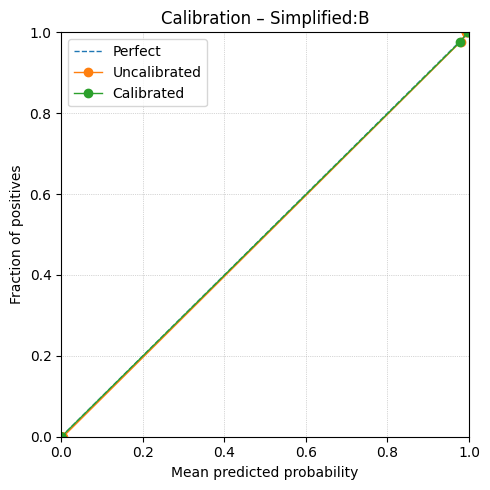

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Triana/Models/Simplified_B/Simplified_B_bundle.joblib

B
               precision    recall  f1-score   support

           0       1.00      1.00      1.00      1946
           1       1.00      1.00      1.00      1946

    accuracy                           1.00      3892
   macro avg       1.00      1.00      1.00      3892
weighted avg       1.00      1.00      1.00      3892


Processing CD4_T (class 2/12)...
Training - Found 8238 / 8238 barcodes
Training - Pos: 4119, Neg: 4119
Training labels: 4119 pos, 4119 neg
Testing  - Found 2290 / 2290 barcodes
Testing  - Pos: 1145, Neg: 1145
Testing  - labels: 1145 pos, 1145 neg
Calibrating - Found 3926 rows | Pos: 458, Neg: 3468
All test data: 9804 rows, positives for CD4_T: 1145
[scale] CD4_T: train mean ~ 0.000, std ~ 1.000

[NB] training → CD4_T
Fitting 10 folds for each of 10 candidat

Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.



[KNN] training → CD4_T
Fitting 10 folds for each of 10 candidates, totalling 100 fits

[MLP] training → CD4_T
Fitting 10 folds for each of 10 candidates, totalling 100 fits
[CAL] CD4_T: cal positives=458/3926

Calibration metrics:
   Uncalibrated  |  Brier: 0.0038   LogLoss: 0.0177
     Calibrated  |  Brier: 0.0009   LogLoss: 0.0044


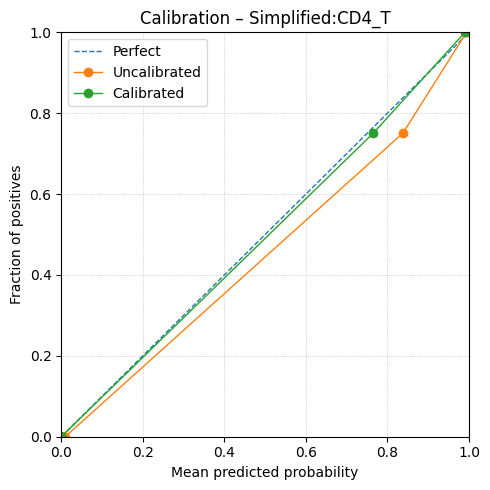

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Triana/Models/Simplified_CD4_T/Simplified_CD4_T_bundle.joblib

CD4_T
               precision    recall  f1-score   support

           0       1.00      1.00      1.00      1145
           1       1.00      1.00      1.00      1145

    accuracy                           1.00      2290
   macro avg       1.00      1.00      1.00      2290
weighted avg       1.00      1.00      1.00      2290


Processing CD8_T (class 3/12)...
Training - Found 11754 / 11754 barcodes
Training - Pos: 5877, Neg: 5877
Training labels: 5877 pos, 5877 neg
Testing  - Found 3266 / 3266 barcodes
Testing  - Pos: 1633, Neg: 1633
Testing  - labels: 1633 pos, 1633 neg
Calibrating - Found 3926 rows | Pos: 653, Neg: 3273
All test data: 9804 rows, positives for CD8_T: 1633
[scale] CD8_T: train mean ~ 0.000, std ~ 1.000

[NB] training → CD8_T
Fitting 10 folds for each 

Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.



[KNN] training → CD8_T
Fitting 10 folds for each of 10 candidates, totalling 100 fits

[MLP] training → CD8_T
Fitting 10 folds for each of 10 candidates, totalling 100 fits
[CAL] CD8_T: cal positives=653/3926

Calibration metrics:
   Uncalibrated  |  Brier: 0.0059   LogLoss: 0.0250
     Calibrated  |  Brier: 0.0039   LogLoss: 0.0168


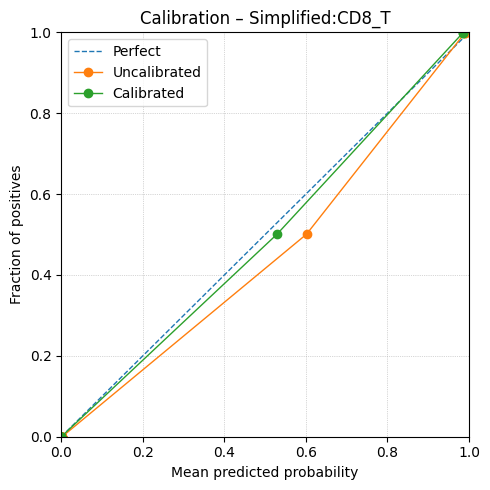

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Triana/Models/Simplified_CD8_T/Simplified_CD8_T_bundle.joblib

CD8_T
               precision    recall  f1-score   support

           0       1.00      0.99      0.99      1633
           1       0.99      1.00      0.99      1633

    accuracy                           0.99      3266
   macro avg       0.99      0.99      0.99      3266
weighted avg       0.99      0.99      0.99      3266


Processing Erythroid (class 4/12)...
Training - Found 2880 / 2880 barcodes
Training - Pos: 1440, Neg: 1440
Training labels: 1440 pos, 1440 neg
Testing  - Found 800 / 800 barcodes
Testing  - Pos: 400, Neg: 400
Testing  - labels: 400 pos, 400 neg
Calibrating - Found 3926 rows | Pos: 160, Neg: 3766
All test data: 9804 rows, positives for Erythroid: 400
[scale] Erythroid: train mean ~ -0.000, std ~ 1.000

[NB] training → Erythroid
Fitting 10 folds f

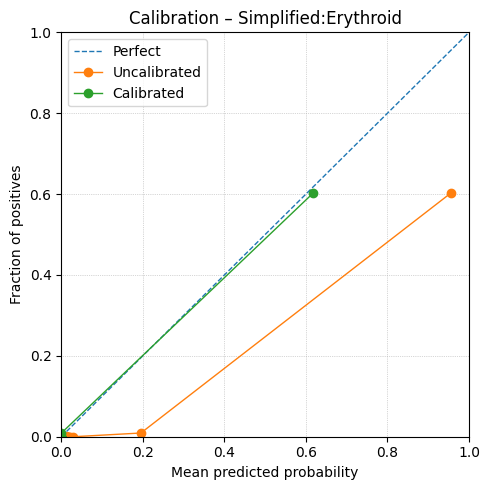

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Triana/Models/Simplified_Erythroid/Simplified_Erythroid_bundle.joblib

Erythroid
               precision    recall  f1-score   support

           0       0.97      0.99      0.98       400
           1       0.99      0.96      0.98       400

    accuracy                           0.98       800
   macro avg       0.98      0.98      0.98       800
weighted avg       0.98      0.98      0.98       800


Processing HSPC (class 5/12)...
Training - Found 11338 / 11338 barcodes
Training - Pos: 5669, Neg: 5669
Training labels: 5669 pos, 5669 neg
Testing  - Found 3146 / 3146 barcodes
Testing  - Pos: 1573, Neg: 1573
Testing  - labels: 1573 pos, 1573 neg
Calibrating - Found 3926 rows | Pos: 632, Neg: 3294
All test data: 9804 rows, positives for HSPC: 1573
[scale] HSPC: train mean ~ -0.000, std ~ 1.000

[NB] training → HSPC
Fitting 10 folds 

Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.



[KNN] training → HSPC
Fitting 10 folds for each of 10 candidates, totalling 100 fits

[MLP] training → HSPC
Fitting 10 folds for each of 10 candidates, totalling 100 fits
[CAL] HSPC: cal positives=632/3926

Calibration metrics:
   Uncalibrated  |  Brier: 0.0110   LogLoss: 0.0456
     Calibrated  |  Brier: 0.0084   LogLoss: 0.0317


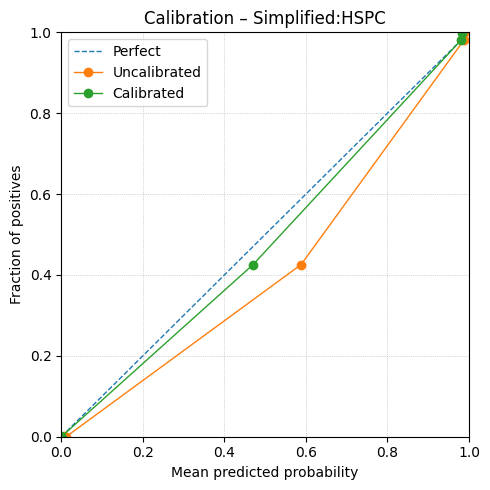

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Triana/Models/Simplified_HSPC/Simplified_HSPC_bundle.joblib

HSPC
               precision    recall  f1-score   support

           0       0.98      0.98      0.98      1573
           1       0.98      0.98      0.98      1573

    accuracy                           0.98      3146
   macro avg       0.98      0.98      0.98      3146
weighted avg       0.98      0.98      0.98      3146


Processing Monocyte (class 6/12)...
Training - Found 7762 / 7762 barcodes
Training - Pos: 3881, Neg: 3881
Training labels: 3881 pos, 3881 neg
Testing  - Found 2156 / 2156 barcodes
Testing  - Pos: 1078, Neg: 1078
Testing  - labels: 1078 pos, 1078 neg
Calibrating - Found 3926 rows | Pos: 432, Neg: 3494
All test data: 9804 rows, positives for Monocyte: 1078
[scale] Monocyte: train mean ~ -0.000, std ~ 1.000

[NB] training → Monocyte
Fitting 10 folds f

Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.



[KNN] training → Monocyte
Fitting 10 folds for each of 10 candidates, totalling 100 fits

[MLP] training → Monocyte
Fitting 10 folds for each of 10 candidates, totalling 100 fits
[CAL] Monocyte: cal positives=432/3926

Calibration metrics:
   Uncalibrated  |  Brier: 0.0049   LogLoss: 0.0230
     Calibrated  |  Brier: 0.0025   LogLoss: 0.0109


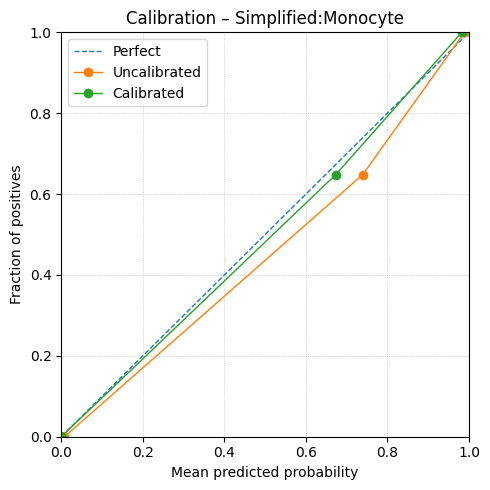

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Triana/Models/Simplified_Monocyte/Simplified_Monocyte_bundle.joblib

Monocyte
               precision    recall  f1-score   support

           0       1.00      0.99      1.00      1078
           1       0.99      1.00      1.00      1078

    accuracy                           1.00      2156
   macro avg       1.00      1.00      1.00      2156
weighted avg       1.00      1.00      1.00      2156


Processing Myeloid (class 7/12)...
Training - Found 1106 / 1106 barcodes
Training - Pos: 553, Neg: 553
Training labels: 553 pos, 553 neg
Testing  - Found 306 / 306 barcodes
Testing  - Pos: 153, Neg: 153
Testing  - labels: 153 pos, 153 neg
Calibrating - Found 3926 rows | Pos: 61, Neg: 3865
All test data: 9804 rows, positives for Myeloid: 153
[scale] Myeloid: train mean ~ 0.000, std ~ 1.000

[NB] training → Myeloid
Fitting 10 folds for ea

Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.



[MLP] training → Myeloid
Fitting 10 folds for each of 10 candidates, totalling 100 fits
[CAL] Myeloid: cal positives=61/3926

Calibration metrics:
   Uncalibrated  |  Brier: 0.0393   LogLoss: 0.1326
     Calibrated  |  Brier: 0.0063   LogLoss: 0.0224


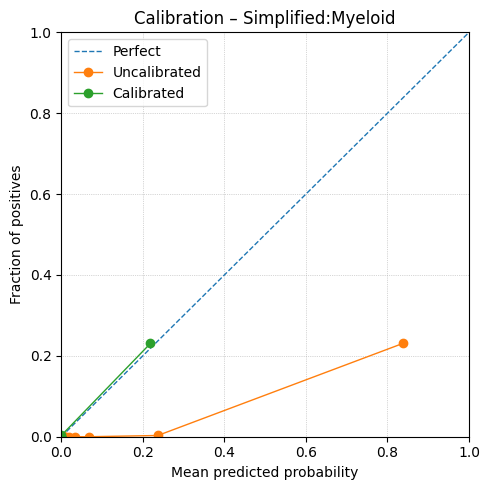

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Triana/Models/Simplified_Myeloid/Simplified_Myeloid_bundle.joblib

Myeloid
               precision    recall  f1-score   support

           0       0.80      0.99      0.88       153
           1       0.99      0.75      0.85       153

    accuracy                           0.87       306
   macro avg       0.89      0.87      0.87       306
weighted avg       0.89      0.87      0.87       306


Processing NK (class 8/12)...
Training - Found 7462 / 7462 barcodes
Training - Pos: 3731, Neg: 3731
Training labels: 3731 pos, 3731 neg
Testing  - Found 2072 / 2072 barcodes
Testing  - Pos: 1036, Neg: 1036
Testing  - labels: 1036 pos, 1036 neg
Calibrating - Found 3926 rows | Pos: 415, Neg: 3511
All test data: 9804 rows, positives for NK: 1036
[scale] NK: train mean ~ 0.000, std ~ 1.000

[NB] training → NK
Fitting 10 folds for each of 10 ca

Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.



[KNN] training → NK
Fitting 10 folds for each of 10 candidates, totalling 100 fits

[MLP] training → NK
Fitting 10 folds for each of 10 candidates, totalling 100 fits
[CAL] NK: cal positives=415/3926

Calibration metrics:
   Uncalibrated  |  Brier: 0.0006   LogLoss: 0.0055
     Calibrated  |  Brier: 0.0005   LogLoss: 0.0025


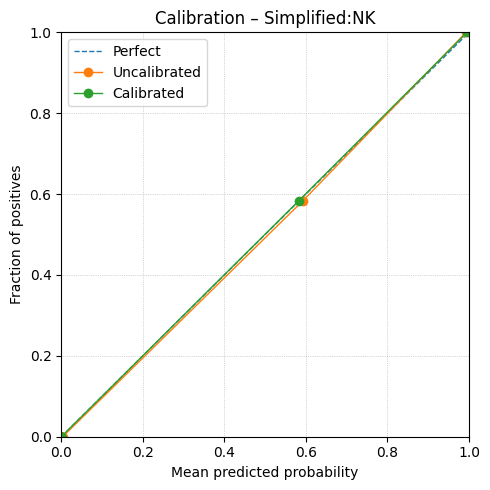

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Triana/Models/Simplified_NK/Simplified_NK_bundle.joblib

NK
               precision    recall  f1-score   support

           0       1.00      1.00      1.00      1036
           1       1.00      1.00      1.00      1036

    accuracy                           1.00      2072
   macro avg       1.00      1.00      1.00      2072
weighted avg       1.00      1.00      1.00      2072


Processing Other_T (class 9/12)...
Training - Found 1502 / 1502 barcodes
Training - Pos: 751, Neg: 751
Training labels: 751 pos, 751 neg
Testing  - Found 416 / 416 barcodes
Testing  - Pos: 208, Neg: 208
Testing  - labels: 208 pos, 208 neg
Calibrating - Found 3926 rows | Pos: 83, Neg: 3843
All test data: 9804 rows, positives for Other_T: 208
[scale] Other_T: train mean ~ 0.000, std ~ 1.000

[NB] training → Other_T
Fitting 10 folds for each of 10 candidate

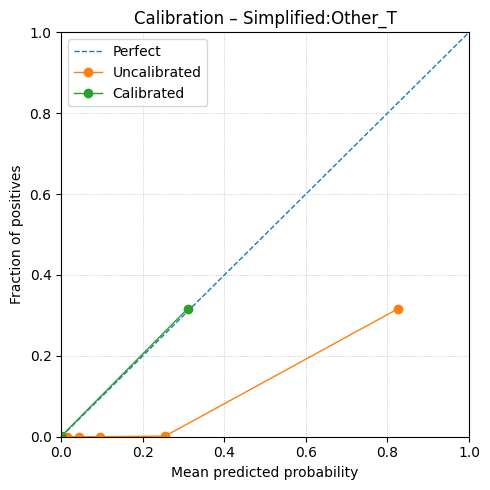

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Triana/Models/Simplified_Other_T/Simplified_Other_T_bundle.joblib

Other_T
               precision    recall  f1-score   support

           0       0.94      1.00      0.97       208
           1       1.00      0.93      0.97       208

    accuracy                           0.97       416
   macro avg       0.97      0.97      0.97       416
weighted avg       0.97      0.97      0.97       416


Processing Plasma (class 10/12)...
Training - Found 702 / 702 barcodes
Training - Pos: 351, Neg: 351
Training labels: 351 pos, 351 neg
Testing  - Found 194 / 194 barcodes
Testing  - Pos: 97, Neg: 97
Testing  - labels: 97 pos, 97 neg
Calibrating - Found 3926 rows | Pos: 39, Neg: 3887
All test data: 9804 rows, positives for Plasma: 97
[scale] Plasma: train mean ~ 0.000, std ~ 1.000

[NB] training → Plasma
Fitting 10 folds for each of 10 cand

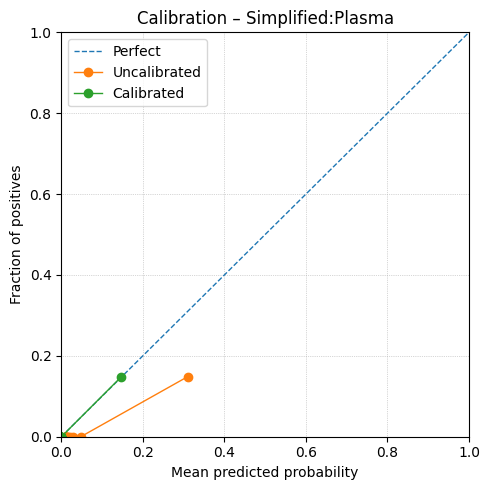

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Triana/Models/Simplified_Plasma/Simplified_Plasma_bundle.joblib

Plasma
               precision    recall  f1-score   support

           0       0.99      1.00      0.99        97
           1       1.00      0.99      0.99        97

    accuracy                           0.99       194
   macro avg       0.99      0.99      0.99       194
weighted avg       0.99      0.99      0.99       194


Processing cDC (class 11/12)...
Training - Found 2482 / 2482 barcodes
Training - Pos: 1241, Neg: 1241
Training labels: 1241 pos, 1241 neg
Testing  - Found 690 / 690 barcodes
Testing  - Pos: 345, Neg: 345
Testing  - labels: 345 pos, 345 neg
Calibrating - Found 3926 rows | Pos: 138, Neg: 3788
All test data: 9804 rows, positives for cDC: 345
[scale] cDC: train mean ~ -0.000, std ~ 1.000

[NB] training → cDC
Fitting 10 folds for each of 10 candid

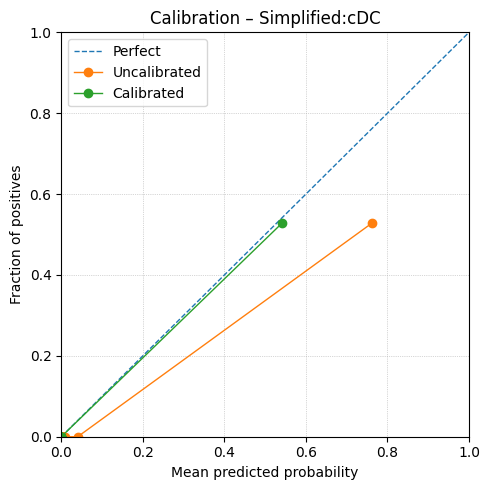

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Triana/Models/Simplified_cDC/Simplified_cDC_bundle.joblib

cDC
               precision    recall  f1-score   support

           0       0.99      0.99      0.99       345
           1       0.99      0.99      0.99       345

    accuracy                           0.99       690
   macro avg       0.99      0.99      0.99       690
weighted avg       0.99      0.99      0.99       690


Processing pDC (class 12/12)...
Training - Found 1368 / 1368 barcodes
Training - Pos: 684, Neg: 684
Training labels: 684 pos, 684 neg
Testing  - Found 380 / 380 barcodes
Testing  - Pos: 190, Neg: 190
Testing  - labels: 190 pos, 190 neg
Calibrating - Found 3926 rows | Pos: 76, Neg: 3850
All test data: 9804 rows, positives for pDC: 190
[scale] pDC: train mean ~ 0.000, std ~ 1.000

[NB] training → pDC
Fitting 10 folds for each of 10 candidates, totalling

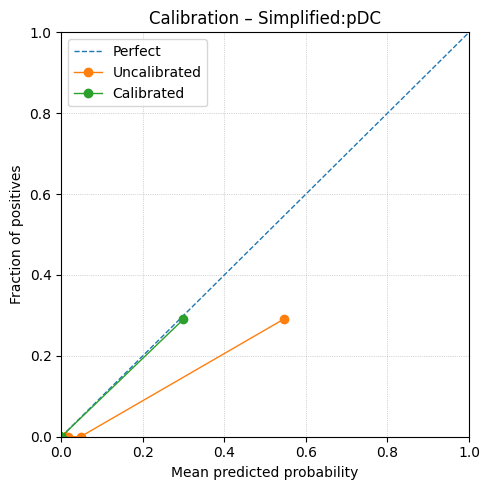

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Triana/Models/Simplified_pDC/Simplified_pDC_bundle.joblib

pDC
               precision    recall  f1-score   support

           0       0.96      0.99      0.98       190
           1       0.99      0.96      0.98       190

    accuracy                           0.98       380
   macro avg       0.98      0.98      0.98       380
weighted avg       0.98      0.98      0.98       380


Fitting multiclass TemperatureScaling on CAL split (excluded classes masked out)...

Preview of probabilities BEFORE (raw OvR) vs AFTER (multiclass TS) [included classes only]:
                          raw_B  raw_CD4_T     raw_CD8_T  raw_Erythroid  raw_HSPC  raw_Monocyte   raw_Myeloid    raw_NK   raw_Other_T  raw_Plasma       raw_cDC       raw_pDC      mc_B      mc_CD4_T      mc_CD8_T  mc_Erythroid   mc_HSPC   mc_Monocyte    mc_Myeloid     mc_NK    m

In [132]:
# -*- coding: utf-8 -*-
from pathlib import Path
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.ensemble import StackingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.calibration import CalibratedClassifierCV
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report, confusion_matrix

from netcal.scaling import TemperatureScaling
import joblib

# ------------------------------------------------------------------- CONFIG (expects these to already exist)
#   models_output, train_barcodes_path, test_barcodes_path
#   Triana_data_Train, Triana_data_Test, Triana_data_Cal          (DataFrames indexed by barcode)
#   Triana_dataset_Train, Triana_dataset_Test, Triana_dataset_Cal (AnnData with obs labels)
#   TotalSeqD_Heme_Oncology_CAT399906                    (iterable of feature names)
#   MLTraining module with: CV, train_NB, train_XGB, train_KNN, train_MLP,
#                           plot_calibration_curve, save_models, evaluate_classifier, append_metrics_csv

name_target_class = "Simplified"   # "simplified" | "Simplified" | "Detailed"
fig_root   = Path(models_output) / "Figures"
models_dir = Path(models_output) / "Models"
fig_root.mkdir(parents=True, exist_ok=True)
models_dir.mkdir(parents=True, exist_ok=True)

kf         = MLTraining.CV
num_cores  = -1
metrics_log = []

# ============================= HELPERS =============================

def _norm_feats(names) -> pd.Index:
    """
    Normalizer used ONLY to construct matching keys.
    Panel names remain untouched; data columns are normalized and then mapped BACK
    to the exact panel names via a lookup.
    """
    s = pd.Index(map(str, names))
    s = (s.str.strip()
           .str.lower()
           .str.replace(r"[ _/]+", "-", regex=True)
           .str.replace(r"-+", "-", regex=True)
           .str.strip("-"))
    return s

def attach_celltype(df: pd.DataFrame, ad: "AnnData", field: str) -> pd.DataFrame:
    if field not in ad.obs:
        raise KeyError(f"'{field}' not found in AnnData.obs")
    lab = (ad.obs[field]
             .astype("string")
             .str.strip()
             .str.replace(r"\s+", "_", regex=True))
    out = df.copy()
    out["Celltype"] = pd.Categorical(lab.reindex(out.index))
    if out["Celltype"].isna().any():
        missing = int(out["Celltype"].isna().sum())
        print(f"[WARN] {missing} rows got NaN Celltype after reindex; check barcode alignment.")
    return out

def _check_finite(df: pd.DataFrame, tag: str):
    arr = df.to_numpy()
    if not np.isfinite(arr).all():
        bad = np.where(~np.isfinite(arr))
        raise ValueError(f"Non-finite values found in {tag} features at positions {bad}")

def _unwrap_estimator(m):
    return getattr(m, "estimator", None) or getattr(m, "base_estimator", None) or m

def _assert_feature_counts(cell_name: str, models_dict: dict, expected: int):
    pairs = [
        ("NB",  models_dict.get("NB")),
        ("XGB", models_dict.get("XGB")),
        ("KNN", models_dict.get("KNN")),
        ("MLP", models_dict.get("MLP")),
        ("Stacker", models_dict.get("Stacker")),
    ]
    for name, est in pairs:
        if est is None:
            continue
        base = _unwrap_estimator(est)
        nfi = getattr(base, "n_features_in_", None)
        if nfi is not None and nfi != expected:
            raise RuntimeError(f"{cell_name}:{name} saw {nfi} features; expected {expected}")

# ============================= LABEL ATTACH =============================

consensus_field = f"Consensus_annotation_{name_target_class.lower()}_final"

Triana_data_Train = attach_celltype(Triana_data_Train, Triana_dataset_Train, consensus_field)
Triana_data_Test  = attach_celltype(Triana_data_Test,  Triana_dataset_Test,  consensus_field)
Triana_data_Cal   = attach_celltype(Triana_data_Cal,   Triana_dataset_Cal,   consensus_field)

# ============================= PANEL & DATA COLUMN ALIGNMENT =============================

# Keep the panel EXACTLY as provided
panel = pd.Index(map(str, TotalSeqD_Heme_Oncology_CAT399906))

# Build a mapping: normalized_key -> exact panel name
panel_keys    = _norm_feats(panel)
norm_to_panel = dict(zip(panel_keys, panel))
if len(norm_to_panel) != len(panel):
    raise ValueError("Panel contains names that collide after normalization. Consider adjusting _norm_feats rules.")

def _rename_data_to_panel(df: pd.DataFrame) -> pd.DataFrame:
    """
    Rename only feature columns so that after normalization they map
    back to the exact panel column names. Keeps 'cell_barcode' and 'Celltype' intact.
    """
    df = df.copy()
    non_feat = [c for c in ["cell_barcode", "Celltype"] if c in df.columns]
    feat     = pd.Index([c for c in df.columns if c not in non_feat])

    feat_keys   = _norm_feats(feat)
    mapped      = [norm_to_panel.get(k) for k in feat_keys]  # None if not in panel
    rename_map  = {old: new for old, new in zip(feat, mapped) if new is not None}

    # Handle duplicate mappings (two data columns → same panel col). Keep first, drop the rest.
    seen, safe_map, drops = set(), {}, []
    for old, new in rename_map.items():
        if new in seen:
            drops.append(old)
        else:
            seen.add(new); safe_map[old] = new

    if drops:
        print(f"[WARN] Dropping {len(drops)} duplicated-mapped columns (showing up to 5): {drops[:5]}")

    if drops:
        df.drop(columns=drops, inplace=True, errors="ignore")
    df.rename(columns=safe_map, inplace=True)

    matched = len(safe_map)
    print(f"[map] matched {matched}/{len(feat)} data columns to panel")
    return df

# Apply: normalize/rename ONLY data splits (panel remains untouched)
Triana_data_Train = _rename_data_to_panel(Triana_data_Train)
Triana_data_Test  = _rename_data_to_panel(Triana_data_Test)
Triana_data_Cal   = _rename_data_to_panel(Triana_data_Cal)

# Intersect each split with the panel IN PANEL ORDER
def _panel_intersection(df: pd.DataFrame) -> pd.DataFrame:
    non_feat = [c for c in ["cell_barcode", "Celltype"] if c in df.columns]
    feat_cols = pd.Index([c for c in df.columns if c not in non_feat])
    inter = panel.intersection(feat_cols, sort=False)
    if inter.empty:
        raise ValueError("Panel/Data intersection is empty after renaming. Check mapping rules.")
    return df.reindex(columns=list(inter) + non_feat)

Triana_data_Train = _panel_intersection(Triana_data_Train)
Triana_data_Test  = _panel_intersection(Triana_data_Test)
Triana_data_Cal   = _panel_intersection(Triana_data_Cal)

# ============================= FEATURES & LABELS =============================

Triana_data_Cal_lbl = Triana_data_Cal[["Celltype"]].copy()

drop_cols_train = [c for c in ["cell_barcode", "Celltype"] if c in Triana_data_Train.columns]
drop_cols_test  = [c for c in ["cell_barcode", "Celltype"] if c in Triana_data_Test.columns]
drop_cols_cal   = [c for c in ["cell_barcode", "Celltype"] if c in Triana_data_Cal.columns]

Triana_data_Train_Sub = Triana_data_Train.drop(columns=drop_cols_train, errors="ignore")
Triana_data_Test_Sub  = Triana_data_Test.drop(columns=drop_cols_test,  errors="ignore")
Triana_data_Cal_Sub   = Triana_data_Cal.drop(columns=drop_cols_cal,    errors="ignore")

# SAFETY: shared columns & finiteness checks
cols_train = list(Triana_data_Train_Sub.columns)
if list(Triana_data_Test_Sub.columns) != cols_train or list(Triana_data_Cal_Sub.columns) != cols_train:
    raise ValueError("Train/Cal/Test feature columns differ after panel intersection!")

_check_finite(Triana_data_Train_Sub, "TRAIN")
_check_finite(Triana_data_Test_Sub,  "TEST")
_check_finite(Triana_data_Cal_Sub,   "CAL")

print(f"\n[features] Using {len(cols_train)} panel-intersected features (exact panel names):")
print(cols_train)

# ===== Exclude specific classes from the multiclass set and per-class loop =====
EXCLUDE_CLASSES = {"Macrophage", "ILC", "Stroma"}

all_classes = sorted(pd.Series(Triana_data_Train["Celltype"]).dropna().unique())
class_names = [c for c in all_classes if c not in EXCLUDE_CLASSES]
if not class_names:
    raise ValueError("After exclusions, class_names is empty.")
print(f"[classes] Included ({len(class_names)}): {class_names}")
if missing := [c for c in all_classes if c in EXCLUDE_CLASSES]:
    print(f"[classes] Excluded: {missing}")

K            = len(class_names)
class_to_idx = {c: i for i, c in enumerate(class_names)}

# --- Multiclass labels (MASKED to included classes) ---
# CAL
mask_cal_mc = Triana_data_Cal_lbl["Celltype"].isin(class_names)
s_cal = Triana_data_Cal_lbl.loc[mask_cal_mc, "Celltype"].map(class_to_idx)
if s_cal.isna().any():
    missing = Triana_data_Cal_lbl.loc[mask_cal_mc & s_cal.isna(), "Celltype"].unique()
    raise ValueError(f"Unknown labels in masked CAL split: {missing}")
y_cal_multiclass = s_cal.to_numpy(dtype=np.int64)

# TEST
mask_test_mc = Triana_data_Test["Celltype"].isin(class_names)
s_te = Triana_data_Test.loc[mask_test_mc, "Celltype"].map(class_to_idx)
if s_te.isna().any():
    missing = Triana_data_Test.loc[mask_test_mc & s_te.isna(), "Celltype"].unique()
    raise ValueError(f"Unknown labels in masked TEST split: {missing}")
y_test_multiclass = s_te.to_numpy(dtype=np.int64)

# Reuse across classes
X_cal_all_df = Triana_data_Cal_Sub.copy()
X_te_all_df  = Triana_data_Test_Sub.copy()

# Preallocate OvR prob mats (only for included classes)
P_cal = np.zeros((X_cal_all_df.shape[0], K), dtype=float)
P_te  = np.zeros((X_te_all_df.shape[0],  K), dtype=float)

test_index = Triana_data_Test_Sub.index

# ============================= TRAIN PER-CLASS OVR =============================

for celltype in class_names:
    k = class_to_idx[celltype]
    name = str(celltype).replace(" ", "_")
    print(f"\nProcessing {name} (class {k+1}/{K})...")

    # ---- TRAIN slice via barcode lists
    train_barcodes_df = pd.read_csv(
        f"{train_barcodes_path}/Triana/Consensus_annotation_simplified_final/Barcodes_training_class_{name}.csv",
        index_col=0
    )
    train_positive_barcodes = train_barcodes_df["Positive"].dropna().values
    train_negative_barcodes = train_barcodes_df["Negative"].dropna().values
    all_train_barcodes = np.concatenate([train_positive_barcodes, train_negative_barcodes])

    train_mask = Triana_data_Train_Sub.index.isin(all_train_barcodes)
    X_tr_df = Triana_data_Train_Sub.loc[train_mask]
    found_train_barcodes = X_tr_df.index.values
    y_tr = np.isin(found_train_barcodes, train_positive_barcodes).astype(int)

    # ---- Skip guards
    if X_tr_df.empty or np.unique(y_tr).size < 2:
        print(f"[SKIP] {name}: empty or single-class train slice (pos={y_tr.sum()}, neg={(len(y_tr)-y_tr.sum())}).")
        continue

    # ---- TEST slice via barcode lists
    test_barcodes_df = pd.read_csv(
        f"{test_barcodes_path}/Triana/Consensus_annotation_simplified_final/Barcodes_testing_class_{name}.csv",
        index_col=0
    )
    test_positive_barcodes = test_barcodes_df["Positive"].dropna().values
    test_negative_barcodes = test_barcodes_df["Negative"].dropna().values
    all_test_barcodes = np.concatenate([test_positive_barcodes, test_negative_barcodes])

    test_mask = Triana_data_Test_Sub.index.isin(all_test_barcodes)
    X_te_df = Triana_data_Test_Sub.loc[test_mask]
    found_test_barcodes = X_te_df.index.values
    y_te = np.isin(found_test_barcodes, test_positive_barcodes).astype(int)

    # ---- Full-test & cal for this binary head
    X_te_all_local = X_te_all_df.copy()
    y_te_all = (Triana_data_Test["Celltype"].values == celltype).astype(int)
    X_cal_df = X_cal_all_df.copy()
    y_cal_bin = (Triana_data_Cal_lbl["Celltype"].values == celltype).astype(int)

    # ---- Info
    print(f"Training - Found {X_tr_df.shape[0]} / {len(all_train_barcodes)} barcodes")
    print(f"Training - Pos: {len(train_positive_barcodes)}, Neg: {len(train_negative_barcodes)}")
    print(f"Training labels: {y_tr.sum()} pos, {len(y_tr)-y_tr.sum()} neg")
    print(f"Testing  - Found {X_te_df.shape[0]} / {len(all_test_barcodes)} barcodes")
    print(f"Testing  - Pos: {len(test_positive_barcodes)}, Neg: {len(test_negative_barcodes)}")
    print(f"Testing  - labels: {y_te.sum()} pos, {len(y_te)-y_te.sum()} neg")
    print(f"Calibrating - Found {X_cal_df.shape[0]} rows | Pos: {y_cal_bin.sum()}, Neg: {len(y_cal_bin)-y_cal_bin.sum()}")
    print(f"All test data: {X_te_all_local.shape[0]} rows, positives for {celltype}: {y_te_all.sum()}")

    # ---- Scaling (fit on per-head TRAIN slice; transform others)
    scaler = StandardScaler(with_mean=True, with_std=True).fit(X_tr_df.values)

    def _sc(df):
        return pd.DataFrame(
            scaler.transform(df.values),
            index=df.index,
            columns=cols_train,
        )

    X_tr_sc_df     = _sc(X_tr_df)
    X_te_sc_df     = _sc(X_te_df)
    X_te_all_sc_df = _sc(X_te_all_local)
    X_cal_sc_df    = _sc(X_cal_df)

    print(f"[scale] {name}: train mean ~ {X_tr_sc_df.values.mean():.3f}, std ~ {X_tr_sc_df.values.std():.3f}")

    # ---- Base learners
    NB_model  = MLTraining.train_NB (X_tr_sc_df, y_tr, cv=kf, num_cores=num_cores, name_target_subclass=name)
    XGB_model = MLTraining.train_XGB(X_tr_sc_df, y_tr, cv=kf, num_cores=num_cores, name_target_subclass=name)
    KNN_model = MLTraining.train_KNN(X_tr_sc_df, y_tr, cv=kf, num_cores=num_cores, name_target_subclass=name)
    MLP_model = MLTraining.train_MLP(X_tr_sc_df, y_tr, cv=kf, num_cores=num_cores, name_target_subclass=name)

    # ---- Stacker (raw)
    stacker_raw = StackingClassifier(
        estimators=[("NB", NB_model), ("XGB", XGB_model), ("KNN", KNN_model), ("MLP", MLP_model)],
        final_estimator=LogisticRegression(max_iter=2000, class_weight="balanced", random_state=42),
        stack_method="predict_proba",
        cv=kf,
        n_jobs=-1,
    ).fit(X_tr_sc_df, y_tr)

    # ---- Feature count asserts (debug safety)
    expected_feats = len(cols_train)
    _assert_feature_counts(name, {
        "NB": NB_model, "XGB": XGB_model, "KNN": KNN_model, "MLP": MLP_model, "Stacker": stacker_raw
    }, expected_feats)

    # ---- Binary calibration (Platt, guarded)
    pos_cal    = int(y_cal_bin.sum())
    n_cal_bin  = int(len(y_cal_bin))
    has_both   = (0 < pos_cal < n_cal_bin)
    print(f"[CAL] {name}: cal positives={pos_cal}/{n_cal_bin}")

    if has_both:
        try:
            calibrator = CalibratedClassifierCV(estimator=stacker_raw, method="sigmoid", cv="prefit")
        except TypeError:  # older sklearn
            calibrator = CalibratedClassifierCV(base_estimator=stacker_raw, method="sigmoid", cv="prefit")
        stacker = calibrator.fit(X_cal_sc_df, y_cal_bin)
    else:
        print(f"[WARN] Skipping calibration for {name}: single-class cal set.")
        stacker = stacker_raw

    # ---- Calibration plot on all-test (optional)
    try:
        y_proba_uncal = stacker_raw.predict_proba(X_te_all_sc_df)[:, 1]
        y_proba_cal   = stacker.predict_proba(X_te_all_sc_df)[:, 1]
        if has_both:
            _ = MLTraining.plot_calibration_curve(
                y_te_all, [y_proba_uncal, y_proba_cal],
                clf_names=["Uncalibrated", "Calibrated"],
                n_bins=15, strategy="quantile",
                title=f"Calibration – {name_target_class}:{name}"
            )
        else:
            _ = MLTraining.plot_calibration_curve(
                y_te_all, [y_proba_uncal],
                clf_names=["Uncalibrated"],
                n_bins=15, strategy="quantile",
                title=f"Calibration (uncal only) – {name_target_class}:{name}"
            )
        plt.tight_layout()
        plt.show()
    except Exception as e:
        print(f"[WARN] Skipped calibration plot for {name}: {e}")

    # ---- Save per-class bundle (model + scaler + columns)
    save_subdir = models_dir / f"{name_target_class}_{name}"
    save_subdir.mkdir(parents=True, exist_ok=True)

    MLTraining.save_models({"Stacked": stacker}, out_dir=save_subdir, tag=f"{name_target_class}_{name}")
    joblib.dump(cols_train, save_subdir / "feature_names.joblib")

    bundle = {
        "atlas": "Triana",
        "depth": name_target_class,
        "label": celltype,
        "model": stacker,          # CalibratedClassifierCV(StackingClassifier) or StackingClassifier
        "columns": cols_train,     # exact panel names, panel order
        "scaler": scaler,          # per-head scaler
        "panel_name": "TotalSeqD_Heme_Oncology_CAT399906",
    }
    bundle_path = save_subdir / f"{name_target_class}_{name}_bundle.joblib"
    joblib.dump(bundle, bundle_path)
    print(f"[SAVE] Wrote bundle with columns+scaler to {bundle_path}")

    # ---- Binary metrics on the class-specific test slice
    try:
        m = MLTraining.evaluate_classifier(stacker, X_te_sc_df, y_te, plot_cm=False)
        m.update(celltype=celltype)
        metrics_log.append(m)
        print(f"\n{celltype}\n", m.get("report", ""))
    except Exception as e:
        print(f"[WARN] Binary metrics for {name} skipped: {e}")

    # ---- Store OvR probs for multiclass calibration (columns order = class_names)
    P_cal[:, k] = stacker.predict_proba(X_cal_sc_df)[:, 1]
    P_te[:,  k] = stacker.predict_proba(X_te_all_sc_df)[:, 1]

# ============================= MULTICLASS CALIBRATION =============================

print("\nFitting multiclass TemperatureScaling on CAL split (excluded classes masked out)...")

# Guards: ensure probs are in [0,1]
if (P_cal < 0).any() or (P_cal > 1).any():
    raise ValueError("P_cal must be probabilities in [0,1].")
if (P_te < 0).any() or (P_te > 1).any():
    raise ValueError("P_te must be probabilities in [0,1].")

ts_cal = TemperatureScaling()
# Fit only on CAL rows whose true label is one of the included classes
ts_cal.fit(P_cal[mask_cal_mc.values, :], y_cal_multiclass)
P_te_mc = ts_cal.transform(P_te)

# Ensure calibrated probs shape (K)
P_te_mc = np.asarray(P_te_mc)
if P_te_mc.ndim == 1:
    P_te_mc = P_te_mc.reshape(-1, 1)
if P_te_mc.shape[1] == 1 and K == 2:
    P_te_mc = np.hstack([1.0 - P_te_mc, P_te_mc])
elif P_te_mc.shape[1] != K:
    # Fallback: normalize OvR sums
    row_sums = P_te.sum(axis=1, keepdims=True)
    row_sums[row_sums == 0.0] = 1.0
    P_te_mc = P_te / row_sums
    print(f"[WARN] TemperatureScaling returned shape {P_te_mc.shape}; fell back to sum-normalized OvR probs.")

# Persist multiclass temp scaler + INCLUDED class names
joblib.dump(ts_cal, models_dir / f"{name_target_class}_multiclass_temp_scaler.joblib")
(pd.Series(class_names, name="class_name")
   .to_csv(models_dir / f"{name_target_class}_class_names.csv", index=False))

# ============================= PROBS COMPARISON & METRICS =============================

# Evaluate & save on TEST rows whose true label is an INCLUDED class
test_index_masked = Triana_data_Test_Sub.index[mask_test_mc.values]

probs_raw_df = pd.DataFrame(P_te[mask_test_mc.values, :],    index=test_index_masked,
                            columns=[f"raw_{c}" for c in class_names])
probs_mc_df  = pd.DataFrame(P_te_mc[mask_test_mc.values, :], index=test_index_masked,
                            columns=[f"mc_{c}"  for c in class_names])

probs_compare = pd.concat([probs_raw_df, probs_mc_df], axis=1)
probs_compare["true_label"]    = Triana_data_Test.loc[mask_test_mc, "Celltype"].values
probs_compare["pred_raw"]      = P_te[mask_test_mc.values, :].argmax(axis=1)
probs_compare["pred_mc"]       = P_te_mc[mask_test_mc.values, :].argmax(axis=1)
probs_compare["pred_raw_name"] = [class_names[i] for i in probs_compare["pred_raw"].values]
probs_compare["pred_mc_name"]  = [class_names[i] for i in probs_compare["pred_mc"].values]

print("\nPreview of probabilities BEFORE (raw OvR) vs AFTER (multiclass TS) [included classes only]:")
print(probs_compare.head(10).to_string())

probs_compare_path = models_dir / f"{name_target_class}_probabilities_before_after_TEST_included.csv"
probs_compare.to_csv(probs_compare_path, index=True)
print(f"\nSaved probabilities comparison to: {probs_compare_path}")

# Multiclass evaluation on the masked subset
y_pred_mc = P_te_mc[mask_test_mc.values, :].argmax(axis=1)
print("\nMulticlass classification report (TEST, excluded classes removed):")
print(classification_report(y_test_multiclass, y_pred_mc, target_names=class_names, digits=3))

cm = confusion_matrix(y_test_multiclass, y_pred_mc, labels=range(K))
print("Confusion matrix (rows=true, cols=pred):\n", cm)

# Per-class binary head metrics CSV
metrics_df = pd.DataFrame.from_records(metrics_log)
MLTraining.append_metrics_csv(metrics_df, csv_path=Path(models_output) / "stacker_metrics.csv")

print("\nDone.")


[subset] kept 2880/35305 cells for plotting (class=Erythroid)
[INFO] Palette has unused entries: ['LMPP', 'Small', 'Stroma', 'Macrophage', 'ILC', 'dnT', 'Platelet']


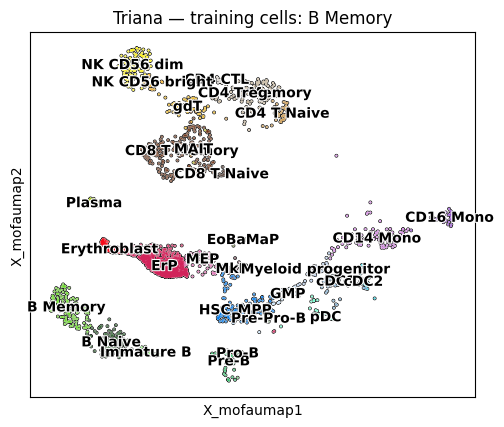

In [133]:
from pathlib import Path
import pandas as pd
import scanpy as sc
import matplotlib.pyplot as plt
from matplotlib import rc_context

# --------- 1) Collect training barcodes (union across classes or a single class) ---------
def collect_training_barcodes(train_barcodes_path: str | Path,
                              atlas: str = "Triana",
                              depth: str = "simplified",
                              class_name: str | None = None) -> pd.Index:
    """
    Reads CSVs like:
      {train_barcodes_path}/{atlas}/Consensus_annotation_{depth}_final/Barcodes_training_class_{Class}.csv
    and returns the union of 'Positive' and 'Negative' barcodes.
    """
    base = Path(train_barcodes_path) / atlas / f"Consensus_annotation_{depth.lower()}_final"

    if class_name is None:
        files = sorted(base.glob("Barcodes_training_class_*.csv"))
        if not files:
            raise FileNotFoundError(f"No training CSVs found in: {base}")
    else:
        files = [base / f"Barcodes_training_class_{str(class_name).replace(' ', '_')}.csv"]
        if not files[0].exists():
            raise FileNotFoundError(f"Training CSV not found: {files[0]}")

    barcodes = []
    for fp in files:
        df = pd.read_csv(fp, index_col=0)
        for col in ("Positive", "Negative"):
            if col in df.columns:
                barcodes.extend(df[col].dropna().astype(str).tolist())

    return pd.Index(pd.unique(barcodes))


# --------- 2) Plot UMAP for the subset of training barcodes ---------
def plot_training_subset_umap(
    adata,                                 # Triana_dataset_Train (AnnData)
    train_barcodes_path: str | Path,
    *,
    atlas: str = "Triana",
    depth: str = "simplified",             # matches your CSV folder name
    class_name: str | None = None,         # None -> all classes; or "B Memory", etc.
    label_key: str = "Consensus_annotation_detailed_final",
    basis_key: str = "X_mofaumap",
    custom_palette: dict | None = None,    # your dict {label: "#hex"}
    point_size: float = 10.0,
    title: str | None = None,
):
    # 1) get training barcodes
    keep_barcodes = collect_training_barcodes(train_barcodes_path, atlas=atlas, depth=depth, class_name=class_name)

    # 2) subset AnnData
    n_before = adata.n_obs
    mask = adata.obs_names.isin(keep_barcodes)
    n_after = int(mask.sum())
    if n_after == 0:
        raise ValueError("No training barcodes overlapped with adata.obs_names.")
    ad_sub = adata[mask].copy()
    print(f"[subset] kept {n_after}/{n_before} cells for plotting "
          f"({'ALL classes' if class_name is None else f'class={class_name}'})")

    # 3) ensure categorical for coloring
    if not pd.api.types.is_categorical_dtype(ad_sub.obs[label_key]):
        ad_sub.obs[label_key] = ad_sub.obs[label_key].astype("category")
    cats = list(ad_sub.obs[label_key].cat.categories)

    # 4) palette handling (use your custom palette where available; fallback to grey)
    fallback = "#cccccc"
    if custom_palette is None:
        palette_list = None  # let scanpy pick
    else:
        labels_in_palette = set(custom_palette.keys())
        labels_in_data = set(cats)
        missing_in_palette = [c for c in cats if c not in labels_in_palette]
        extra_in_palette   = [c for c in custom_palette.keys() if c not in labels_in_data]
        if missing_in_palette:
            print("[WARN] Missing colors for:", missing_in_palette, "-> using light grey (#cccccc).")
        if extra_in_palette:
            print("[INFO] Palette has unused entries:", extra_in_palette)

        palette_list = [custom_palette.get(c, fallback) for c in cats]
        # stash into .uns so scanpy reuses it
        ad_sub.uns[f"{label_key}_colors"] = palette_list

    # 5) plot
    with rc_context({"figure.figsize": (5.75, 4.75)}):
        sc.pl.embedding(
            ad_sub,
            basis=basis_key,
            color=label_key,
            palette=palette_list,
            legend_loc="on data",
            legend_fontsize=10,
            legend_fontoutline=1.5,
            size=point_size,
            add_outline=True,
            frameon=True,
            title=title or f"Triana — training subset ({'all classes' if class_name is None else class_name})",
            show=True,
        )


# ---------------------- EXAMPLES ----------------------
# 1) Plot ALL training barcodes (union of every class) with your detailed labels + palette
# plot_training_subset_umap(
#     Triana_dataset_Train,
#     train_barcodes_path=train_barcodes_path,
#     atlas="Triana",
#     depth="simplified",
#     class_name=None,
#     label_key="Consensus_annotation_detailed_final",
#     basis_key="X_mofaumap",
#     custom_palette=custom_palette,  # pass the dict you defined
#     point_size=10,
#     title="Triana — all training cells",
# )

# 2) Plot only one class’s training barcodes (e.g., "B Memory")
plot_training_subset_umap(
    Triana_dataset_Train,
    train_barcodes_path=train_barcodes_path,
    atlas="Triana",
    depth="simplified",
    class_name="Erythroid",
    label_key="Consensus_annotation_detailed_final",
    basis_key="X_mofaumap",
    custom_palette=custom_palette,
    point_size=10,
    title="Triana — training cells: B Memory",
)


[map] matched 31/31 data columns to panel
[map] matched 31/31 data columns to panel
[map] matched 31/31 data columns to panel

[features] Using 31 panel-intersected features (exact panel names):
['CD10', 'CD117', 'CD11b', 'CD11c', 'CD123', 'CD13', 'CD14', 'CD141', 'CD16', 'CD163', 'CD19', 'CD1c', 'CD2', 'CD25', 'CD3', 'CD30', 'CD33', 'CD34', 'CD38', 'CD4', 'CD45', 'CD45RA', 'CD49d', 'CD5', 'CD56', 'CD62L', 'CD69', 'CD7', 'CD8', 'CD83', 'CD90']

Processing B (class 1/12)...
Training - Found 14016 / 14016 barcodes
Training - Pos: 7008, Neg: 7008
Training labels: 7008 pos, 7008 neg
Testing  - Found 3892 / 3892 barcodes
Testing  - Pos: 1946, Neg: 1946
Testing labels: 1946 pos, 1946 neg
Calibrating - Found 3926 rows | Pos: 779, Neg: 3147
All test data: 9804 rows, positives for B: 1946
[scale] B: train mean ~ 0.000, std ~ 1.000

[NB] training → B
Fitting 10 folds for each of 10 candidates, totalling 100 fits

[XGB] training → B
Fitting 10 folds for each of 10 candidates, totalling 100 fits


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.



[KNN] training → B
Fitting 10 folds for each of 10 candidates, totalling 100 fits


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.



[MLP] training → B
Fitting 10 folds for each of 10 candidates, totalling 100 fits
[CAL] B: cal positives=779/3926

Calibration metrics:
   Uncalibrated  |  Brier: 0.0009   LogLoss: 0.0070
     Calibrated  |  Brier: 0.0008   LogLoss: 0.0040


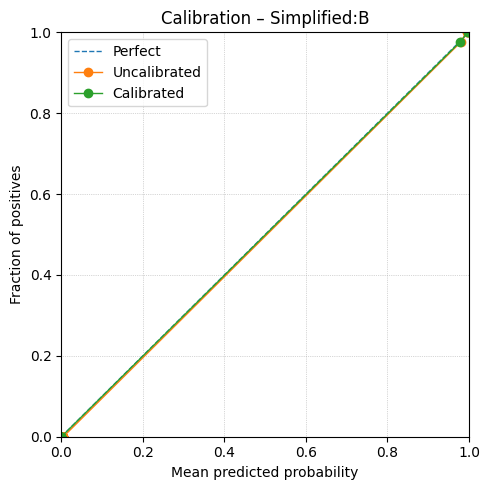

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Triana/Models/Simplified_B/Simplified_B_bundle.joblib

B
               precision    recall  f1-score   support

           0       1.00      1.00      1.00      1946
           1       1.00      1.00      1.00      1946

    accuracy                           1.00      3892
   macro avg       1.00      1.00      1.00      3892
weighted avg       1.00      1.00      1.00      3892


Processing CD4_T (class 2/12)...
Training - Found 8238 / 8238 barcodes
Training - Pos: 4119, Neg: 4119
Training labels: 4119 pos, 4119 neg
Testing  - Found 2290 / 2290 barcodes
Testing  - Pos: 1145, Neg: 1145
Testing labels: 1145 pos, 1145 neg
Calibrating - Found 3926 rows | Pos: 458, Neg: 3468
All test data: 9804 rows, positives for CD4_T: 1145
[scale] CD4_T: train mean ~ 0.000, std ~ 1.000

[NB] training → CD4_T
Fitting 10 folds for each of 10 candidates,

Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.



[KNN] training → CD4_T
Fitting 10 folds for each of 10 candidates, totalling 100 fits

[MLP] training → CD4_T
Fitting 10 folds for each of 10 candidates, totalling 100 fits
[CAL] CD4_T: cal positives=458/3926

Calibration metrics:
   Uncalibrated  |  Brier: 0.0040   LogLoss: 0.0182
     Calibrated  |  Brier: 0.0010   LogLoss: 0.0047


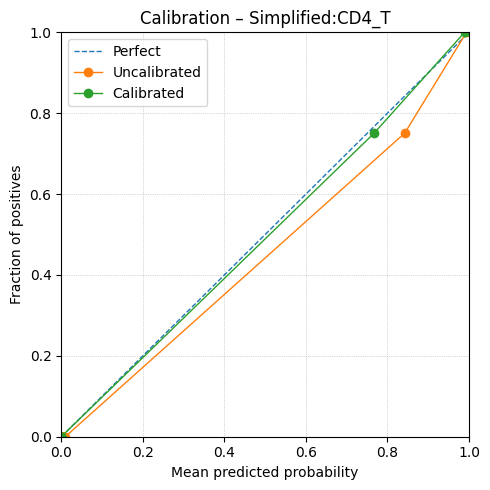

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Triana/Models/Simplified_CD4_T/Simplified_CD4_T_bundle.joblib

CD4_T
               precision    recall  f1-score   support

           0       1.00      1.00      1.00      1145
           1       1.00      1.00      1.00      1145

    accuracy                           1.00      2290
   macro avg       1.00      1.00      1.00      2290
weighted avg       1.00      1.00      1.00      2290


Processing CD8_T (class 3/12)...
Training - Found 11754 / 11754 barcodes
Training - Pos: 5877, Neg: 5877
Training labels: 5877 pos, 5877 neg
Testing  - Found 3266 / 3266 barcodes
Testing  - Pos: 1633, Neg: 1633
Testing labels: 1633 pos, 1633 neg
Calibrating - Found 3926 rows | Pos: 653, Neg: 3273
All test data: 9804 rows, positives for CD8_T: 1633
[scale] CD8_T: train mean ~ 0.000, std ~ 1.000

[NB] training → CD8_T
Fitting 10 folds for each of 

Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.



[KNN] training → CD8_T
Fitting 10 folds for each of 10 candidates, totalling 100 fits

[MLP] training → CD8_T
Fitting 10 folds for each of 10 candidates, totalling 100 fits
[CAL] CD8_T: cal positives=653/3926

Calibration metrics:
   Uncalibrated  |  Brier: 0.0059   LogLoss: 0.0249
     Calibrated  |  Brier: 0.0041   LogLoss: 0.0174


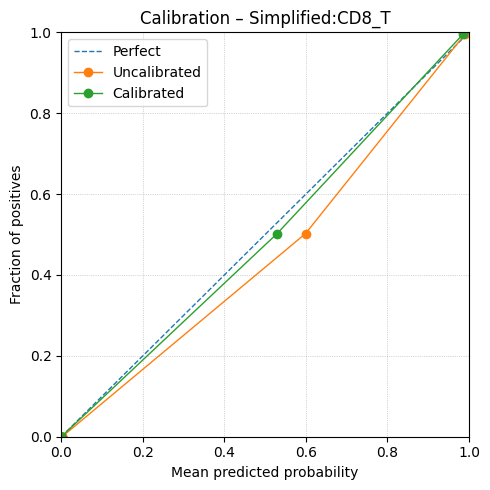

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Triana/Models/Simplified_CD8_T/Simplified_CD8_T_bundle.joblib

CD8_T
               precision    recall  f1-score   support

           0       0.99      0.99      0.99      1633
           1       0.99      0.99      0.99      1633

    accuracy                           0.99      3266
   macro avg       0.99      0.99      0.99      3266
weighted avg       0.99      0.99      0.99      3266


Processing Erythroid (class 4/12)...
Training - Found 2880 / 2880 barcodes
Training - Pos: 1440, Neg: 1440
Training labels: 1440 pos, 1440 neg
Testing  - Found 800 / 800 barcodes
Testing  - Pos: 400, Neg: 400
Testing labels: 400 pos, 400 neg
Calibrating - Found 3926 rows | Pos: 160, Neg: 3766
All test data: 9804 rows, positives for Erythroid: 400
[scale] Erythroid: train mean ~ -0.000, std ~ 1.000

[NB] training → Erythroid
Fitting 10 folds for 

Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.



[KNN] training → Erythroid
Fitting 10 folds for each of 10 candidates, totalling 100 fits

[MLP] training → Erythroid
Fitting 10 folds for each of 10 candidates, totalling 100 fits
[CAL] Erythroid: cal positives=160/3926

Calibration metrics:
   Uncalibrated  |  Brier: 0.0266   LogLoss: 0.1031
     Calibrated  |  Brier: 0.0082   LogLoss: 0.0299


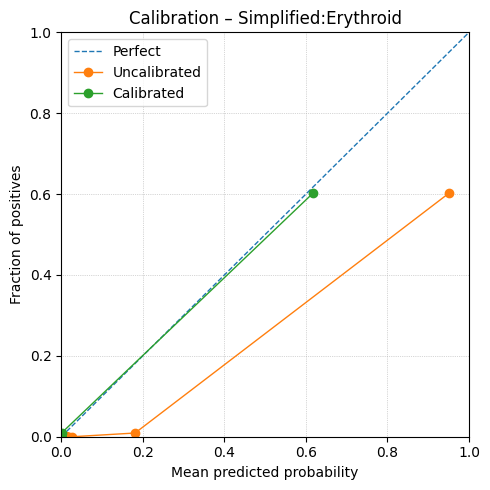

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Triana/Models/Simplified_Erythroid/Simplified_Erythroid_bundle.joblib

Erythroid
               precision    recall  f1-score   support

           0       0.96      0.99      0.98       400
           1       0.99      0.96      0.98       400

    accuracy                           0.98       800
   macro avg       0.98      0.98      0.98       800
weighted avg       0.98      0.98      0.98       800


Processing HSPC (class 5/12)...
Training - Found 11338 / 11338 barcodes
Training - Pos: 5669, Neg: 5669
Training labels: 5669 pos, 5669 neg
Testing  - Found 3146 / 3146 barcodes
Testing  - Pos: 1573, Neg: 1573
Testing labels: 1573 pos, 1573 neg
Calibrating - Found 3926 rows | Pos: 632, Neg: 3294
All test data: 9804 rows, positives for HSPC: 1573
[scale] HSPC: train mean ~ -0.000, std ~ 1.000

[NB] training → HSPC
Fitting 10 folds for

Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.



[KNN] training → HSPC
Fitting 10 folds for each of 10 candidates, totalling 100 fits

[MLP] training → HSPC
Fitting 10 folds for each of 10 candidates, totalling 100 fits
[CAL] HSPC: cal positives=632/3926

Calibration metrics:
   Uncalibrated  |  Brier: 0.0111   LogLoss: 0.0458
     Calibrated  |  Brier: 0.0083   LogLoss: 0.0320


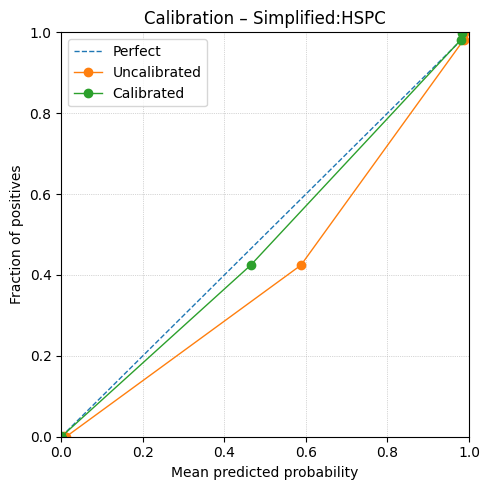

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Triana/Models/Simplified_HSPC/Simplified_HSPC_bundle.joblib

HSPC
               precision    recall  f1-score   support

           0       0.98      0.98      0.98      1573
           1       0.98      0.98      0.98      1573

    accuracy                           0.98      3146
   macro avg       0.98      0.98      0.98      3146
weighted avg       0.98      0.98      0.98      3146


Processing Monocyte (class 6/12)...
Training - Found 7762 / 7762 barcodes
Training - Pos: 3881, Neg: 3881
Training labels: 3881 pos, 3881 neg
Testing  - Found 2156 / 2156 barcodes
Testing  - Pos: 1078, Neg: 1078
Testing labels: 1078 pos, 1078 neg
Calibrating - Found 3926 rows | Pos: 432, Neg: 3494
All test data: 9804 rows, positives for Monocyte: 1078
[scale] Monocyte: train mean ~ -0.000, std ~ 1.000

[NB] training → Monocyte
Fitting 10 folds for 

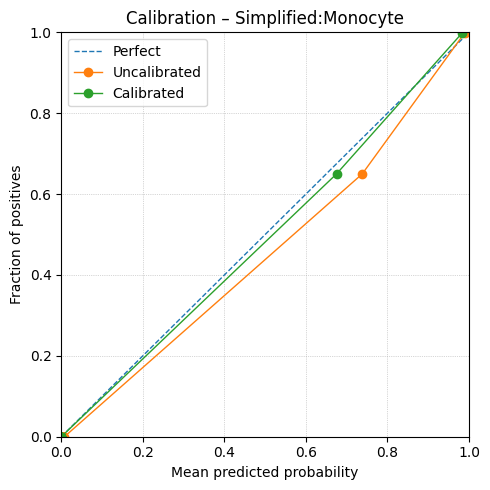

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Triana/Models/Simplified_Monocyte/Simplified_Monocyte_bundle.joblib

Monocyte
               precision    recall  f1-score   support

           0       1.00      0.99      1.00      1078
           1       0.99      1.00      1.00      1078

    accuracy                           1.00      2156
   macro avg       1.00      1.00      1.00      2156
weighted avg       1.00      1.00      1.00      2156


Processing Myeloid (class 7/12)...
Training - Found 1106 / 1106 barcodes
Training - Pos: 553, Neg: 553
Training labels: 553 pos, 553 neg
Testing  - Found 306 / 306 barcodes
Testing  - Pos: 153, Neg: 153
Testing labels: 153 pos, 153 neg
Calibrating - Found 3926 rows | Pos: 61, Neg: 3865
All test data: 9804 rows, positives for Myeloid: 153
[scale] Myeloid: train mean ~ 0.000, std ~ 1.000

[NB] training → Myeloid
Fitting 10 folds for each 

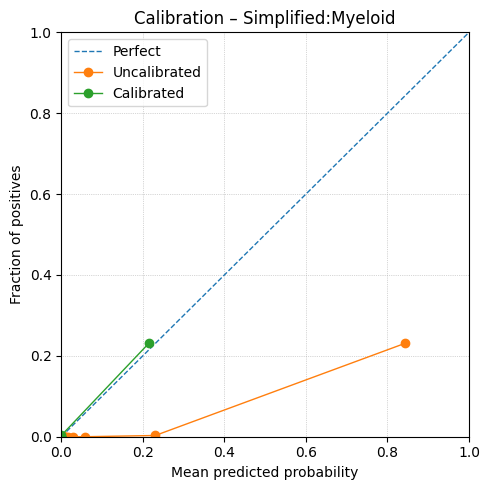

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Triana/Models/Simplified_Myeloid/Simplified_Myeloid_bundle.joblib

Myeloid
               precision    recall  f1-score   support

           0       0.81      0.99      0.89       153
           1       0.98      0.76      0.86       153

    accuracy                           0.88       306
   macro avg       0.90      0.88      0.87       306
weighted avg       0.90      0.88      0.87       306


Processing NK (class 8/12)...
Training - Found 7462 / 7462 barcodes
Training - Pos: 3731, Neg: 3731
Training labels: 3731 pos, 3731 neg
Testing  - Found 2072 / 2072 barcodes
Testing  - Pos: 1036, Neg: 1036
Testing labels: 1036 pos, 1036 neg
Calibrating - Found 3926 rows | Pos: 415, Neg: 3511
All test data: 9804 rows, positives for NK: 1036
[scale] NK: train mean ~ 0.000, std ~ 1.000

[NB] training → NK
Fitting 10 folds for each of 10 candi

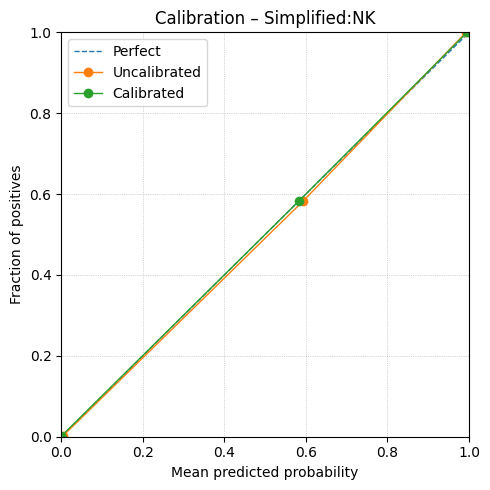

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Triana/Models/Simplified_NK/Simplified_NK_bundle.joblib

NK
               precision    recall  f1-score   support

           0       1.00      1.00      1.00      1036
           1       1.00      1.00      1.00      1036

    accuracy                           1.00      2072
   macro avg       1.00      1.00      1.00      2072
weighted avg       1.00      1.00      1.00      2072


Processing Other_T (class 9/12)...
Training - Found 1502 / 1502 barcodes
Training - Pos: 751, Neg: 751
Training labels: 751 pos, 751 neg
Testing  - Found 416 / 416 barcodes
Testing  - Pos: 208, Neg: 208
Testing labels: 208 pos, 208 neg
Calibrating - Found 3926 rows | Pos: 83, Neg: 3843
All test data: 9804 rows, positives for Other_T: 208
[scale] Other_T: train mean ~ 0.000, std ~ 1.000

[NB] training → Other_T
Fitting 10 folds for each of 10 candidates, 

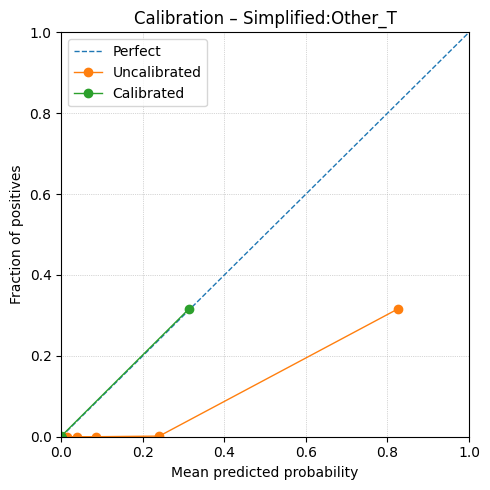

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Triana/Models/Simplified_Other_T/Simplified_Other_T_bundle.joblib

Other_T
               precision    recall  f1-score   support

           0       0.95      1.00      0.97       208
           1       1.00      0.94      0.97       208

    accuracy                           0.97       416
   macro avg       0.97      0.97      0.97       416
weighted avg       0.97      0.97      0.97       416


Processing Plasma (class 10/12)...
Training - Found 702 / 702 barcodes
Training - Pos: 351, Neg: 351
Training labels: 351 pos, 351 neg
Testing  - Found 194 / 194 barcodes
Testing  - Pos: 97, Neg: 97
Testing labels: 97 pos, 97 neg
Calibrating - Found 3926 rows | Pos: 39, Neg: 3887
All test data: 9804 rows, positives for Plasma: 97
[scale] Plasma: train mean ~ 0.000, std ~ 1.000

[NB] training → Plasma
Fitting 10 folds for each of 10 candida

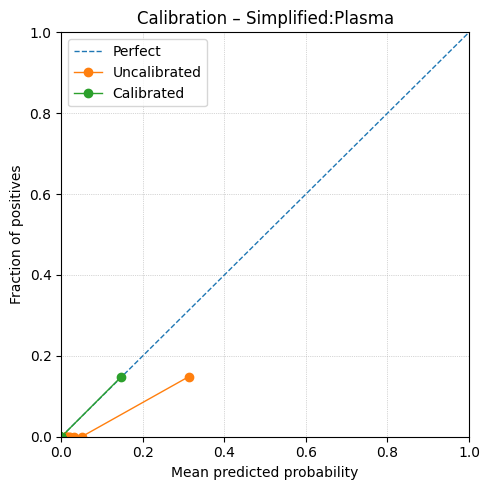

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Triana/Models/Simplified_Plasma/Simplified_Plasma_bundle.joblib

Plasma
               precision    recall  f1-score   support

           0       0.99      1.00      0.99        97
           1       1.00      0.99      0.99        97

    accuracy                           0.99       194
   macro avg       0.99      0.99      0.99       194
weighted avg       0.99      0.99      0.99       194


Processing cDC (class 11/12)...
Training - Found 2482 / 2482 barcodes
Training - Pos: 1241, Neg: 1241
Training labels: 1241 pos, 1241 neg
Testing  - Found 690 / 690 barcodes
Testing  - Pos: 345, Neg: 345
Testing labels: 345 pos, 345 neg
Calibrating - Found 3926 rows | Pos: 138, Neg: 3788
All test data: 9804 rows, positives for cDC: 345
[scale] cDC: train mean ~ -0.000, std ~ 1.000

[NB] training → cDC
Fitting 10 folds for each of 10 candidate

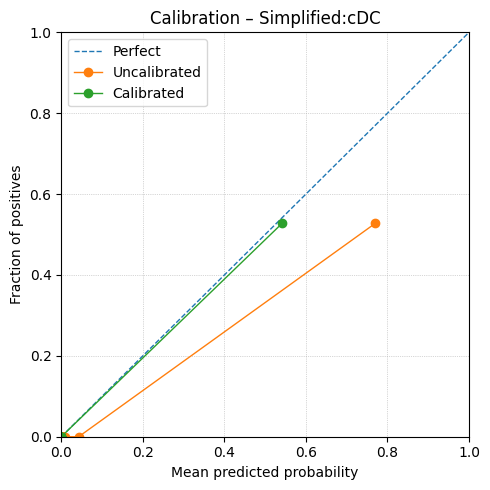

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Triana/Models/Simplified_cDC/Simplified_cDC_bundle.joblib

cDC
               precision    recall  f1-score   support

           0       0.98      0.99      0.99       345
           1       0.99      0.98      0.99       345

    accuracy                           0.99       690
   macro avg       0.99      0.99      0.99       690
weighted avg       0.99      0.99      0.99       690


Processing pDC (class 12/12)...
Training - Found 1368 / 1368 barcodes
Training - Pos: 684, Neg: 684
Training labels: 684 pos, 684 neg
Testing  - Found 380 / 380 barcodes
Testing  - Pos: 190, Neg: 190
Testing labels: 190 pos, 190 neg
Calibrating - Found 3926 rows | Pos: 76, Neg: 3850
All test data: 9804 rows, positives for pDC: 190
[scale] pDC: train mean ~ 0.000, std ~ 1.000

[NB] training → pDC
Fitting 10 folds for each of 10 candidates, totalling 10

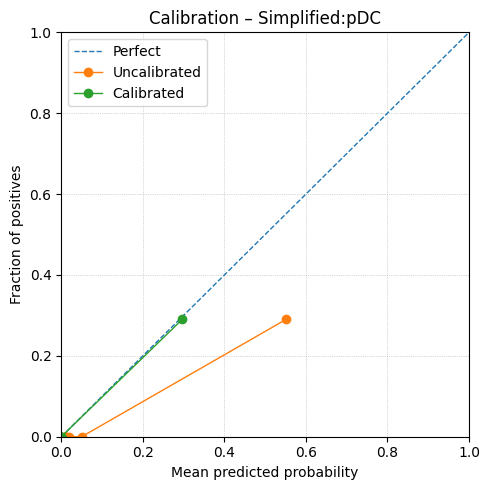

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Triana/Models/Simplified_pDC/Simplified_pDC_bundle.joblib

pDC
               precision    recall  f1-score   support

           0       0.96      0.99      0.98       190
           1       0.99      0.96      0.98       190

    accuracy                           0.98       380
   macro avg       0.98      0.98      0.98       380
weighted avg       0.98      0.98      0.98       380


Fitting multiclass TemperatureScaling on CAL split...

Preview of probabilities BEFORE (raw OvR) vs AFTER (multiclass TS):
                          raw_B  raw_CD4_T     raw_CD8_T  raw_Erythroid  raw_HSPC  raw_Monocyte   raw_Myeloid    raw_NK   raw_Other_T  raw_Plasma       raw_cDC       raw_pDC      mc_B      mc_CD4_T      mc_CD8_T  mc_Erythroid   mc_HSPC   mc_Monocyte    mc_Myeloid     mc_NK    mc_Other_T  mc_Plasma        mc_cDC        mc_pDC true_

In [134]:
# -*- coding: utf-8 -*-
from pathlib import Path
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.ensemble import StackingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.calibration import CalibratedClassifierCV
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report, confusion_matrix

from netcal.scaling import TemperatureScaling
import joblib

# ------------------------------------------------------------------- CONFIG (expects these to already exist)
#   models_output, train_barcodes_path, test_barcodes_path
#   Triana_data_Train, Triana_data_Test, Triana_data_Cal          (DataFrames indexed by barcode)
#   Triana_dataset_Train, Triana_dataset_Test, Triana_dataset_Cal (AnnData with obs labels)
#   TotalSeqD_Heme_Oncology_CAT399906                    (iterable of feature names)
#   MLTraining module with: CV, train_NB, train_XGB, train_KNN, train_MLP,
#                           plot_calibration_curve, save_models, evaluate_classifier, append_metrics_csv

name_target_class = "Simplified"   # "simplified" | "Simplified" | "Detailed"
fig_root   = Path(models_output) / "Figures"
models_dir = Path(models_output) / "Models"
fig_root.mkdir(parents=True, exist_ok=True)
models_dir.mkdir(parents=True, exist_ok=True)

kf         = MLTraining.CV
num_cores  = -1
metrics_log = []

# ============================= HELPERS =============================

def _norm_feats(names) -> pd.Index:
    """
    Normalizer used ONLY to construct matching keys.
    Panel names remain untouched; data columns are normalized and then mapped BACK
    to the exact panel names via a lookup.
    """
    s = pd.Index(map(str, names))
    s = (s.str.strip()
           .str.lower()
           .str.replace(r"[ _/]+", "-", regex=True)
           .str.replace(r"-+", "-", regex=True)
           .str.strip("-"))
    return s

def attach_celltype(df: pd.DataFrame, ad: "AnnData", field: str) -> pd.DataFrame:
    if field not in ad.obs:
        raise KeyError(f"'{field}' not found in AnnData.obs")
    lab = (ad.obs[field]
             .astype("string")
             .str.strip()
             .str.replace(r"\s+", "_", regex=True))
    out = df.copy()
    out["Celltype"] = pd.Categorical(lab.reindex(out.index))
    if out["Celltype"].isna().any():
        missing = int(out["Celltype"].isna().sum())
        print(f"[WARN] {missing} rows got NaN Celltype after reindex; check barcode alignment.")
    return out

def _check_finite(df: pd.DataFrame, tag: str):
    arr = df.to_numpy()
    if not np.isfinite(arr).all():
        bad = np.where(~np.isfinite(arr))
        raise ValueError(f"Non-finite values found in {tag} features at positions {bad}")

def _unwrap_estimator(m):
    return getattr(m, "estimator", None) or getattr(m, "base_estimator", None) or m

def _assert_feature_counts(cell_name: str, models_dict: dict, expected: int):
    pairs = [
        ("NB",  models_dict.get("NB")),
        ("XGB", models_dict.get("XGB")),
        ("KNN", models_dict.get("KNN")),
        ("MLP", models_dict.get("MLP")),
        ("Stacker", models_dict.get("Stacker")),
    ]
    for name, est in pairs:
        if est is None:
            continue
        base = _unwrap_estimator(est)
        nfi = getattr(base, "n_features_in_", None)
        if nfi is not None and nfi != expected:
            raise RuntimeError(f"{cell_name}:{name} saw {nfi} features; expected {expected}")

# ============================= LABEL ATTACH =============================

consensus_field = f"Consensus_annotation_{name_target_class.lower()}_final"

Triana_data_Train = attach_celltype(Triana_data_Train, Triana_dataset_Train, consensus_field)
Triana_data_Test  = attach_celltype(Triana_data_Test,  Triana_dataset_Test,  consensus_field)
Triana_data_Cal   = attach_celltype(Triana_data_Cal,   Triana_dataset_Cal,   consensus_field)

# ============================= PANEL & DATA COLUMN ALIGNMENT =============================

# Keep the panel EXACTLY as provided
panel = pd.Index(map(str, TotalSeqD_Heme_Oncology_CAT399906))

# Build a mapping: normalized_key -> exact panel name
panel_keys    = _norm_feats(panel)
norm_to_panel = dict(zip(panel_keys, panel))
if len(norm_to_panel) != len(panel):
    raise ValueError("Panel contains names that collide after normalization. Consider adjusting _norm_feats rules.")

def _rename_data_to_panel(df: pd.DataFrame) -> pd.DataFrame:
    """
    Rename only feature columns so that after normalization they map
    back to the exact panel column names. Keeps 'cell_barcode' and 'Celltype' intact.
    """
    df = df.copy()
    non_feat = [c for c in ["cell_barcode", "Celltype"] if c in df.columns]
    feat     = pd.Index([c for c in df.columns if c not in non_feat])

    feat_keys   = _norm_feats(feat)
    mapped      = [norm_to_panel.get(k) for k in feat_keys]  # None if not in panel
    rename_map  = {old: new for old, new in zip(feat, mapped) if new is not None}

    # Handle duplicate mappings (two data columns → same panel col). Keep first, drop the rest.
    seen, safe_map, drops = set(), {}, []
    for old, new in rename_map.items():
        if new in seen:
            drops.append(old)
        else:
            seen.add(new); safe_map[old] = new

    if drops:
        print(f"[WARN] Dropping {len(drops)} duplicated-mapped columns (showing up to 5): {drops[:5]}")

    if drops:
        df.drop(columns=drops, inplace=True, errors="ignore")
    df.rename(columns=safe_map, inplace=True)

    matched = len(safe_map)
    print(f"[map] matched {matched}/{len(feat)} data columns to panel")
    return df

# Apply: normalize/rename ONLY data splits (panel remains untouched)
Triana_data_Train = _rename_data_to_panel(Triana_data_Train)
Triana_data_Test  = _rename_data_to_panel(Triana_data_Test)
Triana_data_Cal   = _rename_data_to_panel(Triana_data_Cal)

# Intersect each split with the panel IN PANEL ORDER
def _panel_intersection(df: pd.DataFrame) -> pd.DataFrame:
    non_feat = [c for c in ["cell_barcode", "Celltype"] if c in df.columns]
    feat_cols = pd.Index([c for c in df.columns if c not in non_feat])
    inter = panel.intersection(feat_cols, sort=False)
    if inter.empty:
        raise ValueError("Panel/Data intersection is empty after renaming. Check mapping rules.")
    return df.reindex(columns=list(inter) + non_feat)

Triana_data_Train = _panel_intersection(Triana_data_Train)
Triana_data_Test  = _panel_intersection(Triana_data_Test)
Triana_data_Cal   = _panel_intersection(Triana_data_Cal)

# ============================= FEATURES & LABELS =============================

Triana_data_Cal_lbl = Triana_data_Cal[["Celltype"]].copy()

drop_cols_train = [c for c in ["cell_barcode", "Celltype"] if c in Triana_data_Train.columns]
drop_cols_test  = [c for c in ["cell_barcode", "Celltype"] if c in Triana_data_Test.columns]
drop_cols_cal   = [c for c in ["cell_barcode", "Celltype"] if c in Triana_data_Cal.columns]

Triana_data_Train_Sub = Triana_data_Train.drop(columns=drop_cols_train, errors="ignore")
Triana_data_Test_Sub  = Triana_data_Test.drop(columns=drop_cols_test,  errors="ignore")
Triana_data_Cal_Sub   = Triana_data_Cal.drop(columns=drop_cols_cal,    errors="ignore")

# SAFETY: shared columns & finiteness checks
cols_train = list(Triana_data_Train_Sub.columns)
if list(Triana_data_Test_Sub.columns) != cols_train or list(Triana_data_Cal_Sub.columns) != cols_train:
    raise ValueError("Train/Cal/Test feature columns differ after panel intersection!")

_check_finite(Triana_data_Train_Sub, "TRAIN")
_check_finite(Triana_data_Test_Sub,  "TEST")
_check_finite(Triana_data_Cal_Sub,   "CAL")

print(f"\n[features] Using {len(cols_train)} panel-intersected features (exact panel names):")
print(cols_train)

# Consistent class order
class_names  = sorted(pd.Series(Triana_data_Train["Celltype"]).dropna().unique())
K            = len(class_names)
class_to_idx = {c: i for i, c in enumerate(class_names)}

# Multiclass labels arrays
s_cal = Triana_data_Cal_lbl["Celltype"].map(class_to_idx)
if s_cal.isna().any():
    missing = Triana_data_Cal_lbl.loc[s_cal.isna(), "Celltype"].unique()
    raise ValueError(f"Unknown labels in CAL split: {missing}")
y_cal_multiclass = s_cal.to_numpy(dtype=np.int64)

s_te = Triana_data_Test["Celltype"].map(class_to_idx)
if s_te.isna().any():
    missing = Triana_data_Test.loc[s_te.isna(), "Celltype"].unique()
    raise ValueError(f"Unknown labels in TEST split: {missing}")
y_test_multiclass = s_te.to_numpy(dtype=np.int64)

# Reuse across classes
X_cal_all_df = Triana_data_Cal_Sub.copy()
X_te_all_df  = Triana_data_Test_Sub.copy()

# Preallocate OvR prob mats
P_cal = np.zeros((X_cal_all_df.shape[0], K), dtype=float)
P_te  = np.zeros((X_te_all_df.shape[0],  K), dtype=float)

test_index = Triana_data_Test_Sub.index

# ============================= TRAIN PER-CLASS OVR =============================

for celltype in class_names:
    k = class_to_idx[celltype]
    name = str(celltype).replace(" ", "_")
    print(f"\nProcessing {name} (class {k+1}/{K})...")

    # ---- TRAIN slice via barcode lists
    train_barcodes_df = pd.read_csv(
        f"{train_barcodes_path}/Triana/Consensus_annotation_simplified_final/Barcodes_training_class_{name}.csv",
        index_col=0
    )
    train_positive_barcodes = train_barcodes_df["Positive"].dropna().values
    train_negative_barcodes = train_barcodes_df["Negative"].dropna().values
    all_train_barcodes = np.concatenate([train_positive_barcodes, train_negative_barcodes])

    train_mask = Triana_data_Train_Sub.index.isin(all_train_barcodes)
    X_tr_df = Triana_data_Train_Sub.loc[train_mask]
    found_train_barcodes = X_tr_df.index.values
    y_tr = np.isin(found_train_barcodes, train_positive_barcodes).astype(int)

    # ---- Skip guards
    if X_tr_df.empty or np.unique(y_tr).size < 2:
        print(f"[SKIP] {name}: empty or single-class train slice (pos={y_tr.sum()}, neg={(len(y_tr)-y_tr.sum())}).")
        continue

    # ---- TEST slice via barcode lists
    test_barcodes_df = pd.read_csv(
        f"{test_barcodes_path}/Triana/Consensus_annotation_simplified_final/Barcodes_testing_class_{name}.csv",
        index_col=0
    )
    test_positive_barcodes = test_barcodes_df["Positive"].dropna().values
    test_negative_barcodes = test_barcodes_df["Negative"].dropna().values
    all_test_barcodes = np.concatenate([test_positive_barcodes, test_negative_barcodes])

    test_mask = Triana_data_Test_Sub.index.isin(all_test_barcodes)
    X_te_df = Triana_data_Test_Sub.loc[test_mask]
    found_test_barcodes = X_te_df.index.values
    y_te = np.isin(found_test_barcodes, test_positive_barcodes).astype(int)

    # ---- Full-test & cal for this binary head
    X_te_all_local = X_te_all_df.copy()
    y_te_all = (Triana_data_Test["Celltype"].values == celltype).astype(int)
    X_cal_df = X_cal_all_df.copy()
    y_cal_bin = (Triana_data_Cal_lbl["Celltype"].values == celltype).astype(int)

    # ---- Info
    print(f"Training - Found {X_tr_df.shape[0]} / {len(all_train_barcodes)} barcodes")
    print(f"Training - Pos: {len(train_positive_barcodes)}, Neg: {len(train_negative_barcodes)}")
    print(f"Training labels: {y_tr.sum()} pos, {len(y_tr)-y_tr.sum()} neg")
    print(f"Testing  - Found {X_te_df.shape[0]} / {len(all_test_barcodes)} barcodes")
    print(f"Testing  - Pos: {len(test_positive_barcodes)}, Neg: {len(test_negative_barcodes)}")
    print(f"Testing labels: {y_te.sum()} pos, {len(y_te)-y_te.sum()} neg")
    print(f"Calibrating - Found {X_cal_df.shape[0]} rows | Pos: {y_cal_bin.sum()}, Neg: {len(y_cal_bin)-y_cal_bin.sum()}")
    print(f"All test data: {X_te_all_local.shape[0]} rows, positives for {celltype}: {y_te_all.sum()}")

    # ---- Scaling (fit on per-head TRAIN slice; transform others)
    scaler = StandardScaler(with_mean=True, with_std=True).fit(X_tr_df.values)

    def _sc(df):
        return pd.DataFrame(
            scaler.transform(df.values),
            index=df.index,
            columns=cols_train,
        )

    X_tr_sc_df     = _sc(X_tr_df)
    X_te_sc_df     = _sc(X_te_df)
    X_te_all_sc_df = _sc(X_te_all_local)
    X_cal_sc_df    = _sc(X_cal_df)

    print(f"[scale] {name}: train mean ~ {X_tr_sc_df.values.mean():.3f}, std ~ {X_tr_sc_df.values.std():.3f}")

    # ---- Base learners
    NB_model  = MLTraining.train_NB (X_tr_sc_df, y_tr, cv=kf, num_cores=num_cores, name_target_subclass=name)
    XGB_model = MLTraining.train_XGB(X_tr_sc_df, y_tr, cv=kf, num_cores=num_cores, name_target_subclass=name)
    KNN_model = MLTraining.train_KNN(X_tr_sc_df, y_tr, cv=kf, num_cores=num_cores, name_target_subclass=name)
    MLP_model = MLTraining.train_MLP(X_tr_sc_df, y_tr, cv=kf, num_cores=num_cores, name_target_subclass=name)

    # ---- Stacker (raw)
    stacker_raw = StackingClassifier(
        estimators=[("NB", NB_model), ("XGB", XGB_model), ("KNN", KNN_model), ("MLP", MLP_model)],
        final_estimator=LogisticRegression(max_iter=2000, class_weight="balanced", random_state=42),
        stack_method="predict_proba",
        cv=kf,
        n_jobs=-1,
    ).fit(X_tr_sc_df, y_tr)

    # ---- Feature count asserts (debug safety)
    expected_feats = len(cols_train)
    _assert_feature_counts(name, {
        "NB": NB_model, "XGB": XGB_model, "KNN": KNN_model, "MLP": MLP_model, "Stacker": stacker_raw
    }, expected_feats)

    # ---- Binary calibration (Platt, guarded)
    pos_cal    = int(y_cal_bin.sum())
    n_cal_bin  = int(len(y_cal_bin))
    has_both   = (0 < pos_cal < n_cal_bin)
    print(f"[CAL] {name}: cal positives={pos_cal}/{n_cal_bin}")

    if has_both:
        try:
            calibrator = CalibratedClassifierCV(estimator=stacker_raw, method="sigmoid", cv="prefit")
        except TypeError:  # older sklearn
            calibrator = CalibratedClassifierCV(base_estimator=stacker_raw, method="sigmoid", cv="prefit")
        stacker = calibrator.fit(X_cal_sc_df, y_cal_bin)
    else:
        print(f"[WARN] Skipping calibration for {name}: single-class cal set.")
        stacker = stacker_raw

    # ---- Calibration plot on all-test (optional)
    try:
        y_proba_uncal = stacker_raw.predict_proba(X_te_all_sc_df)[:, 1]
        y_proba_cal   = stacker.predict_proba(X_te_all_sc_df)[:, 1]
        if has_both:
            _ = MLTraining.plot_calibration_curve(
                y_te_all, [y_proba_uncal, y_proba_cal],
                clf_names=["Uncalibrated", "Calibrated"],
                n_bins=15, strategy="quantile",
                title=f"Calibration – {name_target_class}:{name}"
            )
        else:
            _ = MLTraining.plot_calibration_curve(
                y_te_all, [y_proba_uncal],
                clf_names=["Uncalibrated"],
                n_bins=15, strategy="quantile",
                title=f"Calibration (uncal only) – {name_target_class}:{name}"
            )
        plt.tight_layout()
        plt.show()
    except Exception as e:
        print(f"[WARN] Skipped calibration plot for {name}: {e}")

    # ---- Save per-class bundle (model + scaler + columns)
    save_subdir = models_dir / f"{name_target_class}_{name}"
    save_subdir.mkdir(parents=True, exist_ok=True)

    MLTraining.save_models({"Stacked": stacker}, out_dir=save_subdir, tag=f"{name_target_class}_{name}")
    joblib.dump(cols_train, save_subdir / "feature_names.joblib")

    bundle = {
        "atlas": "Triana",
        "depth": name_target_class,
        "label": celltype,
        "model": stacker,          # CalibratedClassifierCV(StackingClassifier) or StackingClassifier
        "columns": cols_train,     # exact panel names, panel order
        "scaler": scaler,          # per-head scaler
        "panel_name": "TotalSeqD_Heme_Oncology_CAT399906",
    }
    bundle_path = save_subdir / f"{name_target_class}_{name}_bundle.joblib"
    joblib.dump(bundle, bundle_path)
    print(f"[SAVE] Wrote bundle with columns+scaler to {bundle_path}")

    # ---- Binary metrics on the class-specific test slice
    try:
        m = MLTraining.evaluate_classifier(stacker, X_te_sc_df, y_te, plot_cm=False)
        m.update(celltype=celltype)
        metrics_log.append(m)
        print(f"\n{celltype}\n", m.get("report", ""))
    except Exception as e:
        print(f"[WARN] Binary metrics for {name} skipped: {e}")

    # ---- Store OvR probs for multiclass calibration
    P_cal[:, k] = stacker.predict_proba(X_cal_sc_df)[:, 1]
    P_te[:,  k] = stacker.predict_proba(X_te_all_sc_df)[:, 1]

# ============================= MULTICLASS CALIBRATION =============================

print("\nFitting multiclass TemperatureScaling on CAL split...")

# Guards: ensure probs are in [0,1]
if (P_cal < 0).any() or (P_cal > 1).any():
    raise ValueError("P_cal must be probabilities in [0,1].")
if (P_te < 0).any() or (P_te > 1).any():
    raise ValueError("P_te must be probabilities in [0,1].")

ts_cal = TemperatureScaling()
ts_cal.fit(P_cal, y_cal_multiclass)
P_te_mc = ts_cal.transform(P_te)

# Ensure calibrated probs shape (K)
P_te_mc = np.asarray(P_te_mc)
if P_te_mc.ndim == 1:
    P_te_mc = P_te_mc.reshape(-1, 1)
if P_te_mc.shape[1] == 1 and K == 2:
    P_te_mc = np.hstack([1.0 - P_te_mc, P_te_mc])
elif P_te_mc.shape[1] != K:
    # Fallback: normalize OvR sums
    row_sums = P_te.sum(axis=1, keepdims=True)
    row_sums[row_sums == 0.0] = 1.0
    P_te_mc = P_te / row_sums
    print(f"[WARN] TemperatureScaling returned shape {P_te_mc.shape}; fell back to sum-normalized OvR probs.")

# Persist multiclass temp scaler + class names
joblib.dump(ts_cal, models_dir / f"{name_target_class}_multiclass_temp_scaler.joblib")
(pd.Series(class_names, name="class_name")
   .to_csv(models_dir / f"{name_target_class}_class_names.csv", index=False))

# ============================= PROBS COMPARISON & METRICS =============================

probs_raw_df = pd.DataFrame(P_te,    index=test_index, columns=[f"raw_{c}" for c in class_names])
probs_mc_df  = pd.DataFrame(P_te_mc, index=test_index, columns=[f"mc_{c}"  for c in class_names])

probs_compare = pd.concat([probs_raw_df, probs_mc_df], axis=1)
probs_compare["true_label"]    = Triana_data_Test["Celltype"].values
probs_compare["pred_raw"]      = P_te.argmax(axis=1)
probs_compare["pred_mc"]       = P_te_mc.argmax(axis=1)
probs_compare["pred_raw_name"] = [class_names[i] for i in probs_compare["pred_raw"].values]
probs_compare["pred_mc_name"]  = [class_names[i] for i in probs_compare["pred_mc"].values]

print("\nPreview of probabilities BEFORE (raw OvR) vs AFTER (multiclass TS):")
print(probs_compare.head(10).to_string())

probs_compare_path = models_dir / f"{name_target_class}_probabilities_before_after_TEST.csv"
probs_compare.to_csv(probs_compare_path, index=True)
print(f"\nSaved probabilities comparison to: {probs_compare_path}")

# Multiclass evaluation
y_pred_mc = P_te_mc.argmax(axis=1)
print("\nMulticlass classification report (TEST):")
print(classification_report(y_test_multiclass, y_pred_mc, target_names=class_names, digits=3))

cm = confusion_matrix(y_test_multiclass, y_pred_mc, labels=range(K))
print("Confusion matrix (rows=true, cols=pred):\n", cm)

# Per-class binary head metrics CSV
metrics_df = pd.DataFrame.from_records(metrics_log)
MLTraining.append_metrics_csv(metrics_df, csv_path=Path(models_output) / "stacker_metrics.csv")

print("\nDone.")


#### Detailed annotation

[map] matched 31/31 data columns to panel
[map] matched 31/31 data columns to panel
[map] matched 31/31 data columns to panel

[features] Using 31 panel-intersected features (exact panel names):
['CD10', 'CD117', 'CD11b', 'CD11c', 'CD123', 'CD13', 'CD14', 'CD141', 'CD16', 'CD163', 'CD19', 'CD1c', 'CD2', 'CD25', 'CD3', 'CD30', 'CD33', 'CD34', 'CD38', 'CD4', 'CD45', 'CD45RA', 'CD49d', 'CD5', 'CD56', 'CD62L', 'CD69', 'CD7', 'CD8', 'CD83', 'CD90']
[classes] Included (30): ['B_Memory', 'B_Naive', 'CD14_Mono', 'CD16_Mono', 'CD4_CTL', 'CD4_T_Memory', 'CD4_T_Naive', 'CD8_T_Memory', 'CD8_T_Naive', 'EoBaMaP', 'ErP', 'Erythroblast', 'GMP', 'HSC_MPP', 'Immature_B', 'MAIT', 'MEP', 'MkP', 'Myeloid_progenitor', 'NK_CD56_bright', 'NK_CD56_dim', 'Plasma', 'Pre-B', 'Pre-Pro-B', 'Pro-B', 'Treg', 'cDC1', 'cDC2', 'gdT', 'pDC']

Processing B_Memory (class 1/30)...
Training - Found 5912 / 5912 barcodes
Training - Pos: 2956, Neg: 2956
Training labels: 2956 pos, 2956 neg
Testing  - Found 1642 / 1642 barcodes
T

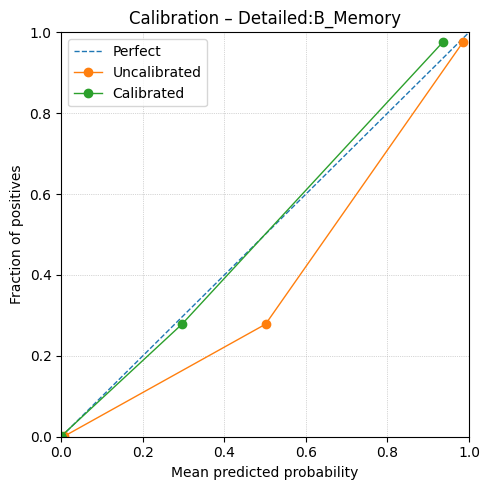

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Triana/Models/Detailed_B_Memory/Detailed_B_Memory_bundle.joblib

B_Memory
               precision    recall  f1-score   support

           0       0.97      1.00      0.98       821
           1       0.99      0.97      0.98       821

    accuracy                           0.98      1642
   macro avg       0.98      0.98      0.98      1642
weighted avg       0.98      0.98      0.98      1642


Processing B_Naive (class 2/30)...
Training - Found 6112 / 6112 barcodes
Training - Pos: 3056, Neg: 3056
Training labels: 3056 pos, 3056 neg
Testing  - Found 1698 / 1698 barcodes
Testing  - Pos: 849, Neg: 849
Testing  - labels: 849 pos, 849 neg
Calibrating - Found 3926 rows | Pos: 340, Neg: 3586
All test data: 9804 rows, positives for B_Naive: 849
[scale] B_Naive: train mean ~ -0.000, std ~ 1.000

[NB] training → B_Naive
Fitting 10 folds fo

Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.



[KNN] training → B_Naive
Fitting 10 folds for each of 10 candidates, totalling 100 fits

[MLP] training → B_Naive
Fitting 10 folds for each of 10 candidates, totalling 100 fits
[CAL] B_Naive: cal positives=340/3926

Calibration metrics:
   Uncalibrated  |  Brier: 0.0173   LogLoss: 0.0620
     Calibrated  |  Brier: 0.0081   LogLoss: 0.0304


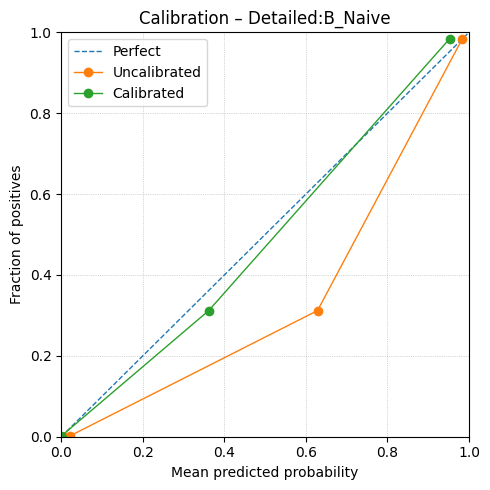

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Triana/Models/Detailed_B_Naive/Detailed_B_Naive_bundle.joblib

B_Naive
               precision    recall  f1-score   support

           0       0.97      0.99      0.98       849
           1       0.99      0.97      0.98       849

    accuracy                           0.98      1698
   macro avg       0.98      0.98      0.98      1698
weighted avg       0.98      0.98      0.98      1698


Processing CD14_Mono (class 3/30)...
Training - Found 6278 / 6278 barcodes
Training - Pos: 3139, Neg: 3139
Training labels: 3139 pos, 3139 neg
Testing  - Found 1744 / 1744 barcodes
Testing  - Pos: 872, Neg: 872
Testing  - labels: 872 pos, 872 neg
Calibrating - Found 3926 rows | Pos: 349, Neg: 3577
All test data: 9804 rows, positives for CD14_Mono: 872
[scale] CD14_Mono: train mean ~ -0.000, std ~ 1.000

[NB] training → CD14_Mono
Fitting 10 fol

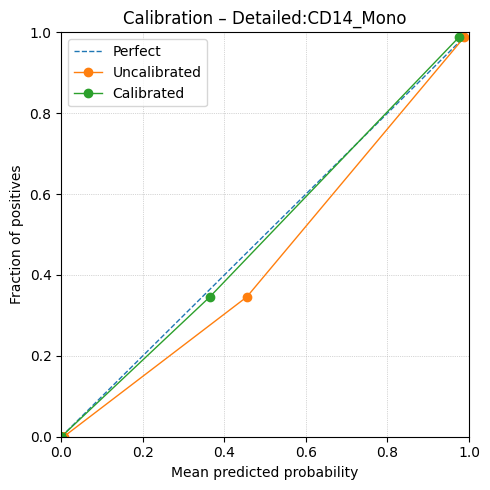

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Triana/Models/Detailed_CD14_Mono/Detailed_CD14_Mono_bundle.joblib

CD14_Mono
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       872
           1       1.00      1.00      1.00       872

    accuracy                           1.00      1744
   macro avg       1.00      1.00      1.00      1744
weighted avg       1.00      1.00      1.00      1744


Processing CD16_Mono (class 4/30)...
Training - Found 1484 / 1484 barcodes
Training - Pos: 742, Neg: 742
Training labels: 742 pos, 742 neg
Testing  - Found 412 / 412 barcodes
Testing  - Pos: 206, Neg: 206
Testing  - labels: 206 pos, 206 neg
Calibrating - Found 3926 rows | Pos: 83, Neg: 3843
All test data: 9804 rows, positives for CD16_Mono: 206
[scale] CD16_Mono: train mean ~ 0.000, std ~ 1.000

[NB] training → CD16_Mono
Fitting 10 folds

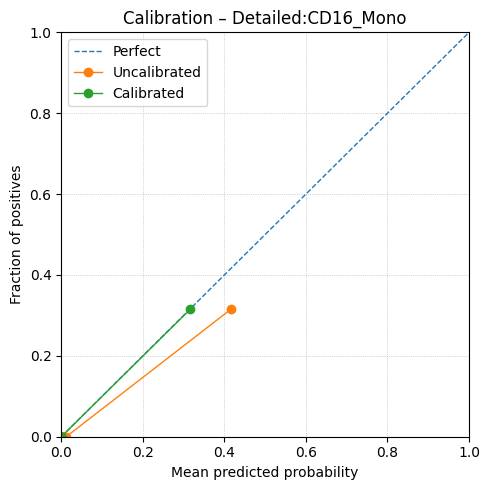

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Triana/Models/Detailed_CD16_Mono/Detailed_CD16_Mono_bundle.joblib

CD16_Mono
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       206
           1       1.00      1.00      1.00       206

    accuracy                           1.00       412
   macro avg       1.00      1.00      1.00       412
weighted avg       1.00      1.00      1.00       412


Processing CD4_CTL (class 5/30)...
Training - Found 714 / 714 barcodes
Training - Pos: 357, Neg: 357
Training labels: 357 pos, 357 neg
Testing  - Found 198 / 198 barcodes
Testing  - Pos: 99, Neg: 99
Testing  - labels: 99 pos, 99 neg
Calibrating - Found 3926 rows | Pos: 40, Neg: 3886
All test data: 9804 rows, positives for CD4_CTL: 99
[scale] CD4_CTL: train mean ~ -0.000, std ~ 1.000

[NB] training → CD4_CTL
Fitting 10 folds for each of 1

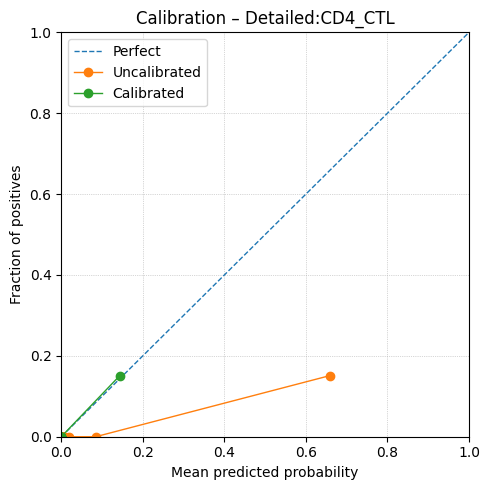

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Triana/Models/Detailed_CD4_CTL/Detailed_CD4_CTL_bundle.joblib

CD4_CTL
               precision    recall  f1-score   support

           0       0.93      1.00      0.96        99
           1       1.00      0.92      0.96        99

    accuracy                           0.96       198
   macro avg       0.96      0.96      0.96       198
weighted avg       0.96      0.96      0.96       198


Processing CD4_T_Memory (class 6/30)...
Training - Found 5716 / 5716 barcodes
Training - Pos: 2858, Neg: 2858
Training labels: 2858 pos, 2858 neg
Testing  - Found 1588 / 1588 barcodes
Testing  - Pos: 794, Neg: 794
Testing  - labels: 794 pos, 794 neg
Calibrating - Found 3926 rows | Pos: 318, Neg: 3608
All test data: 9804 rows, positives for CD4_T_Memory: 794
[scale] CD4_T_Memory: train mean ~ 0.000, std ~ 1.000

[NB] training → CD4_T_Memory
Fit

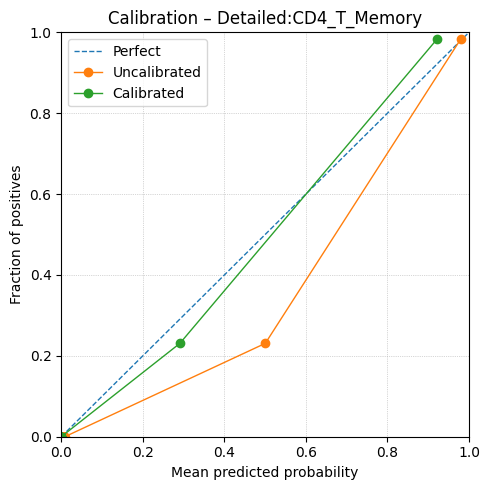

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Triana/Models/Detailed_CD4_T_Memory/Detailed_CD4_T_Memory_bundle.joblib

CD4_T_Memory
               precision    recall  f1-score   support

           0       0.99      0.99      0.99       794
           1       0.99      0.99      0.99       794

    accuracy                           0.99      1588
   macro avg       0.99      0.99      0.99      1588
weighted avg       0.99      0.99      0.99      1588


Processing CD4_T_Naive (class 7/30)...
Training - Found 1602 / 1602 barcodes
Training - Pos: 801, Neg: 801
Training labels: 801 pos, 801 neg
Testing  - Found 446 / 446 barcodes
Testing  - Pos: 223, Neg: 223
Testing  - labels: 223 pos, 223 neg
Calibrating - Found 3926 rows | Pos: 89, Neg: 3837
All test data: 9804 rows, positives for CD4_T_Naive: 223
[scale] CD4_T_Naive: train mean ~ -0.000, std ~ 1.000

[NB] training → CD4_T_Naiv

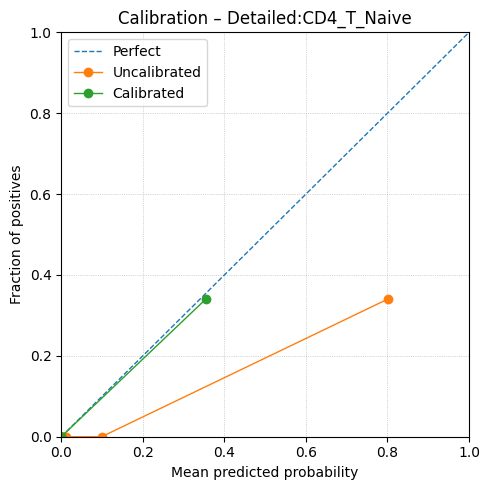

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Triana/Models/Detailed_CD4_T_Naive/Detailed_CD4_T_Naive_bundle.joblib

CD4_T_Naive
               precision    recall  f1-score   support

           0       0.98      1.00      0.99       223
           1       1.00      0.98      0.99       223

    accuracy                           0.99       446
   macro avg       0.99      0.99      0.99       446
weighted avg       0.99      0.99      0.99       446


Processing CD8_T_Memory (class 8/30)...
Training - Found 10674 / 10674 barcodes
Training - Pos: 5337, Neg: 5337
Training labels: 5337 pos, 5337 neg
Testing  - Found 2966 / 2966 barcodes
Testing  - Pos: 1483, Neg: 1483
Testing  - labels: 1483 pos, 1483 neg
Calibrating - Found 3926 rows | Pos: 593, Neg: 3333
All test data: 9804 rows, positives for CD8_T_Memory: 1483
[scale] CD8_T_Memory: train mean ~ 0.000, std ~ 1.000

[NB] training

Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.



[KNN] training → CD8_T_Memory
Fitting 10 folds for each of 10 candidates, totalling 100 fits

[MLP] training → CD8_T_Memory
Fitting 10 folds for each of 10 candidates, totalling 100 fits
[CAL] CD8_T_Memory: cal positives=593/3926

Calibration metrics:
   Uncalibrated  |  Brier: 0.0151   LogLoss: 0.0560
     Calibrated  |  Brier: 0.0092   LogLoss: 0.0343


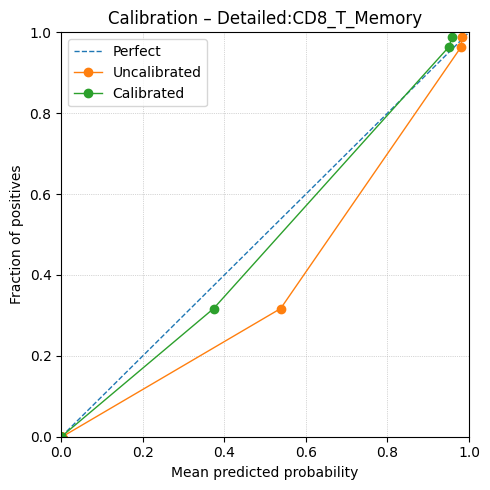

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Triana/Models/Detailed_CD8_T_Memory/Detailed_CD8_T_Memory_bundle.joblib

CD8_T_Memory
               precision    recall  f1-score   support

           0       0.99      0.97      0.98      1483
           1       0.97      0.99      0.98      1483

    accuracy                           0.98      2966
   macro avg       0.98      0.98      0.98      2966
weighted avg       0.98      0.98      0.98      2966


Processing CD8_T_Naive (class 9/30)...
Training - Found 774 / 774 barcodes
Training - Pos: 387, Neg: 387
Training labels: 387 pos, 387 neg
Testing  - Found 214 / 214 barcodes
Testing  - Pos: 107, Neg: 107
Testing  - labels: 107 pos, 107 neg
Calibrating - Found 3926 rows | Pos: 43, Neg: 3883
All test data: 9804 rows, positives for CD8_T_Naive: 107
[scale] CD8_T_Naive: train mean ~ -0.000, std ~ 1.000

[NB] training → CD8_T_Naive


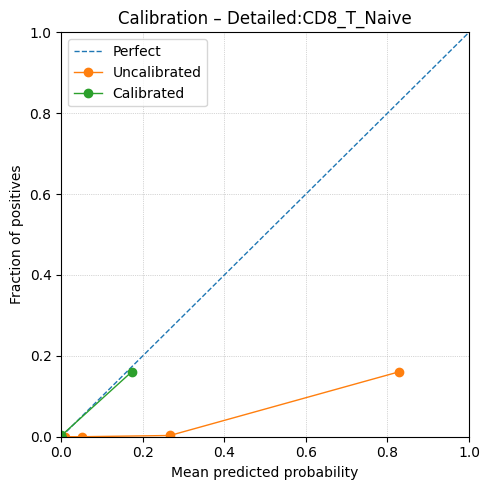

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Triana/Models/Detailed_CD8_T_Naive/Detailed_CD8_T_Naive_bundle.joblib

CD8_T_Naive
               precision    recall  f1-score   support

           0       0.91      1.00      0.95       107
           1       1.00      0.90      0.95       107

    accuracy                           0.95       214
   macro avg       0.95      0.95      0.95       214
weighted avg       0.95      0.95      0.95       214


Processing EoBaMaP (class 10/30)...
Training - Found 320 / 320 barcodes
Training - Pos: 160, Neg: 160
Training labels: 160 pos, 160 neg
Testing  - Found 88 / 88 barcodes
Testing  - Pos: 44, Neg: 44
Testing  - labels: 44 pos, 44 neg
Calibrating - Found 3926 rows | Pos: 18, Neg: 3908
All test data: 9804 rows, positives for EoBaMaP: 44
[scale] EoBaMaP: train mean ~ -0.000, std ~ 1.000

[NB] training → EoBaMaP
Fitting 10 folds for each

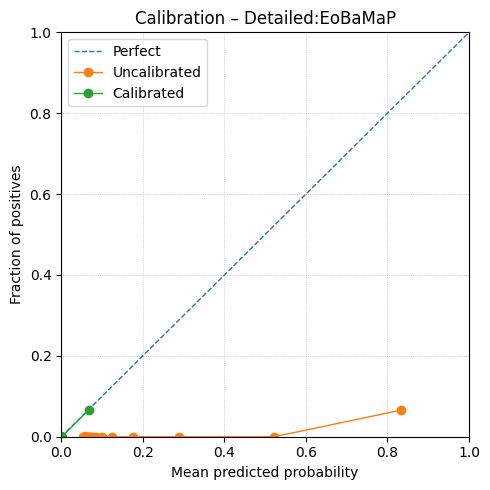

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Triana/Models/Detailed_EoBaMaP/Detailed_EoBaMaP_bundle.joblib

EoBaMaP
               precision    recall  f1-score   support

           0       0.50      1.00      0.67        44
           1       0.00      0.00      0.00        44

    accuracy                           0.50        88
   macro avg       0.25      0.50      0.33        88
weighted avg       0.25      0.50      0.33        88


Processing ErP (class 11/30)...
Training - Found 2578 / 2578 barcodes
Training - Pos: 1289, Neg: 1289
Training labels: 1289 pos, 1289 neg
Testing  - Found 716 / 716 barcodes
Testing  - Pos: 358, Neg: 358
Testing  - labels: 358 pos, 358 neg
Calibrating - Found 3926 rows | Pos: 143, Neg: 3783
All test data: 9804 rows, positives for ErP: 358
[scale] ErP: train mean ~ -0.000, std ~ 1.000

[NB] training → ErP
Fitting 10 folds for each of 10 candida

Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.



[KNN] training → ErP
Fitting 10 folds for each of 10 candidates, totalling 100 fits

[MLP] training → ErP
Fitting 10 folds for each of 10 candidates, totalling 100 fits
[CAL] ErP: cal positives=143/3926

Calibration metrics:
   Uncalibrated  |  Brier: 0.0251   LogLoss: 0.0994
     Calibrated  |  Brier: 0.0084   LogLoss: 0.0307


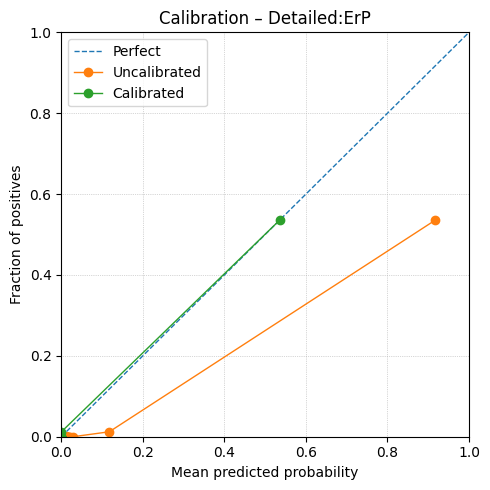

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Triana/Models/Detailed_ErP/Detailed_ErP_bundle.joblib

ErP
               precision    recall  f1-score   support

           0       0.94      0.99      0.97       358
           1       0.99      0.94      0.96       358

    accuracy                           0.97       716
   macro avg       0.97      0.97      0.97       716
weighted avg       0.97      0.97      0.97       716


Processing Erythroblast (class 12/30)...
Training - Found 302 / 302 barcodes
Training - Pos: 151, Neg: 151
Training labels: 151 pos, 151 neg
Testing  - Found 84 / 84 barcodes
Testing  - Pos: 42, Neg: 42
Testing  - labels: 42 pos, 42 neg
Calibrating - Found 3926 rows | Pos: 17, Neg: 3909
All test data: 9804 rows, positives for Erythroblast: 42
[scale] Erythroblast: train mean ~ -0.000, std ~ 1.000

[NB] training → Erythroblast
Fitting 10 folds for each of 

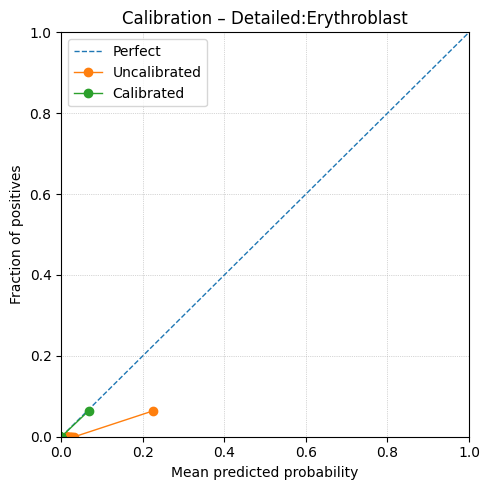

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Triana/Models/Detailed_Erythroblast/Detailed_Erythroblast_bundle.joblib

Erythroblast
               precision    recall  f1-score   support

           0       1.00      1.00      1.00        42
           1       1.00      1.00      1.00        42

    accuracy                           1.00        84
   macro avg       1.00      1.00      1.00        84
weighted avg       1.00      1.00      1.00        84


Processing GMP (class 13/30)...
Training - Found 1234 / 1234 barcodes
Training - Pos: 617, Neg: 617
Training labels: 617 pos, 617 neg
Testing  - Found 342 / 342 barcodes
Testing  - Pos: 171, Neg: 171
Testing  - labels: 171 pos, 171 neg
Calibrating - Found 3926 rows | Pos: 69, Neg: 3857
All test data: 9804 rows, positives for GMP: 171
[scale] GMP: train mean ~ -0.000, std ~ 1.000

[NB] training → GMP
Fitting 10 folds for each of 

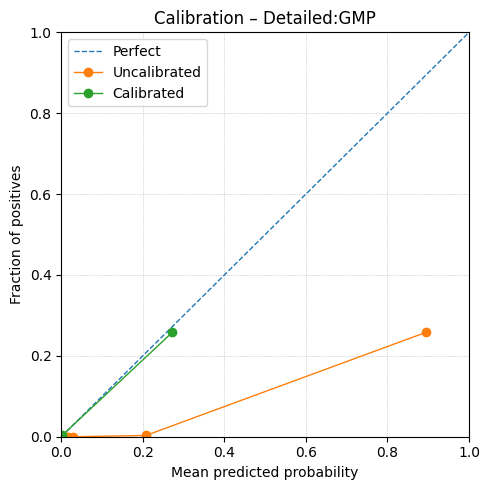

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Triana/Models/Detailed_GMP/Detailed_GMP_bundle.joblib

GMP
               precision    recall  f1-score   support

           0       0.62      1.00      0.77       171
           1       1.00      0.39      0.56       171

    accuracy                           0.69       342
   macro avg       0.81      0.69      0.66       342
weighted avg       0.81      0.69      0.66       342


Processing HSC_MPP (class 14/30)...
Training - Found 5798 / 5798 barcodes
Training - Pos: 2899, Neg: 2899
Training labels: 2899 pos, 2899 neg
Testing  - Found 1610 / 1610 barcodes
Testing  - Pos: 805, Neg: 805
Testing  - labels: 805 pos, 805 neg
Calibrating - Found 3926 rows | Pos: 322, Neg: 3604
All test data: 9804 rows, positives for HSC_MPP: 805
[scale] HSC_MPP: train mean ~ 0.000, std ~ 1.000

[NB] training → HSC_MPP
Fitting 10 folds for each of 10 ca

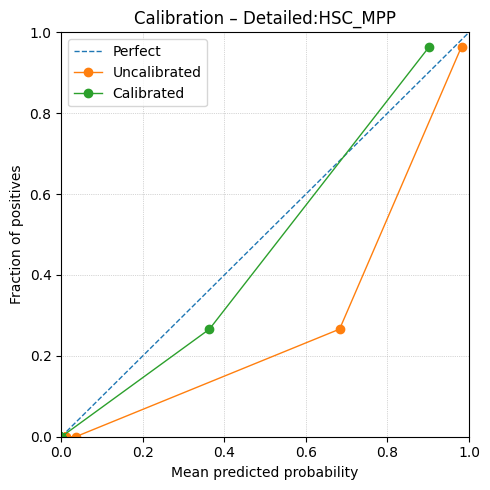

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Triana/Models/Detailed_HSC_MPP/Detailed_HSC_MPP_bundle.joblib

HSC_MPP
               precision    recall  f1-score   support

           0       0.96      0.98      0.97       805
           1       0.98      0.96      0.97       805

    accuracy                           0.97      1610
   macro avg       0.97      0.97      0.97      1610
weighted avg       0.97      0.97      0.97      1610


Processing Immature_B (class 15/30)...
Training - Found 832 / 832 barcodes
Training - Pos: 416, Neg: 416
Training labels: 416 pos, 416 neg
Testing  - Found 230 / 230 barcodes
Testing  - Pos: 115, Neg: 115
Testing  - labels: 115 pos, 115 neg
Calibrating - Found 3926 rows | Pos: 46, Neg: 3880
All test data: 9804 rows, positives for Immature_B: 115
[scale] Immature_B: train mean ~ 0.000, std ~ 1.000

[NB] training → Immature_B
Fitting 10 folds fo

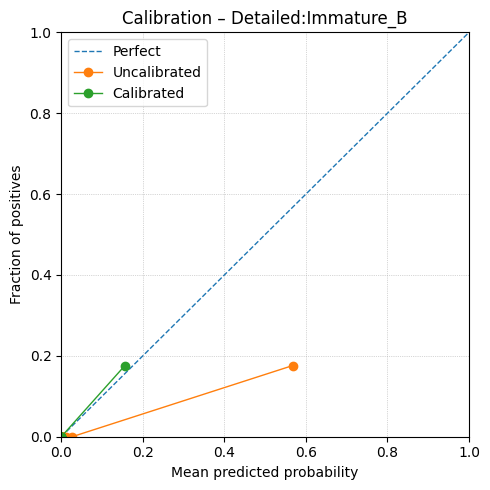

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Triana/Models/Detailed_Immature_B/Detailed_Immature_B_bundle.joblib

Immature_B
               precision    recall  f1-score   support

           0       0.87      1.00      0.93       115
           1       1.00      0.85      0.92       115

    accuracy                           0.93       230
   macro avg       0.94      0.93      0.93       230
weighted avg       0.94      0.93      0.93       230


Processing MAIT (class 16/30)...
Training - Found 306 / 306 barcodes
Training - Pos: 153, Neg: 153
Training labels: 153 pos, 153 neg
Testing  - Found 86 / 86 barcodes
Testing  - Pos: 43, Neg: 43
Testing  - labels: 43 pos, 43 neg
Calibrating - Found 3926 rows | Pos: 17, Neg: 3909
All test data: 9804 rows, positives for MAIT: 43
[scale] MAIT: train mean ~ -0.000, std ~ 1.000

[NB] training → MAIT
Fitting 10 folds for each of 10 candidat

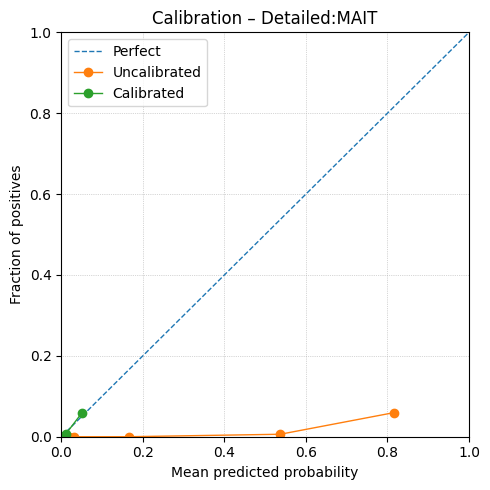

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Triana/Models/Detailed_MAIT/Detailed_MAIT_bundle.joblib

MAIT
               precision    recall  f1-score   support

           0       0.50      1.00      0.67        43
           1       0.00      0.00      0.00        43

    accuracy                           0.50        86
   macro avg       0.25      0.50      0.33        86
weighted avg       0.25      0.50      0.33        86


Processing MEP (class 17/30)...
Training - Found 2908 / 2908 barcodes
Training - Pos: 1454, Neg: 1454
Training labels: 1454 pos, 1454 neg
Testing  - Found 808 / 808 barcodes
Testing  - Pos: 404, Neg: 404
Testing  - labels: 404 pos, 404 neg
Calibrating - Found 3926 rows | Pos: 162, Neg: 3764
All test data: 9804 rows, positives for MEP: 404
[scale] MEP: train mean ~ 0.000, std ~ 1.000

[NB] training → MEP
Fitting 10 folds for each of 10 candidates, total

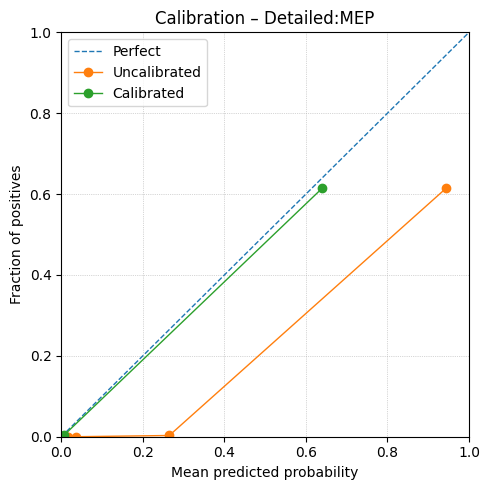

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Triana/Models/Detailed_MEP/Detailed_MEP_bundle.joblib

MEP
               precision    recall  f1-score   support

           0       0.95      0.99      0.97       404
           1       0.99      0.94      0.97       404

    accuracy                           0.97       808
   macro avg       0.97      0.97      0.97       808
weighted avg       0.97      0.97      0.97       808


Processing MkP (class 18/30)...
Training - Found 656 / 656 barcodes
Training - Pos: 328, Neg: 328
Training labels: 328 pos, 328 neg
Testing  - Found 182 / 182 barcodes
Testing  - Pos: 91, Neg: 91
Testing  - labels: 91 pos, 91 neg
Calibrating - Found 3926 rows | Pos: 37, Neg: 3889
All test data: 9804 rows, positives for MkP: 91
[scale] MkP: train mean ~ 0.000, std ~ 1.000

[NB] training → MkP
Fitting 10 folds for each of 10 candidates, totalling 100 fits



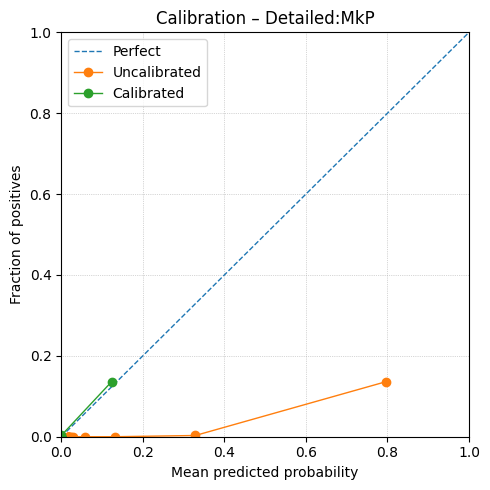

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Triana/Models/Detailed_MkP/Detailed_MkP_bundle.joblib

MkP
               precision    recall  f1-score   support

           0       0.73      1.00      0.85        91
           1       1.00      0.64      0.78        91

    accuracy                           0.82       182
   macro avg       0.87      0.82      0.81       182
weighted avg       0.87      0.82      0.81       182


Processing Myeloid_progenitor (class 19/30)...
Training - Found 1106 / 1106 barcodes
Training - Pos: 553, Neg: 553
Training labels: 553 pos, 553 neg
Testing  - Found 306 / 306 barcodes
Testing  - Pos: 153, Neg: 153
Testing  - labels: 153 pos, 153 neg
Calibrating - Found 3926 rows | Pos: 61, Neg: 3865
All test data: 9804 rows, positives for Myeloid_progenitor: 153
[scale] Myeloid_progenitor: train mean ~ 0.000, std ~ 1.000

[NB] training → Myeloid_progenit

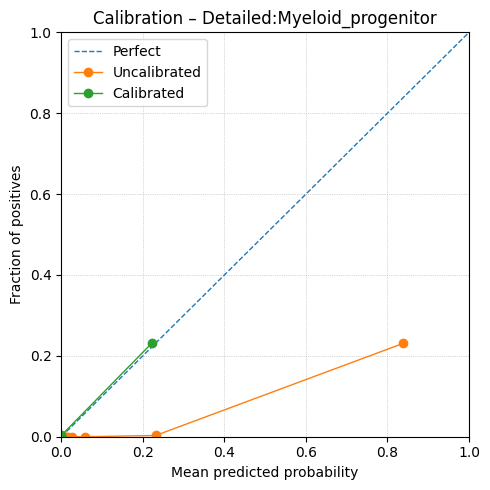

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Triana/Models/Detailed_Myeloid_progenitor/Detailed_Myeloid_progenitor_bundle.joblib

Myeloid_progenitor
               precision    recall  f1-score   support

           0       0.82      0.98      0.89       153
           1       0.98      0.78      0.87       153

    accuracy                           0.88       306
   macro avg       0.90      0.88      0.88       306
weighted avg       0.90      0.88      0.88       306


Processing NK_CD56_bright (class 20/30)...
Training - Found 882 / 882 barcodes
Training - Pos: 441, Neg: 441
Training labels: 441 pos, 441 neg
Testing  - Found 244 / 244 barcodes
Testing  - Pos: 122, Neg: 122
Testing  - labels: 122 pos, 122 neg
Calibrating - Found 3926 rows | Pos: 49, Neg: 3877
All test data: 9804 rows, positives for NK_CD56_bright: 122
[scale] NK_CD56_bright: train mean ~ 0.000, std ~ 1.000

[

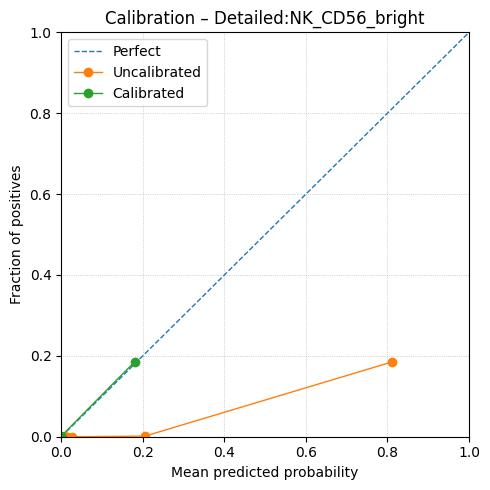

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Triana/Models/Detailed_NK_CD56_bright/Detailed_NK_CD56_bright_bundle.joblib

NK_CD56_bright
               precision    recall  f1-score   support

           0       0.75      1.00      0.86       122
           1       1.00      0.66      0.80       122

    accuracy                           0.83       244
   macro avg       0.87      0.83      0.83       244
weighted avg       0.87      0.83      0.83       244


Processing NK_CD56_dim (class 21/30)...
Training - Found 6580 / 6580 barcodes
Training - Pos: 3290, Neg: 3290
Training labels: 3290 pos, 3290 neg
Testing  - Found 1828 / 1828 barcodes
Testing  - Pos: 914, Neg: 914
Testing  - labels: 914 pos, 914 neg
Calibrating - Found 3926 rows | Pos: 366, Neg: 3560
All test data: 9804 rows, positives for NK_CD56_dim: 914
[scale] NK_CD56_dim: train mean ~ 0.000, std ~ 1.000

[NB] training

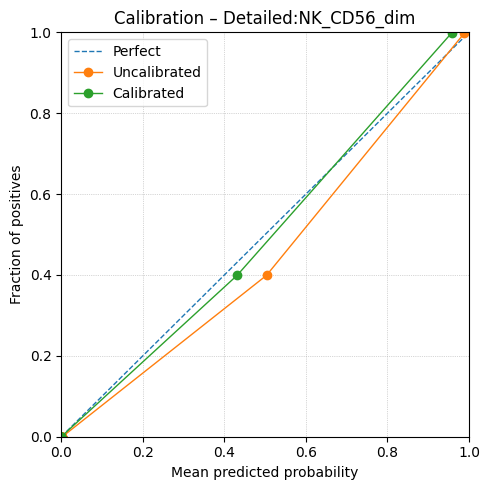

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Triana/Models/Detailed_NK_CD56_dim/Detailed_NK_CD56_dim_bundle.joblib

NK_CD56_dim
               precision    recall  f1-score   support

           0       1.00      0.99      1.00       914
           1       0.99      1.00      1.00       914

    accuracy                           1.00      1828
   macro avg       1.00      1.00      1.00      1828
weighted avg       1.00      1.00      1.00      1828


Processing Plasma (class 22/30)...
Training - Found 702 / 702 barcodes
Training - Pos: 351, Neg: 351
Training labels: 351 pos, 351 neg
Testing  - Found 194 / 194 barcodes
Testing  - Pos: 97, Neg: 97
Testing  - labels: 97 pos, 97 neg
Calibrating - Found 3926 rows | Pos: 39, Neg: 3887
All test data: 9804 rows, positives for Plasma: 97
[scale] Plasma: train mean ~ 0.000, std ~ 1.000

[NB] training → Plasma
Fitting 10 folds for each of

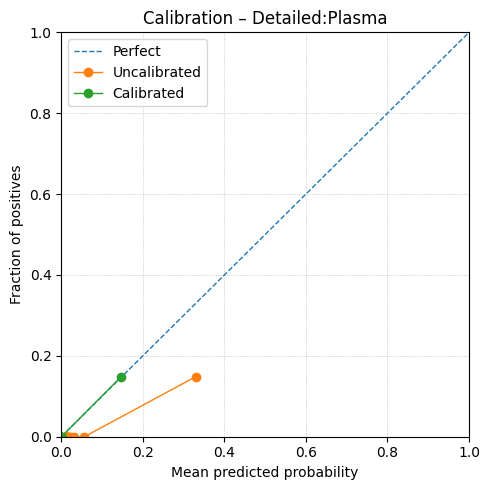

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Triana/Models/Detailed_Plasma/Detailed_Plasma_bundle.joblib

Plasma
               precision    recall  f1-score   support

           0       0.98      1.00      0.99        97
           1       1.00      0.98      0.99        97

    accuracy                           0.99       194
   macro avg       0.99      0.99      0.99       194
weighted avg       0.99      0.99      0.99       194


Processing Pre-B (class 23/30)...
Training - Found 1160 / 1160 barcodes
Training - Pos: 580, Neg: 580
Training labels: 580 pos, 580 neg
Testing  - Found 322 / 322 barcodes
Testing  - Pos: 161, Neg: 161
Testing  - labels: 161 pos, 161 neg
Calibrating - Found 3926 rows | Pos: 65, Neg: 3861
All test data: 9804 rows, positives for Pre-B: 161
[scale] Pre-B: train mean ~ 0.000, std ~ 1.000

[NB] training → Pre-B
Fitting 10 folds for each of 10 candidat

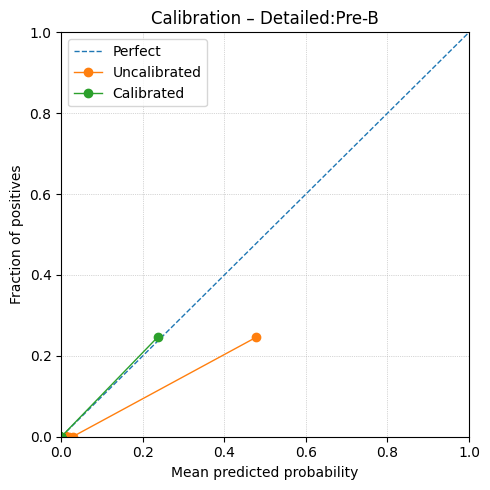

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Triana/Models/Detailed_Pre-B/Detailed_Pre-B_bundle.joblib

Pre-B
               precision    recall  f1-score   support

           0       0.96      1.00      0.98       161
           1       1.00      0.96      0.98       161

    accuracy                           0.98       322
   macro avg       0.98      0.98      0.98       322
weighted avg       0.98      0.98      0.98       322


Processing Pre-Pro-B (class 24/30)...
Training - Found 260 / 260 barcodes
Training - Pos: 130, Neg: 130
Training labels: 130 pos, 130 neg
Testing  - Found 72 / 72 barcodes
Testing  - Pos: 36, Neg: 36
Testing  - labels: 36 pos, 36 neg
Calibrating - Found 3926 rows | Pos: 15, Neg: 3911
All test data: 9804 rows, positives for Pre-Pro-B: 36
[scale] Pre-Pro-B: train mean ~ 0.000, std ~ 1.000

[NB] training → Pre-Pro-B
Fitting 10 folds for each of 10 cand

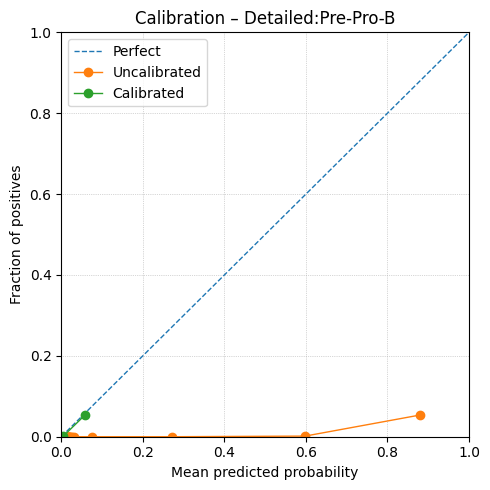

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Triana/Models/Detailed_Pre-Pro-B/Detailed_Pre-Pro-B_bundle.joblib

Pre-Pro-B
               precision    recall  f1-score   support

           0       0.50      1.00      0.67        36
           1       0.00      0.00      0.00        36

    accuracy                           0.50        72
   macro avg       0.25      0.50      0.33        72
weighted avg       0.25      0.50      0.33        72


Processing Pro-B (class 25/30)...
Training - Found 162 / 162 barcodes
Training - Pos: 81, Neg: 81
Training labels: 81 pos, 81 neg
Testing  - Found 44 / 44 barcodes
Testing  - Pos: 22, Neg: 22
Testing  - labels: 22 pos, 22 neg
Calibrating - Found 3926 rows | Pos: 9, Neg: 3917
All test data: 9804 rows, positives for Pro-B: 22
[scale] Pro-B: train mean ~ -0.000, std ~ 1.000

[NB] training → Pro-B
Fitting 10 folds for each of 10 candidates, 

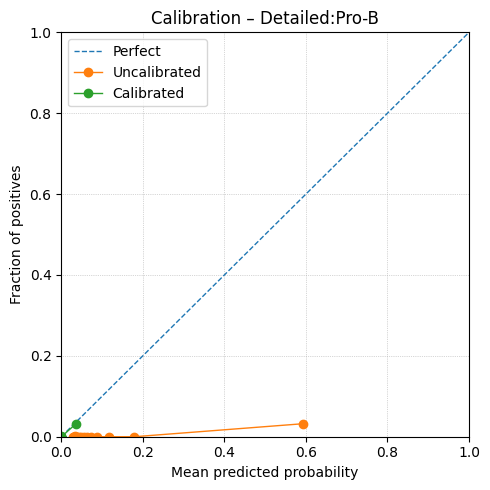

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Triana/Models/Detailed_Pro-B/Detailed_Pro-B_bundle.joblib

Pro-B
               precision    recall  f1-score   support

           0       0.50      1.00      0.67        22
           1       0.00      0.00      0.00        22

    accuracy                           0.50        44
   macro avg       0.25      0.50      0.33        44
weighted avg       0.25      0.50      0.33        44


Processing Treg (class 26/30)...
Training - Found 206 / 206 barcodes
Training - Pos: 103, Neg: 103
Training labels: 103 pos, 103 neg
Testing  - Found 58 / 58 barcodes
Testing  - Pos: 29, Neg: 29
Testing  - labels: 29 pos, 29 neg
Calibrating - Found 3926 rows | Pos: 11, Neg: 3915
All test data: 9804 rows, positives for Treg: 29
[scale] Treg: train mean ~ 0.000, std ~ 1.000

[NB] training → Treg
Fitting 10 folds for each of 10 candidates, totalling 10

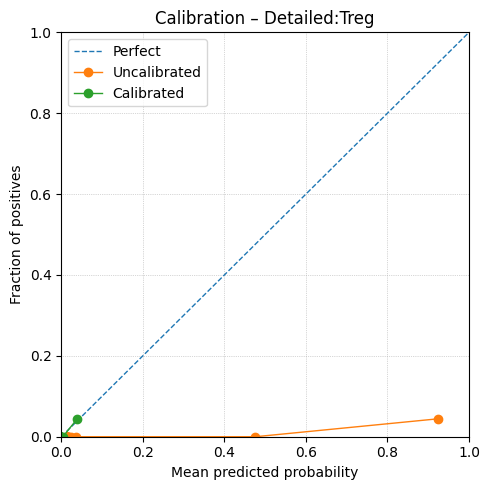

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Triana/Models/Detailed_Treg/Detailed_Treg_bundle.joblib

Treg
               precision    recall  f1-score   support

           0       0.50      1.00      0.67        29
           1       0.00      0.00      0.00        29

    accuracy                           0.50        58
   macro avg       0.25      0.50      0.33        58
weighted avg       0.25      0.50      0.33        58


Processing cDC1 (class 27/30)...
Training - Found 1638 / 1638 barcodes
Training - Pos: 819, Neg: 819
Training labels: 819 pos, 819 neg
Testing  - Found 456 / 456 barcodes
Testing  - Pos: 228, Neg: 228
Testing  - labels: 228 pos, 228 neg
Calibrating - Found 3926 rows | Pos: 91, Neg: 3835
All test data: 9804 rows, positives for cDC1: 228
[scale] cDC1: train mean ~ -0.000, std ~ 1.000

[NB] training → cDC1
Fitting 10 folds for each of 10 candidates, total

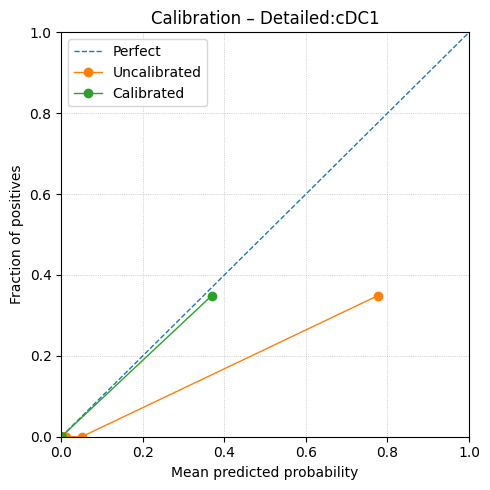

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Triana/Models/Detailed_cDC1/Detailed_cDC1_bundle.joblib

cDC1
               precision    recall  f1-score   support

           0       0.94      0.98      0.96       228
           1       0.98      0.94      0.96       228

    accuracy                           0.96       456
   macro avg       0.96      0.96      0.96       456
weighted avg       0.96      0.96      0.96       456


Processing cDC2 (class 28/30)...
Training - Found 844 / 844 barcodes
Training - Pos: 422, Neg: 422
Training labels: 422 pos, 422 neg
Testing  - Found 234 / 234 barcodes
Testing  - Pos: 117, Neg: 117
Testing  - labels: 117 pos, 117 neg
Calibrating - Found 3926 rows | Pos: 47, Neg: 3879
All test data: 9804 rows, positives for cDC2: 117
[scale] cDC2: train mean ~ -0.000, std ~ 1.000

[NB] training → cDC2
Fitting 10 folds for each of 10 candidates, totalli

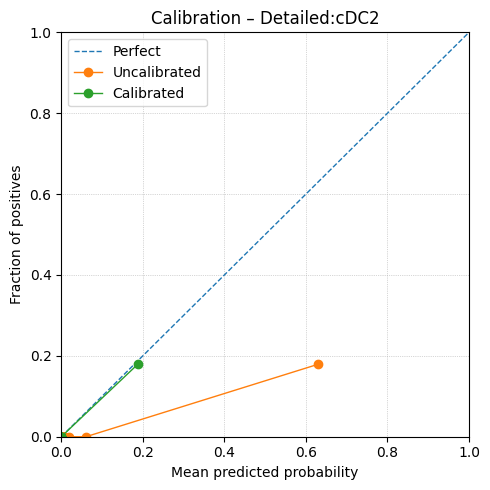

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Triana/Models/Detailed_cDC2/Detailed_cDC2_bundle.joblib

cDC2
               precision    recall  f1-score   support

           0       0.83      0.99      0.91       117
           1       0.99      0.80      0.89       117

    accuracy                           0.90       234
   macro avg       0.91      0.90      0.90       234
weighted avg       0.91      0.90      0.90       234


Processing gdT (class 29/30)...
Training - Found 1502 / 1502 barcodes
Training - Pos: 751, Neg: 751
Training labels: 751 pos, 751 neg
Testing  - Found 416 / 416 barcodes
Testing  - Pos: 208, Neg: 208
Testing  - labels: 208 pos, 208 neg
Calibrating - Found 3926 rows | Pos: 83, Neg: 3843
All test data: 9804 rows, positives for gdT: 208
[scale] gdT: train mean ~ 0.000, std ~ 1.000

[NB] training → gdT
Fitting 10 folds for each of 10 candidates, totalling 

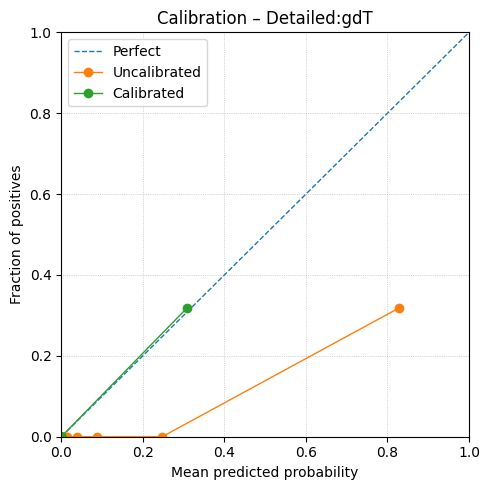

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Triana/Models/Detailed_gdT/Detailed_gdT_bundle.joblib

gdT
               precision    recall  f1-score   support

           0       0.95      1.00      0.97       208
           1       1.00      0.94      0.97       208

    accuracy                           0.97       416
   macro avg       0.97      0.97      0.97       416
weighted avg       0.97      0.97      0.97       416


Processing pDC (class 30/30)...
Training - Found 1368 / 1368 barcodes
Training - Pos: 684, Neg: 684
Training labels: 684 pos, 684 neg
Testing  - Found 380 / 380 barcodes
Testing  - Pos: 190, Neg: 190
Testing  - labels: 190 pos, 190 neg
Calibrating - Found 3926 rows | Pos: 76, Neg: 3850
All test data: 9804 rows, positives for pDC: 190
[scale] pDC: train mean ~ 0.000, std ~ 1.000

[NB] training → pDC
Fitting 10 folds for each of 10 candidates, totalling 100

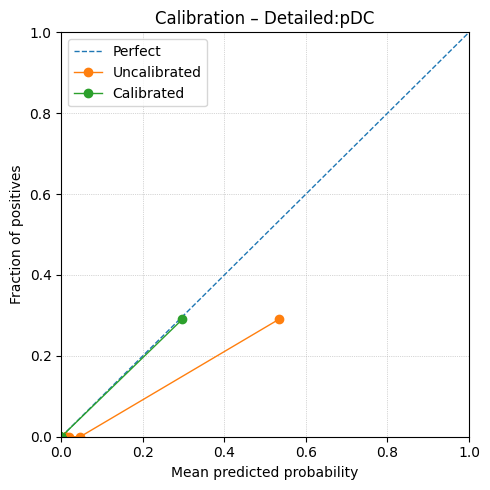

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Triana/Models/Detailed_pDC/Detailed_pDC_bundle.joblib

pDC
               precision    recall  f1-score   support

           0       0.96      0.99      0.98       190
           1       0.99      0.96      0.98       190

    accuracy                           0.98       380
   macro avg       0.98      0.98      0.98       380
weighted avg       0.98      0.98      0.98       380


Fitting multiclass TemperatureScaling on CAL split (excluded classes masked out)...

Preview of probabilities BEFORE (raw OvR) vs AFTER (multiclass TS) [included classes only]:
                       raw_B_Memory  raw_B_Naive  raw_CD14_Mono  raw_CD16_Mono   raw_CD4_CTL  raw_CD4_T_Memory  raw_CD4_T_Naive  raw_CD8_T_Memory  raw_CD8_T_Naive  raw_EoBaMaP   raw_ErP  raw_Erythroblast   raw_GMP  raw_HSC_MPP  raw_Immature_B  raw_MAIT   raw_MEP       raw_MkP  raw_

In [135]:
# -*- coding: utf-8 -*-
from pathlib import Path
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.ensemble import StackingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.calibration import CalibratedClassifierCV
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report, confusion_matrix

from netcal.scaling import TemperatureScaling
import joblib

# ------------------------------------------------------------------- CONFIG (expects these to already exist)
#   models_output, train_barcodes_path, test_barcodes_path
#   Triana_data_Train, Triana_data_Test, Triana_data_Cal          (DataFrames indexed by barcode)
#   Triana_dataset_Train, Triana_dataset_Test, Triana_dataset_Cal (AnnData with obs labels)
#   TotalSeqD_Heme_Oncology_CAT399906                    (iterable of feature names)
#   MLTraining module with: CV, train_NB, train_XGB, train_KNN, train_MLP,
#                           plot_calibration_curve, save_models, evaluate_classifier, append_metrics_csv

name_target_class = "Detailed"   # "detailed" | "detailed" | "Detailed"
fig_root   = Path(models_output) / "Figures"
models_dir = Path(models_output) / "Models"
fig_root.mkdir(parents=True, exist_ok=True)
models_dir.mkdir(parents=True, exist_ok=True)

kf         = MLTraining.CV
num_cores  = -1
metrics_log = []

# ============================= HELPERS =============================

def _norm_feats(names) -> pd.Index:
    """
    Normalizer used ONLY to construct matching keys.
    Panel names remain untouched; data columns are normalized and then mapped BACK
    to the exact panel names via a lookup.
    """
    s = pd.Index(map(str, names))
    s = (s.str.strip()
           .str.lower()
           .str.replace(r"[ _/]+", "-", regex=True)
           .str.replace(r"-+", "-", regex=True)
           .str.strip("-"))
    return s

def attach_celltype(df: pd.DataFrame, ad: "AnnData", field: str) -> pd.DataFrame:
    if field not in ad.obs:
        raise KeyError(f"'{field}' not found in AnnData.obs")
    lab = (ad.obs[field]
             .astype("string")
             .str.strip()
             .str.replace(r"\s+", "_", regex=True))
    out = df.copy()
    out["Celltype"] = pd.Categorical(lab.reindex(out.index))
    if out["Celltype"].isna().any():
        missing = int(out["Celltype"].isna().sum())
        print(f"[WARN] {missing} rows got NaN Celltype after reindex; check barcode alignment.")
    return out

def _check_finite(df: pd.DataFrame, tag: str):
    arr = df.to_numpy()
    if not np.isfinite(arr).all():
        bad = np.where(~np.isfinite(arr))
        raise ValueError(f"Non-finite values found in {tag} features at positions {bad}")

def _unwrap_estimator(m):
    return getattr(m, "estimator", None) or getattr(m, "base_estimator", None) or m

def _assert_feature_counts(cell_name: str, models_dict: dict, expected: int):
    pairs = [
        ("NB",  models_dict.get("NB")),
        ("XGB", models_dict.get("XGB")),
        ("KNN", models_dict.get("KNN")),
        ("MLP", models_dict.get("MLP")),
        ("Stacker", models_dict.get("Stacker")),
    ]
    for name, est in pairs:
        if est is None:
            continue
        base = _unwrap_estimator(est)
        nfi = getattr(base, "n_features_in_", None)
        if nfi is not None and nfi != expected:
            raise RuntimeError(f"{cell_name}:{name} saw {nfi} features; expected {expected}")

# ============================= LABEL ATTACH =============================

consensus_field = f"Consensus_annotation_{name_target_class.lower()}_final"

Triana_data_Train = attach_celltype(Triana_data_Train, Triana_dataset_Train, consensus_field)
Triana_data_Test  = attach_celltype(Triana_data_Test,  Triana_dataset_Test,  consensus_field)
Triana_data_Cal   = attach_celltype(Triana_data_Cal,   Triana_dataset_Cal,   consensus_field)

# ============================= PANEL & DATA COLUMN ALIGNMENT =============================

# Keep the panel EXACTLY as provided
panel = pd.Index(map(str, TotalSeqD_Heme_Oncology_CAT399906))

# Build a mapping: normalized_key -> exact panel name
panel_keys    = _norm_feats(panel)
norm_to_panel = dict(zip(panel_keys, panel))
if len(norm_to_panel) != len(panel):
    raise ValueError("Panel contains names that collide after normalization. Consider adjusting _norm_feats rules.")

def _rename_data_to_panel(df: pd.DataFrame) -> pd.DataFrame:
    """
    Rename only feature columns so that after normalization they map
    back to the exact panel column names. Keeps 'cell_barcode' and 'Celltype' intact.
    """
    df = df.copy()
    non_feat = [c for c in ["cell_barcode", "Celltype"] if c in df.columns]
    feat     = pd.Index([c for c in df.columns if c not in non_feat])

    feat_keys   = _norm_feats(feat)
    mapped      = [norm_to_panel.get(k) for k in feat_keys]  # None if not in panel
    rename_map  = {old: new for old, new in zip(feat, mapped) if new is not None}

    # Handle duplicate mappings (two data columns → same panel col). Keep first, drop the rest.
    seen, safe_map, drops = set(), {}, []
    for old, new in rename_map.items():
        if new in seen:
            drops.append(old)
        else:
            seen.add(new); safe_map[old] = new

    if drops:
        print(f"[WARN] Dropping {len(drops)} duplicated-mapped columns (showing up to 5): {drops[:5]}")

    if drops:
        df.drop(columns=drops, inplace=True, errors="ignore")
    df.rename(columns=safe_map, inplace=True)

    matched = len(safe_map)
    print(f"[map] matched {matched}/{len(feat)} data columns to panel")
    return df

# Apply: normalize/rename ONLY data splits (panel remains untouched)
Triana_data_Train = _rename_data_to_panel(Triana_data_Train)
Triana_data_Test  = _rename_data_to_panel(Triana_data_Test)
Triana_data_Cal   = _rename_data_to_panel(Triana_data_Cal)

# Intersect each split with the panel IN PANEL ORDER
def _panel_intersection(df: pd.DataFrame) -> pd.DataFrame:
    non_feat = [c for c in ["cell_barcode", "Celltype"] if c in df.columns]
    feat_cols = pd.Index([c for c in df.columns if c not in non_feat])
    inter = panel.intersection(feat_cols, sort=False)
    if inter.empty:
        raise ValueError("Panel/Data intersection is empty after renaming. Check mapping rules.")
    return df.reindex(columns=list(inter) + non_feat)

Triana_data_Train = _panel_intersection(Triana_data_Train)
Triana_data_Test  = _panel_intersection(Triana_data_Test)
Triana_data_Cal   = _panel_intersection(Triana_data_Cal)

# ============================= FEATURES & LABELS =============================

Triana_data_Cal_lbl = Triana_data_Cal[["Celltype"]].copy()

drop_cols_train = [c for c in ["cell_barcode", "Celltype"] if c in Triana_data_Train.columns]
drop_cols_test  = [c for c in ["cell_barcode", "Celltype"] if c in Triana_data_Test.columns]
drop_cols_cal   = [c for c in ["cell_barcode", "Celltype"] if c in Triana_data_Cal.columns]

Triana_data_Train_Sub = Triana_data_Train.drop(columns=drop_cols_train, errors="ignore")
Triana_data_Test_Sub  = Triana_data_Test.drop(columns=drop_cols_test,  errors="ignore")
Triana_data_Cal_Sub   = Triana_data_Cal.drop(columns=drop_cols_cal,    errors="ignore")

# SAFETY: shared columns & finiteness checks
cols_train = list(Triana_data_Train_Sub.columns)
if list(Triana_data_Test_Sub.columns) != cols_train or list(Triana_data_Cal_Sub.columns) != cols_train:
    raise ValueError("Train/Cal/Test feature columns differ after panel intersection!")

_check_finite(Triana_data_Train_Sub, "TRAIN")
_check_finite(Triana_data_Test_Sub,  "TEST")
_check_finite(Triana_data_Cal_Sub,   "CAL")

print(f"\n[features] Using {len(cols_train)} panel-intersected features (exact panel names):")
print(cols_train)

# ===== Exclude specific classes from the multiclass set and per-class loop =====
EXCLUDE_CLASSES = {"Macrophage", "ILC", "Stroma", "dnT"}

all_classes = sorted(pd.Series(Triana_data_Train["Celltype"]).dropna().unique())
class_names = [c for c in all_classes if c not in EXCLUDE_CLASSES]
if not class_names:
    raise ValueError("After exclusions, class_names is empty.")
print(f"[classes] Included ({len(class_names)}): {class_names}")
if missing := [c for c in all_classes if c in EXCLUDE_CLASSES]:
    print(f"[classes] Excluded: {missing}")

K            = len(class_names)
class_to_idx = {c: i for i, c in enumerate(class_names)}

# --- Multiclass labels (MASKED to included classes) ---
# CAL
mask_cal_mc = Triana_data_Cal_lbl["Celltype"].isin(class_names)
s_cal = Triana_data_Cal_lbl.loc[mask_cal_mc, "Celltype"].map(class_to_idx)
if s_cal.isna().any():
    missing = Triana_data_Cal_lbl.loc[mask_cal_mc & s_cal.isna(), "Celltype"].unique()
    raise ValueError(f"Unknown labels in masked CAL split: {missing}")
y_cal_multiclass = s_cal.to_numpy(dtype=np.int64)

# TEST
mask_test_mc = Triana_data_Test["Celltype"].isin(class_names)
s_te = Triana_data_Test.loc[mask_test_mc, "Celltype"].map(class_to_idx)
if s_te.isna().any():
    missing = Triana_data_Test.loc[mask_test_mc & s_te.isna(), "Celltype"].unique()
    raise ValueError(f"Unknown labels in masked TEST split: {missing}")
y_test_multiclass = s_te.to_numpy(dtype=np.int64)

# Reuse across classes
X_cal_all_df = Triana_data_Cal_Sub.copy()
X_te_all_df  = Triana_data_Test_Sub.copy()

# Preallocate OvR prob mats (only for included classes)
P_cal = np.zeros((X_cal_all_df.shape[0], K), dtype=float)
P_te  = np.zeros((X_te_all_df.shape[0],  K), dtype=float)

test_index = Triana_data_Test_Sub.index

# ============================= TRAIN PER-CLASS OVR =============================

for celltype in class_names:
    k = class_to_idx[celltype]
    name = str(celltype).replace(" ", "_")
    print(f"\nProcessing {name} (class {k+1}/{K})...")

    # ---- TRAIN slice via barcode lists
    train_barcodes_df = pd.read_csv(
        f"{train_barcodes_path}/Triana/Consensus_annotation_detailed_final/Barcodes_training_class_{name}.csv",
        index_col=0
    )
    train_positive_barcodes = train_barcodes_df["Positive"].dropna().values
    train_negative_barcodes = train_barcodes_df["Negative"].dropna().values
    all_train_barcodes = np.concatenate([train_positive_barcodes, train_negative_barcodes])

    train_mask = Triana_data_Train_Sub.index.isin(all_train_barcodes)
    X_tr_df = Triana_data_Train_Sub.loc[train_mask]
    found_train_barcodes = X_tr_df.index.values
    y_tr = np.isin(found_train_barcodes, train_positive_barcodes).astype(int)

    # ---- Skip guards
    if X_tr_df.empty or np.unique(y_tr).size < 2:
        print(f"[SKIP] {name}: empty or single-class train slice (pos={y_tr.sum()}, neg={(len(y_tr)-y_tr.sum())}).")
        continue

    # ---- TEST slice via barcode lists
    test_barcodes_df = pd.read_csv(
        f"{test_barcodes_path}/Triana/Consensus_annotation_detailed_final/Barcodes_testing_class_{name}.csv",
        index_col=0
    )
    test_positive_barcodes = test_barcodes_df["Positive"].dropna().values
    test_negative_barcodes = test_barcodes_df["Negative"].dropna().values
    all_test_barcodes = np.concatenate([test_positive_barcodes, test_negative_barcodes])

    test_mask = Triana_data_Test_Sub.index.isin(all_test_barcodes)
    X_te_df = Triana_data_Test_Sub.loc[test_mask]
    found_test_barcodes = X_te_df.index.values
    y_te = np.isin(found_test_barcodes, test_positive_barcodes).astype(int)

    # ---- Full-test & cal for this binary head
    X_te_all_local = X_te_all_df.copy()
    y_te_all = (Triana_data_Test["Celltype"].values == celltype).astype(int)
    X_cal_df = X_cal_all_df.copy()
    y_cal_bin = (Triana_data_Cal_lbl["Celltype"].values == celltype).astype(int)

    # ---- Info
    print(f"Training - Found {X_tr_df.shape[0]} / {len(all_train_barcodes)} barcodes")
    print(f"Training - Pos: {len(train_positive_barcodes)}, Neg: {len(train_negative_barcodes)}")
    print(f"Training labels: {y_tr.sum()} pos, {len(y_tr)-y_tr.sum()} neg")
    print(f"Testing  - Found {X_te_df.shape[0]} / {len(all_test_barcodes)} barcodes")
    print(f"Testing  - Pos: {len(test_positive_barcodes)}, Neg: {len(test_negative_barcodes)}")
    print(f"Testing  - labels: {y_te.sum()} pos, {len(y_te)-y_te.sum()} neg")
    print(f"Calibrating - Found {X_cal_df.shape[0]} rows | Pos: {y_cal_bin.sum()}, Neg: {len(y_cal_bin)-y_cal_bin.sum()}")
    print(f"All test data: {X_te_all_local.shape[0]} rows, positives for {celltype}: {y_te_all.sum()}")

    # ---- Scaling (fit on per-head TRAIN slice; transform others)
    scaler = StandardScaler(with_mean=True, with_std=True).fit(X_tr_df.values)

    def _sc(df):
        return pd.DataFrame(
            scaler.transform(df.values),
            index=df.index,
            columns=cols_train,
        )

    X_tr_sc_df     = _sc(X_tr_df)
    X_te_sc_df     = _sc(X_te_df)
    X_te_all_sc_df = _sc(X_te_all_local)
    X_cal_sc_df    = _sc(X_cal_df)

    print(f"[scale] {name}: train mean ~ {X_tr_sc_df.values.mean():.3f}, std ~ {X_tr_sc_df.values.std():.3f}")

    # ---- Base learners
    NB_model  = MLTraining.train_NB (X_tr_sc_df, y_tr, cv=kf, num_cores=num_cores, name_target_subclass=name)
    XGB_model = MLTraining.train_XGB(X_tr_sc_df, y_tr, cv=kf, num_cores=num_cores, name_target_subclass=name)
    KNN_model = MLTraining.train_KNN(X_tr_sc_df, y_tr, cv=kf, num_cores=num_cores, name_target_subclass=name)
    MLP_model = MLTraining.train_MLP(X_tr_sc_df, y_tr, cv=kf, num_cores=num_cores, name_target_subclass=name)

    # ---- Stacker (raw)
    stacker_raw = StackingClassifier(
        estimators=[("NB", NB_model), ("XGB", XGB_model), ("KNN", KNN_model), ("MLP", MLP_model)],
        final_estimator=LogisticRegression(max_iter=2000, class_weight="balanced", random_state=42),
        stack_method="predict_proba",
        cv=kf,
        n_jobs=-1,
    ).fit(X_tr_sc_df, y_tr)

    # ---- Feature count asserts (debug safety)
    expected_feats = len(cols_train)
    _assert_feature_counts(name, {
        "NB": NB_model, "XGB": XGB_model, "KNN": KNN_model, "MLP": MLP_model, "Stacker": stacker_raw
    }, expected_feats)

    # ---- Binary calibration (Platt, guarded)
    pos_cal    = int(y_cal_bin.sum())
    n_cal_bin  = int(len(y_cal_bin))
    has_both   = (0 < pos_cal < n_cal_bin)
    print(f"[CAL] {name}: cal positives={pos_cal}/{n_cal_bin}")

    if has_both:
        try:
            calibrator = CalibratedClassifierCV(estimator=stacker_raw, method="sigmoid", cv="prefit")
        except TypeError:  # older sklearn
            calibrator = CalibratedClassifierCV(base_estimator=stacker_raw, method="sigmoid", cv="prefit")
        stacker = calibrator.fit(X_cal_sc_df, y_cal_bin)
    else:
        print(f"[WARN] Skipping calibration for {name}: single-class cal set.")
        stacker = stacker_raw

    # ---- Calibration plot on all-test (optional)
    try:
        y_proba_uncal = stacker_raw.predict_proba(X_te_all_sc_df)[:, 1]
        y_proba_cal   = stacker.predict_proba(X_te_all_sc_df)[:, 1]
        if has_both:
            _ = MLTraining.plot_calibration_curve(
                y_te_all, [y_proba_uncal, y_proba_cal],
                clf_names=["Uncalibrated", "Calibrated"],
                n_bins=15, strategy="quantile",
                title=f"Calibration – {name_target_class}:{name}"
            )
        else:
            _ = MLTraining.plot_calibration_curve(
                y_te_all, [y_proba_uncal],
                clf_names=["Uncalibrated"],
                n_bins=15, strategy="quantile",
                title=f"Calibration (uncal only) – {name_target_class}:{name}"
            )
        plt.tight_layout()
        plt.show()
    except Exception as e:
        print(f"[WARN] Skipped calibration plot for {name}: {e}")

    # ---- Save per-class bundle (model + scaler + columns)
    save_subdir = models_dir / f"{name_target_class}_{name}"
    save_subdir.mkdir(parents=True, exist_ok=True)

    MLTraining.save_models({"Stacked": stacker}, out_dir=save_subdir, tag=f"{name_target_class}_{name}")
    joblib.dump(cols_train, save_subdir / "feature_names.joblib")

    bundle = {
        "atlas": "Triana",
        "depth": name_target_class,
        "label": celltype,
        "model": stacker,          # CalibratedClassifierCV(StackingClassifier) or StackingClassifier
        "columns": cols_train,     # exact panel names, panel order
        "scaler": scaler,          # per-head scaler
        "panel_name": "TotalSeqD_Heme_Oncology_CAT399906",
    }
    bundle_path = save_subdir / f"{name_target_class}_{name}_bundle.joblib"
    joblib.dump(bundle, bundle_path)
    print(f"[SAVE] Wrote bundle with columns+scaler to {bundle_path}")

    # ---- Binary metrics on the class-specific test slice
    try:
        m = MLTraining.evaluate_classifier(stacker, X_te_sc_df, y_te, plot_cm=False)
        m.update(celltype=celltype)
        metrics_log.append(m)
        print(f"\n{celltype}\n", m.get("report", ""))
    except Exception as e:
        print(f"[WARN] Binary metrics for {name} skipped: {e}")

    # ---- Store OvR probs for multiclass calibration (columns order = class_names)
    P_cal[:, k] = stacker.predict_proba(X_cal_sc_df)[:, 1]
    P_te[:,  k] = stacker.predict_proba(X_te_all_sc_df)[:, 1]

# ============================= MULTICLASS CALIBRATION =============================

print("\nFitting multiclass TemperatureScaling on CAL split (excluded classes masked out)...")

# Guards: ensure probs are in [0,1]
if (P_cal < 0).any() or (P_cal > 1).any():
    raise ValueError("P_cal must be probabilities in [0,1].")
if (P_te < 0).any() or (P_te > 1).any():
    raise ValueError("P_te must be probabilities in [0,1].")

ts_cal = TemperatureScaling()
# Fit only on CAL rows whose true label is one of the included classes
ts_cal.fit(P_cal[mask_cal_mc.values, :], y_cal_multiclass)
P_te_mc = ts_cal.transform(P_te)

# Ensure calibrated probs shape (K)
P_te_mc = np.asarray(P_te_mc)
if P_te_mc.ndim == 1:
    P_te_mc = P_te_mc.reshape(-1, 1)
if P_te_mc.shape[1] == 1 and K == 2:
    P_te_mc = np.hstack([1.0 - P_te_mc, P_te_mc])
elif P_te_mc.shape[1] != K:
    # Fallback: normalize OvR sums
    row_sums = P_te.sum(axis=1, keepdims=True)
    row_sums[row_sums == 0.0] = 1.0
    P_te_mc = P_te / row_sums
    print(f"[WARN] TemperatureScaling returned shape {P_te_mc.shape}; fell back to sum-normalized OvR probs.")

# Persist multiclass temp scaler + INCLUDED class names
joblib.dump(ts_cal, models_dir / f"{name_target_class}_multiclass_temp_scaler.joblib")
(pd.Series(class_names, name="class_name")
   .to_csv(models_dir / f"{name_target_class}_class_names.csv", index=False))

# ============================= PROBS COMPARISON & METRICS =============================

# Evaluate & save on TEST rows whose true label is an INCLUDED class
test_index_masked = Triana_data_Test_Sub.index[mask_test_mc.values]

probs_raw_df = pd.DataFrame(P_te[mask_test_mc.values, :],    index=test_index_masked,
                            columns=[f"raw_{c}" for c in class_names])
probs_mc_df  = pd.DataFrame(P_te_mc[mask_test_mc.values, :], index=test_index_masked,
                            columns=[f"mc_{c}"  for c in class_names])

probs_compare = pd.concat([probs_raw_df, probs_mc_df], axis=1)
probs_compare["true_label"]    = Triana_data_Test.loc[mask_test_mc, "Celltype"].values
probs_compare["pred_raw"]      = P_te[mask_test_mc.values, :].argmax(axis=1)
probs_compare["pred_mc"]       = P_te_mc[mask_test_mc.values, :].argmax(axis=1)
probs_compare["pred_raw_name"] = [class_names[i] for i in probs_compare["pred_raw"].values]
probs_compare["pred_mc_name"]  = [class_names[i] for i in probs_compare["pred_mc"].values]

print("\nPreview of probabilities BEFORE (raw OvR) vs AFTER (multiclass TS) [included classes only]:")
print(probs_compare.head(10).to_string())

probs_compare_path = models_dir / f"{name_target_class}_probabilities_before_after_TEST_included.csv"
probs_compare.to_csv(probs_compare_path, index=True)
print(f"\nSaved probabilities comparison to: {probs_compare_path}")

# Multiclass evaluation on the masked subset
y_pred_mc = P_te_mc[mask_test_mc.values, :].argmax(axis=1)
print("\nMulticlass classification report (TEST, excluded classes removed):")
print(classification_report(y_test_multiclass, y_pred_mc, target_names=class_names, digits=3))

cm = confusion_matrix(y_test_multiclass, y_pred_mc, labels=range(K))
print("Confusion matrix (rows=true, cols=pred):\n", cm)

# Per-class binary head metrics CSV
metrics_df = pd.DataFrame.from_records(metrics_log)
MLTraining.append_metrics_csv(metrics_df, csv_path=Path(models_output) / "stacker_metrics.csv")

print("\nDone.")


## Luecken Models

In [136]:
# Create the folders
os.makedirs(data_path + "/Luecken", exist_ok=True)
os.makedirs(data_path + "/Luecken/Models", exist_ok=True)

models_output = data_path + "/Luecken/"

### ML Training

In [137]:
Luecken_Models = {}

#### Broad annotation

[map] matched 35/132 data columns to panel
[map] matched 35/132 data columns to panel
[map] matched 35/132 data columns to panel

[features] Using 35 panel-intersected features (exact panel names):
['HLA-DR', 'CD11b', 'CD11c', 'CD123', 'CD13', 'CD14', 'CD141', 'CD16', 'CD163', 'CD19', 'CD1c', 'CD2', 'CD22', 'CD25', 'CD3', 'CD303', 'CD304', 'CD33', 'CD38', 'CD4', 'CD44', 'CD45', 'CD45RA', 'CD45RO', 'CD49d', 'CD5', 'CD56', 'CD62L', 'CD62P', 'CD64', 'CD69', 'CD7', 'CD71', 'CD8', 'CD83']

Processing Immature (class 1/2)...
Training - Found 1702 / 1702 barcodes
Training - Pos: 851, Neg: 851
Training labels: 851 pos, 851 neg
Testing  - Found 474 / 474 barcodes
Testing  - Pos: 237, Neg: 237
Testing labels: 237 pos, 237 neg
Calibrating - Found 7216 rows | Pos: 95, Neg: 7121
All test data: 18036 rows, positives for Immature: 237
[scale] Immature: train mean ~ -0.000, std ~ 1.000

[NB] training → Immature
Fitting 10 folds for each of 10 candidates, totalling 100 fits

[XGB] training → Immature
F

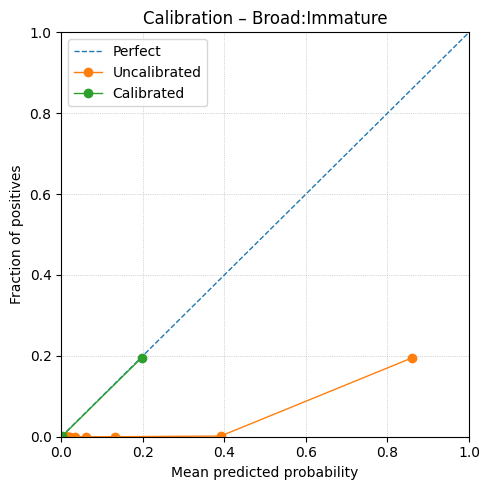

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Luecken/Models/Broad_Immature/Broad_Immature_bundle.joblib

Immature
               precision    recall  f1-score   support

           0       0.58      1.00      0.73       237
           1       0.99      0.28      0.44       237

    accuracy                           0.64       474
   macro avg       0.78      0.64      0.59       474
weighted avg       0.78      0.64      0.59       474


Processing Mature (class 2/2)...
Training - Found 1702 / 1702 barcodes
Training - Pos: 851, Neg: 851
Training labels: 851 pos, 851 neg
Testing  - Found 474 / 474 barcodes
Testing  - Pos: 237, Neg: 237
Testing labels: 237 pos, 237 neg
Calibrating - Found 7216 rows | Pos: 7121, Neg: 95
All test data: 18036 rows, positives for Mature: 17799
[scale] Mature: train mean ~ -0.000, std ~ 1.000

[NB] training → Mature
Fitting 10 folds for each of 10 cand

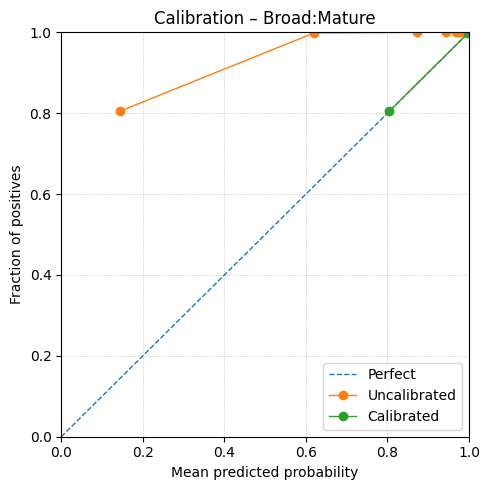

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Luecken/Models/Broad_Mature/Broad_Mature_bundle.joblib

Mature
               precision    recall  f1-score   support

           0       0.98      0.27      0.42       237
           1       0.58      1.00      0.73       237

    accuracy                           0.63       474
   macro avg       0.78      0.63      0.58       474
weighted avg       0.78      0.63      0.58       474


Fitting multiclass TemperatureScaling on CAL split...

Preview of probabilities BEFORE (raw OvR) vs AFTER (multiclass TS):
                         raw_Immature  raw_Mature  mc_Immature  mc_Mature true_label  pred_raw  pred_mc pred_raw_name pred_mc_name
TACAGGTGTTAGAGTA-1-s1d1      0.000003    0.999997     0.000001   0.999999     Mature         1        1        Mature       Mature
ATCCGTCAGGAGTATT-1-s1d1      0.000002    0.999997     0.000001   0.999

In [138]:
# -*- coding: utf-8 -*-
from pathlib import Path
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.ensemble import StackingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.calibration import CalibratedClassifierCV
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report, confusion_matrix

from netcal.scaling import TemperatureScaling
import joblib

# ------------------------------------------------------------------- CONFIG (expects these to already exist)
#   models_output, train_barcodes_path, test_barcodes_path
#   Luecken_data_Train, Luecken_data_Test, Luecken_data_Cal          (DataFrames indexed by barcode)
#   Luecken_dataset_Train, Luecken_dataset_Test, Luecken_dataset_Cal (AnnData with obs labels)
#   TotalSeqD_Heme_Oncology_CAT399906                    (iterable of feature names)
#   MLTraining module with: CV, train_NB, train_XGB, train_KNN, train_MLP,
#                           plot_calibration_curve, save_models, evaluate_classifier, append_metrics_csv

name_target_class = "Broad"   # "Broad" | "Simplified" | "Detailed"
fig_root   = Path(models_output) / "Figures"
models_dir = Path(models_output) / "Models"
fig_root.mkdir(parents=True, exist_ok=True)
models_dir.mkdir(parents=True, exist_ok=True)

kf         = MLTraining.CV
num_cores  = -1
metrics_log = []

# ============================= HELPERS =============================

def _norm_feats(names) -> pd.Index:
    """
    Normalizer used ONLY to construct matching keys.
    Panel names remain untouched; data columns are normalized and then mapped BACK
    to the exact panel names via a lookup.
    """
    s = pd.Index(map(str, names))
    s = (s.str.strip()
           .str.lower()
           .str.replace(r"[ _/]+", "-", regex=True)
           .str.replace(r"-+", "-", regex=True)
           .str.strip("-"))
    return s

def attach_celltype(df: pd.DataFrame, ad: "AnnData", field: str) -> pd.DataFrame:
    if field not in ad.obs:
        raise KeyError(f"'{field}' not found in AnnData.obs")
    lab = (ad.obs[field]
             .astype("string")
             .str.strip()
             .str.replace(r"\s+", "_", regex=True))
    out = df.copy()
    out["Celltype"] = pd.Categorical(lab.reindex(out.index))
    if out["Celltype"].isna().any():
        missing = int(out["Celltype"].isna().sum())
        print(f"[WARN] {missing} rows got NaN Celltype after reindex; check barcode alignment.")
    return out

def _check_finite(df: pd.DataFrame, tag: str):
    arr = df.to_numpy()
    if not np.isfinite(arr).all():
        bad = np.where(~np.isfinite(arr))
        raise ValueError(f"Non-finite values found in {tag} features at positions {bad}")

def _unwrap_estimator(m):
    return getattr(m, "estimator", None) or getattr(m, "base_estimator", None) or m

def _assert_feature_counts(cell_name: str, models_dict: dict, expected: int):
    pairs = [
        ("NB",  models_dict.get("NB")),
        ("XGB", models_dict.get("XGB")),
        ("KNN", models_dict.get("KNN")),
        ("MLP", models_dict.get("MLP")),
        ("Stacker", models_dict.get("Stacker")),
    ]
    for name, est in pairs:
        if est is None:
            continue
        base = _unwrap_estimator(est)
        nfi = getattr(base, "n_features_in_", None)
        if nfi is not None and nfi != expected:
            raise RuntimeError(f"{cell_name}:{name} saw {nfi} features; expected {expected}")

# ============================= LABEL ATTACH =============================

consensus_field = f"Consensus_annotation_{name_target_class.lower()}_final"

Luecken_data_Train = attach_celltype(Luecken_data_Train, Luecken_dataset_Train, consensus_field)
Luecken_data_Test  = attach_celltype(Luecken_data_Test,  Luecken_dataset_Test,  consensus_field)
Luecken_data_Cal   = attach_celltype(Luecken_data_Cal,   Luecken_dataset_Cal,   consensus_field)

# ============================= PANEL & DATA COLUMN ALIGNMENT =============================

# Keep the panel EXACTLY as provided
panel = pd.Index(map(str, TotalSeqD_Heme_Oncology_CAT399906))

# Build a mapping: normalized_key -> exact panel name
panel_keys    = _norm_feats(panel)
norm_to_panel = dict(zip(panel_keys, panel))
if len(norm_to_panel) != len(panel):
    raise ValueError("Panel contains names that collide after normalization. Consider adjusting _norm_feats rules.")

def _rename_data_to_panel(df: pd.DataFrame) -> pd.DataFrame:
    """
    Rename only feature columns so that after normalization they map
    back to the exact panel column names. Keeps 'cell_barcode' and 'Celltype' intact.
    """
    df = df.copy()
    non_feat = [c for c in ["cell_barcode", "Celltype"] if c in df.columns]
    feat     = pd.Index([c for c in df.columns if c not in non_feat])

    feat_keys   = _norm_feats(feat)
    mapped      = [norm_to_panel.get(k) for k in feat_keys]  # None if not in panel
    rename_map  = {old: new for old, new in zip(feat, mapped) if new is not None}

    # Handle duplicate mappings (two data columns → same panel col). Keep first, drop the rest.
    seen, safe_map, drops = set(), {}, []
    for old, new in rename_map.items():
        if new in seen:
            drops.append(old)
        else:
            seen.add(new); safe_map[old] = new

    if drops:
        print(f"[WARN] Dropping {len(drops)} duplicated-mapped columns (showing up to 5): {drops[:5]}")

    if drops:
        df.drop(columns=drops, inplace=True, errors="ignore")
    df.rename(columns=safe_map, inplace=True)

    matched = len(safe_map)
    print(f"[map] matched {matched}/{len(feat)} data columns to panel")
    return df

# Apply: normalize/rename ONLY data splits (panel remains untouched)
Luecken_data_Train = _rename_data_to_panel(Luecken_data_Train)
Luecken_data_Test  = _rename_data_to_panel(Luecken_data_Test)
Luecken_data_Cal   = _rename_data_to_panel(Luecken_data_Cal)

# Intersect each split with the panel IN PANEL ORDER
def _panel_intersection(df: pd.DataFrame) -> pd.DataFrame:
    non_feat = [c for c in ["cell_barcode", "Celltype"] if c in df.columns]
    feat_cols = pd.Index([c for c in df.columns if c not in non_feat])
    inter = panel.intersection(feat_cols, sort=False)
    if inter.empty:
        raise ValueError("Panel/Data intersection is empty after renaming. Check mapping rules.")
    return df.reindex(columns=list(inter) + non_feat)

Luecken_data_Train = _panel_intersection(Luecken_data_Train)
Luecken_data_Test  = _panel_intersection(Luecken_data_Test)
Luecken_data_Cal   = _panel_intersection(Luecken_data_Cal)

# ============================= FEATURES & LABELS =============================

Luecken_data_Cal_lbl = Luecken_data_Cal[["Celltype"]].copy()

drop_cols_train = [c for c in ["cell_barcode", "Celltype"] if c in Luecken_data_Train.columns]
drop_cols_test  = [c for c in ["cell_barcode", "Celltype"] if c in Luecken_data_Test.columns]
drop_cols_cal   = [c for c in ["cell_barcode", "Celltype"] if c in Luecken_data_Cal.columns]

Luecken_data_Train_Sub = Luecken_data_Train.drop(columns=drop_cols_train, errors="ignore")
Luecken_data_Test_Sub  = Luecken_data_Test.drop(columns=drop_cols_test,  errors="ignore")
Luecken_data_Cal_Sub   = Luecken_data_Cal.drop(columns=drop_cols_cal,    errors="ignore")

# SAFETY: shared columns & finiteness checks
cols_train = list(Luecken_data_Train_Sub.columns)
if list(Luecken_data_Test_Sub.columns) != cols_train or list(Luecken_data_Cal_Sub.columns) != cols_train:
    raise ValueError("Train/Cal/Test feature columns differ after panel intersection!")

_check_finite(Luecken_data_Train_Sub, "TRAIN")
_check_finite(Luecken_data_Test_Sub,  "TEST")
_check_finite(Luecken_data_Cal_Sub,   "CAL")

print(f"\n[features] Using {len(cols_train)} panel-intersected features (exact panel names):")
print(cols_train)

# Consistent class order
class_names  = sorted(pd.Series(Luecken_data_Train["Celltype"]).dropna().unique())
K            = len(class_names)
class_to_idx = {c: i for i, c in enumerate(class_names)}

# Multiclass labels arrays
s_cal = Luecken_data_Cal_lbl["Celltype"].map(class_to_idx)
if s_cal.isna().any():
    missing = Luecken_data_Cal_lbl.loc[s_cal.isna(), "Celltype"].unique()
    raise ValueError(f"Unknown labels in CAL split: {missing}")
y_cal_multiclass = s_cal.to_numpy(dtype=np.int64)

s_te = Luecken_data_Test["Celltype"].map(class_to_idx)
if s_te.isna().any():
    missing = Luecken_data_Test.loc[s_te.isna(), "Celltype"].unique()
    raise ValueError(f"Unknown labels in TEST split: {missing}")
y_test_multiclass = s_te.to_numpy(dtype=np.int64)

# Reuse across classes
X_cal_all_df = Luecken_data_Cal_Sub.copy()
X_te_all_df  = Luecken_data_Test_Sub.copy()

# Preallocate OvR prob mats
P_cal = np.zeros((X_cal_all_df.shape[0], K), dtype=float)
P_te  = np.zeros((X_te_all_df.shape[0],  K), dtype=float)

test_index = Luecken_data_Test_Sub.index

# ============================= TRAIN PER-CLASS OVR =============================

for celltype in class_names:
    k = class_to_idx[celltype]
    name = str(celltype).replace(" ", "_")
    print(f"\nProcessing {name} (class {k+1}/{K})...")

    # ---- TRAIN slice via barcode lists
    train_barcodes_df = pd.read_csv(
        f"{train_barcodes_path}/Luecken/Consensus_annotation_broad_final/Barcodes_training_class_{name}.csv",
        index_col=0
    )
    train_positive_barcodes = train_barcodes_df["Positive"].dropna().values
    train_negative_barcodes = train_barcodes_df["Negative"].dropna().values
    all_train_barcodes = np.concatenate([train_positive_barcodes, train_negative_barcodes])

    train_mask = Luecken_data_Train_Sub.index.isin(all_train_barcodes)
    X_tr_df = Luecken_data_Train_Sub.loc[train_mask]
    found_train_barcodes = X_tr_df.index.values
    y_tr = np.isin(found_train_barcodes, train_positive_barcodes).astype(int)

    # ---- Skip guards
    if X_tr_df.empty or np.unique(y_tr).size < 2:
        print(f"[SKIP] {name}: empty or single-class train slice (pos={y_tr.sum()}, neg={(len(y_tr)-y_tr.sum())}).")
        continue

    # ---- TEST slice via barcode lists
    test_barcodes_df = pd.read_csv(
        f"{test_barcodes_path}/Luecken/Consensus_annotation_broad_final/Barcodes_testing_class_{name}.csv",
        index_col=0
    )
    test_positive_barcodes = test_barcodes_df["Positive"].dropna().values
    test_negative_barcodes = test_barcodes_df["Negative"].dropna().values
    all_test_barcodes = np.concatenate([test_positive_barcodes, test_negative_barcodes])

    test_mask = Luecken_data_Test_Sub.index.isin(all_test_barcodes)
    X_te_df = Luecken_data_Test_Sub.loc[test_mask]
    found_test_barcodes = X_te_df.index.values
    y_te = np.isin(found_test_barcodes, test_positive_barcodes).astype(int)

    # ---- Full-test & cal for this binary head
    X_te_all_local = X_te_all_df.copy()
    y_te_all = (Luecken_data_Test["Celltype"].values == celltype).astype(int)
    X_cal_df = X_cal_all_df.copy()
    y_cal_bin = (Luecken_data_Cal_lbl["Celltype"].values == celltype).astype(int)

    # ---- Info
    print(f"Training - Found {X_tr_df.shape[0]} / {len(all_train_barcodes)} barcodes")
    print(f"Training - Pos: {len(train_positive_barcodes)}, Neg: {len(train_negative_barcodes)}")
    print(f"Training labels: {y_tr.sum()} pos, {len(y_tr)-y_tr.sum()} neg")
    print(f"Testing  - Found {X_te_df.shape[0]} / {len(all_test_barcodes)} barcodes")
    print(f"Testing  - Pos: {len(test_positive_barcodes)}, Neg: {len(test_negative_barcodes)}")
    print(f"Testing labels: {y_te.sum()} pos, {len(y_te)-y_te.sum()} neg")
    print(f"Calibrating - Found {X_cal_df.shape[0]} rows | Pos: {y_cal_bin.sum()}, Neg: {len(y_cal_bin)-y_cal_bin.sum()}")
    print(f"All test data: {X_te_all_local.shape[0]} rows, positives for {celltype}: {y_te_all.sum()}")

    # ---- Scaling (fit on per-head TRAIN slice; transform others)
    scaler = StandardScaler(with_mean=True, with_std=True).fit(X_tr_df.values)

    def _sc(df):
        return pd.DataFrame(
            scaler.transform(df.values),
            index=df.index,
            columns=cols_train,
        )

    X_tr_sc_df     = _sc(X_tr_df)
    X_te_sc_df     = _sc(X_te_df)
    X_te_all_sc_df = _sc(X_te_all_local)
    X_cal_sc_df    = _sc(X_cal_df)

    print(f"[scale] {name}: train mean ~ {X_tr_sc_df.values.mean():.3f}, std ~ {X_tr_sc_df.values.std():.3f}")

    # ---- Base learners
    NB_model  = MLTraining.train_NB (X_tr_sc_df, y_tr, cv=kf, num_cores=num_cores, name_target_subclass=name)
    XGB_model = MLTraining.train_XGB(X_tr_sc_df, y_tr, cv=kf, num_cores=num_cores, name_target_subclass=name)
    KNN_model = MLTraining.train_KNN(X_tr_sc_df, y_tr, cv=kf, num_cores=num_cores, name_target_subclass=name)
    MLP_model = MLTraining.train_MLP(X_tr_sc_df, y_tr, cv=kf, num_cores=num_cores, name_target_subclass=name)

    # ---- Stacker (raw)
    stacker_raw = StackingClassifier(
        estimators=[("NB", NB_model), ("XGB", XGB_model), ("KNN", KNN_model), ("MLP", MLP_model)],
        final_estimator=LogisticRegression(max_iter=2000, class_weight="balanced", random_state=42),
        stack_method="predict_proba",
        cv=kf,
        n_jobs=-1,
    ).fit(X_tr_sc_df, y_tr)

    # ---- Feature count asserts (debug safety)
    expected_feats = len(cols_train)
    _assert_feature_counts(name, {
        "NB": NB_model, "XGB": XGB_model, "KNN": KNN_model, "MLP": MLP_model, "Stacker": stacker_raw
    }, expected_feats)

    # ---- Binary calibration (Platt, guarded)
    pos_cal    = int(y_cal_bin.sum())
    n_cal_bin  = int(len(y_cal_bin))
    has_both   = (0 < pos_cal < n_cal_bin)
    print(f"[CAL] {name}: cal positives={pos_cal}/{n_cal_bin}")

    if has_both:
        try:
            calibrator = CalibratedClassifierCV(estimator=stacker_raw, method="sigmoid", cv="prefit")
        except TypeError:  # older sklearn
            calibrator = CalibratedClassifierCV(base_estimator=stacker_raw, method="sigmoid", cv="prefit")
        stacker = calibrator.fit(X_cal_sc_df, y_cal_bin)
    else:
        print(f"[WARN] Skipping calibration for {name}: single-class cal set.")
        stacker = stacker_raw

    # ---- Calibration plot on all-test (optional)
    try:
        y_proba_uncal = stacker_raw.predict_proba(X_te_all_sc_df)[:, 1]
        y_proba_cal   = stacker.predict_proba(X_te_all_sc_df)[:, 1]
        if has_both:
            _ = MLTraining.plot_calibration_curve(
                y_te_all, [y_proba_uncal, y_proba_cal],
                clf_names=["Uncalibrated", "Calibrated"],
                n_bins=15, strategy="quantile",
                title=f"Calibration – {name_target_class}:{name}"
            )
        else:
            _ = MLTraining.plot_calibration_curve(
                y_te_all, [y_proba_uncal],
                clf_names=["Uncalibrated"],
                n_bins=15, strategy="quantile",
                title=f"Calibration (uncal only) – {name_target_class}:{name}"
            )
        plt.tight_layout()
        plt.show()
    except Exception as e:
        print(f"[WARN] Skipped calibration plot for {name}: {e}")

    # ---- Save per-class bundle (model + scaler + columns)
    save_subdir = models_dir / f"{name_target_class}_{name}"
    save_subdir.mkdir(parents=True, exist_ok=True)

    MLTraining.save_models({"Stacked": stacker}, out_dir=save_subdir, tag=f"{name_target_class}_{name}")
    joblib.dump(cols_train, save_subdir / "feature_names.joblib")

    bundle = {
        "atlas": "Luecken",
        "depth": name_target_class,
        "label": celltype,
        "model": stacker,          # CalibratedClassifierCV(StackingClassifier) or StackingClassifier
        "columns": cols_train,     # exact panel names, panel order
        "scaler": scaler,          # per-head scaler
        "panel_name": "TotalSeqD_Heme_Oncology_CAT399906",
    }
    bundle_path = save_subdir / f"{name_target_class}_{name}_bundle.joblib"
    joblib.dump(bundle, bundle_path)
    print(f"[SAVE] Wrote bundle with columns+scaler to {bundle_path}")

    # ---- Binary metrics on the class-specific test slice
    try:
        m = MLTraining.evaluate_classifier(stacker, X_te_sc_df, y_te, plot_cm=False)
        m.update(celltype=celltype)
        metrics_log.append(m)
        print(f"\n{celltype}\n", m.get("report", ""))
    except Exception as e:
        print(f"[WARN] Binary metrics for {name} skipped: {e}")

    # ---- Store OvR probs for multiclass calibration
    P_cal[:, k] = stacker.predict_proba(X_cal_sc_df)[:, 1]
    P_te[:,  k] = stacker.predict_proba(X_te_all_sc_df)[:, 1]

# ============================= MULTICLASS CALIBRATION =============================

print("\nFitting multiclass TemperatureScaling on CAL split...")

# Guards: ensure probs are in [0,1]
if (P_cal < 0).any() or (P_cal > 1).any():
    raise ValueError("P_cal must be probabilities in [0,1].")
if (P_te < 0).any() or (P_te > 1).any():
    raise ValueError("P_te must be probabilities in [0,1].")

ts_cal = TemperatureScaling()
ts_cal.fit(P_cal, y_cal_multiclass)
P_te_mc = ts_cal.transform(P_te)

# Ensure calibrated probs shape (K)
P_te_mc = np.asarray(P_te_mc)
if P_te_mc.ndim == 1:
    P_te_mc = P_te_mc.reshape(-1, 1)
if P_te_mc.shape[1] == 1 and K == 2:
    P_te_mc = np.hstack([1.0 - P_te_mc, P_te_mc])
elif P_te_mc.shape[1] != K:
    # Fallback: normalize OvR sums
    row_sums = P_te.sum(axis=1, keepdims=True)
    row_sums[row_sums == 0.0] = 1.0
    P_te_mc = P_te / row_sums
    print(f"[WARN] TemperatureScaling returned shape {P_te_mc.shape}; fell back to sum-normalized OvR probs.")

# Persist multiclass temp scaler + class names
joblib.dump(ts_cal, models_dir / f"{name_target_class}_multiclass_temp_scaler.joblib")
(pd.Series(class_names, name="class_name")
   .to_csv(models_dir / f"{name_target_class}_class_names.csv", index=False))

# ============================= PROBS COMPARISON & METRICS =============================

probs_raw_df = pd.DataFrame(P_te,    index=test_index, columns=[f"raw_{c}" for c in class_names])
probs_mc_df  = pd.DataFrame(P_te_mc, index=test_index, columns=[f"mc_{c}"  for c in class_names])

probs_compare = pd.concat([probs_raw_df, probs_mc_df], axis=1)
probs_compare["true_label"]    = Luecken_data_Test["Celltype"].values
probs_compare["pred_raw"]      = P_te.argmax(axis=1)
probs_compare["pred_mc"]       = P_te_mc.argmax(axis=1)
probs_compare["pred_raw_name"] = [class_names[i] for i in probs_compare["pred_raw"].values]
probs_compare["pred_mc_name"]  = [class_names[i] for i in probs_compare["pred_mc"].values]

print("\nPreview of probabilities BEFORE (raw OvR) vs AFTER (multiclass TS):")
print(probs_compare.head(10).to_string())

probs_compare_path = models_dir / f"{name_target_class}_probabilities_before_after_TEST.csv"
probs_compare.to_csv(probs_compare_path, index=True)
print(f"\nSaved probabilities comparison to: {probs_compare_path}")

# Multiclass evaluation
y_pred_mc = P_te_mc.argmax(axis=1)
print("\nMulticlass classification report (TEST):")
print(classification_report(y_test_multiclass, y_pred_mc, target_names=class_names, digits=3))

cm = confusion_matrix(y_test_multiclass, y_pred_mc, labels=range(K))
print("Confusion matrix (rows=true, cols=pred):\n", cm)

# Per-class binary head metrics CSV
metrics_df = pd.DataFrame.from_records(metrics_log)
MLTraining.append_metrics_csv(metrics_df, csv_path=Path(models_output) / "stacker_metrics.csv")

print("\nDone.")


#### Simplified annotation

[map] matched 35/35 data columns to panel
[map] matched 35/35 data columns to panel
[map] matched 35/35 data columns to panel

[features] Using 35 panel-intersected features (exact panel names):
['HLA-DR', 'CD11b', 'CD11c', 'CD123', 'CD13', 'CD14', 'CD141', 'CD16', 'CD163', 'CD19', 'CD1c', 'CD2', 'CD22', 'CD25', 'CD3', 'CD303', 'CD304', 'CD33', 'CD38', 'CD4', 'CD44', 'CD45', 'CD45RA', 'CD45RO', 'CD49d', 'CD5', 'CD56', 'CD62L', 'CD62P', 'CD64', 'CD69', 'CD7', 'CD71', 'CD8', 'CD83']
[classes] Included (12): ['B', 'CD4_T', 'CD8_T', 'Erythroid', 'HSPC', 'Monocyte', 'Myeloid', 'NK', 'Other_T', 'Plasma', 'cDC', 'pDC']

Processing B (class 1/12)...
Training - Found 15410 / 15410 barcodes
Training - Pos: 7705, Neg: 7705
Training labels: 7705 pos, 7705 neg
Testing  - Found 4280 / 4280 barcodes
Testing  - Pos: 2140, Neg: 2140
Testing  - labels: 2140 pos, 2140 neg
Calibrating - Found 7216 rows | Pos: 856, Neg: 6360
All test data: 18036 rows, positives for B: 2140
[scale] B: train mean ~ -0.000, s

Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.



[KNN] training → B
Fitting 10 folds for each of 10 candidates, totalling 100 fits

[MLP] training → B
Fitting 10 folds for each of 10 candidates, totalling 100 fits


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


[CAL] B: cal positives=856/7216

Calibration metrics:
   Uncalibrated  |  Brier: 0.0040   LogLoss: 0.0176
     Calibrated  |  Brier: 0.0018   LogLoss: 0.0096


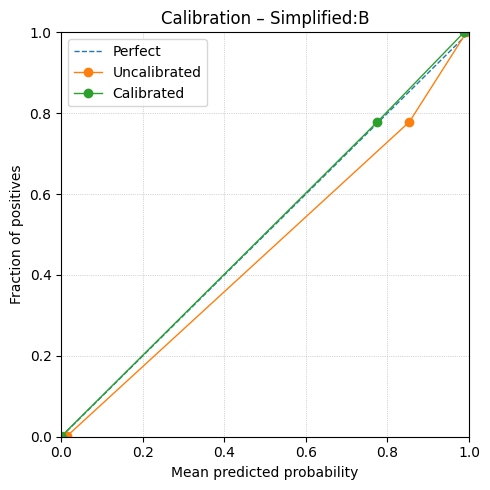

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Luecken/Models/Simplified_B/Simplified_B_bundle.joblib

B
               precision    recall  f1-score   support

           0       0.99      1.00      1.00      2140
           1       1.00      0.99      1.00      2140

    accuracy                           1.00      4280
   macro avg       1.00      1.00      1.00      4280
weighted avg       1.00      1.00      1.00      4280


Processing CD4_T (class 2/12)...
Training - Found 21832 / 21832 barcodes
Training - Pos: 10916, Neg: 10916
Training labels: 10916 pos, 10916 neg
Testing  - Found 6062 / 6062 barcodes
Testing  - Pos: 3031, Neg: 3031
Testing  - labels: 3031 pos, 3031 neg
Calibrating - Found 7216 rows | Pos: 1214, Neg: 6002
All test data: 18036 rows, positives for CD4_T: 3031
[scale] CD4_T: train mean ~ -0.000, std ~ 1.000

[NB] training → CD4_T
Fitting 10 folds for each of 1

Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid st


[KNN] training → CD4_T
Fitting 10 folds for each of 10 candidates, totalling 100 fits


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.



[MLP] training → CD4_T
Fitting 10 folds for each of 10 candidates, totalling 100 fits
[CAL] CD4_T: cal positives=1214/7216

Calibration metrics:
   Uncalibrated  |  Brier: 0.0052   LogLoss: 0.0239
     Calibrated  |  Brier: 0.0030   LogLoss: 0.0135


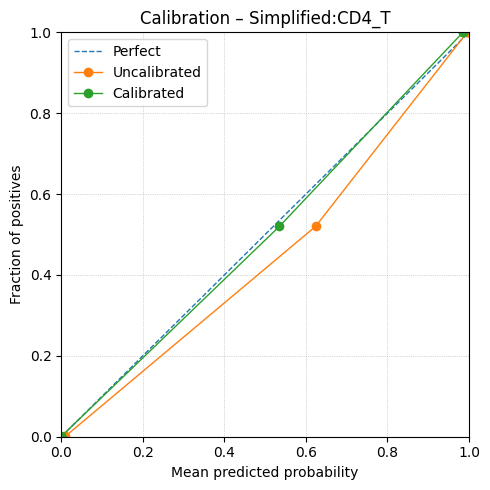

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Luecken/Models/Simplified_CD4_T/Simplified_CD4_T_bundle.joblib

CD4_T
               precision    recall  f1-score   support

           0       0.99      1.00      1.00      3031
           1       1.00      0.99      1.00      3031

    accuracy                           1.00      6062
   macro avg       1.00      1.00      1.00      6062
weighted avg       1.00      1.00      1.00      6062


Processing CD8_T (class 3/12)...
Training - Found 17186 / 17186 barcodes
Training - Pos: 8593, Neg: 8593
Training labels: 8593 pos, 8593 neg
Testing  - Found 4774 / 4774 barcodes
Testing  - Pos: 2387, Neg: 2387
Testing  - labels: 2387 pos, 2387 neg
Calibrating - Found 7216 rows | Pos: 955, Neg: 6261
All test data: 18036 rows, positives for CD8_T: 2387
[scale] CD8_T: train mean ~ -0.000, std ~ 1.000

[NB] training → CD8_T
Fitting 10 folds for ea

Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.



[KNN] training → CD8_T
Fitting 10 folds for each of 10 candidates, totalling 100 fits


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.



[MLP] training → CD8_T
Fitting 10 folds for each of 10 candidates, totalling 100 fits
[CAL] CD8_T: cal positives=955/7216

Calibration metrics:
   Uncalibrated  |  Brier: 0.0077   LogLoss: 0.0343
     Calibrated  |  Brier: 0.0044   LogLoss: 0.0185


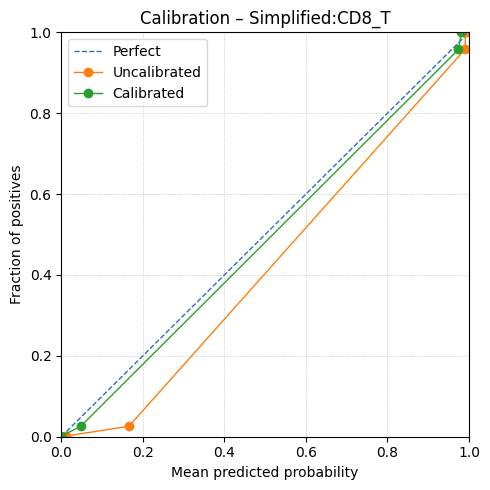

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Luecken/Models/Simplified_CD8_T/Simplified_CD8_T_bundle.joblib

CD8_T
               precision    recall  f1-score   support

           0       0.99      0.99      0.99      2387
           1       0.99      0.99      0.99      2387

    accuracy                           0.99      4774
   macro avg       0.99      0.99      0.99      4774
weighted avg       0.99      0.99      0.99      4774


Processing Erythroid (class 4/12)...
Training - Found 17590 / 17590 barcodes
Training - Pos: 8795, Neg: 8795
Training labels: 8795 pos, 8795 neg
Testing  - Found 4886 / 4886 barcodes
Testing  - Pos: 2443, Neg: 2443
Testing  - labels: 2443 pos, 2443 neg
Calibrating - Found 7216 rows | Pos: 977, Neg: 6239
All test data: 18036 rows, positives for Erythroid: 2443
[scale] Erythroid: train mean ~ 0.000, std ~ 1.000

[NB] training → Erythroid
Fitting 

Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.



[KNN] training → Erythroid
Fitting 10 folds for each of 10 candidates, totalling 100 fits

[MLP] training → Erythroid
Fitting 10 folds for each of 10 candidates, totalling 100 fits
[CAL] Erythroid: cal positives=977/7216

Calibration metrics:
   Uncalibrated  |  Brier: 0.0105   LogLoss: 0.0411
     Calibrated  |  Brier: 0.0064   LogLoss: 0.0266


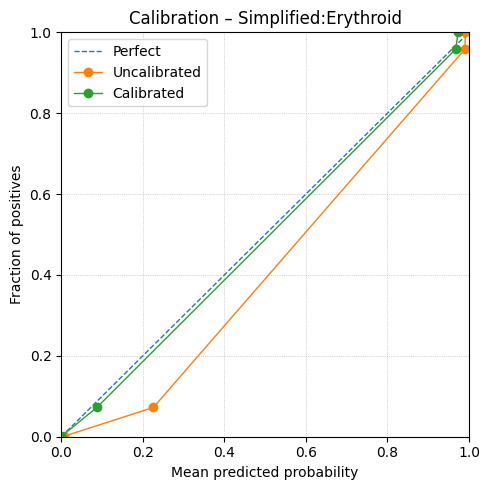

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Luecken/Models/Simplified_Erythroid/Simplified_Erythroid_bundle.joblib

Erythroid
               precision    recall  f1-score   support

           0       0.98      0.99      0.99      2443
           1       0.99      0.98      0.99      2443

    accuracy                           0.99      4886
   macro avg       0.99      0.99      0.99      4886
weighted avg       0.99      0.99      0.99      4886


Processing HSPC (class 5/12)...
Training - Found 1702 / 1702 barcodes
Training - Pos: 851, Neg: 851
Training labels: 851 pos, 851 neg
Testing  - Found 474 / 474 barcodes
Testing  - Pos: 237, Neg: 237
Testing  - labels: 237 pos, 237 neg
Calibrating - Found 7216 rows | Pos: 95, Neg: 7121
All test data: 18036 rows, positives for HSPC: 237
[scale] HSPC: train mean ~ -0.000, std ~ 1.000

[NB] training → HSPC
Fitting 10 folds for each of 

Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.



[KNN] training → HSPC
Fitting 10 folds for each of 10 candidates, totalling 100 fits

[MLP] training → HSPC
Fitting 10 folds for each of 10 candidates, totalling 100 fits
[CAL] HSPC: cal positives=95/7216

Calibration metrics:
   Uncalibrated  |  Brier: 0.0508   LogLoss: 0.1709
     Calibrated  |  Brier: 0.0080   LogLoss: 0.0254


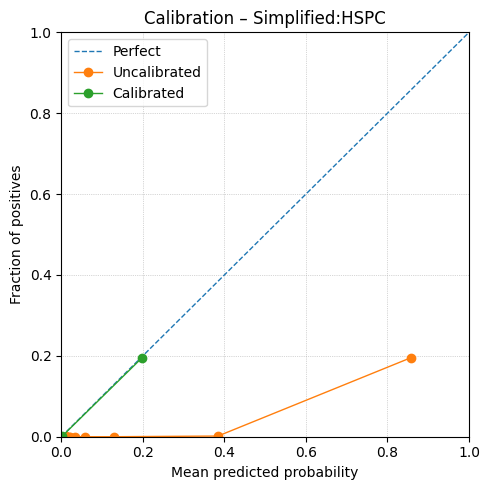

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Luecken/Models/Simplified_HSPC/Simplified_HSPC_bundle.joblib

HSPC
               precision    recall  f1-score   support

           0       0.59      1.00      0.74       237
           1       0.99      0.30      0.45       237

    accuracy                           0.65       474
   macro avg       0.79      0.65      0.60       474
weighted avg       0.79      0.65      0.60       474


Processing Monocyte (class 6/12)...
Training - Found 32784 / 32784 barcodes
Training - Pos: 16392, Neg: 16392
Training labels: 16392 pos, 16392 neg
Testing  - Found 9108 / 9108 barcodes
Testing  - Pos: 4554, Neg: 4554
Testing  - labels: 4554 pos, 4554 neg
Calibrating - Found 7216 rows | Pos: 1822, Neg: 5394
All test data: 18036 rows, positives for Monocyte: 4554
[scale] Monocyte: train mean ~ 0.000, std ~ 1.000

[NB] training → Monocyte
Fitting 10

Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.



[XGB] training → Monocyte
Fitting 10 folds for each of 10 candidates, totalling 100 fits


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid st


[KNN] training → Monocyte
Fitting 10 folds for each of 10 candidates, totalling 100 fits


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.



[MLP] training → Monocyte
Fitting 10 folds for each of 10 candidates, totalling 100 fits


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


[CAL] Monocyte: cal positives=1822/7216

Calibration metrics:
   Uncalibrated  |  Brier: 0.0193   LogLoss: 0.0701
     Calibrated  |  Brier: 0.0107   LogLoss: 0.0477


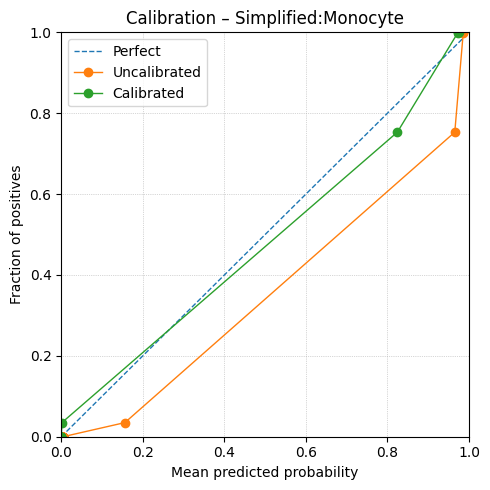

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Luecken/Models/Simplified_Monocyte/Simplified_Monocyte_bundle.joblib

Monocyte
               precision    recall  f1-score   support

           0       0.98      0.99      0.98      4554
           1       0.99      0.98      0.98      4554

    accuracy                           0.98      9108
   macro avg       0.98      0.98      0.98      9108
weighted avg       0.98      0.98      0.98      9108


Processing Myeloid (class 7/12)...
Training - Found 5898 / 5898 barcodes
Training - Pos: 2949, Neg: 2949
Training labels: 2949 pos, 2949 neg
Testing  - Found 1638 / 1638 barcodes
Testing  - Pos: 819, Neg: 819
Testing  - labels: 819 pos, 819 neg
Calibrating - Found 7216 rows | Pos: 328, Neg: 6888
All test data: 18036 rows, positives for Myeloid: 819
[scale] Myeloid: train mean ~ -0.000, std ~ 1.000

[NB] training → Myeloid
Fitting 10 fo

Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.



[KNN] training → Myeloid
Fitting 10 folds for each of 10 candidates, totalling 100 fits

[MLP] training → Myeloid
Fitting 10 folds for each of 10 candidates, totalling 100 fits
[CAL] Myeloid: cal positives=328/7216

Calibration metrics:
   Uncalibrated  |  Brier: 0.0398   LogLoss: 0.1379
     Calibrated  |  Brier: 0.0164   LogLoss: 0.0513


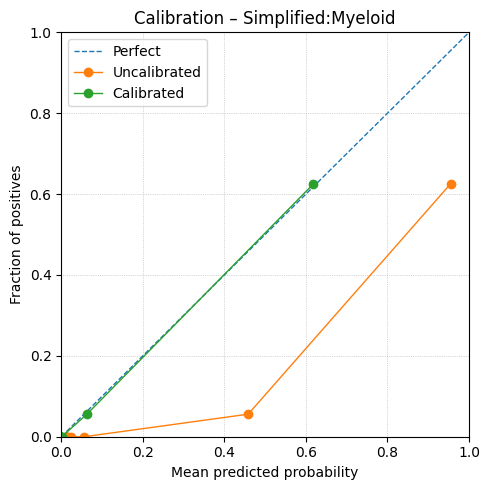

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Luecken/Models/Simplified_Myeloid/Simplified_Myeloid_bundle.joblib

Myeloid
               precision    recall  f1-score   support

           0       0.86      0.98      0.92       819
           1       0.98      0.84      0.90       819

    accuracy                           0.91      1638
   macro avg       0.92      0.91      0.91      1638
weighted avg       0.92      0.91      0.91      1638


Processing NK (class 8/12)...
Training - Found 12016 / 12016 barcodes
Training - Pos: 6008, Neg: 6008
Training labels: 6008 pos, 6008 neg
Testing  - Found 3336 / 3336 barcodes
Testing  - Pos: 1668, Neg: 1668
Testing  - labels: 1668 pos, 1668 neg
Calibrating - Found 7216 rows | Pos: 667, Neg: 6549
All test data: 18036 rows, positives for NK: 1668
[scale] NK: train mean ~ 0.000, std ~ 1.000

[NB] training → NK
Fitting 10 folds for each of 1

Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.



[MLP] training → NK
Fitting 10 folds for each of 10 candidates, totalling 100 fits
[CAL] NK: cal positives=667/7216

Calibration metrics:
   Uncalibrated  |  Brier: 0.0022   LogLoss: 0.0107
     Calibrated  |  Brier: 0.0017   LogLoss: 0.0076


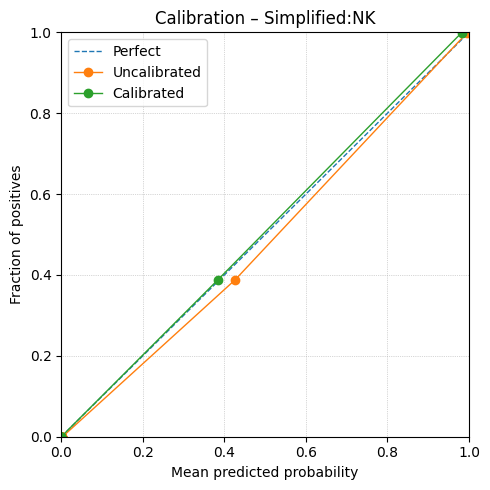

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Luecken/Models/Simplified_NK/Simplified_NK_bundle.joblib

NK
               precision    recall  f1-score   support

           0       0.99      1.00      0.99      1668
           1       1.00      0.99      0.99      1668

    accuracy                           0.99      3336
   macro avg       0.99      0.99      0.99      3336
weighted avg       0.99      0.99      0.99      3336


Processing Other_T (class 9/12)...
Training - Found 132 / 132 barcodes
Training - Pos: 66, Neg: 66
Training labels: 66 pos, 66 neg
Testing  - Found 36 / 36 barcodes
Testing  - Pos: 18, Neg: 18
Testing  - labels: 18 pos, 18 neg
Calibrating - Found 7216 rows | Pos: 7, Neg: 7209
All test data: 18036 rows, positives for Other_T: 18
[scale] Other_T: train mean ~ -0.000, std ~ 1.000

[NB] training → Other_T
Fitting 10 folds for each of 10 candidates, totallin

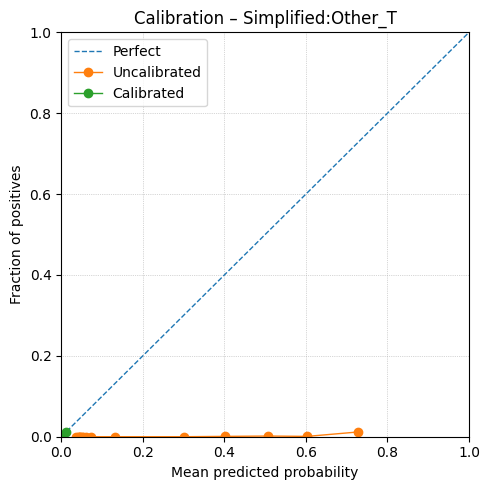

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Luecken/Models/Simplified_Other_T/Simplified_Other_T_bundle.joblib

Other_T
               precision    recall  f1-score   support

           0       0.50      1.00      0.67        18
           1       0.00      0.00      0.00        18

    accuracy                           0.50        36
   macro avg       0.25      0.50      0.33        36
weighted avg       0.25      0.50      0.33        36


Processing Plasma (class 10/12)...
Training - Found 892 / 892 barcodes
Training - Pos: 446, Neg: 446
Training labels: 446 pos, 446 neg
Testing  - Found 248 / 248 barcodes
Testing  - Pos: 124, Neg: 124
Testing  - labels: 124 pos, 124 neg
Calibrating - Found 7216 rows | Pos: 49, Neg: 7167
All test data: 18036 rows, positives for Plasma: 124
[scale] Plasma: train mean ~ -0.000, std ~ 1.000

[NB] training → Plasma
Fitting 10 folds for each of

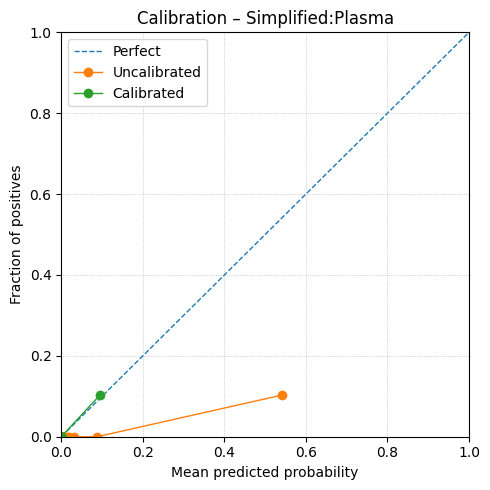

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Luecken/Models/Simplified_Plasma/Simplified_Plasma_bundle.joblib

Plasma
               precision    recall  f1-score   support

           0       0.92      1.00      0.96       124
           1       1.00      0.91      0.95       124

    accuracy                           0.96       248
   macro avg       0.96      0.96      0.96       248
weighted avg       0.96      0.96      0.96       248


Processing cDC (class 11/12)...
Training - Found 1594 / 1594 barcodes
Training - Pos: 797, Neg: 797
Training labels: 797 pos, 797 neg
Testing  - Found 442 / 442 barcodes
Testing  - Pos: 221, Neg: 221
Testing  - labels: 221 pos, 221 neg
Calibrating - Found 7216 rows | Pos: 89, Neg: 7127
All test data: 18036 rows, positives for cDC: 221
[scale] cDC: train mean ~ -0.000, std ~ 1.000

[NB] training → cDC
Fitting 10 folds for each of 10 candidate

Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.



[KNN] training → cDC
Fitting 10 folds for each of 10 candidates, totalling 100 fits

[MLP] training → cDC
Fitting 10 folds for each of 10 candidates, totalling 100 fits
[CAL] cDC: cal positives=89/7216

Calibration metrics:
   Uncalibrated  |  Brier: 0.0461   LogLoss: 0.1637
     Calibrated  |  Brier: 0.0052   LogLoss: 0.0194


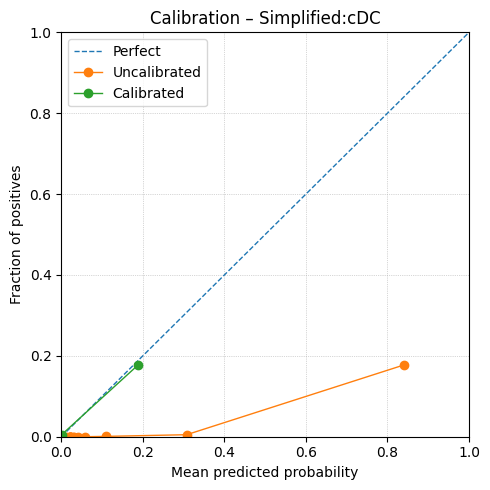

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Luecken/Models/Simplified_cDC/Simplified_cDC_bundle.joblib

cDC
               precision    recall  f1-score   support

           0       0.79      1.00      0.88       221
           1       1.00      0.74      0.85       221

    accuracy                           0.87       442
   macro avg       0.90      0.87      0.87       442
weighted avg       0.90      0.87      0.87       442


Processing pDC (class 12/12)...
Training - Found 2834 / 2834 barcodes
Training - Pos: 1417, Neg: 1417
Training labels: 1417 pos, 1417 neg
Testing  - Found 788 / 788 barcodes
Testing  - Pos: 394, Neg: 394
Testing  - labels: 394 pos, 394 neg
Calibrating - Found 7216 rows | Pos: 157, Neg: 7059
All test data: 18036 rows, positives for pDC: 394
[scale] pDC: train mean ~ -0.000, std ~ 1.000

[NB] training → pDC
Fitting 10 folds for each of 10 candidates, t

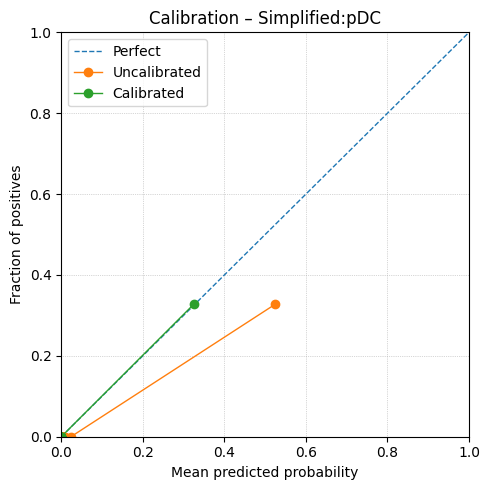

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Luecken/Models/Simplified_pDC/Simplified_pDC_bundle.joblib

pDC
               precision    recall  f1-score   support

           0       0.99      1.00      1.00       394
           1       1.00      0.99      1.00       394

    accuracy                           1.00       788
   macro avg       1.00      1.00      1.00       788
weighted avg       1.00      1.00      1.00       788


Fitting multiclass TemperatureScaling on CAL split (excluded classes masked out)...

Preview of probabilities BEFORE (raw OvR) vs AFTER (multiclass TS) [included classes only]:
                                raw_B  raw_CD4_T  raw_CD8_T  raw_Erythroid  raw_HSPC  raw_Monocyte  raw_Myeloid    raw_NK   raw_Other_T    raw_Plasma   raw_cDC       raw_pDC          mc_B  mc_CD4_T  mc_CD8_T  mc_Erythroid   mc_HSPC   mc_Monocyte  mc_Myeloid     mc_NK    mc_Oth

In [139]:
# -*- coding: utf-8 -*-
from pathlib import Path
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.ensemble import StackingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.calibration import CalibratedClassifierCV
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report, confusion_matrix

from netcal.scaling import TemperatureScaling
import joblib

# ------------------------------------------------------------------- CONFIG (expects these to already exist)
#   models_output, train_barcodes_path, test_barcodes_path
#   Luecken_data_Train, Luecken_data_Test, Luecken_data_Cal          (DataFrames indexed by barcode)
#   Luecken_dataset_Train, Luecken_dataset_Test, Luecken_dataset_Cal (AnnData with obs labels)
#   TotalSeqD_Heme_Oncology_CAT399906                    (iterable of feature names)
#   MLTraining module with: CV, train_NB, train_XGB, train_KNN, train_MLP,
#                           plot_calibration_curve, save_models, evaluate_classifier, append_metrics_csv

name_target_class = "Simplified"   # "simplified" | "Simplified" | "Detailed"
fig_root   = Path(models_output) / "Figures"
models_dir = Path(models_output) / "Models"
fig_root.mkdir(parents=True, exist_ok=True)
models_dir.mkdir(parents=True, exist_ok=True)

kf         = MLTraining.CV
num_cores  = -1
metrics_log = []

# ============================= HELPERS =============================

def _norm_feats(names) -> pd.Index:
    """
    Normalizer used ONLY to construct matching keys.
    Panel names remain untouched; data columns are normalized and then mapped BACK
    to the exact panel names via a lookup.
    """
    s = pd.Index(map(str, names))
    s = (s.str.strip()
           .str.lower()
           .str.replace(r"[ _/]+", "-", regex=True)
           .str.replace(r"-+", "-", regex=True)
           .str.strip("-"))
    return s

def attach_celltype(df: pd.DataFrame, ad: "AnnData", field: str) -> pd.DataFrame:
    if field not in ad.obs:
        raise KeyError(f"'{field}' not found in AnnData.obs")
    lab = (ad.obs[field]
             .astype("string")
             .str.strip()
             .str.replace(r"\s+", "_", regex=True))
    out = df.copy()
    out["Celltype"] = pd.Categorical(lab.reindex(out.index))
    if out["Celltype"].isna().any():
        missing = int(out["Celltype"].isna().sum())
        print(f"[WARN] {missing} rows got NaN Celltype after reindex; check barcode alignment.")
    return out

def _check_finite(df: pd.DataFrame, tag: str):
    arr = df.to_numpy()
    if not np.isfinite(arr).all():
        bad = np.where(~np.isfinite(arr))
        raise ValueError(f"Non-finite values found in {tag} features at positions {bad}")

def _unwrap_estimator(m):
    return getattr(m, "estimator", None) or getattr(m, "base_estimator", None) or m

def _assert_feature_counts(cell_name: str, models_dict: dict, expected: int):
    pairs = [
        ("NB",  models_dict.get("NB")),
        ("XGB", models_dict.get("XGB")),
        ("KNN", models_dict.get("KNN")),
        ("MLP", models_dict.get("MLP")),
        ("Stacker", models_dict.get("Stacker")),
    ]
    for name, est in pairs:
        if est is None:
            continue
        base = _unwrap_estimator(est)
        nfi = getattr(base, "n_features_in_", None)
        if nfi is not None and nfi != expected:
            raise RuntimeError(f"{cell_name}:{name} saw {nfi} features; expected {expected}")

# ============================= LABEL ATTACH =============================

consensus_field = f"Consensus_annotation_{name_target_class.lower()}_final"

Luecken_data_Train = attach_celltype(Luecken_data_Train, Luecken_dataset_Train, consensus_field)
Luecken_data_Test  = attach_celltype(Luecken_data_Test,  Luecken_dataset_Test,  consensus_field)
Luecken_data_Cal   = attach_celltype(Luecken_data_Cal,   Luecken_dataset_Cal,   consensus_field)

# ============================= PANEL & DATA COLUMN ALIGNMENT =============================

# Keep the panel EXACTLY as provided
panel = pd.Index(map(str, TotalSeqD_Heme_Oncology_CAT399906))

# Build a mapping: normalized_key -> exact panel name
panel_keys    = _norm_feats(panel)
norm_to_panel = dict(zip(panel_keys, panel))
if len(norm_to_panel) != len(panel):
    raise ValueError("Panel contains names that collide after normalization. Consider adjusting _norm_feats rules.")

def _rename_data_to_panel(df: pd.DataFrame) -> pd.DataFrame:
    """
    Rename only feature columns so that after normalization they map
    back to the exact panel column names. Keeps 'cell_barcode' and 'Celltype' intact.
    """
    df = df.copy()
    non_feat = [c for c in ["cell_barcode", "Celltype"] if c in df.columns]
    feat     = pd.Index([c for c in df.columns if c not in non_feat])

    feat_keys   = _norm_feats(feat)
    mapped      = [norm_to_panel.get(k) for k in feat_keys]  # None if not in panel
    rename_map  = {old: new for old, new in zip(feat, mapped) if new is not None}

    # Handle duplicate mappings (two data columns → same panel col). Keep first, drop the rest.
    seen, safe_map, drops = set(), {}, []
    for old, new in rename_map.items():
        if new in seen:
            drops.append(old)
        else:
            seen.add(new); safe_map[old] = new

    if drops:
        print(f"[WARN] Dropping {len(drops)} duplicated-mapped columns (showing up to 5): {drops[:5]}")

    if drops:
        df.drop(columns=drops, inplace=True, errors="ignore")
    df.rename(columns=safe_map, inplace=True)

    matched = len(safe_map)
    print(f"[map] matched {matched}/{len(feat)} data columns to panel")
    return df

# Apply: normalize/rename ONLY data splits (panel remains untouched)
Luecken_data_Train = _rename_data_to_panel(Luecken_data_Train)
Luecken_data_Test  = _rename_data_to_panel(Luecken_data_Test)
Luecken_data_Cal   = _rename_data_to_panel(Luecken_data_Cal)

# Intersect each split with the panel IN PANEL ORDER
def _panel_intersection(df: pd.DataFrame) -> pd.DataFrame:
    non_feat = [c for c in ["cell_barcode", "Celltype"] if c in df.columns]
    feat_cols = pd.Index([c for c in df.columns if c not in non_feat])
    inter = panel.intersection(feat_cols, sort=False)
    if inter.empty:
        raise ValueError("Panel/Data intersection is empty after renaming. Check mapping rules.")
    return df.reindex(columns=list(inter) + non_feat)

Luecken_data_Train = _panel_intersection(Luecken_data_Train)
Luecken_data_Test  = _panel_intersection(Luecken_data_Test)
Luecken_data_Cal   = _panel_intersection(Luecken_data_Cal)

# ============================= FEATURES & LABELS =============================

Luecken_data_Cal_lbl = Luecken_data_Cal[["Celltype"]].copy()

drop_cols_train = [c for c in ["cell_barcode", "Celltype"] if c in Luecken_data_Train.columns]
drop_cols_test  = [c for c in ["cell_barcode", "Celltype"] if c in Luecken_data_Test.columns]
drop_cols_cal   = [c for c in ["cell_barcode", "Celltype"] if c in Luecken_data_Cal.columns]

Luecken_data_Train_Sub = Luecken_data_Train.drop(columns=drop_cols_train, errors="ignore")
Luecken_data_Test_Sub  = Luecken_data_Test.drop(columns=drop_cols_test,  errors="ignore")
Luecken_data_Cal_Sub   = Luecken_data_Cal.drop(columns=drop_cols_cal,    errors="ignore")

# SAFETY: shared columns & finiteness checks
cols_train = list(Luecken_data_Train_Sub.columns)
if list(Luecken_data_Test_Sub.columns) != cols_train or list(Luecken_data_Cal_Sub.columns) != cols_train:
    raise ValueError("Train/Cal/Test feature columns differ after panel intersection!")

_check_finite(Luecken_data_Train_Sub, "TRAIN")
_check_finite(Luecken_data_Test_Sub,  "TEST")
_check_finite(Luecken_data_Cal_Sub,   "CAL")

print(f"\n[features] Using {len(cols_train)} panel-intersected features (exact panel names):")
print(cols_train)

# ===== Exclude specific classes from the multiclass set and per-class loop =====
EXCLUDE_CLASSES = {"Macrophage", "ILC", "Stroma"}

all_classes = sorted(pd.Series(Luecken_data_Train["Celltype"]).dropna().unique())
class_names = [c for c in all_classes if c not in EXCLUDE_CLASSES]
if not class_names:
    raise ValueError("After exclusions, class_names is empty.")
print(f"[classes] Included ({len(class_names)}): {class_names}")
if missing := [c for c in all_classes if c in EXCLUDE_CLASSES]:
    print(f"[classes] Excluded: {missing}")

K            = len(class_names)
class_to_idx = {c: i for i, c in enumerate(class_names)}

# --- Multiclass labels (MASKED to included classes) ---
# CAL
mask_cal_mc = Luecken_data_Cal_lbl["Celltype"].isin(class_names)
s_cal = Luecken_data_Cal_lbl.loc[mask_cal_mc, "Celltype"].map(class_to_idx)
if s_cal.isna().any():
    missing = Luecken_data_Cal_lbl.loc[mask_cal_mc & s_cal.isna(), "Celltype"].unique()
    raise ValueError(f"Unknown labels in masked CAL split: {missing}")
y_cal_multiclass = s_cal.to_numpy(dtype=np.int64)

# TEST
mask_test_mc = Luecken_data_Test["Celltype"].isin(class_names)
s_te = Luecken_data_Test.loc[mask_test_mc, "Celltype"].map(class_to_idx)
if s_te.isna().any():
    missing = Luecken_data_Test.loc[mask_test_mc & s_te.isna(), "Celltype"].unique()
    raise ValueError(f"Unknown labels in masked TEST split: {missing}")
y_test_multiclass = s_te.to_numpy(dtype=np.int64)

# Reuse across classes
X_cal_all_df = Luecken_data_Cal_Sub.copy()
X_te_all_df  = Luecken_data_Test_Sub.copy()

# Preallocate OvR prob mats (only for included classes)
P_cal = np.zeros((X_cal_all_df.shape[0], K), dtype=float)
P_te  = np.zeros((X_te_all_df.shape[0],  K), dtype=float)

test_index = Luecken_data_Test_Sub.index

# ============================= TRAIN PER-CLASS OVR =============================

for celltype in class_names:
    k = class_to_idx[celltype]
    name = str(celltype).replace(" ", "_")
    print(f"\nProcessing {name} (class {k+1}/{K})...")

    # ---- TRAIN slice via barcode lists
    train_barcodes_df = pd.read_csv(
        f"{train_barcodes_path}/Luecken/Consensus_annotation_simplified_final/Barcodes_training_class_{name}.csv",
        index_col=0
    )
    train_positive_barcodes = train_barcodes_df["Positive"].dropna().values
    train_negative_barcodes = train_barcodes_df["Negative"].dropna().values
    all_train_barcodes = np.concatenate([train_positive_barcodes, train_negative_barcodes])

    train_mask = Luecken_data_Train_Sub.index.isin(all_train_barcodes)
    X_tr_df = Luecken_data_Train_Sub.loc[train_mask]
    found_train_barcodes = X_tr_df.index.values
    y_tr = np.isin(found_train_barcodes, train_positive_barcodes).astype(int)

    # ---- Skip guards
    if X_tr_df.empty or np.unique(y_tr).size < 2:
        print(f"[SKIP] {name}: empty or single-class train slice (pos={y_tr.sum()}, neg={(len(y_tr)-y_tr.sum())}).")
        continue

    # ---- TEST slice via barcode lists
    test_barcodes_df = pd.read_csv(
        f"{test_barcodes_path}/Luecken/Consensus_annotation_simplified_final/Barcodes_testing_class_{name}.csv",
        index_col=0
    )
    test_positive_barcodes = test_barcodes_df["Positive"].dropna().values
    test_negative_barcodes = test_barcodes_df["Negative"].dropna().values
    all_test_barcodes = np.concatenate([test_positive_barcodes, test_negative_barcodes])

    test_mask = Luecken_data_Test_Sub.index.isin(all_test_barcodes)
    X_te_df = Luecken_data_Test_Sub.loc[test_mask]
    found_test_barcodes = X_te_df.index.values
    y_te = np.isin(found_test_barcodes, test_positive_barcodes).astype(int)

    # ---- Full-test & cal for this binary head
    X_te_all_local = X_te_all_df.copy()
    y_te_all = (Luecken_data_Test["Celltype"].values == celltype).astype(int)
    X_cal_df = X_cal_all_df.copy()
    y_cal_bin = (Luecken_data_Cal_lbl["Celltype"].values == celltype).astype(int)

    # ---- Info
    print(f"Training - Found {X_tr_df.shape[0]} / {len(all_train_barcodes)} barcodes")
    print(f"Training - Pos: {len(train_positive_barcodes)}, Neg: {len(train_negative_barcodes)}")
    print(f"Training labels: {y_tr.sum()} pos, {len(y_tr)-y_tr.sum()} neg")
    print(f"Testing  - Found {X_te_df.shape[0]} / {len(all_test_barcodes)} barcodes")
    print(f"Testing  - Pos: {len(test_positive_barcodes)}, Neg: {len(test_negative_barcodes)}")
    print(f"Testing  - labels: {y_te.sum()} pos, {len(y_te)-y_te.sum()} neg")
    print(f"Calibrating - Found {X_cal_df.shape[0]} rows | Pos: {y_cal_bin.sum()}, Neg: {len(y_cal_bin)-y_cal_bin.sum()}")
    print(f"All test data: {X_te_all_local.shape[0]} rows, positives for {celltype}: {y_te_all.sum()}")

    # ---- Scaling (fit on per-head TRAIN slice; transform others)
    scaler = StandardScaler(with_mean=True, with_std=True).fit(X_tr_df.values)

    def _sc(df):
        return pd.DataFrame(
            scaler.transform(df.values),
            index=df.index,
            columns=cols_train,
        )

    X_tr_sc_df     = _sc(X_tr_df)
    X_te_sc_df     = _sc(X_te_df)
    X_te_all_sc_df = _sc(X_te_all_local)
    X_cal_sc_df    = _sc(X_cal_df)

    print(f"[scale] {name}: train mean ~ {X_tr_sc_df.values.mean():.3f}, std ~ {X_tr_sc_df.values.std():.3f}")

    # ---- Base learners
    NB_model  = MLTraining.train_NB (X_tr_sc_df, y_tr, cv=kf, num_cores=num_cores, name_target_subclass=name)
    XGB_model = MLTraining.train_XGB(X_tr_sc_df, y_tr, cv=kf, num_cores=num_cores, name_target_subclass=name)
    KNN_model = MLTraining.train_KNN(X_tr_sc_df, y_tr, cv=kf, num_cores=num_cores, name_target_subclass=name)
    MLP_model = MLTraining.train_MLP(X_tr_sc_df, y_tr, cv=kf, num_cores=num_cores, name_target_subclass=name)

    # ---- Stacker (raw)
    stacker_raw = StackingClassifier(
        estimators=[("NB", NB_model), ("XGB", XGB_model), ("KNN", KNN_model), ("MLP", MLP_model)],
        final_estimator=LogisticRegression(max_iter=2000, class_weight="balanced", random_state=42),
        stack_method="predict_proba",
        cv=kf,
        n_jobs=-1,
    ).fit(X_tr_sc_df, y_tr)

    # ---- Feature count asserts (debug safety)
    expected_feats = len(cols_train)
    _assert_feature_counts(name, {
        "NB": NB_model, "XGB": XGB_model, "KNN": KNN_model, "MLP": MLP_model, "Stacker": stacker_raw
    }, expected_feats)

    # ---- Binary calibration (Platt, guarded)
    pos_cal    = int(y_cal_bin.sum())
    n_cal_bin  = int(len(y_cal_bin))
    has_both   = (0 < pos_cal < n_cal_bin)
    print(f"[CAL] {name}: cal positives={pos_cal}/{n_cal_bin}")

    if has_both:
        try:
            calibrator = CalibratedClassifierCV(estimator=stacker_raw, method="sigmoid", cv="prefit")
        except TypeError:  # older sklearn
            calibrator = CalibratedClassifierCV(base_estimator=stacker_raw, method="sigmoid", cv="prefit")
        stacker = calibrator.fit(X_cal_sc_df, y_cal_bin)
    else:
        print(f"[WARN] Skipping calibration for {name}: single-class cal set.")
        stacker = stacker_raw

    # ---- Calibration plot on all-test (optional)
    try:
        y_proba_uncal = stacker_raw.predict_proba(X_te_all_sc_df)[:, 1]
        y_proba_cal   = stacker.predict_proba(X_te_all_sc_df)[:, 1]
        if has_both:
            _ = MLTraining.plot_calibration_curve(
                y_te_all, [y_proba_uncal, y_proba_cal],
                clf_names=["Uncalibrated", "Calibrated"],
                n_bins=15, strategy="quantile",
                title=f"Calibration – {name_target_class}:{name}"
            )
        else:
            _ = MLTraining.plot_calibration_curve(
                y_te_all, [y_proba_uncal],
                clf_names=["Uncalibrated"],
                n_bins=15, strategy="quantile",
                title=f"Calibration (uncal only) – {name_target_class}:{name}"
            )
        plt.tight_layout()
        plt.show()
    except Exception as e:
        print(f"[WARN] Skipped calibration plot for {name}: {e}")

    # ---- Save per-class bundle (model + scaler + columns)
    save_subdir = models_dir / f"{name_target_class}_{name}"
    save_subdir.mkdir(parents=True, exist_ok=True)

    MLTraining.save_models({"Stacked": stacker}, out_dir=save_subdir, tag=f"{name_target_class}_{name}")
    joblib.dump(cols_train, save_subdir / "feature_names.joblib")

    bundle = {
        "atlas": "Luecken",
        "depth": name_target_class,
        "label": celltype,
        "model": stacker,          # CalibratedClassifierCV(StackingClassifier) or StackingClassifier
        "columns": cols_train,     # exact panel names, panel order
        "scaler": scaler,          # per-head scaler
        "panel_name": "TotalSeqD_Heme_Oncology_CAT399906",
    }
    bundle_path = save_subdir / f"{name_target_class}_{name}_bundle.joblib"
    joblib.dump(bundle, bundle_path)
    print(f"[SAVE] Wrote bundle with columns+scaler to {bundle_path}")

    # ---- Binary metrics on the class-specific test slice
    try:
        m = MLTraining.evaluate_classifier(stacker, X_te_sc_df, y_te, plot_cm=False)
        m.update(celltype=celltype)
        metrics_log.append(m)
        print(f"\n{celltype}\n", m.get("report", ""))
    except Exception as e:
        print(f"[WARN] Binary metrics for {name} skipped: {e}")

    # ---- Store OvR probs for multiclass calibration (columns order = class_names)
    P_cal[:, k] = stacker.predict_proba(X_cal_sc_df)[:, 1]
    P_te[:,  k] = stacker.predict_proba(X_te_all_sc_df)[:, 1]

# ============================= MULTICLASS CALIBRATION =============================

print("\nFitting multiclass TemperatureScaling on CAL split (excluded classes masked out)...")

# Guards: ensure probs are in [0,1]
if (P_cal < 0).any() or (P_cal > 1).any():
    raise ValueError("P_cal must be probabilities in [0,1].")
if (P_te < 0).any() or (P_te > 1).any():
    raise ValueError("P_te must be probabilities in [0,1].")

ts_cal = TemperatureScaling()
# Fit only on CAL rows whose true label is one of the included classes
ts_cal.fit(P_cal[mask_cal_mc.values, :], y_cal_multiclass)
P_te_mc = ts_cal.transform(P_te)

# Ensure calibrated probs shape (K)
P_te_mc = np.asarray(P_te_mc)
if P_te_mc.ndim == 1:
    P_te_mc = P_te_mc.reshape(-1, 1)
if P_te_mc.shape[1] == 1 and K == 2:
    P_te_mc = np.hstack([1.0 - P_te_mc, P_te_mc])
elif P_te_mc.shape[1] != K:
    # Fallback: normalize OvR sums
    row_sums = P_te.sum(axis=1, keepdims=True)
    row_sums[row_sums == 0.0] = 1.0
    P_te_mc = P_te / row_sums
    print(f"[WARN] TemperatureScaling returned shape {P_te_mc.shape}; fell back to sum-normalized OvR probs.")

# Persist multiclass temp scaler + INCLUDED class names
joblib.dump(ts_cal, models_dir / f"{name_target_class}_multiclass_temp_scaler.joblib")
(pd.Series(class_names, name="class_name")
   .to_csv(models_dir / f"{name_target_class}_class_names.csv", index=False))

# ============================= PROBS COMPARISON & METRICS =============================

# Evaluate & save on TEST rows whose true label is an INCLUDED class
test_index_masked = Luecken_data_Test_Sub.index[mask_test_mc.values]

probs_raw_df = pd.DataFrame(P_te[mask_test_mc.values, :],    index=test_index_masked,
                            columns=[f"raw_{c}" for c in class_names])
probs_mc_df  = pd.DataFrame(P_te_mc[mask_test_mc.values, :], index=test_index_masked,
                            columns=[f"mc_{c}"  for c in class_names])

probs_compare = pd.concat([probs_raw_df, probs_mc_df], axis=1)
probs_compare["true_label"]    = Luecken_data_Test.loc[mask_test_mc, "Celltype"].values
probs_compare["pred_raw"]      = P_te[mask_test_mc.values, :].argmax(axis=1)
probs_compare["pred_mc"]       = P_te_mc[mask_test_mc.values, :].argmax(axis=1)
probs_compare["pred_raw_name"] = [class_names[i] for i in probs_compare["pred_raw"].values]
probs_compare["pred_mc_name"]  = [class_names[i] for i in probs_compare["pred_mc"].values]

print("\nPreview of probabilities BEFORE (raw OvR) vs AFTER (multiclass TS) [included classes only]:")
print(probs_compare.head(10).to_string())

probs_compare_path = models_dir / f"{name_target_class}_probabilities_before_after_TEST_included.csv"
probs_compare.to_csv(probs_compare_path, index=True)
print(f"\nSaved probabilities comparison to: {probs_compare_path}")

# Multiclass evaluation on the masked subset
y_pred_mc = P_te_mc[mask_test_mc.values, :].argmax(axis=1)
print("\nMulticlass classification report (TEST, excluded classes removed):")
print(classification_report(y_test_multiclass, y_pred_mc, target_names=class_names, digits=3))

cm = confusion_matrix(y_test_multiclass, y_pred_mc, labels=range(K))
print("Confusion matrix (rows=true, cols=pred):\n", cm)

# Per-class binary head metrics CSV
metrics_df = pd.DataFrame.from_records(metrics_log)
MLTraining.append_metrics_csv(metrics_df, csv_path=Path(models_output) / "stacker_metrics.csv")

print("\nDone.")


#### Detailed annotation

[map] matched 35/35 data columns to panel
[map] matched 35/35 data columns to panel
[map] matched 35/35 data columns to panel

[features] Using 35 panel-intersected features (exact panel names):
['HLA-DR', 'CD11b', 'CD11c', 'CD123', 'CD13', 'CD14', 'CD141', 'CD16', 'CD163', 'CD19', 'CD1c', 'CD2', 'CD22', 'CD25', 'CD3', 'CD303', 'CD304', 'CD33', 'CD38', 'CD4', 'CD44', 'CD45', 'CD45RA', 'CD45RO', 'CD49d', 'CD5', 'CD56', 'CD62L', 'CD62P', 'CD64', 'CD69', 'CD7', 'CD71', 'CD8', 'CD83']
[classes] Included (23): ['B_Memory', 'B_Naive', 'CD14_Mono', 'CD16_Mono', 'CD4_CTL', 'CD4_T_Memory', 'CD4_T_Naive', 'CD8_T_Memory', 'CD8_T_Naive', 'ErP', 'Erythroblast', 'HSC_MPP', 'Immature_B', 'MAIT', 'Myeloid_progenitor', 'NK_CD56_bright', 'NK_CD56_dim', 'Plasma', 'Pre-B', 'Treg', 'cDC2', 'gdT', 'pDC']

Processing B_Memory (class 1/23)...
Training - Found 1924 / 1924 barcodes
Training - Pos: 962, Neg: 962
Training labels: 962 pos, 962 neg
Testing  - Found 534 / 534 barcodes
Testing  - Pos: 267, Neg: 267
T

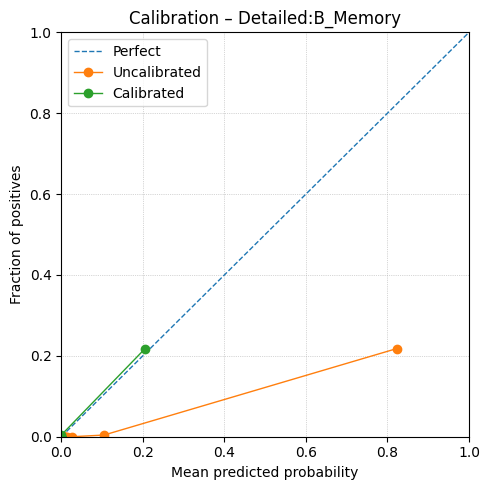

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Luecken/Models/Detailed_B_Memory/Detailed_B_Memory_bundle.joblib

B_Memory
               precision    recall  f1-score   support

           0       0.70      1.00      0.82       267
           1       1.00      0.57      0.73       267

    accuracy                           0.78       534
   macro avg       0.85      0.78      0.77       534
weighted avg       0.85      0.78      0.77       534


Processing B_Naive (class 2/23)...
Training - Found 7962 / 7962 barcodes
Training - Pos: 3981, Neg: 3981
Training labels: 3981 pos, 3981 neg
Testing  - Found 2212 / 2212 barcodes
Testing  - Pos: 1106, Neg: 1106
Testing  - labels: 1106 pos, 1106 neg
Calibrating - Found 7216 rows | Pos: 442, Neg: 6774
All test data: 18036 rows, positives for B_Naive: 1106
[scale] B_Naive: train mean ~ -0.000, std ~ 1.000

[NB] training → B_Naive
Fitting 10 f

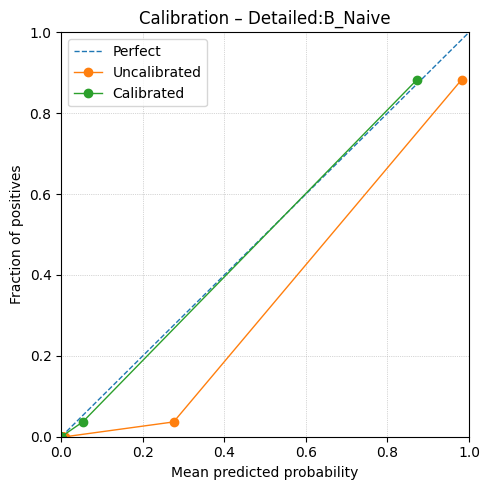

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Luecken/Models/Detailed_B_Naive/Detailed_B_Naive_bundle.joblib

B_Naive
               precision    recall  f1-score   support

           0       0.98      0.98      0.98      1106
           1       0.98      0.98      0.98      1106

    accuracy                           0.98      2212
   macro avg       0.98      0.98      0.98      2212
weighted avg       0.98      0.98      0.98      2212


Processing CD14_Mono (class 3/23)...
Training - Found 29368 / 29368 barcodes
Training - Pos: 14684, Neg: 14684
Training labels: 14684 pos, 14684 neg
Testing  - Found 8158 / 8158 barcodes
Testing  - Pos: 4079, Neg: 4079
Testing  - labels: 4079 pos, 4079 neg
Calibrating - Found 7216 rows | Pos: 1632, Neg: 5584
All test data: 18036 rows, positives for CD14_Mono: 4079
[scale] CD14_Mono: train mean ~ -0.000, std ~ 1.000

[NB] training → CD14_Mono


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.



[XGB] training → CD14_Mono
Fitting 10 folds for each of 10 candidates, totalling 100 fits


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid st


[KNN] training → CD14_Mono
Fitting 10 folds for each of 10 candidates, totalling 100 fits


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.



[MLP] training → CD14_Mono
Fitting 10 folds for each of 10 candidates, totalling 100 fits


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


[CAL] CD14_Mono: cal positives=1632/7216

Calibration metrics:
   Uncalibrated  |  Brier: 0.0212   LogLoss: 0.0749
     Calibrated  |  Brier: 0.0124   LogLoss: 0.0493


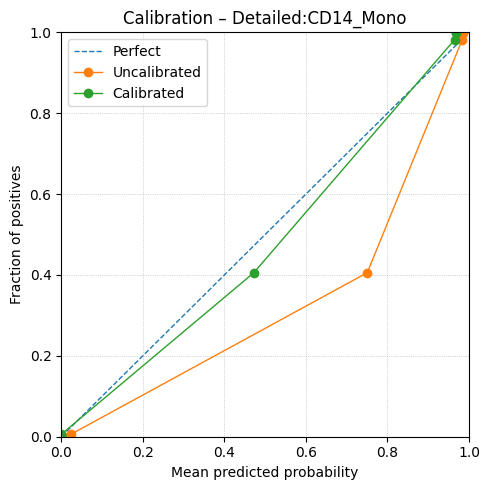

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Luecken/Models/Detailed_CD14_Mono/Detailed_CD14_Mono_bundle.joblib

CD14_Mono
               precision    recall  f1-score   support

           0       0.98      0.99      0.98      4079
           1       0.98      0.98      0.98      4079

    accuracy                           0.98      8158
   macro avg       0.98      0.98      0.98      8158
weighted avg       0.98      0.98      0.98      8158


Processing CD16_Mono (class 4/23)...
Training - Found 3416 / 3416 barcodes
Training - Pos: 1708, Neg: 1708
Training labels: 1708 pos, 1708 neg
Testing  - Found 950 / 950 barcodes
Testing  - Pos: 475, Neg: 475
Testing  - labels: 475 pos, 475 neg
Calibrating - Found 7216 rows | Pos: 190, Neg: 7026
All test data: 18036 rows, positives for CD16_Mono: 475
[scale] CD16_Mono: train mean ~ 0.000, std ~ 1.000

[NB] training → CD16_Mono
Fitting 1

Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.



[KNN] training → CD16_Mono
Fitting 10 folds for each of 10 candidates, totalling 100 fits

[MLP] training → CD16_Mono
Fitting 10 folds for each of 10 candidates, totalling 100 fits
[CAL] CD16_Mono: cal positives=190/7216

Calibration metrics:
   Uncalibrated  |  Brier: 0.0148   LogLoss: 0.0596
     Calibrated  |  Brier: 0.0038   LogLoss: 0.0147


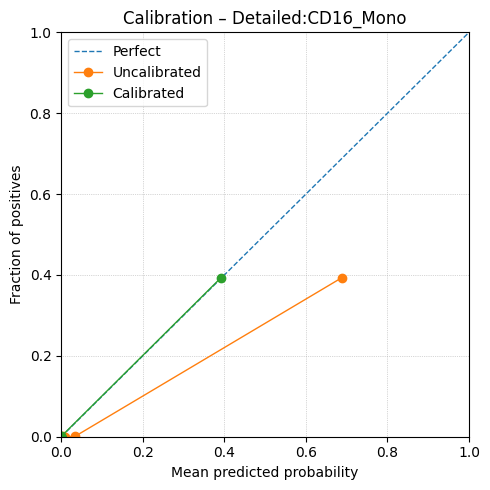

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Luecken/Models/Detailed_CD16_Mono/Detailed_CD16_Mono_bundle.joblib

CD16_Mono
               precision    recall  f1-score   support

           0       0.97      1.00      0.98       475
           1       1.00      0.97      0.98       475

    accuracy                           0.98       950
   macro avg       0.98      0.98      0.98       950
weighted avg       0.98      0.98      0.98       950


Processing CD4_CTL (class 5/23)...
Training - Found 104 / 104 barcodes
Training - Pos: 52, Neg: 52
Training labels: 52 pos, 52 neg
Testing  - Found 28 / 28 barcodes
Testing  - Pos: 14, Neg: 14
Testing  - labels: 14 pos, 14 neg
Calibrating - Found 7216 rows | Pos: 6, Neg: 7210
All test data: 18036 rows, positives for CD4_CTL: 14
[scale] CD4_CTL: train mean ~ 0.000, std ~ 1.000

[NB] training → CD4_CTL
Fitting 10 folds for each of 10 cand

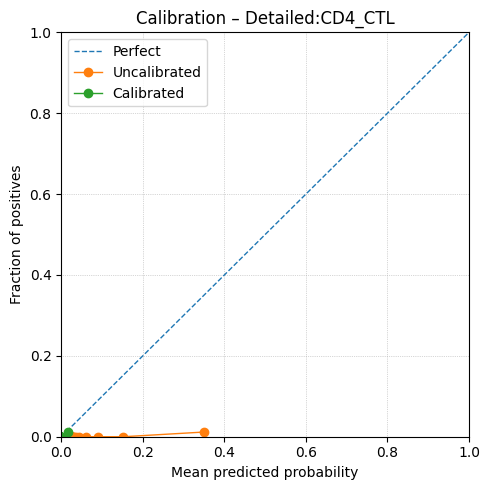

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Luecken/Models/Detailed_CD4_CTL/Detailed_CD4_CTL_bundle.joblib

CD4_CTL
               precision    recall  f1-score   support

           0       0.50      1.00      0.67        14
           1       0.00      0.00      0.00        14

    accuracy                           0.50        28
   macro avg       0.25      0.50      0.33        28
weighted avg       0.25      0.50      0.33        28


Processing CD4_T_Memory (class 6/23)...
Training - Found 12430 / 12430 barcodes
Training - Pos: 6215, Neg: 6215
Training labels: 6215 pos, 6215 neg
Testing  - Found 3452 / 3452 barcodes
Testing  - Pos: 1726, Neg: 1726
Testing  - labels: 1726 pos, 1726 neg
Calibrating - Found 7216 rows | Pos: 691, Neg: 6525
All test data: 18036 rows, positives for CD4_T_Memory: 1726
[scale] CD4_T_Memory: train mean ~ -0.000, std ~ 1.000

[NB] training → CD4_T_

Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.



[KNN] training → CD4_T_Memory
Fitting 10 folds for each of 10 candidates, totalling 100 fits

[MLP] training → CD4_T_Memory
Fitting 10 folds for each of 10 candidates, totalling 100 fits
[CAL] CD4_T_Memory: cal positives=691/7216

Calibration metrics:
   Uncalibrated  |  Brier: 0.0159   LogLoss: 0.0630
     Calibrated  |  Brier: 0.0082   LogLoss: 0.0314


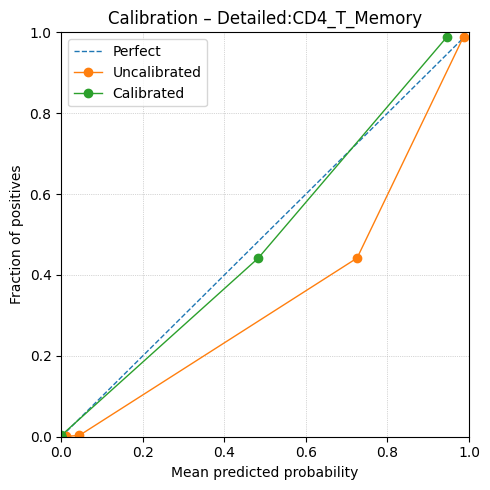

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Luecken/Models/Detailed_CD4_T_Memory/Detailed_CD4_T_Memory_bundle.joblib

CD4_T_Memory
               precision    recall  f1-score   support

           0       0.97      0.99      0.98      1726
           1       0.99      0.97      0.98      1726

    accuracy                           0.98      3452
   macro avg       0.98      0.98      0.98      3452
weighted avg       0.98      0.98      0.98      3452


Processing CD4_T_Naive (class 7/23)...
Training - Found 8750 / 8750 barcodes
Training - Pos: 4375, Neg: 4375
Training labels: 4375 pos, 4375 neg
Testing  - Found 2430 / 2430 barcodes
Testing  - Pos: 1215, Neg: 1215
Testing  - labels: 1215 pos, 1215 neg
Calibrating - Found 7216 rows | Pos: 486, Neg: 6730
All test data: 18036 rows, positives for CD4_T_Naive: 1215
[scale] CD4_T_Naive: train mean ~ -0.000, std ~ 1.000

[NB] trainin

Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.



[KNN] training → CD4_T_Naive
Fitting 10 folds for each of 10 candidates, totalling 100 fits

[MLP] training → CD4_T_Naive
Fitting 10 folds for each of 10 candidates, totalling 100 fits
[CAL] CD4_T_Naive: cal positives=486/7216

Calibration metrics:
   Uncalibrated  |  Brier: 0.0156   LogLoss: 0.0612
     Calibrated  |  Brier: 0.0061   LogLoss: 0.0249


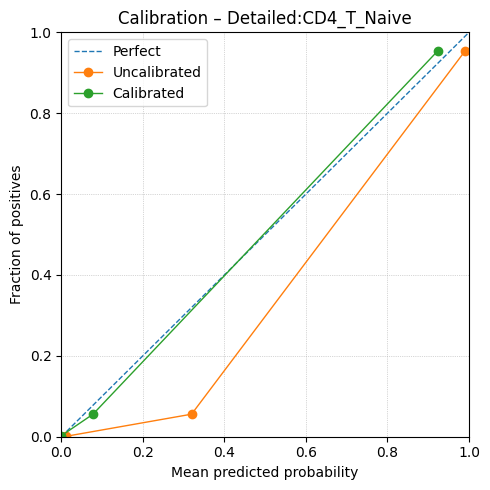

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Luecken/Models/Detailed_CD4_T_Naive/Detailed_CD4_T_Naive_bundle.joblib

CD4_T_Naive
               precision    recall  f1-score   support

           0       0.98      0.99      0.98      1215
           1       0.99      0.98      0.98      1215

    accuracy                           0.98      2430
   macro avg       0.98      0.98      0.98      2430
weighted avg       0.98      0.98      0.98      2430


Processing CD8_T_Memory (class 8/23)...
Training - Found 11494 / 11494 barcodes
Training - Pos: 5747, Neg: 5747
Training labels: 5747 pos, 5747 neg
Testing  - Found 3192 / 3192 barcodes
Testing  - Pos: 1596, Neg: 1596
Testing  - labels: 1596 pos, 1596 neg
Calibrating - Found 7216 rows | Pos: 639, Neg: 6577
All test data: 18036 rows, positives for CD8_T_Memory: 1596
[scale] CD8_T_Memory: train mean ~ 0.000, std ~ 1.000

[NB] traini

Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.



[KNN] training → CD8_T_Memory
Fitting 10 folds for each of 10 candidates, totalling 100 fits

[MLP] training → CD8_T_Memory
Fitting 10 folds for each of 10 candidates, totalling 100 fits


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


[CAL] CD8_T_Memory: cal positives=639/7216

Calibration metrics:
   Uncalibrated  |  Brier: 0.0250   LogLoss: 0.0919
     Calibrated  |  Brier: 0.0143   LogLoss: 0.0480


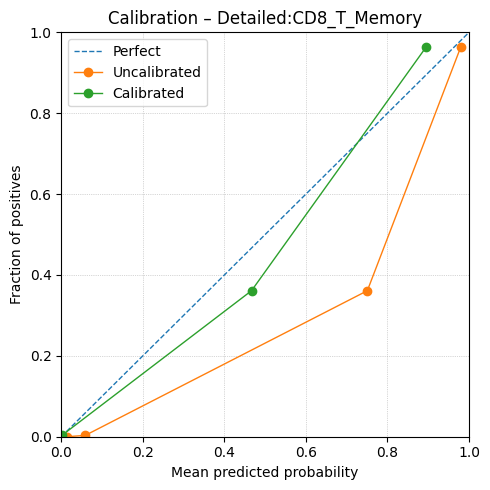

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Luecken/Models/Detailed_CD8_T_Memory/Detailed_CD8_T_Memory_bundle.joblib

CD8_T_Memory
               precision    recall  f1-score   support

           0       0.97      0.98      0.97      1596
           1       0.98      0.97      0.97      1596

    accuracy                           0.97      3192
   macro avg       0.97      0.97      0.97      3192
weighted avg       0.97      0.97      0.97      3192


Processing CD8_T_Naive (class 9/23)...
Training - Found 4628 / 4628 barcodes
Training - Pos: 2314, Neg: 2314
Training labels: 2314 pos, 2314 neg
Testing  - Found 1286 / 1286 barcodes
Testing  - Pos: 643, Neg: 643
Testing  - labels: 643 pos, 643 neg
Calibrating - Found 7216 rows | Pos: 257, Neg: 6959
All test data: 18036 rows, positives for CD8_T_Naive: 643
[scale] CD8_T_Naive: train mean ~ -0.000, std ~ 1.000

[NB] training → C

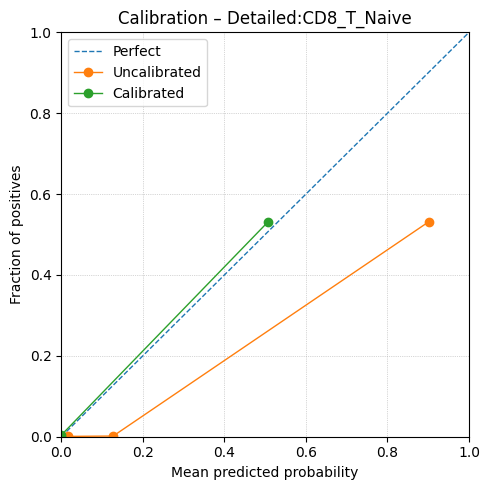

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Luecken/Models/Detailed_CD8_T_Naive/Detailed_CD8_T_Naive_bundle.joblib

CD8_T_Naive
               precision    recall  f1-score   support

           0       0.95      0.99      0.97       643
           1       0.99      0.95      0.97       643

    accuracy                           0.97      1286
   macro avg       0.97      0.97      0.97      1286
weighted avg       0.97      0.97      0.97      1286


Processing ErP (class 10/23)...
Training - Found 1046 / 1046 barcodes
Training - Pos: 523, Neg: 523
Training labels: 523 pos, 523 neg
Testing  - Found 290 / 290 barcodes
Testing  - Pos: 145, Neg: 145
Testing  - labels: 145 pos, 145 neg
Calibrating - Found 7216 rows | Pos: 58, Neg: 7158
All test data: 18036 rows, positives for ErP: 145
[scale] ErP: train mean ~ -0.000, std ~ 1.000

[NB] training → ErP
Fitting 10 folds for each of 1

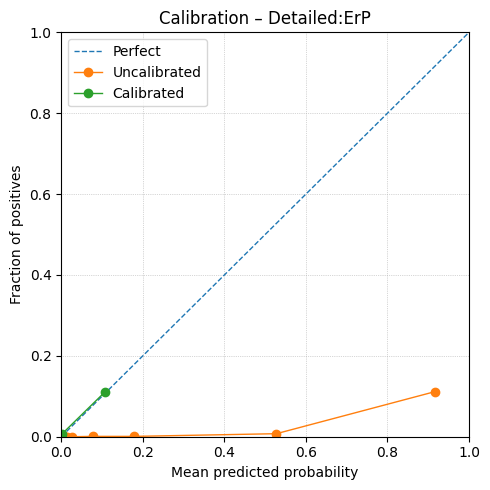

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Luecken/Models/Detailed_ErP/Detailed_ErP_bundle.joblib

ErP
               precision    recall  f1-score   support

           0       0.50      1.00      0.67       145
           1       0.00      0.00      0.00       145

    accuracy                           0.50       290
   macro avg       0.25      0.50      0.33       290
weighted avg       0.25      0.50      0.33       290


Processing Erythroblast (class 11/23)...
Training - Found 16544 / 16544 barcodes
Training - Pos: 8272, Neg: 8272
Training labels: 8272 pos, 8272 neg
Testing  - Found 4596 / 4596 barcodes
Testing  - Pos: 2298, Neg: 2298
Testing  - labels: 2298 pos, 2298 neg
Calibrating - Found 7216 rows | Pos: 919, Neg: 6297
All test data: 18036 rows, positives for Erythroblast: 2298
[scale] Erythroblast: train mean ~ 0.000, std ~ 1.000

[NB] training → Erythroblast
Fitti

Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.



[MLP] training → Erythroblast
Fitting 10 folds for each of 10 candidates, totalling 100 fits
[CAL] Erythroblast: cal positives=919/7216

Calibration metrics:
   Uncalibrated  |  Brier: 0.0091   LogLoss: 0.0357
     Calibrated  |  Brier: 0.0047   LogLoss: 0.0179


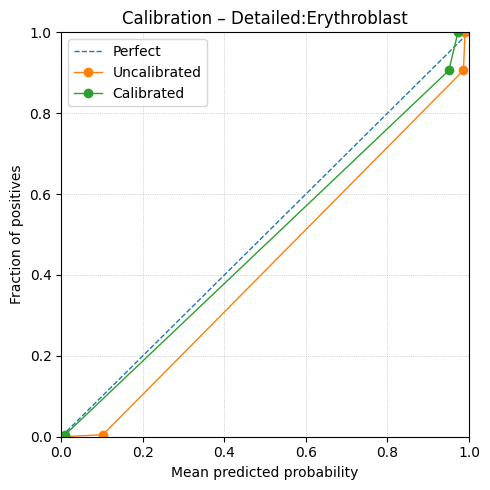

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Luecken/Models/Detailed_Erythroblast/Detailed_Erythroblast_bundle.joblib

Erythroblast
               precision    recall  f1-score   support

           0       1.00      0.99      0.99      2298
           1       0.99      1.00      0.99      2298

    accuracy                           0.99      4596
   macro avg       0.99      0.99      0.99      4596
weighted avg       0.99      0.99      0.99      4596


Processing HSC_MPP (class 12/23)...
Training - Found 1702 / 1702 barcodes
Training - Pos: 851, Neg: 851
Training labels: 851 pos, 851 neg
Testing  - Found 474 / 474 barcodes
Testing  - Pos: 237, Neg: 237
Testing  - labels: 237 pos, 237 neg
Calibrating - Found 7216 rows | Pos: 95, Neg: 7121
All test data: 18036 rows, positives for HSC_MPP: 237
[scale] HSC_MPP: train mean ~ -0.000, std ~ 1.000

[NB] training → HSC_MPP
Fitting 10 

Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.



[KNN] training → HSC_MPP
Fitting 10 folds for each of 10 candidates, totalling 100 fits

[MLP] training → HSC_MPP
Fitting 10 folds for each of 10 candidates, totalling 100 fits
[CAL] HSC_MPP: cal positives=95/7216

Calibration metrics:
   Uncalibrated  |  Brier: 0.0512   LogLoss: 0.1721
     Calibrated  |  Brier: 0.0080   LogLoss: 0.0255


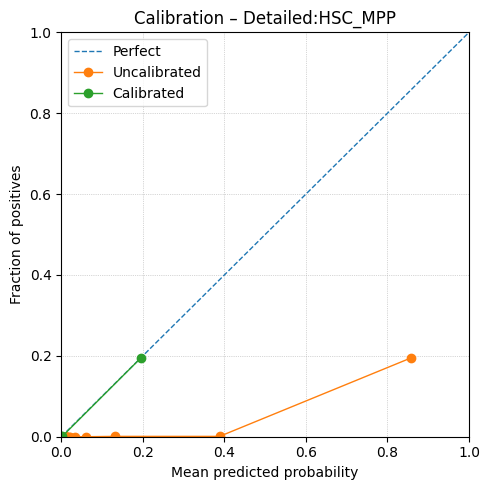

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Luecken/Models/Detailed_HSC_MPP/Detailed_HSC_MPP_bundle.joblib

HSC_MPP
               precision    recall  f1-score   support

           0       0.59      1.00      0.74       237
           1       0.99      0.30      0.46       237

    accuracy                           0.65       474
   macro avg       0.79      0.65      0.60       474
weighted avg       0.79      0.65      0.60       474


Processing Immature_B (class 13/23)...
Training - Found 3152 / 3152 barcodes
Training - Pos: 1576, Neg: 1576
Training labels: 1576 pos, 1576 neg
Testing  - Found 876 / 876 barcodes
Testing  - Pos: 438, Neg: 438
Testing  - labels: 438 pos, 438 neg
Calibrating - Found 7216 rows | Pos: 175, Neg: 7041
All test data: 18036 rows, positives for Immature_B: 438
[scale] Immature_B: train mean ~ 0.000, std ~ 1.000

[NB] training → Immature_B
Fitting 10

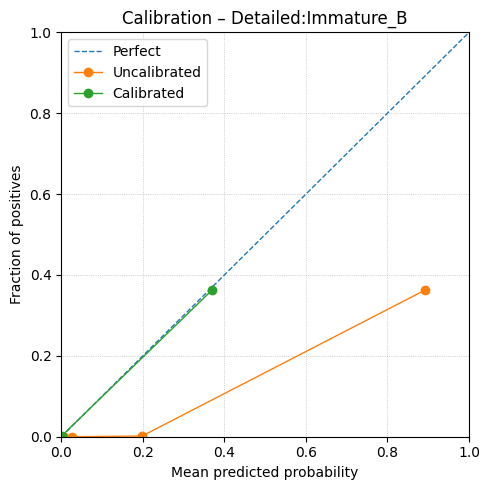

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Luecken/Models/Detailed_Immature_B/Detailed_Immature_B_bundle.joblib

Immature_B
               precision    recall  f1-score   support

           0       0.81      0.99      0.89       438
           1       0.99      0.76      0.86       438

    accuracy                           0.88       876
   macro avg       0.90      0.88      0.87       876
weighted avg       0.90      0.88      0.87       876


Processing MAIT (class 14/23)...
Training - Found 1064 / 1064 barcodes
Training - Pos: 532, Neg: 532
Training labels: 532 pos, 532 neg
Testing  - Found 296 / 296 barcodes
Testing  - Pos: 148, Neg: 148
Testing  - labels: 148 pos, 148 neg
Calibrating - Found 7216 rows | Pos: 59, Neg: 7157
All test data: 18036 rows, positives for MAIT: 148
[scale] MAIT: train mean ~ 0.000, std ~ 1.000

[NB] training → MAIT
Fitting 10 folds for each of 1

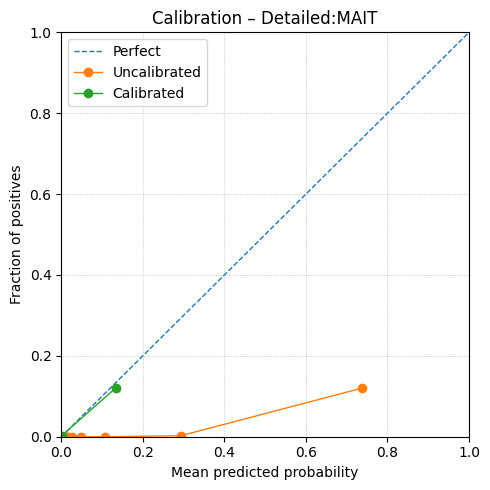

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Luecken/Models/Detailed_MAIT/Detailed_MAIT_bundle.joblib

MAIT
               precision    recall  f1-score   support

           0       0.68      1.00      0.81       148
           1       1.00      0.53      0.70       148

    accuracy                           0.77       296
   macro avg       0.84      0.77      0.75       296
weighted avg       0.84      0.77      0.75       296


Processing Myeloid_progenitor (class 15/23)...
Training - Found 5898 / 5898 barcodes
Training - Pos: 2949, Neg: 2949
Training labels: 2949 pos, 2949 neg
Testing  - Found 1638 / 1638 barcodes
Testing  - Pos: 819, Neg: 819
Testing  - labels: 819 pos, 819 neg
Calibrating - Found 7216 rows | Pos: 328, Neg: 6888
All test data: 18036 rows, positives for Myeloid_progenitor: 819
[scale] Myeloid_progenitor: train mean ~ -0.000, std ~ 1.000

[NB] training → Mye

Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.



[KNN] training → Myeloid_progenitor
Fitting 10 folds for each of 10 candidates, totalling 100 fits

[MLP] training → Myeloid_progenitor
Fitting 10 folds for each of 10 candidates, totalling 100 fits
[CAL] Myeloid_progenitor: cal positives=328/7216

Calibration metrics:
   Uncalibrated  |  Brier: 0.0404   LogLoss: 0.1410
     Calibrated  |  Brier: 0.0165   LogLoss: 0.0515


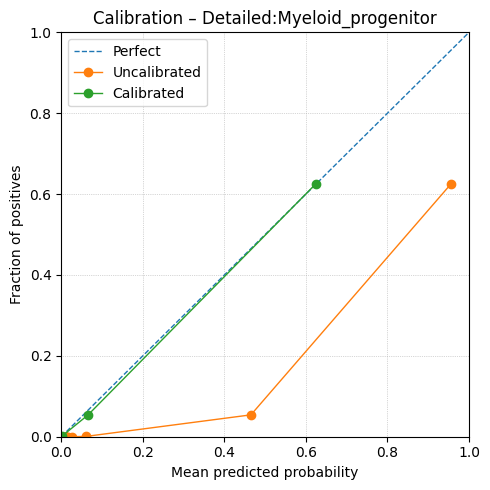

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Luecken/Models/Detailed_Myeloid_progenitor/Detailed_Myeloid_progenitor_bundle.joblib

Myeloid_progenitor
               precision    recall  f1-score   support

           0       0.86      0.99      0.92       819
           1       0.99      0.83      0.90       819

    accuracy                           0.91      1638
   macro avg       0.92      0.91      0.91      1638
weighted avg       0.92      0.91      0.91      1638


Processing NK_CD56_bright (class 16/23)...
Training - Found 1104 / 1104 barcodes
Training - Pos: 552, Neg: 552
Training labels: 552 pos, 552 neg
Testing  - Found 306 / 306 barcodes
Testing  - Pos: 153, Neg: 153
Testing  - labels: 153 pos, 153 neg
Calibrating - Found 7216 rows | Pos: 61, Neg: 7155
All test data: 18036 rows, positives for NK_CD56_bright: 153
[scale] NK_CD56_bright: train mean ~ 0.000, std ~ 1.00

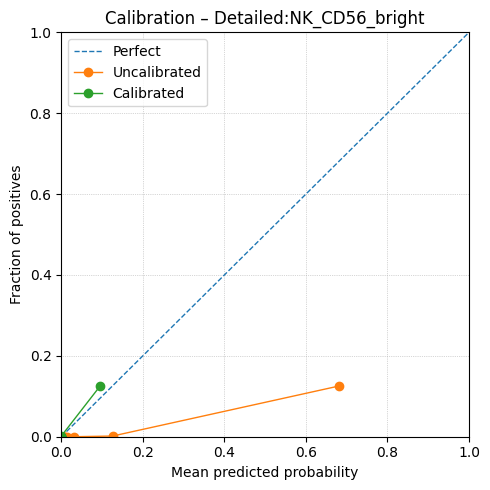

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Luecken/Models/Detailed_NK_CD56_bright/Detailed_NK_CD56_bright_bundle.joblib

NK_CD56_bright
               precision    recall  f1-score   support

           0       0.61      1.00      0.76       153
           1       1.00      0.36      0.53       153

    accuracy                           0.68       306
   macro avg       0.80      0.68      0.64       306
weighted avg       0.80      0.68      0.64       306


Processing NK_CD56_dim (class 17/23)...
Training - Found 10912 / 10912 barcodes
Training - Pos: 5456, Neg: 5456
Training labels: 5456 pos, 5456 neg
Testing  - Found 3030 / 3030 barcodes
Testing  - Pos: 1515, Neg: 1515
Testing  - labels: 1515 pos, 1515 neg
Calibrating - Found 7216 rows | Pos: 606, Neg: 6610
All test data: 18036 rows, positives for NK_CD56_dim: 1515
[scale] NK_CD56_dim: train mean ~ -0.000, std ~ 1.000

[NB

Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.



[KNN] training → NK_CD56_dim
Fitting 10 folds for each of 10 candidates, totalling 100 fits

[MLP] training → NK_CD56_dim
Fitting 10 folds for each of 10 candidates, totalling 100 fits
[CAL] NK_CD56_dim: cal positives=606/7216

Calibration metrics:
   Uncalibrated  |  Brier: 0.0074   LogLoss: 0.0307
     Calibrated  |  Brier: 0.0055   LogLoss: 0.0216


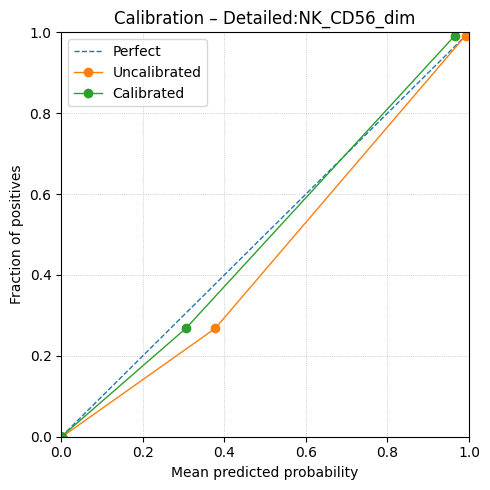

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Luecken/Models/Detailed_NK_CD56_dim/Detailed_NK_CD56_dim_bundle.joblib

NK_CD56_dim
               precision    recall  f1-score   support

           0       0.98      0.99      0.99      1515
           1       0.99      0.98      0.99      1515

    accuracy                           0.99      3030
   macro avg       0.99      0.99      0.99      3030
weighted avg       0.99      0.99      0.99      3030


Processing Plasma (class 18/23)...
Training - Found 892 / 892 barcodes
Training - Pos: 446, Neg: 446
Training labels: 446 pos, 446 neg
Testing  - Found 248 / 248 barcodes
Testing  - Pos: 124, Neg: 124
Testing  - labels: 124 pos, 124 neg
Calibrating - Found 7216 rows | Pos: 49, Neg: 7167
All test data: 18036 rows, positives for Plasma: 124
[scale] Plasma: train mean ~ -0.000, std ~ 1.000

[NB] training → Plasma
Fitting 10 folds for

Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.



[KNN] training → Plasma
Fitting 10 folds for each of 10 candidates, totalling 100 fits

[MLP] training → Plasma
Fitting 10 folds for each of 10 candidates, totalling 100 fits
[CAL] Plasma: cal positives=49/7216

Calibration metrics:
   Uncalibrated  |  Brier: 0.0177   LogLoss: 0.0635
     Calibrated  |  Brier: 0.0015   LogLoss: 0.0064


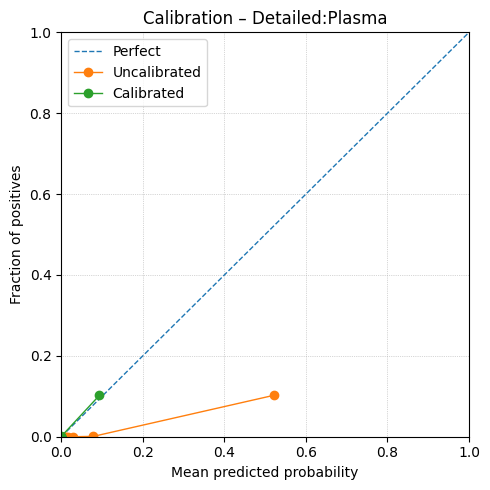

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Luecken/Models/Detailed_Plasma/Detailed_Plasma_bundle.joblib

Plasma
               precision    recall  f1-score   support

           0       0.91      1.00      0.95       124
           1       1.00      0.90      0.95       124

    accuracy                           0.95       248
   macro avg       0.96      0.95      0.95       248
weighted avg       0.96      0.95      0.95       248


Processing Pre-B (class 19/23)...
Training - Found 2372 / 2372 barcodes
Training - Pos: 1186, Neg: 1186
Training labels: 1186 pos, 1186 neg
Testing  - Found 658 / 658 barcodes
Testing  - Pos: 329, Neg: 329
Testing  - labels: 329 pos, 329 neg
Calibrating - Found 7216 rows | Pos: 132, Neg: 7084
All test data: 18036 rows, positives for Pre-B: 329
[scale] Pre-B: train mean ~ -0.000, std ~ 1.000

[NB] training → Pre-B
Fitting 10 folds for each of 10 

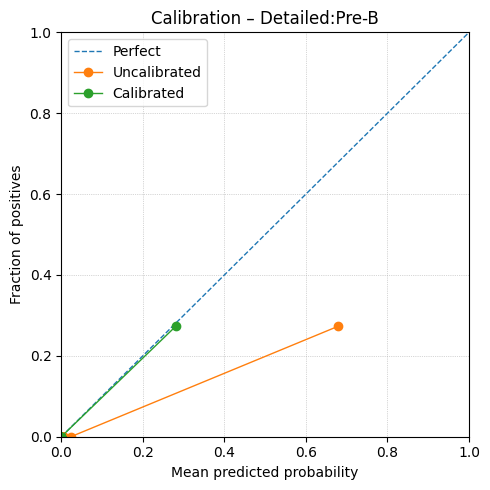

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Luecken/Models/Detailed_Pre-B/Detailed_Pre-B_bundle.joblib

Pre-B
               precision    recall  f1-score   support

           0       0.84      0.98      0.90       329
           1       0.97      0.82      0.89       329

    accuracy                           0.90       658
   macro avg       0.91      0.90      0.90       658
weighted avg       0.91      0.90      0.90       658


Processing Treg (class 20/23)...
Training - Found 548 / 548 barcodes
Training - Pos: 274, Neg: 274
Training labels: 274 pos, 274 neg
Testing  - Found 152 / 152 barcodes
Testing  - Pos: 76, Neg: 76
Testing  - labels: 76 pos, 76 neg
Calibrating - Found 7216 rows | Pos: 31, Neg: 7185
All test data: 18036 rows, positives for Treg: 76
[scale] Treg: train mean ~ -0.000, std ~ 1.000

[NB] training → Treg
Fitting 10 folds for each of 10 candidates, totalli

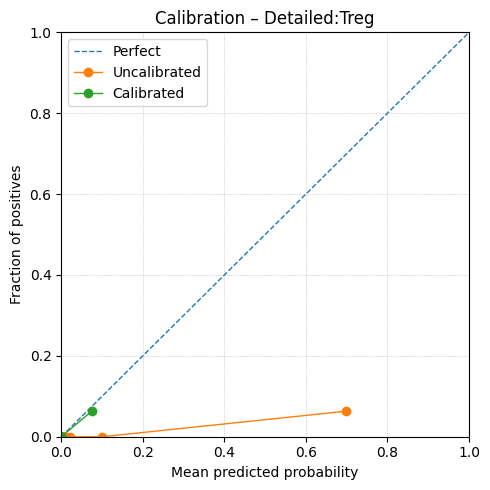

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Luecken/Models/Detailed_Treg/Detailed_Treg_bundle.joblib

Treg
               precision    recall  f1-score   support

           0       0.50      1.00      0.67        76
           1       0.00      0.00      0.00        76

    accuracy                           0.50       152
   macro avg       0.25      0.50      0.33       152
weighted avg       0.25      0.50      0.33       152


Processing cDC2 (class 21/23)...
Training - Found 1594 / 1594 barcodes
Training - Pos: 797, Neg: 797
Training labels: 797 pos, 797 neg
Testing  - Found 442 / 442 barcodes
Testing  - Pos: 221, Neg: 221
Testing  - labels: 221 pos, 221 neg
Calibrating - Found 7216 rows | Pos: 89, Neg: 7127
All test data: 18036 rows, positives for cDC2: 221
[scale] cDC2: train mean ~ -0.000, std ~ 1.000

[NB] training → cDC2
Fitting 10 folds for each of 10 candidates, tot

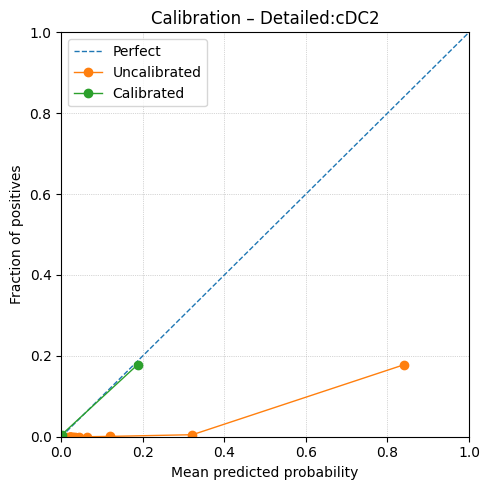

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Luecken/Models/Detailed_cDC2/Detailed_cDC2_bundle.joblib

cDC2
               precision    recall  f1-score   support

           0       0.78      1.00      0.88       221
           1       1.00      0.72      0.84       221

    accuracy                           0.86       442
   macro avg       0.89      0.86      0.86       442
weighted avg       0.89      0.86      0.86       442


Processing gdT (class 22/23)...
Training - Found 132 / 132 barcodes
Training - Pos: 66, Neg: 66
Training labels: 66 pos, 66 neg
Testing  - Found 36 / 36 barcodes
Testing  - Pos: 18, Neg: 18
Testing  - labels: 18 pos, 18 neg
Calibrating - Found 7216 rows | Pos: 7, Neg: 7209
All test data: 18036 rows, positives for gdT: 18
[scale] gdT: train mean ~ -0.000, std ~ 1.000

[NB] training → gdT
Fitting 10 folds for each of 10 candidates, totalling 100 fits

[

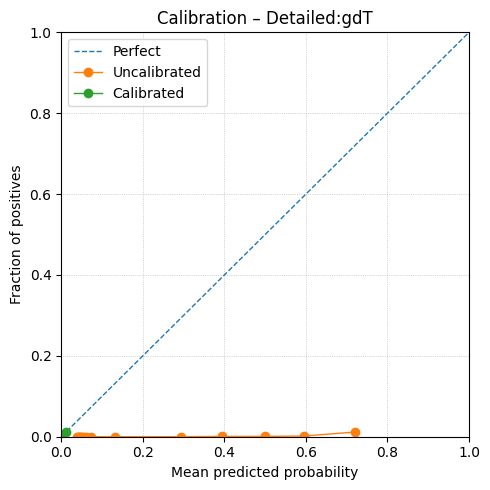

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Luecken/Models/Detailed_gdT/Detailed_gdT_bundle.joblib

gdT
               precision    recall  f1-score   support

           0       0.50      1.00      0.67        18
           1       0.00      0.00      0.00        18

    accuracy                           0.50        36
   macro avg       0.25      0.50      0.33        36
weighted avg       0.25      0.50      0.33        36


Processing pDC (class 23/23)...
Training - Found 2834 / 2834 barcodes
Training - Pos: 1417, Neg: 1417
Training labels: 1417 pos, 1417 neg
Testing  - Found 788 / 788 barcodes
Testing  - Pos: 394, Neg: 394
Testing  - labels: 394 pos, 394 neg
Calibrating - Found 7216 rows | Pos: 157, Neg: 7059
All test data: 18036 rows, positives for pDC: 394
[scale] pDC: train mean ~ -0.000, std ~ 1.000

[NB] training → pDC
Fitting 10 folds for each of 10 candidates, total

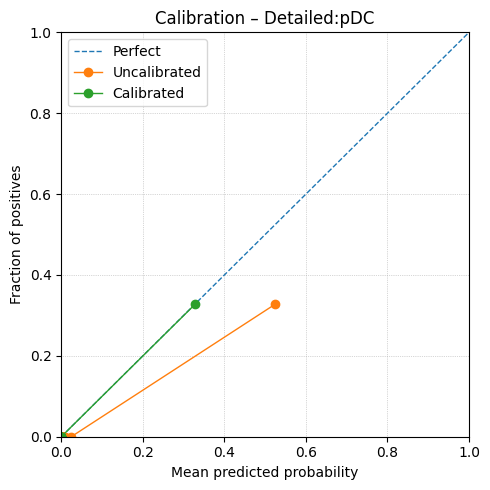

[SAVE] Wrote bundle with columns+scaler to /Users/kgurashi/GitHub/2024__EspressoPro_Manuscript/Data/Pre_trained_models/TotalSeqD_Heme_Oncology_CAT399906/Luecken/Models/Detailed_pDC/Detailed_pDC_bundle.joblib

pDC
               precision    recall  f1-score   support

           0       0.99      1.00      1.00       394
           1       1.00      0.99      1.00       394

    accuracy                           1.00       788
   macro avg       1.00      1.00      1.00       788
weighted avg       1.00      1.00      1.00       788


Fitting multiclass TemperatureScaling on CAL split (excluded classes masked out)...

Preview of probabilities BEFORE (raw OvR) vs AFTER (multiclass TS) [included classes only]:
                         raw_B_Memory   raw_B_Naive  raw_CD14_Mono  raw_CD16_Mono  raw_CD4_CTL  raw_CD4_T_Memory  raw_CD4_T_Naive  raw_CD8_T_Memory  raw_CD8_T_Naive       raw_ErP  raw_Erythroblast  raw_HSC_MPP  raw_Immature_B      raw_MAIT  raw_Myeloid_progenitor  raw_NK_CD56_brig

In [140]:
# -*- coding: utf-8 -*-
from pathlib import Path
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.ensemble import StackingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.calibration import CalibratedClassifierCV
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report, confusion_matrix

from netcal.scaling import TemperatureScaling
import joblib

# ------------------------------------------------------------------- CONFIG (expects these to already exist)
#   models_output, train_barcodes_path, test_barcodes_path
#   Luecken_data_Train, Luecken_data_Test, Luecken_data_Cal          (DataFrames indexed by barcode)
#   Luecken_dataset_Train, Luecken_dataset_Test, Luecken_dataset_Cal (AnnData with obs labels)
#   TotalSeqD_Heme_Oncology_CAT399906                    (iterable of feature names)
#   MLTraining module with: CV, train_NB, train_XGB, train_KNN, train_MLP,
#                           plot_calibration_curve, save_models, evaluate_classifier, append_metrics_csv

name_target_class = "Detailed"   # "detailed" | "detailed" | "Detailed"
fig_root   = Path(models_output) / "Figures"
models_dir = Path(models_output) / "Models"
fig_root.mkdir(parents=True, exist_ok=True)
models_dir.mkdir(parents=True, exist_ok=True)

kf         = MLTraining.CV
num_cores  = -1
metrics_log = []

# ============================= HELPERS =============================

def _norm_feats(names) -> pd.Index:
    """
    Normalizer used ONLY to construct matching keys.
    Panel names remain untouched; data columns are normalized and then mapped BACK
    to the exact panel names via a lookup.
    """
    s = pd.Index(map(str, names))
    s = (s.str.strip()
           .str.lower()
           .str.replace(r"[ _/]+", "-", regex=True)
           .str.replace(r"-+", "-", regex=True)
           .str.strip("-"))
    return s

def attach_celltype(df: pd.DataFrame, ad: "AnnData", field: str) -> pd.DataFrame:
    if field not in ad.obs:
        raise KeyError(f"'{field}' not found in AnnData.obs")
    lab = (ad.obs[field]
             .astype("string")
             .str.strip()
             .str.replace(r"\s+", "_", regex=True))
    out = df.copy()
    out["Celltype"] = pd.Categorical(lab.reindex(out.index))
    if out["Celltype"].isna().any():
        missing = int(out["Celltype"].isna().sum())
        print(f"[WARN] {missing} rows got NaN Celltype after reindex; check barcode alignment.")
    return out

def _check_finite(df: pd.DataFrame, tag: str):
    arr = df.to_numpy()
    if not np.isfinite(arr).all():
        bad = np.where(~np.isfinite(arr))
        raise ValueError(f"Non-finite values found in {tag} features at positions {bad}")

def _unwrap_estimator(m):
    return getattr(m, "estimator", None) or getattr(m, "base_estimator", None) or m

def _assert_feature_counts(cell_name: str, models_dict: dict, expected: int):
    pairs = [
        ("NB",  models_dict.get("NB")),
        ("XGB", models_dict.get("XGB")),
        ("KNN", models_dict.get("KNN")),
        ("MLP", models_dict.get("MLP")),
        ("Stacker", models_dict.get("Stacker")),
    ]
    for name, est in pairs:
        if est is None:
            continue
        base = _unwrap_estimator(est)
        nfi = getattr(base, "n_features_in_", None)
        if nfi is not None and nfi != expected:
            raise RuntimeError(f"{cell_name}:{name} saw {nfi} features; expected {expected}")

# ============================= LABEL ATTACH =============================

consensus_field = f"Consensus_annotation_{name_target_class.lower()}_final"

Luecken_data_Train = attach_celltype(Luecken_data_Train, Luecken_dataset_Train, consensus_field)
Luecken_data_Test  = attach_celltype(Luecken_data_Test,  Luecken_dataset_Test,  consensus_field)
Luecken_data_Cal   = attach_celltype(Luecken_data_Cal,   Luecken_dataset_Cal,   consensus_field)

# ============================= PANEL & DATA COLUMN ALIGNMENT =============================

# Keep the panel EXACTLY as provided
panel = pd.Index(map(str, TotalSeqD_Heme_Oncology_CAT399906))

# Build a mapping: normalized_key -> exact panel name
panel_keys    = _norm_feats(panel)
norm_to_panel = dict(zip(panel_keys, panel))
if len(norm_to_panel) != len(panel):
    raise ValueError("Panel contains names that collide after normalization. Consider adjusting _norm_feats rules.")

def _rename_data_to_panel(df: pd.DataFrame) -> pd.DataFrame:
    """
    Rename only feature columns so that after normalization they map
    back to the exact panel column names. Keeps 'cell_barcode' and 'Celltype' intact.
    """
    df = df.copy()
    non_feat = [c for c in ["cell_barcode", "Celltype"] if c in df.columns]
    feat     = pd.Index([c for c in df.columns if c not in non_feat])

    feat_keys   = _norm_feats(feat)
    mapped      = [norm_to_panel.get(k) for k in feat_keys]  # None if not in panel
    rename_map  = {old: new for old, new in zip(feat, mapped) if new is not None}

    # Handle duplicate mappings (two data columns → same panel col). Keep first, drop the rest.
    seen, safe_map, drops = set(), {}, []
    for old, new in rename_map.items():
        if new in seen:
            drops.append(old)
        else:
            seen.add(new); safe_map[old] = new

    if drops:
        print(f"[WARN] Dropping {len(drops)} duplicated-mapped columns (showing up to 5): {drops[:5]}")

    if drops:
        df.drop(columns=drops, inplace=True, errors="ignore")
    df.rename(columns=safe_map, inplace=True)

    matched = len(safe_map)
    print(f"[map] matched {matched}/{len(feat)} data columns to panel")
    return df

# Apply: normalize/rename ONLY data splits (panel remains untouched)
Luecken_data_Train = _rename_data_to_panel(Luecken_data_Train)
Luecken_data_Test  = _rename_data_to_panel(Luecken_data_Test)
Luecken_data_Cal   = _rename_data_to_panel(Luecken_data_Cal)

# Intersect each split with the panel IN PANEL ORDER
def _panel_intersection(df: pd.DataFrame) -> pd.DataFrame:
    non_feat = [c for c in ["cell_barcode", "Celltype"] if c in df.columns]
    feat_cols = pd.Index([c for c in df.columns if c not in non_feat])
    inter = panel.intersection(feat_cols, sort=False)
    if inter.empty:
        raise ValueError("Panel/Data intersection is empty after renaming. Check mapping rules.")
    return df.reindex(columns=list(inter) + non_feat)

Luecken_data_Train = _panel_intersection(Luecken_data_Train)
Luecken_data_Test  = _panel_intersection(Luecken_data_Test)
Luecken_data_Cal   = _panel_intersection(Luecken_data_Cal)

# ============================= FEATURES & LABELS =============================

Luecken_data_Cal_lbl = Luecken_data_Cal[["Celltype"]].copy()

drop_cols_train = [c for c in ["cell_barcode", "Celltype"] if c in Luecken_data_Train.columns]
drop_cols_test  = [c for c in ["cell_barcode", "Celltype"] if c in Luecken_data_Test.columns]
drop_cols_cal   = [c for c in ["cell_barcode", "Celltype"] if c in Luecken_data_Cal.columns]

Luecken_data_Train_Sub = Luecken_data_Train.drop(columns=drop_cols_train, errors="ignore")
Luecken_data_Test_Sub  = Luecken_data_Test.drop(columns=drop_cols_test,  errors="ignore")
Luecken_data_Cal_Sub   = Luecken_data_Cal.drop(columns=drop_cols_cal,    errors="ignore")

# SAFETY: shared columns & finiteness checks
cols_train = list(Luecken_data_Train_Sub.columns)
if list(Luecken_data_Test_Sub.columns) != cols_train or list(Luecken_data_Cal_Sub.columns) != cols_train:
    raise ValueError("Train/Cal/Test feature columns differ after panel intersection!")

_check_finite(Luecken_data_Train_Sub, "TRAIN")
_check_finite(Luecken_data_Test_Sub,  "TEST")
_check_finite(Luecken_data_Cal_Sub,   "CAL")

print(f"\n[features] Using {len(cols_train)} panel-intersected features (exact panel names):")
print(cols_train)

# ===== Exclude specific classes from the multiclass set and per-class loop =====
EXCLUDE_CLASSES = {"Macrophage", "ILC", "Stroma", "dnT"}

all_classes = sorted(pd.Series(Luecken_data_Train["Celltype"]).dropna().unique())
class_names = [c for c in all_classes if c not in EXCLUDE_CLASSES]
if not class_names:
    raise ValueError("After exclusions, class_names is empty.")
print(f"[classes] Included ({len(class_names)}): {class_names}")
if missing := [c for c in all_classes if c in EXCLUDE_CLASSES]:
    print(f"[classes] Excluded: {missing}")

K            = len(class_names)
class_to_idx = {c: i for i, c in enumerate(class_names)}

# --- Multiclass labels (MASKED to included classes) ---
# CAL
mask_cal_mc = Luecken_data_Cal_lbl["Celltype"].isin(class_names)
s_cal = Luecken_data_Cal_lbl.loc[mask_cal_mc, "Celltype"].map(class_to_idx)
if s_cal.isna().any():
    missing = Luecken_data_Cal_lbl.loc[mask_cal_mc & s_cal.isna(), "Celltype"].unique()
    raise ValueError(f"Unknown labels in masked CAL split: {missing}")
y_cal_multiclass = s_cal.to_numpy(dtype=np.int64)

# TEST
mask_test_mc = Luecken_data_Test["Celltype"].isin(class_names)
s_te = Luecken_data_Test.loc[mask_test_mc, "Celltype"].map(class_to_idx)
if s_te.isna().any():
    missing = Luecken_data_Test.loc[mask_test_mc & s_te.isna(), "Celltype"].unique()
    raise ValueError(f"Unknown labels in masked TEST split: {missing}")
y_test_multiclass = s_te.to_numpy(dtype=np.int64)

# Reuse across classes
X_cal_all_df = Luecken_data_Cal_Sub.copy()
X_te_all_df  = Luecken_data_Test_Sub.copy()

# Preallocate OvR prob mats (only for included classes)
P_cal = np.zeros((X_cal_all_df.shape[0], K), dtype=float)
P_te  = np.zeros((X_te_all_df.shape[0],  K), dtype=float)

test_index = Luecken_data_Test_Sub.index

# ============================= TRAIN PER-CLASS OVR =============================

for celltype in class_names:
    k = class_to_idx[celltype]
    name = str(celltype).replace(" ", "_")
    print(f"\nProcessing {name} (class {k+1}/{K})...")

    # ---- TRAIN slice via barcode lists
    train_barcodes_df = pd.read_csv(
        f"{train_barcodes_path}/Luecken/Consensus_annotation_detailed_final/Barcodes_training_class_{name}.csv",
        index_col=0
    )
    train_positive_barcodes = train_barcodes_df["Positive"].dropna().values
    train_negative_barcodes = train_barcodes_df["Negative"].dropna().values
    all_train_barcodes = np.concatenate([train_positive_barcodes, train_negative_barcodes])

    train_mask = Luecken_data_Train_Sub.index.isin(all_train_barcodes)
    X_tr_df = Luecken_data_Train_Sub.loc[train_mask]
    found_train_barcodes = X_tr_df.index.values
    y_tr = np.isin(found_train_barcodes, train_positive_barcodes).astype(int)

    # ---- Skip guards
    if X_tr_df.empty or np.unique(y_tr).size < 2:
        print(f"[SKIP] {name}: empty or single-class train slice (pos={y_tr.sum()}, neg={(len(y_tr)-y_tr.sum())}).")
        continue

    # ---- TEST slice via barcode lists
    test_barcodes_df = pd.read_csv(
        f"{test_barcodes_path}/Luecken/Consensus_annotation_detailed_final/Barcodes_testing_class_{name}.csv",
        index_col=0
    )
    test_positive_barcodes = test_barcodes_df["Positive"].dropna().values
    test_negative_barcodes = test_barcodes_df["Negative"].dropna().values
    all_test_barcodes = np.concatenate([test_positive_barcodes, test_negative_barcodes])

    test_mask = Luecken_data_Test_Sub.index.isin(all_test_barcodes)
    X_te_df = Luecken_data_Test_Sub.loc[test_mask]
    found_test_barcodes = X_te_df.index.values
    y_te = np.isin(found_test_barcodes, test_positive_barcodes).astype(int)

    # ---- Full-test & cal for this binary head
    X_te_all_local = X_te_all_df.copy()
    y_te_all = (Luecken_data_Test["Celltype"].values == celltype).astype(int)
    X_cal_df = X_cal_all_df.copy()
    y_cal_bin = (Luecken_data_Cal_lbl["Celltype"].values == celltype).astype(int)

    # ---- Info
    print(f"Training - Found {X_tr_df.shape[0]} / {len(all_train_barcodes)} barcodes")
    print(f"Training - Pos: {len(train_positive_barcodes)}, Neg: {len(train_negative_barcodes)}")
    print(f"Training labels: {y_tr.sum()} pos, {len(y_tr)-y_tr.sum()} neg")
    print(f"Testing  - Found {X_te_df.shape[0]} / {len(all_test_barcodes)} barcodes")
    print(f"Testing  - Pos: {len(test_positive_barcodes)}, Neg: {len(test_negative_barcodes)}")
    print(f"Testing  - labels: {y_te.sum()} pos, {len(y_te)-y_te.sum()} neg")
    print(f"Calibrating - Found {X_cal_df.shape[0]} rows | Pos: {y_cal_bin.sum()}, Neg: {len(y_cal_bin)-y_cal_bin.sum()}")
    print(f"All test data: {X_te_all_local.shape[0]} rows, positives for {celltype}: {y_te_all.sum()}")

    # ---- Scaling (fit on per-head TRAIN slice; transform others)
    scaler = StandardScaler(with_mean=True, with_std=True).fit(X_tr_df.values)

    def _sc(df):
        return pd.DataFrame(
            scaler.transform(df.values),
            index=df.index,
            columns=cols_train,
        )

    X_tr_sc_df     = _sc(X_tr_df)
    X_te_sc_df     = _sc(X_te_df)
    X_te_all_sc_df = _sc(X_te_all_local)
    X_cal_sc_df    = _sc(X_cal_df)

    print(f"[scale] {name}: train mean ~ {X_tr_sc_df.values.mean():.3f}, std ~ {X_tr_sc_df.values.std():.3f}")

    # ---- Base learners
    NB_model  = MLTraining.train_NB (X_tr_sc_df, y_tr, cv=kf, num_cores=num_cores, name_target_subclass=name)
    XGB_model = MLTraining.train_XGB(X_tr_sc_df, y_tr, cv=kf, num_cores=num_cores, name_target_subclass=name)
    KNN_model = MLTraining.train_KNN(X_tr_sc_df, y_tr, cv=kf, num_cores=num_cores, name_target_subclass=name)
    MLP_model = MLTraining.train_MLP(X_tr_sc_df, y_tr, cv=kf, num_cores=num_cores, name_target_subclass=name)

    # ---- Stacker (raw)
    stacker_raw = StackingClassifier(
        estimators=[("NB", NB_model), ("XGB", XGB_model), ("KNN", KNN_model), ("MLP", MLP_model)],
        final_estimator=LogisticRegression(max_iter=2000, class_weight="balanced", random_state=42),
        stack_method="predict_proba",
        cv=kf,
        n_jobs=-1,
    ).fit(X_tr_sc_df, y_tr)

    # ---- Feature count asserts (debug safety)
    expected_feats = len(cols_train)
    _assert_feature_counts(name, {
        "NB": NB_model, "XGB": XGB_model, "KNN": KNN_model, "MLP": MLP_model, "Stacker": stacker_raw
    }, expected_feats)

    # ---- Binary calibration (Platt, guarded)
    pos_cal    = int(y_cal_bin.sum())
    n_cal_bin  = int(len(y_cal_bin))
    has_both   = (0 < pos_cal < n_cal_bin)
    print(f"[CAL] {name}: cal positives={pos_cal}/{n_cal_bin}")

    if has_both:
        try:
            calibrator = CalibratedClassifierCV(estimator=stacker_raw, method="sigmoid", cv="prefit")
        except TypeError:  # older sklearn
            calibrator = CalibratedClassifierCV(base_estimator=stacker_raw, method="sigmoid", cv="prefit")
        stacker = calibrator.fit(X_cal_sc_df, y_cal_bin)
    else:
        print(f"[WARN] Skipping calibration for {name}: single-class cal set.")
        stacker = stacker_raw

    # ---- Calibration plot on all-test (optional)
    try:
        y_proba_uncal = stacker_raw.predict_proba(X_te_all_sc_df)[:, 1]
        y_proba_cal   = stacker.predict_proba(X_te_all_sc_df)[:, 1]
        if has_both:
            _ = MLTraining.plot_calibration_curve(
                y_te_all, [y_proba_uncal, y_proba_cal],
                clf_names=["Uncalibrated", "Calibrated"],
                n_bins=15, strategy="quantile",
                title=f"Calibration – {name_target_class}:{name}"
            )
        else:
            _ = MLTraining.plot_calibration_curve(
                y_te_all, [y_proba_uncal],
                clf_names=["Uncalibrated"],
                n_bins=15, strategy="quantile",
                title=f"Calibration (uncal only) – {name_target_class}:{name}"
            )
        plt.tight_layout()
        plt.show()
    except Exception as e:
        print(f"[WARN] Skipped calibration plot for {name}: {e}")

    # ---- Save per-class bundle (model + scaler + columns)
    save_subdir = models_dir / f"{name_target_class}_{name}"
    save_subdir.mkdir(parents=True, exist_ok=True)

    MLTraining.save_models({"Stacked": stacker}, out_dir=save_subdir, tag=f"{name_target_class}_{name}")
    joblib.dump(cols_train, save_subdir / "feature_names.joblib")

    bundle = {
        "atlas": "Luecken",
        "depth": name_target_class,
        "label": celltype,
        "model": stacker,          # CalibratedClassifierCV(StackingClassifier) or StackingClassifier
        "columns": cols_train,     # exact panel names, panel order
        "scaler": scaler,          # per-head scaler
        "panel_name": "TotalSeqD_Heme_Oncology_CAT399906",
    }
    bundle_path = save_subdir / f"{name_target_class}_{name}_bundle.joblib"
    joblib.dump(bundle, bundle_path)
    print(f"[SAVE] Wrote bundle with columns+scaler to {bundle_path}")

    # ---- Binary metrics on the class-specific test slice
    try:
        m = MLTraining.evaluate_classifier(stacker, X_te_sc_df, y_te, plot_cm=False)
        m.update(celltype=celltype)
        metrics_log.append(m)
        print(f"\n{celltype}\n", m.get("report", ""))
    except Exception as e:
        print(f"[WARN] Binary metrics for {name} skipped: {e}")

    # ---- Store OvR probs for multiclass calibration (columns order = class_names)
    P_cal[:, k] = stacker.predict_proba(X_cal_sc_df)[:, 1]
    P_te[:,  k] = stacker.predict_proba(X_te_all_sc_df)[:, 1]

# ============================= MULTICLASS CALIBRATION =============================

print("\nFitting multiclass TemperatureScaling on CAL split (excluded classes masked out)...")

# Guards: ensure probs are in [0,1]
if (P_cal < 0).any() or (P_cal > 1).any():
    raise ValueError("P_cal must be probabilities in [0,1].")
if (P_te < 0).any() or (P_te > 1).any():
    raise ValueError("P_te must be probabilities in [0,1].")

ts_cal = TemperatureScaling()
# Fit only on CAL rows whose true label is one of the included classes
ts_cal.fit(P_cal[mask_cal_mc.values, :], y_cal_multiclass)
P_te_mc = ts_cal.transform(P_te)

# Ensure calibrated probs shape (K)
P_te_mc = np.asarray(P_te_mc)
if P_te_mc.ndim == 1:
    P_te_mc = P_te_mc.reshape(-1, 1)
if P_te_mc.shape[1] == 1 and K == 2:
    P_te_mc = np.hstack([1.0 - P_te_mc, P_te_mc])
elif P_te_mc.shape[1] != K:
    # Fallback: normalize OvR sums
    row_sums = P_te.sum(axis=1, keepdims=True)
    row_sums[row_sums == 0.0] = 1.0
    P_te_mc = P_te / row_sums
    print(f"[WARN] TemperatureScaling returned shape {P_te_mc.shape}; fell back to sum-normalized OvR probs.")

# Persist multiclass temp scaler + INCLUDED class names
joblib.dump(ts_cal, models_dir / f"{name_target_class}_multiclass_temp_scaler.joblib")
(pd.Series(class_names, name="class_name")
   .to_csv(models_dir / f"{name_target_class}_class_names.csv", index=False))

# ============================= PROBS COMPARISON & METRICS =============================

# Evaluate & save on TEST rows whose true label is an INCLUDED class
test_index_masked = Luecken_data_Test_Sub.index[mask_test_mc.values]

probs_raw_df = pd.DataFrame(P_te[mask_test_mc.values, :],    index=test_index_masked,
                            columns=[f"raw_{c}" for c in class_names])
probs_mc_df  = pd.DataFrame(P_te_mc[mask_test_mc.values, :], index=test_index_masked,
                            columns=[f"mc_{c}"  for c in class_names])

probs_compare = pd.concat([probs_raw_df, probs_mc_df], axis=1)
probs_compare["true_label"]    = Luecken_data_Test.loc[mask_test_mc, "Celltype"].values
probs_compare["pred_raw"]      = P_te[mask_test_mc.values, :].argmax(axis=1)
probs_compare["pred_mc"]       = P_te_mc[mask_test_mc.values, :].argmax(axis=1)
probs_compare["pred_raw_name"] = [class_names[i] for i in probs_compare["pred_raw"].values]
probs_compare["pred_mc_name"]  = [class_names[i] for i in probs_compare["pred_mc"].values]

print("\nPreview of probabilities BEFORE (raw OvR) vs AFTER (multiclass TS) [included classes only]:")
print(probs_compare.head(10).to_string())

probs_compare_path = models_dir / f"{name_target_class}_probabilities_before_after_TEST_included.csv"
probs_compare.to_csv(probs_compare_path, index=True)
print(f"\nSaved probabilities comparison to: {probs_compare_path}")

# Multiclass evaluation on the masked subset
y_pred_mc = P_te_mc[mask_test_mc.values, :].argmax(axis=1)
print("\nMulticlass classification report (TEST, excluded classes removed):")
print(classification_report(y_test_multiclass, y_pred_mc, target_names=class_names, digits=3))

cm = confusion_matrix(y_test_multiclass, y_pred_mc, labels=range(K))
print("Confusion matrix (rows=true, cols=pred):\n", cm)

# Per-class binary head metrics CSV
metrics_df = pd.DataFrame.from_records(metrics_log)
MLTraining.append_metrics_csv(metrics_df, csv_path=Path(models_output) / "stacker_metrics.csv")

print("\nDone.")
